In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from scikit_posthocs import posthoc_dunn

In [2]:
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

In [3]:
# to reset above method
pd.reset_option("display.max_rows")
# pd.reset_option("display.min_rows")
pd.reset_option("display.max_columns")
# pd.reset_option("display.html.border")
# pd.reset_option("io.excel.xlsm.reader")

In [4]:
df = pd.read_csv('smartphones_cleaned.csv')

In [5]:
brand_counts = df['brand_name'].value_counts()
brands_to_keep = brand_counts[brand_counts>10].index
temp_df = df[df['brand_name'].isin(brands_to_keep)]

In [6]:
temp_df['brand_name'].value_counts()

brand_name
xiaomi      134
samsung     132
vivo        111
realme       97
oppo         88
motorola     52
apple        46
oneplus      42
poco         41
tecno        33
iqoo         32
infinix      29
huawei       16
google       14
nokia        13
honor        13
Name: count, dtype: int64

In [7]:
df = temp_df

In [8]:
df['brand_name'].value_counts()

brand_name
xiaomi      134
samsung     132
vivo        111
realme       97
oppo         88
motorola     52
apple        46
oneplus      42
poco         41
tecno        33
iqoo         32
infinix      29
huawei       16
google       14
nokia        13
honor        13
Name: count, dtype: int64

In [9]:
# os
df['os'].replace('0', np.nan, inplace=True)

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_10312\544152384.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['os'].replace('0', np.nan, inplace=True)


In [10]:
# screen size
# not a smartphone
df.drop(df[df['model'] == 'Duoqin F22 Pro'].index, inplace=True)

In [11]:
# screen size
# not a smartphone
df.drop(df[df['model'] == 'CAT S22 Flip'].index,inplace = True)

In [12]:
df.shape

(893, 25)

In [13]:
df['processor_brand'] = df['processor_brand'].replace('sanpdragon','snapdragon')

In [14]:
df[df['processor_brand'] == 'sanpdragon']

,brand_name,model,price,rating,has_5g,has_nfc,has_ir_blaster,processor_brand,num_cores,processor_speed,...,screen_size,refresh_rate,resolution,num_rear_cameras,num_front_cameras,primary_camera_rear,primary_camera_front,extended_memory_available,extended_upto,os


### Conclusions
    **price**
        - the distribution is not normal it has to be skewed
        - there are outliers in the data
        
    **rating**
        - the distribution is near to normal
        - there are no outliers
        - 10% values are missing

###    Numerical:
    price,processor_speed,
    rating(The "rating" column with values ranging from 0 to 100 is numerical because it represents a quantitative measure 
        or score. While the values are discrete and fall within a finite range, they still represent numerical quantities 
        and can be subject to arithmetic operations such as addition, subtraction, and averaging.),
    battery_capacity(The "battery_capacity" column with 89 different values is numerical because it represents quantitative 
        measurements of battery capacity, typically in units like mAh (milliampere-hours). Even though there are many unique
        values, they still represent numerical quantities and can be subject to mathematical operations such as addition, 
        subtraction, and averaging. Therefore, it is considered a numerical column.)
    fast_charging(column with 32 unique numerical values out of 980 total values. they represent continuous values such 
                    as charging speed or power, this column is numerical)
    screen_size(same above reason)
    primary_camera_rare(same above reason)
    
###    Categorical:
    brand_name,has_5g,has_nfc,has_ir_blaster,processor_brand,num_cores,fast_charging_available,ram_capacity,
    internal_memory,refresh_rate,num_rear_cameras,num_front_cameras,os,extended_memory_available,extended_upto
        
2-3 iterations of univariate ananlysis to find something even if it is hidden. its a time game the more time you invest
the isights you will gain

when there are null values in a numerical column you can`t store it as integer column pandas convert it into float

in os column eventhough 94% phones are android 5% phones which are ios do impact price column so we are gonna keep it

In [15]:
df.head()

,brand_name,model,price,rating,has_5g,has_nfc,has_ir_blaster,processor_brand,num_cores,processor_speed,...,screen_size,refresh_rate,resolution,num_rear_cameras,num_front_cameras,primary_camera_rear,primary_camera_front,extended_memory_available,extended_upto,os
0,oneplus,OnePlus 11 5G,54999,89.0,True,True,False,snapdragon,8.0,3.2,...,6.70,120,1440 x 3216,3,1.0,50.0,16.0,0,NaN,Android
1,oneplus,OnePlus Nord CE 2 Lite 5G,19989,81.0,True,False,False,snapdragon,8.0,2.2,...,6.59,120,1080 x 2412,3,1.0,64.0,16.0,1,1024.0,Android
2,samsung,Samsung Galaxy A14 5G,16499,75.0,True,False,False,exynos,8.0,2.4,...,6.60,90,1080 x 2408,3,1.0,50.0,13.0,1,1024.0,Android
3,motorola,Motorola Moto G62 5G,14999,81.0,True,False,False,snapdragon,8.0,2.2,...,6.55,120,1080 x 2400,3,1.0,50.0,16.0,1,1024.0,Android
4,realme,Realme 10 Pro Plus,24999,82.0,True,False,False,dimensity,8.0,2.6,...,6.70,120,1080 x 2412,3,1.0,108.0,16.0,0,NaN,Android


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 893 entries, 0 to 979
Data columns (total 25 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   brand_name                 893 non-null    object 
 1   model                      893 non-null    object 
 2   price                      893 non-null    int64  
 3   rating                     816 non-null    float64
 4   has_5g                     893 non-null    bool   
 5   has_nfc                    893 non-null    bool   
 6   has_ir_blaster             893 non-null    bool   
 7   processor_brand            880 non-null    object 
 8   num_cores                  887 non-null    float64
 9   processor_speed            853 non-null    float64
 10  ram_capacity               893 non-null    int64  
 11  internal_memory            893 non-null    int64  
 12  fast_charging_available    893 non-null    int64  
 13  fast_charging              722 non-null    float64
 14 

In [17]:
df.isnull().sum()

brand_name                     0
model                          0
price                          0
rating                        77
has_5g                         0
has_nfc                        0
has_ir_blaster                 0
processor_brand               13
num_cores                      6
processor_speed               40
ram_capacity                   0
internal_memory                0
fast_charging_available        0
fast_charging                171
battery_capacity              11
screen_size                    0
refresh_rate                   0
resolution                     0
num_rear_cameras               0
num_front_cameras              3
primary_camera_rear            0
primary_camera_front           3
extended_memory_available      0
extended_upto                423
os                             7
dtype: int64

- this EDA is around price column beacause we want to build predictive model upon this data. which would predict the price
- of the smartphone based on input regarding other features, so our total EDA is around price column this our output column 
- this is what our predicts based on other columns
- so we will try to understand other columns relationship around price column

**Univariate Analysis**
- brand_name is a categorical column 
- whenever you work on category columns. first thing you do is run '.value_counts()'to know the frequency count
- then you plot a 'countplot' and then you plot a 'pie' chart to see the percentage
- and you also check we have missing values or not and then you write conclusions about the column.

<AxesSubplot: xlabel='brand_name'>

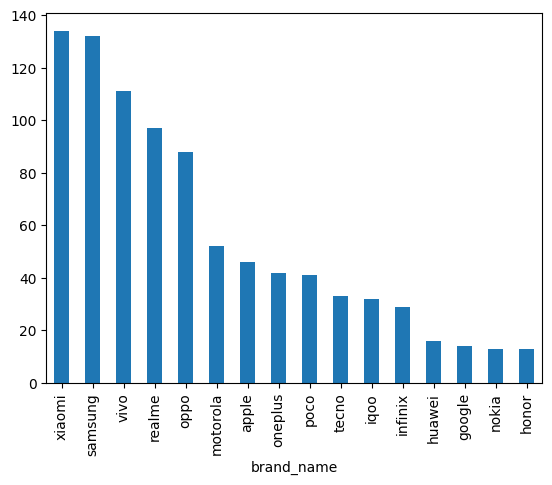

In [18]:
# 0.
# Univariate Analysis
# plot a graph of top 10 brands
df['brand_name'].value_counts().plot(kind = 'bar')

In [19]:
count = 0
for i in df['brand_name'].value_counts():
    count += 1
print(count)

16


In [20]:
df['brand_name'].value_counts()

brand_name
xiaomi      134
samsung     132
vivo        111
realme       97
oppo         88
motorola     52
apple        46
oneplus      42
poco         41
tecno        33
iqoo         32
infinix      29
huawei       16
google       14
nokia        13
honor        13
Name: count, dtype: int64

<AxesSubplot: ylabel='count'>

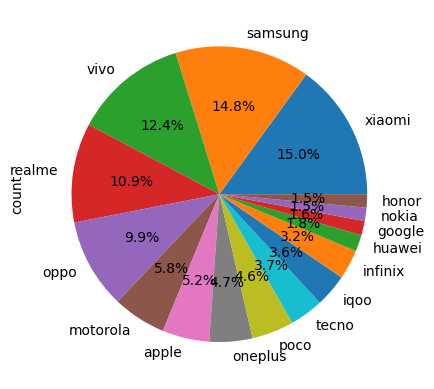

In [21]:
df['brand_name'].value_counts().plot(kind = 'pie',autopct = '%.1f%%')

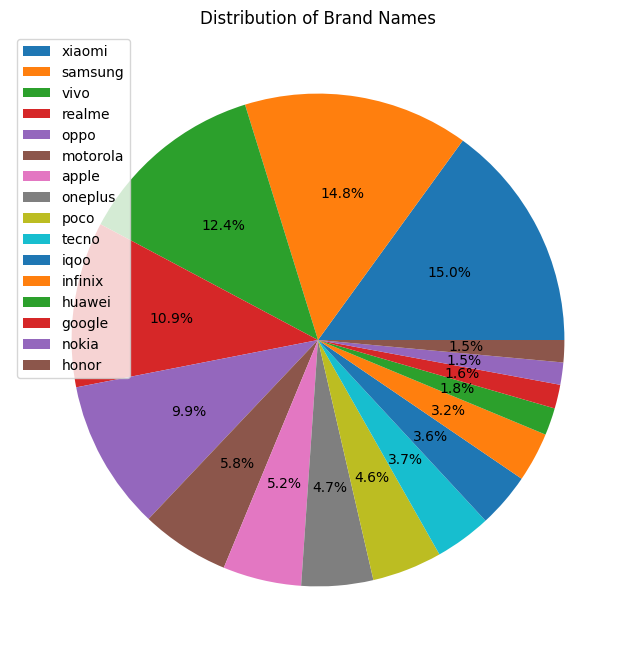

Cumulative Percentages:
brand_name
xiaomi       15.005599
samsung      29.787234
vivo         42.217245
realme       53.079507
oppo         62.933931
motorola     68.756999
apple        73.908175
oneplus      78.611422
poco         83.202688
tecno        86.898096
iqoo         90.481523
infinix      93.729003
huawei       95.520717
google       97.088466
nokia        98.544233
honor       100.000000
Name: count, dtype: float64


In [22]:
# Calculate value counts of brand_name
brand_counts = df['brand_name'].value_counts()

# Calculate percentage of each brand relative to the total count
brand_percentages = brand_counts / brand_counts.sum() * 100

# Calculate cumulative sum of percentages for each brand
cumulative_percentages = brand_percentages.cumsum()

# Plot pie chart
plt.figure(figsize=(8, 8))
brand_percentages.plot(kind='pie', autopct='%.1f%%', labels=None)
plt.title('Distribution of Brand Names')
plt.ylabel('')
plt.legend(brand_percentages.index, loc='upper left')
plt.show()

# Print cumulative percentages
print("Cumulative Percentages:")
print(cumulative_percentages)

<AxesSubplot: ylabel='count'>

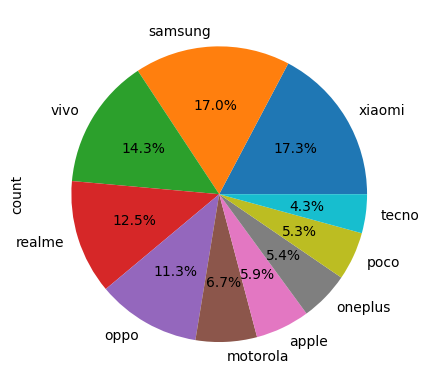

In [23]:
# 53.14% of market models is occupied by top 4 brands they are xiaomi, samsung,vivo and realme.
df['brand_name'].value_counts().head(10).plot(kind = 'pie',autopct = '%.1f%%')

In [24]:

df['brand_name'].value_counts()

brand_name
xiaomi      134
samsung     132
vivo        111
realme       97
oppo         88
motorola     52
apple        46
oneplus      42
poco         41
tecno        33
iqoo         32
infinix      29
huawei       16
google       14
nokia        13
honor        13
Name: count, dtype: int64

## Univariate Analysis Summary: Smartphone Brand Comparison

- **Analysis Objective:** Analyzing the smartphone brands with atleast 10 models.

- **Top Brand:** Xiaomi emerges as the smartphone brand with the highest number of models, totaling 134 models.

- **Market Share:** Xiaomi's 133 models represent approximately 15.0% of the total models.

- **Runner-Up:** Samsung follows closely behind Xiaomi, with a total of 132 models.

- **Market Share Comparison:** Samsung's 132 models account for about 14.8% of the share.
    In total, the top 4 brands, namely Xiaomi, Samsung, Vivo, and Realme, occupy approximately 53.14% of the market models.

In [25]:
df['brand_name'].isnull().sum()

0

In [26]:
df['brand_name'].value_counts().head(10)

brand_name
xiaomi      134
samsung     132
vivo        111
realme       97
oppo         88
motorola     52
apple        46
oneplus      42
poco         41
tecno        33
Name: count, dtype: int64

In [27]:

# our next column is model but you can't do any analysis on this column beacause this a myth column it is not categorical 
# beacause it has many unique columns
# lets check number of unique columns in this column
# 1.
df['model'].nunique()
# there are 890 unique values the number of observations we have also 890 this means every value is unique
# so it is neither categorical nor numeric data
# obvious we can't perform much on this column, the only reason i am keeping this is beacause going forward in analysis
# like looking at outliers this might help us to see in which phone there is an issue or a problem
# so i am keeping it as a supporting column

893

In [28]:
# Univariate Analysis on Numerical Columns
# step-1 you have to generate all discriptive statistics mean,median,25%,etc,.
# in step-2 you try to understand the distribution for that you plot histogram, kde, boxplot. 
# through boxplot you will understand whether you have outliers in your data or not and try to understand the outliers
# and then you check for missing values. if you have them you will try to fill them
# these are the steps to perform on numerical column

In [29]:
# 2. 
df['price'].describe()

# as you can see in the output that the average('mean') being 30690.91 which is near to third quartile
# this is not norm by this you can understand that this column has outliers even the 'standard deviation' is high 29176.6
# the minimum value is 3499.00 which is possible
# 25% of people in market are under this price 13499.00
# 50% is median value 19999.00  which is alright as our dataset doesn't have much  phones with very less price we have 
# phone from all ranges

# you can see there is a clear difference between mean and median. it shows that our distribution is a skewed one
# 75% of phones are under 34990.00
# max value is too high 199990.00 clearly this means there are outliers in the data.

count       893.000000
mean      31701.892497
std       34294.479169
min        3499.000000
25%       13499.000000
50%       19999.000000
75%       34999.000000
max      480000.000000
Name: price, dtype: float64

In [30]:
df['price'].describe()
# the average('mean') being 30690.91 which is near to third quartile
# this is not norm by this you can understand that this column has outliers even the 'standard deviation' is high 29176.6
# the minimum value is 3499.00 which is possible
# 25% of people in market are under this price 13499.00
# 50% is median value 19999.00  which is alright as our dataset doesn't have much  phones with very less price we have 
# phone from all ranges

# you can see there is a clear difference between mean and median. it shows that our distribution is a skewed one
# 75% of phones are under 34990.00
# max value is too high 199990.00 clearly this means there are outliers in the data.

count       893.000000
mean      31701.892497
std       34294.479169
min        3499.000000
25%       13499.000000
50%       19999.000000
75%       34999.000000
max      480000.000000
Name: price, dtype: float64

In [31]:
df['price'].mode()
# Mode value is 14999

0    14999
Name: price, dtype: int64

In [32]:
df['price'].value_counts()

price
14999    18
11999    17
19990    16
16999    16
17999    15
         ..
35489     1
20120     1
28994     1
48900     1
8720      1
Name: count, Length: 348, dtype: int64

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


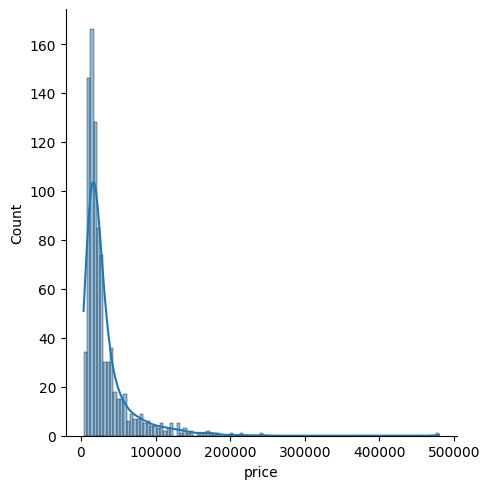

In [33]:
# let us plot histogram and kde plot together for price column
sns.displot(kind = 'hist',data = df,x = 'price',kde = True)

# as you can see in the output this is highly right skewed
# by looking at data we can understand that most of the phone are of less price and few phones are of high price.

In [34]:
# let us check the skewness
df['price'].skew()
# distribution is highly positively skewed

4.45952988829576

<AxesSubplot: >

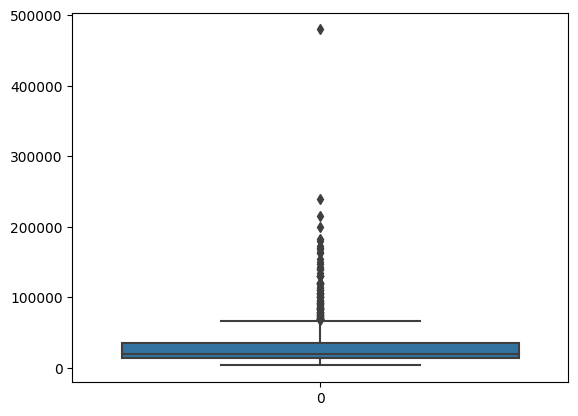

In [35]:

# let us check the outliers
sns.boxplot(df['price'])

In [36]:
df[df['price'] > 200000]

# these phones are high priced beacause of using gold and diamonds in them. their features are not of normal smartphones
# they are not priced high beacause of their phone features but beacause of something which is not at all related to phone
# features this would spoil the ml model we are gonna build. if we want to build model with this phones then we have to add 
# columns for gold and diamond but that's not what we want so lets drop this rows as these will work as outliers
# if we keep them otherwise it spoil your predictions beacause of these rows prediction will be skewed

,brand_name,model,price,rating,has_5g,has_nfc,has_ir_blaster,processor_brand,num_cores,processor_speed,...,screen_size,refresh_rate,resolution,num_rear_cameras,num_front_cameras,primary_camera_rear,primary_camera_front,extended_memory_available,extended_upto,os
478,huawei,Huawei Mate 50 RS Porsche Design,239999,81.0,False,True,True,snapdragon,8.0,3.20,...,6.74,120,1212 x 2616,3,1.0,50.0,13.0,1,256.0,Other
887,xiaomi,Xiaomi Redmi K20 Pro Signature Edition,480000,88.0,False,True,False,snapdragon,8.0,2.80,...,6.39,60,1080 x 2340,3,1.0,48.0,20.0,0,NaN,Android
951,huawei,Huawei Mate 30 RS Porsche Design,214990,NaN,True,True,True,kirin,8.0,2.86,...,6.53,60,1176 x 2400,4,2.0,40.0,32.0,1,256.0,Android


In [37]:
a = df[df['price'] > 200000]
df.drop(a.index,inplace = True)

In [38]:
df[df['price']>200000]

,brand_name,model,price,rating,has_5g,has_nfc,has_ir_blaster,processor_brand,num_cores,processor_speed,...,screen_size,refresh_rate,resolution,num_rear_cameras,num_front_cameras,primary_camera_rear,primary_camera_front,extended_memory_available,extended_upto,os


In [39]:
df[df['price'] > 150000]

,brand_name,model,price,rating,has_5g,has_nfc,has_ir_blaster,processor_brand,num_cores,processor_speed,...,screen_size,refresh_rate,resolution,num_rear_cameras,num_front_cameras,primary_camera_rear,primary_camera_front,extended_memory_available,extended_upto,os
288,apple,Apple iPhone 14 Pro Max (1TB),182999,78.0,True,True,False,bionic,6.0,NaN,...,6.70,120,1290 x 2796,3,1.0,48.0,12.0,0,NaN,iOS
319,samsung,Samsung Galaxy Z Fold 4,154998,NaN,True,True,False,snapdragon,8.0,3.20,...,7.60,120,1812 x 2176,3,2.0,50.0,10.0,0,NaN,Android
458,xiaomi,Xiaomi Mi Mix Alpha,199990,NaN,True,False,False,snapdragon,8.0,2.96,...,7.92,60,2088 x 2250,3,NaN,108.0,NaN,0,NaN,Android
704,huawei,Huawei Mate Xs 2,162990,89.0,False,True,True,snapdragon,8.0,2.84,...,7.80,120,2200 x 2480,3,1.0,50.0,10.7,1,256.0,NaN
739,apple,Apple iPhone 14 Pro Max (512GB),169900,78.0,True,True,False,bionic,6.0,NaN,...,6.70,120,1290 x 2796,3,1.0,48.0,12.0,0,NaN,iOS
756,apple,Apple iPhone 13 Pro Max (1TB),179900,86.0,True,True,False,bionic,6.0,3.22,...,6.70,120,1284 x 2778,3,1.0,12.0,12.0,0,NaN,iOS
789,apple,Apple iPhone 14 Pro (1TB),172999,77.0,True,True,False,bionic,6.0,NaN,...,6.10,120,1179 x 2556,3,1.0,48.0,12.0,0,NaN,iOS
905,samsung,Samsung Galaxy Z Fold 4 (12GB RAM + 1TB),163980,NaN,True,True,False,snapdragon,8.0,3.20,...,7.60,120,1812 x 2176,3,2.0,50.0,10.0,0,NaN,Android
954,huawei,Huawei Mate X,169000,NaN,True,True,True,kirin,8.0,2.86,...,8.00,60,2200 x 2480,4,NaN,48.0,NaN,1,256.0,NaN


In [40]:
phone = df[df['model'] == 'Huawei Mate Xs 2']
df.loc[phone.index, 'price'] = 115000

In [41]:
phone = df[df['model'] == 'Apple iPhone 14 Pro Max (512GB)']
df.loc[phone.index,'price'] = 157999

In [42]:
df['price'].skew()

2.4866259011176255

In [43]:
df['price'].describe()

count       890.000000
mean      30690.910112
std       29176.597907
min        3499.000000
25%       13499.000000
50%       19990.000000
75%       34990.000000
max      199990.000000
Name: price, dtype: float64

<AxesSubplot: >

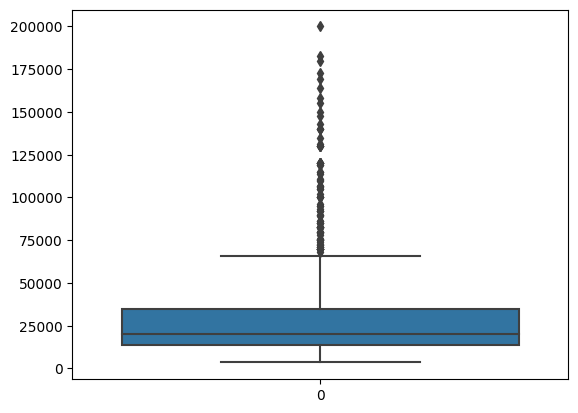

In [44]:
sns.boxplot(df['price'])

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


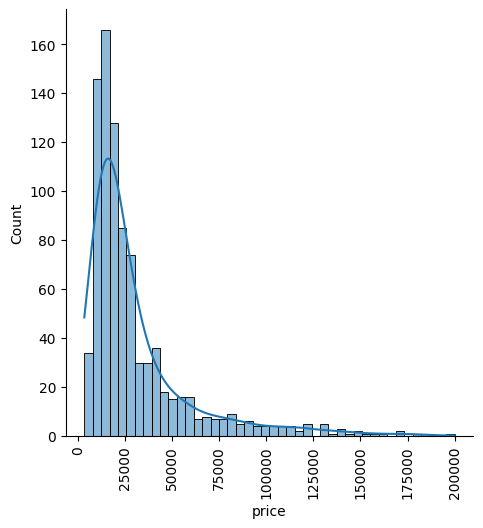

In [45]:
sns.displot(kind = 'hist',data = df,x = 'price',kde = True)
plt.xticks(rotation = 'vertical');

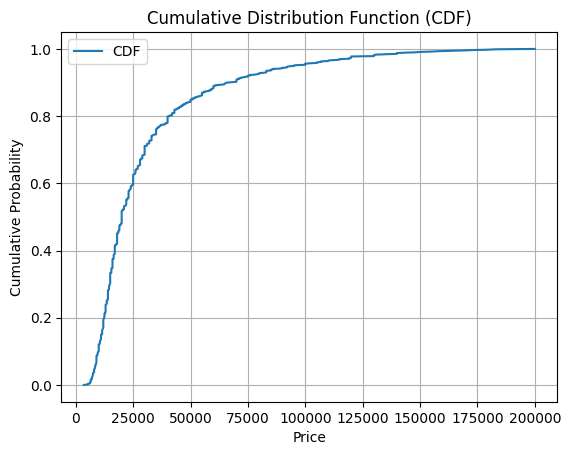

In [46]:
# Assuming df['price'] contains your data
data = df['price']

# Sort the data
sorted_data = np.sort(data)

# Calculate the cumulative probabilities
cdf = np.linspace(0, 1, len(sorted_data))

# Plot the CDF
plt.plot(sorted_data, cdf, label='CDF')

# Add labels and title
plt.xlabel('Price')
plt.ylabel('Cumulative Probability')
plt.title('Cumulative Distribution Function (CDF)')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

In [47]:
df.groupby('brand_name')['price'].describe().sort_values(by = 'min', ascending = False)

,count,mean,std,min,25%,50%,75%,max
brand_name,,,,,,,,
apple,46.0,95707.804348,42969.428879,29990.0,57749.00,84994.5,129990.0,182999.0
google,14.0,44332.571429,22096.844104,15990.0,30749.00,38240.0,54222.5,81999.0
oneplus,42.0,35858.571429,16852.940132,14999.0,22246.75,29994.5,44999.0,74999.0
iqoo,32.0,30301.875000,14613.594854,13989.0,18373.25,26499.0,35240.0,64999.0
huawei,14.0,55704.071429,46607.610365,10949.0,22240.00,29990.0,79740.0,169000.0
honor,13.0,30301.846154,23204.339145,9999.0,14990.00,24990.0,32990.0,94990.0
oppo,88.0,29650.034091,23836.399272,8999.0,15367.25,20494.5,32243.0,134999.0
motorola,52.0,24099.923077,15207.864129,7990.0,12749.00,19744.5,32740.0,59999.0
vivo,111.0,26782.387387,23067.105535,7499.0,13244.00,19990.0,29990.0,119990.0


In [48]:
df['price'].isnull().sum()

0

**Mean:** The mean price decreased from 31701.89 to 30690.91. This suggests that the average price of the items decreased after removing outliers and correcting the column.

**Standard Deviation:** The standard deviation decreased from 34294.48 to 29176.59. This indicates that the dispersion or variability of prices around the mean decreased after the adjustments.

**Median:** The median price remained relatively stable, changing from 19999.00 to 19999.00. The median represents the middle value of the dataset and is less affected by outliers compared to the mean.

**Third Quartile (Q3):** The third quartile hasn`t changed from 34999.00 to 34999.00.

**Maximum Price:** The maximum price decreased from 480000.00 to 199990.00. This indicates that the most extreme outlier(s) were removed from the dataset or corrected.

**Skewness:** The skewness decreased from 4.46 to 2.49. This suggests that the distribution became less skewed after removing outliers and correcting the column, although it still remains positively skewed.

**Kurtosis:** The kurtosis value is 7.03, this distribution is leptokurtic with higher concentration of values around the mean with more extreme values in the tails compared to a normal distribution.
    
Overall, these changes indicate that the adjustments made to the dataset had a significant impact on the summary statistics, resulting in a more balanced and representative distribution of prices.

    **Mean:** The mean price decreased, indicating that the average price of items decreased after the adjustments.

    **Standard Deviation:** The standard deviation decreased, suggesting that the variability of prices around the mean 
        decreased after the adjustments.

    **Median:** The median remained stable, indicating that the middle value of the dataset didn't change significantly.

    **Third Quartile (Q3):** The third quartile remained unchanged, reflecting consistency in the upper range of prices.

    **Maximum Price:** The maximum price decreased, indicating the removal or correction of extreme outliers.

    **Skewness:** The skewness decreased, suggesting that the distribution became less skewed, although it still remains 
        positively skewed.

    **Kurtosis:** The distribution remains leptokurtic, indicating higher concentration of values around the mean with more 
        extreme values in the tails compared to a normal distribution.

In [49]:
df['price'].kurtosis()
# kurtosis value of 6.2352058853049215, the distribution is leptokurtic, indicating that it has a sharper peak and longer 
# tails than a normal distribution. This suggests that there may be a higher concentration of values around the mean with more 
# extreme values in the tails compared to a normal distribution.

7.03164757086952

# Price Analysis Summary

- **Distribution:** Highly positively right skewed distribution with a skewness value of 2.49.
- **Kurtosis:** Leptokurtic curve with a kurtosis value of 7.03 with higher concentration of values around the mean with more extreme values in the tails compared to a normal distribution.
- **Outliers:** After analyzing and cleaning, the remaining outliers are genuine outlier values as they the phones price is real but not a type mistake.
- **Average Median Price:** The median price for smartphones is 19990.00.
- **Mean Price:** The mean price of smartphones is 30690.91.
- **Minimum Price:** The minimum price of a smartphone is 3499.00.
- **Maximum Price:** The maximum price of a smartphone is 199990.00.
- **Percentiles:**
  - 25% of smartphones are under 13499.00.
  - 75% of smartphones are under 34990.00.
- **Standard Deviation:** The standard deviation is 29176.59.
- **Price Range:** All smartphones fall within the price range of 3499.00 and 199990.00.
- **Interquartile Range (IQR):** The interquartile range is between 13499.00 and 34990.00.

In [50]:
# 3.
# rating
df['rating'].describe()
# mean looks normal, standard deviation is also less which is a good sign including quartiles and max it looks quite balanced

count    814.000000
mean      78.224816
std        7.149249
min       60.000000
25%       74.000000
50%       79.000000
75%       84.000000
max       89.000000
Name: rating, dtype: float64

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


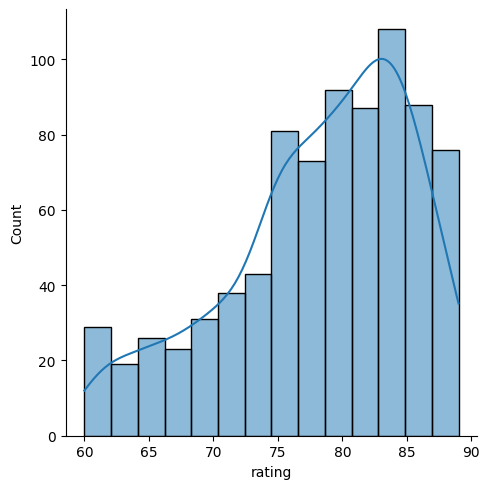

In [51]:
sns.displot(kind = 'hist',data = df,x = 'rating',kde = True)
# it looks like a normal curve but slightly tilted towards right side it looks near to normal

In [52]:
df['rating'].value_counts()
# slightly left skewed distribution with -0.68
# A slightly left-skewed distribution with a skewness of -0.68 means that the distribution of ratings is asymmetrical, with 
# a longer tail on the left side and more data points concentrated on the right side. In this context, since the minimum
# rating is at 60 and the maximum is around 90, with total ratings ranging between 1 and 100, it indicates that there are 
# more ratings clustered towards the higher end of the scale (closer to 90) and fewer ratings towards the lower 
# end (closer to 60). However, it's not a strong skewness, just a slight deviation from a perfectly symmetrical distribution.

rating
82.0    55
83.0    54
84.0    54
75.0    52
80.0    47
85.0    47
79.0    45
86.0    41
77.0    38
78.0    35
81.0    32
89.0    29
74.0    29
76.0    29
87.0    27
71.0    21
88.0    20
69.0    18
72.0    17
73.0    14
66.0    13
65.0    13
70.0    13
68.0    12
61.0    12
67.0    11
62.0    10
63.0    10
64.0     9
60.0     7
Name: count, dtype: int64

<AxesSubplot: xlabel='rating'>

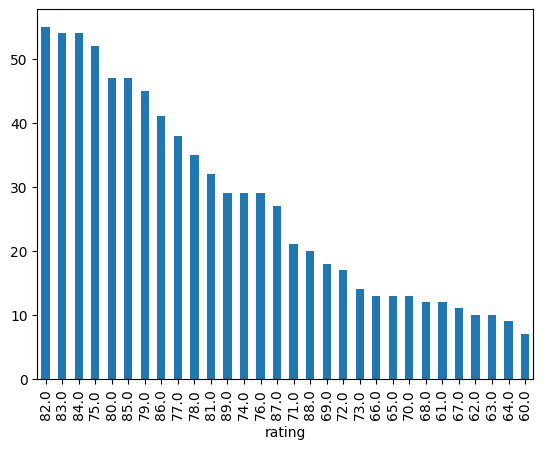

In [53]:
df['rating'].value_counts().plot(kind = 'bar')

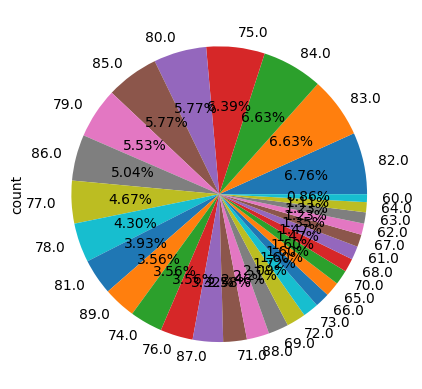

In [54]:
df['rating'].value_counts().plot(kind = 'pie', autopct = "%.2f%%");

In [55]:
df['rating'].skew()
# as you see in the output the value is closer to '0' so it is a near to normal distribution

-0.6823244461107115

<AxesSubplot: >

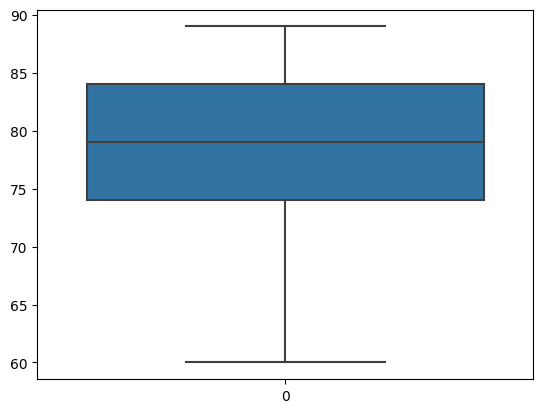

In [56]:
sns.boxplot(df['rating'])
# as you can see in the output there are no outliers

In [57]:
df['rating'].isnull().sum()

76

In [58]:
# let us look at missing values in percentage
# missing values/total values
df['rating'].isnull().sum()/df['rating'].count()
# as you can see output there are 9% of missing values

0.09336609336609336

In [59]:
df['rating'].count()

814

    **Distribution Characteristics:**
        - The distribution of ratings is slightly left-skewed with a skewness coefficient of -0.68. This indicates a longer 
          tail on the left side relative to the right side.
        - No outliers are observed in the distribution.

    **Percentage of Ratings in a Range:**
        - Approximately 40.54% of ratings fall within the range of 80 to 86.

    **Percentage of Smartphones from Chinese Brands:**
        - Among smartphones with ratings between 80 to 86, approximately 75% belong to Chinese brands or are associated 
          with China.

In [60]:
df[(df['rating'] >= 80) & (df['rating'] <= 86)].shape[0]/df['rating'].count() * 100
# 40.54% of smarphones fall in between 80 to 86

40.54054054054054

In [61]:
df['rating'].count()

814

In [62]:
df[(df['rating'] >= 80) & (df['rating'] <= 86)]['brand_name'].value_counts()
# samsung,apple,google,nokia except these remaining all are either chinese brands are related to china

brand_name
xiaomi      53
vivo        41
realme      38
oppo        36
samsung     34
oneplus     23
iqoo        21
poco        20
motorola    19
apple       15
huawei       7
tecno        6
infinix      6
honor        4
google       4
nokia        3
Name: count, dtype: int64

In [63]:
# 75.0% smartphones belongs to chinese brands or associated with china in between the rating range of 80 to 86
count = 0
for i in df[(df['rating'] >= 80) & (df['rating'] <= 86)]['brand_name'].value_counts():
    count += 1
(1-(4/count)) * 100

75.0

In [64]:
# slightly left skewed distribution with -0.68
# 40.54% of smarphones fall in between 80 to 86
# 75.0% smartphones belongs to chinese brands or associated with china in between the rating range of 80 to 86

    **Distribution:** The distribution of smartphone ratings exhibits a slightly left-skewed pattern, with a skewness value
                        of -0.68. This indicates that the majority of ratings are concentrated towards the higher end of the 
                        scale, but there is a tail towards lower ratings.

    **Percentage within Range:** Approximately 40.54% of smartphones fall within the rating range of 80 to 86. This range 
                        captures a significant portion of the dataset, indicating the prevalence of ratings within this 
                        interval

    **Brand Associations:** Within the rating range of 80 to 86, around 75.0% of smartphones are associated with Chinese 
                        brands or have some affiliation with China. This suggests a notable presence of Chinese brands 
                        within the dataset, particularly among smartphones with ratings in the specified range.

In [65]:
# 4.
# has_5g categorical column
df['has_5g'].value_counts()

has_5g
True     506
False    384
Name: count, dtype: int64

<AxesSubplot: xlabel='has_5g'>

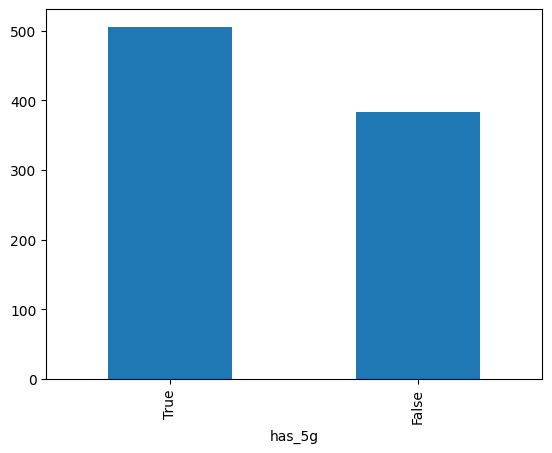

In [66]:
df['has_5g'].value_counts().plot(kind = 'bar')

<AxesSubplot: ylabel='count'>

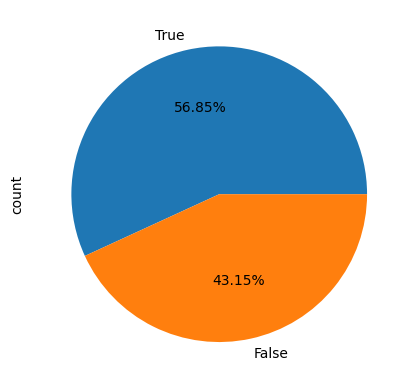

In [67]:
df['has_5g'].value_counts().plot(kind = 'pie',autopct = '%.2f%%')

In [68]:
# has_5g
#     56.85% of smartphones have 5g

<AxesSubplot: xlabel='has_nfc'>

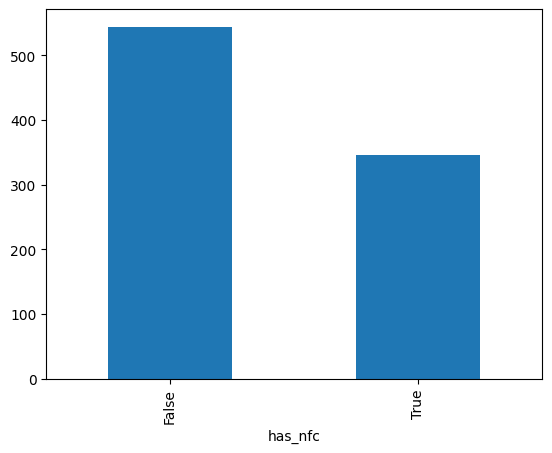

In [69]:
# 5.
# has_nfc
df['has_nfc'].value_counts().plot(kind = 'bar')

<AxesSubplot: ylabel='count'>

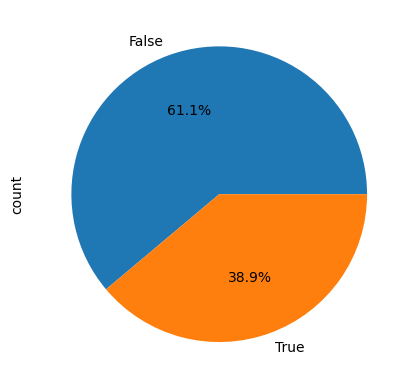

In [70]:
# has_nfc
df['has_nfc'].value_counts().plot(kind = 'pie',autopct = '%.1f%%')

In [71]:
# has_nfc
#     61.1% of smartphones don`t have_nfc

In [72]:
# 6.
# Univariate Analysis
df['has_ir_blaster'].value_counts()
# 17.6% of smartphone models are with ir_blaster feature

has_ir_blaster
False    735
True     155
Name: count, dtype: int64

<AxesSubplot: ylabel='count'>

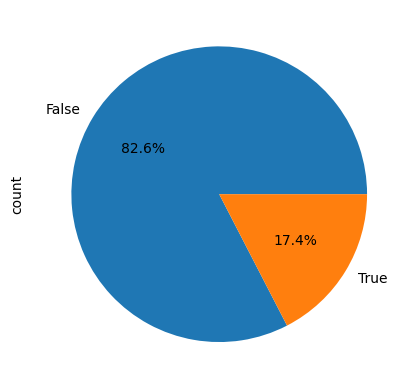

In [73]:
df['has_ir_blaster'].value_counts().plot(kind = 'pie',autopct = '%.1f%%')
# has_ir_blaster
#     83.9% phones don`t have ir blaster

<AxesSubplot: xlabel='has_ir_blaster'>

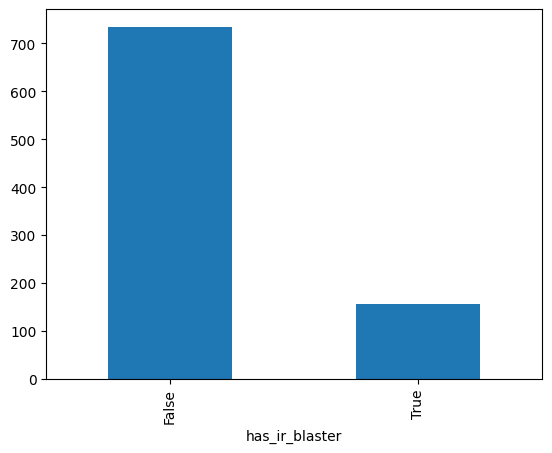

In [74]:
df['has_ir_blaster'].value_counts().plot(kind = 'bar')

In [75]:
# 7.
# processor_brand
df['processor_brand'].value_counts()

processor_brand
snapdragon    365
helio         188
dimensity     171
exynos         49
bionic         39
unisoc         20
tiger          18
google          9
kirin           6
a13             5
qualcomm        2
apple           1
fusion          1
spreadtrum      1
mediatek        1
samsung         1
Name: count, dtype: int64

<AxesSubplot: xlabel='processor_brand'>

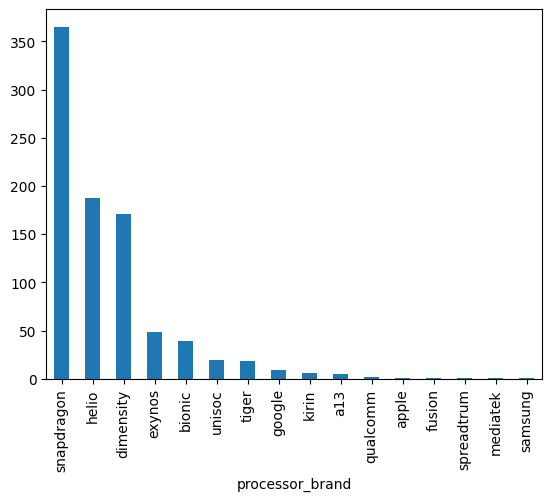

In [76]:
df['processor_brand'].value_counts().plot(kind = 'bar')

<AxesSubplot: ylabel='count'>

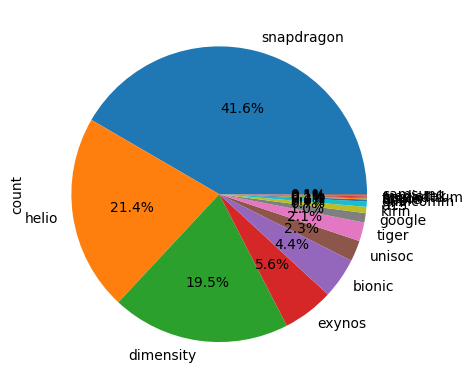

In [77]:
df['processor_brand'].value_counts().plot(kind = 'pie',autopct = '%.1f%%')
# 82.5% of models are equipped with any of these three models highest 41.6% of smartphone models are equipped with
# 'snapdragon' processors. Followed by 'helio' which are equipped in 21.4% of models. Followed by 'dimensity'
# processors with 19.5%.

In [78]:
# 8.
# num_cores
df['num_cores'].value_counts()

num_cores
8.0    829
6.0     39
4.0     16
Name: count, dtype: int64

<AxesSubplot: xlabel='num_cores'>

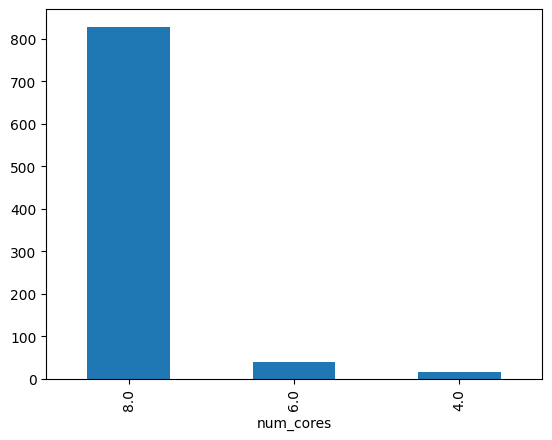

In [79]:
df['num_cores'].value_counts().plot(kind = 'bar')

<AxesSubplot: ylabel='count'>

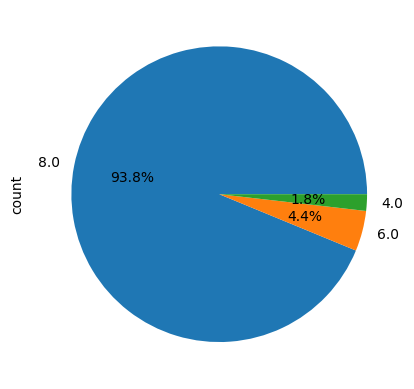

In [80]:
df['num_cores'].value_counts().plot(kind = 'pie',autopct = '%.1f%%')
# this column can't contribute much to ml model.let us say 100% of values are octacore will there be any value by keeping this 
# cloumn can this contribute to anything in the analysis. if every phone is same then there is no differentiating factor 
# which will change price as here 92% values are same it can't contribute much to the model
# 'Hexa-core' is only present in iOS models. 95.12% of apple models are equipped with 'Hexa-core' apple brands price range
# is premium beacause of which num_cores have it's importance in price prediction so it is usefull for model.

In [81]:
df[df['num_cores'] == 4]['os'].value_counts()

os
Android    15
iOS         1
Name: count, dtype: int64

In [82]:
df[df['os'] == 'iOS']['num_cores'].value_counts()

num_cores
6.0    39
8.0     1
4.0     1
Name: count, dtype: int64

In [83]:

# num_core
#     92.3% of phones feature octa-core technology
#     Given that nearly all phones have octa-core processors, this feature may not significantly 
#     contribute to predicting phone prices.

In [84]:
df[df['num_cores'] == 6.0]['os'].value_counts()

os
iOS    39
Name: count, dtype: int64

In [85]:
df[df['os'] == 'iOS']['num_cores'].value_counts()

num_cores
6.0    39
8.0     1
4.0     1
Name: count, dtype: int64

In [86]:
# 9.
# processor_speed
df['processor_speed'].describe()

count    850.000000
mean       2.440953
std        0.440284
min        1.200000
25%        2.200000
50%        2.355000
75%        2.840000
max        3.220000
Name: processor_speed, dtype: float64

- nearly normally distributed with 0.36 skewness
- top 6 highly used processor speeds in market are listed below which occupies 70.35% of the smartphones market

    processor_speed  ->   frequency distribution
            2.00     ->        134
            2.20     ->        131
            2.40     ->        123
            2.30     ->         82
            3.20     ->         81
            3.00     ->         47

<AxesSubplot: ylabel='count'>

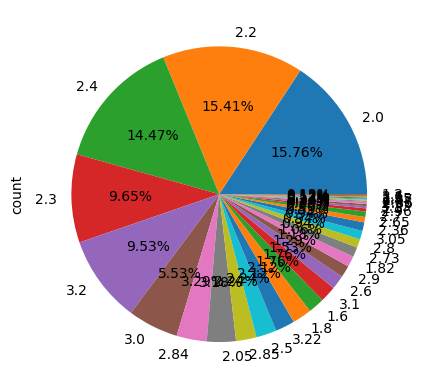

In [87]:
df['processor_speed'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')

In [88]:
df['processor_speed'].value_counts()

processor_speed
2.00    134
2.20    131
2.40    123
2.30     82
3.20     81
3.00     47
2.84     28
2.05     27
2.85     19
2.50     19
3.22     18
1.80     18
1.60     15
3.10     15
2.60     13
2.90     11
1.82     10
2.73      9
2.80      8
3.05      8
2.36      8
2.65      5
2.70      5
2.96      3
1.30      2
3.13      2
2.86      2
2.35      1
1.40      1
2.37      1
1.95      1
1.50      1
2.10      1
1.20      1
Name: count, dtype: int64

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


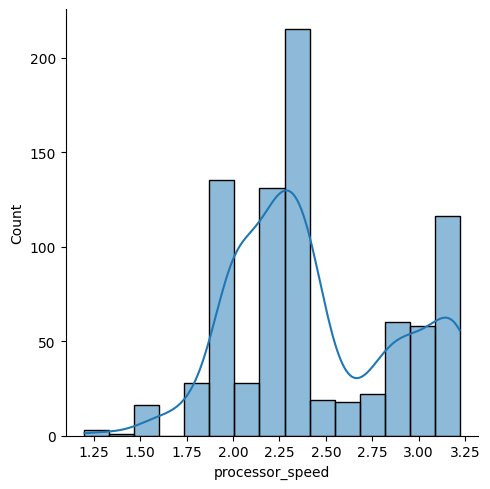

In [89]:
sns.displot(kind = 'hist',data = df ,x = 'processor_speed',kde = True)

In [90]:
df['processor_speed'].skew()

0.36179478782257735

<AxesSubplot: >

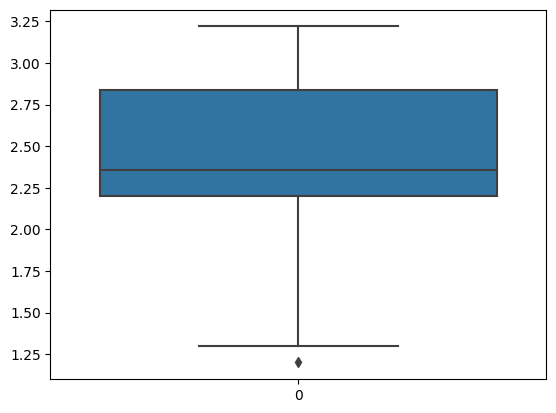

In [91]:
sns.boxplot(df['processor_speed'])

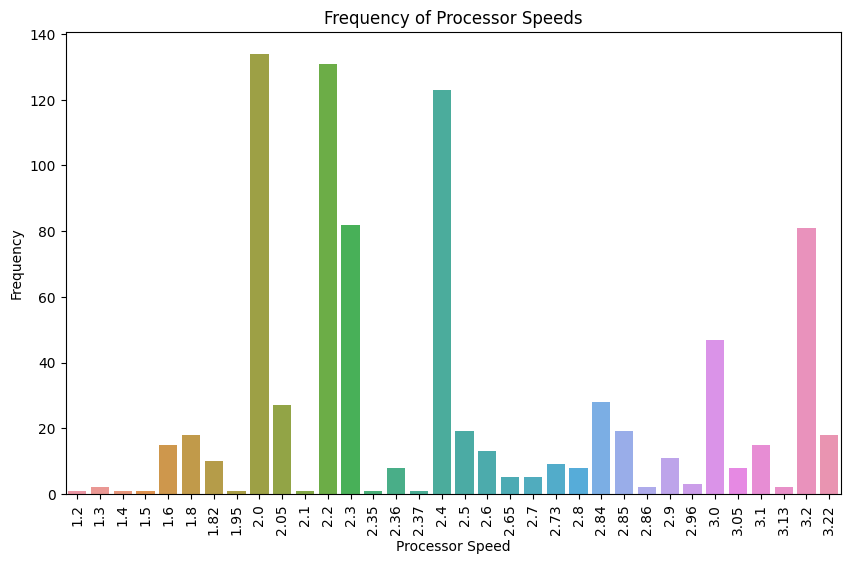

In [92]:
plt.figure(figsize = (10,6))
sns.barplot(x = df['processor_speed'].value_counts().index, y = df['processor_speed'].value_counts())
plt.xlabel('Processor Speed')
plt.ylabel('Frequency')
plt.title('Frequency of Processor Speeds')
plt.xticks(rotation = 'vertical')
plt.show()

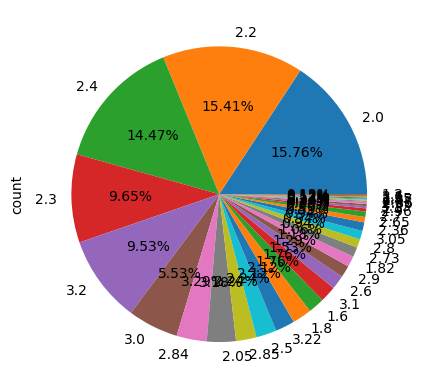

In [93]:
df['processor_speed'].value_counts().plot(kind = 'pie', autopct = '%.2f%%');
# 64.82% of models are from top 5 categories. category of models with 2.0 processor_speed is highest with 15.76%. Followed by
# 2.2 processor_speed which adds upto 15.41%. Followed by 2.4 processor_speed which is 14.47%. the fourth place is for 2.3 
# processor_speed with 9.65. The fifth place is for 3.2 processor_speed with 9.53%.

In [94]:
((df[(df['processor_speed'] >=2.0) & (df['processor_speed'] <= 3.2)].shape[0])/(df['processor_speed'].shape[0])) * 100

87.97752808988764

In [95]:
df['processor_speed'].isnull().sum()

40

In [96]:
np.isfinite(df['processor_speed']).sum()

850

In [97]:
df['model'].info()

<class 'pandas.core.series.Series'>
Index: 890 entries, 0 to 979
Series name: model
Non-Null Count  Dtype 
--------------  ----- 
890 non-null    object
dtypes: object(1)
memory usage: 46.2+ KB


In [98]:
# 10.
# ram_capacity
df['ram_capacity'].value_counts()

ram_capacity
8     315
6     224
4     201
12     73
3      45
2      24
16      5
1       3
Name: count, dtype: int64

<AxesSubplot: xlabel='ram_capacity'>

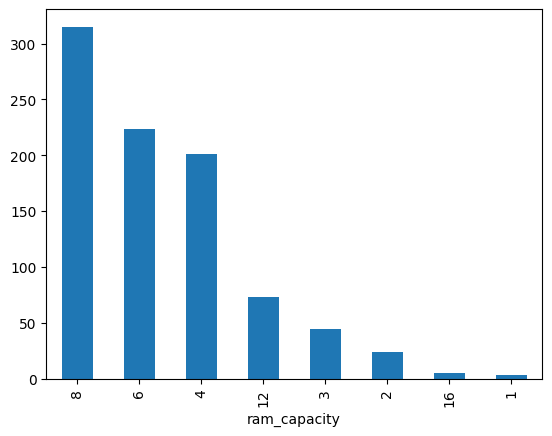

In [99]:
df['ram_capacity'].value_counts().plot(kind ='bar')

<AxesSubplot: ylabel='count'>

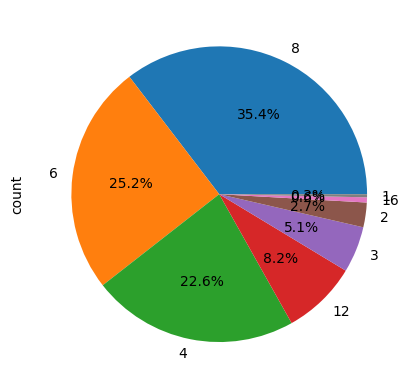

In [100]:
df['ram_capacity'].value_counts().plot(kind = 'pie',autopct = '%.1f%%')

**RAM Capacity Distribution:**

    - The top RAM capacities, including 8GB, 6GB, and 4GB, contribute to 83.2% of the population.
    - This suggests that the majority of smartphones fall into these three categories in terms of RAM capacity.

**Percentage Distribution:**

    - Approximately 35.4% of smartphones have 8GB of RAM, making it the most common RAM capacity.
    - Following 8GB RAM, 25.2% of smartphones are equipped with 6GB of RAM.
    - In the third position, approximately 22.6% of smartphones have 4GB of RAM.

In [101]:
# 11.
# internal_memory
df['internal_memory'].value_counts()

internal_memory
128     495
64      178
256     141
32       49
512      14
16        8
1024      5
Name: count, dtype: int64

<AxesSubplot: xlabel='internal_memory'>

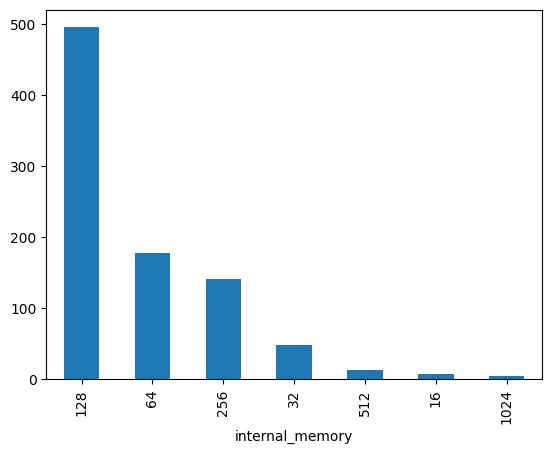

In [102]:
df['internal_memory'].value_counts().plot(kind = 'bar')

<AxesSubplot: ylabel='count'>

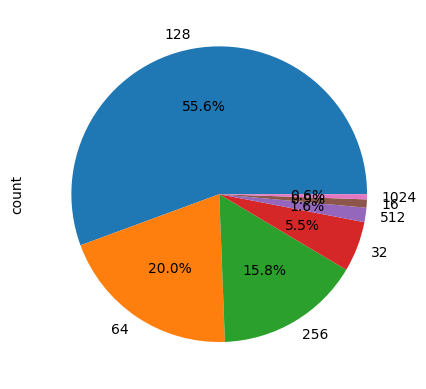

In [103]:
df['internal_memory'].value_counts().plot(kind = 'pie',autopct = '%.1f%%')

    **Internal Memory Capacity Distribution:**
        - The top three internal memory capacities, including 128GB, 64GB, and 256GB, contribute to 91.4% of the dataset.
        - This indicates that the majority of smartphones in the dataset offer one of these three storage capacities.

    **Percentage Distribution:**
        - Approximately 55.6% of smartphones have 128GB of internal memory, making it the most prevalent storage capacity.
        - Following 128GB, 20.0% of smartphones offer 64GB of internal memory.
        - In the third position, approximately 15.8% of smartphones provide 256GB of internal memory.

<AxesSubplot: ylabel='count'>

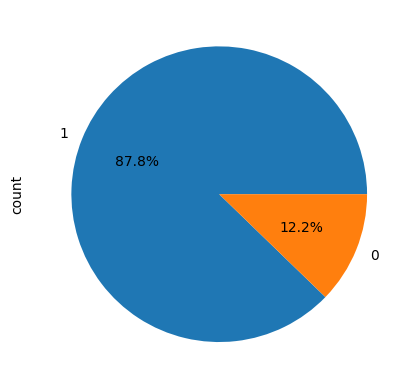

In [104]:
# 12.
# fast_charging_available
df['fast_charging_available'].value_counts().plot(kind = 'pie',autopct = '%.1f%%')

In [105]:
# fast_charging_available
#     87.8% phones have fast charging available.

In [106]:
df['fast_charging_available'].value_counts()

fast_charging_available
1    781
0    109
Name: count, dtype: int64

In [107]:
df[df['fast_charging_available'] == 0]['brand_name'].value_counts()

brand_name
vivo        18
realme      17
apple       14
oppo        13
xiaomi      11
tecno       11
samsung     10
infinix      5
poco         3
motorola     2
nokia        2
oneplus      1
honor        1
huawei       1
Name: count, dtype: int64

In [108]:
# 13.
# fast_charging
df['fast_charging'].describe()
# 19.9% of whole dataset has 33W charging capability

count    720.000000
mean      45.851389
std       34.218863
min       10.000000
25%       18.000000
50%       33.000000
75%       66.000000
max      240.000000
Name: fast_charging, dtype: float64

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


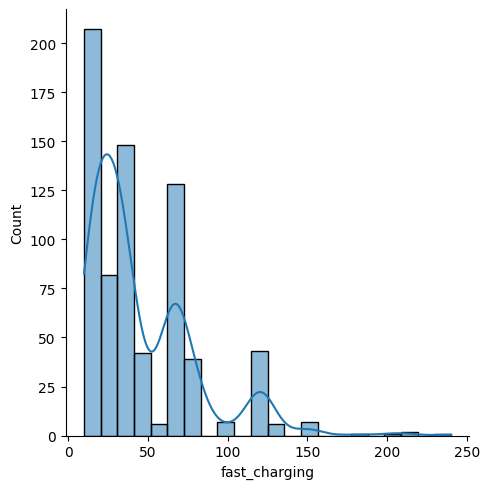

In [109]:
sns.displot(kind = 'hist',data = df,x = 'fast_charging',kde = True);
# this curve have a multimodeal distribution with 3 peaks

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_10312\2945853589.py:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df['fast_charging'], shade=True)
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


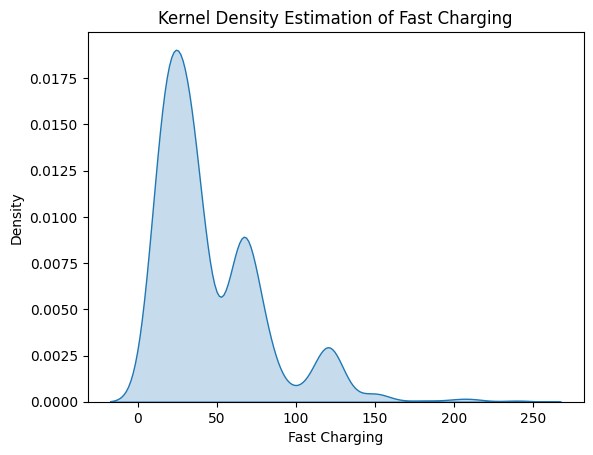

In [110]:
# Plot kernel density estimation of 'fast_charging'
sns.kdeplot(df['fast_charging'], shade=True)
plt.xlabel('Fast Charging')
plt.ylabel('Density')
plt.title('Kernel Density Estimation of Fast Charging')
plt.show()

In [111]:
df['fast_charging'].skew()

1.6720532291041392

<AxesSubplot: >

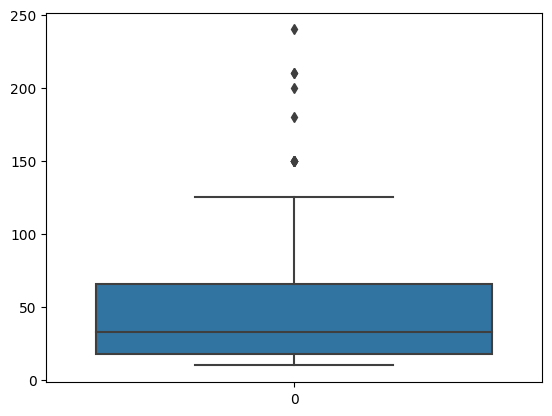

In [112]:
sns.boxplot(df['fast_charging'])
# we have outliers on the right side of the distribution

<AxesSubplot: ylabel='count'>

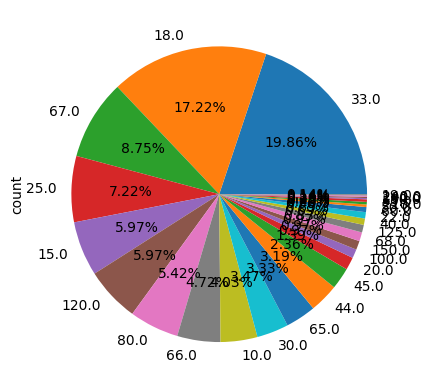

In [113]:
df['fast_charging'].value_counts().plot(kind = 'pie',autopct = '%.2f%%')
# models with fasting charging capacity of 33W are highest followed by models with 18W which is 17.22 % both of these 
# categories add upto 37.08%.


- **Skewness:** Fast charging follows a positively skewed distribution, with a skewness value of 1.67. This indicates a
                highly right-skewed distribution, where the majority of smartphone models have lower fast charging 
                capacities, but there are some models with exceptionally high capacities.

- **Outliers:** There are outliers present on the right side of the distribution, suggesting the existence of smartphone 
                models with fast charging capacities significantly higher than the majority.

- **Median Interpretation:** Due to the positively skewed distribution, the median value of 33 watts (W) serves as a crucial 
                reference point. Approximately 50% of smartphone models have fast charging capacities below 33W, while the 
                remaining 50% have capacities above this value.

- **Frequency:** models with fasting charging capacity of 33W with 19.86% are highest followed by models with 18W which
                is 17.22 % both of these categories add upto 37.08%.

In [114]:
# 14.
# battery capacity
df['battery_capacity'].describe()

count     879.000000
mean     4803.143345
std       594.537940
min      1821.000000
25%      4500.000000
50%      5000.000000
75%      5000.000000
max      7000.000000
Name: battery_capacity, dtype: float64

battery_capacity
    distribution is negatively skewed with -0.65. 
    Although it contains many values that appear to be outliers on both ends, upon closer inspection, they are genuine.
    Due to the influence of outliers on the mean, we opt for the median as the measure of average, which is 5000mAh for 
    battery capacity.
    exactly 51.76% of smartphone models have 5000 mAh battery capacity.

**reframed**
The distribution of battery capacities exhibits a negative skew, with a skewness coefficient of -0.65. While numerous 
values may initially appear as outliers at both ends, further scrutiny reveals their authenticity. Given the susceptibility
of outliers to skew the mean, we choose the median as the central tendency measure, which stands at 5000mAh for battery 
capacity. Remarkably, precisely 51.76% of smartphone models boast a 5000 mAh battery capacity.

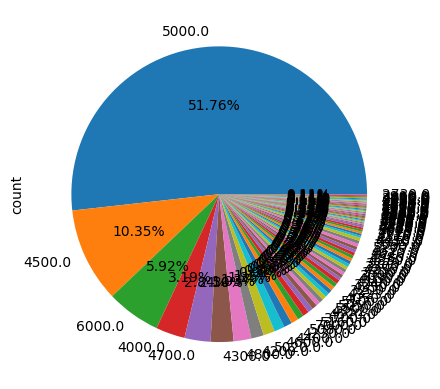

In [115]:
df['battery_capacity'].value_counts().plot(kind = 'pie', autopct = '%.2f%%');

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


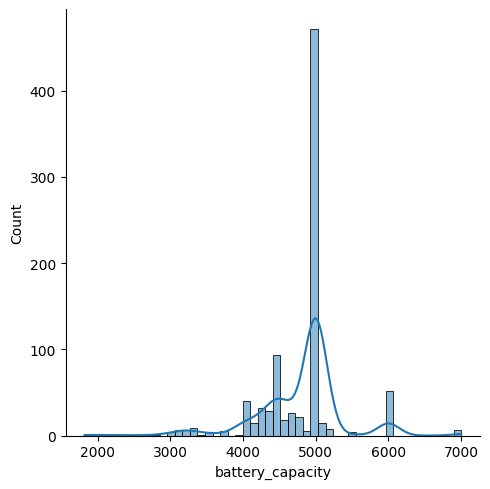

In [116]:
sns.displot(kind = 'hist',data = df,x = 'battery_capacity',kde = True)

In [117]:
df['battery_capacity'].skew()
# distribution is negatively skewed with -0.67. 

-0.6747102646162833

<AxesSubplot: >

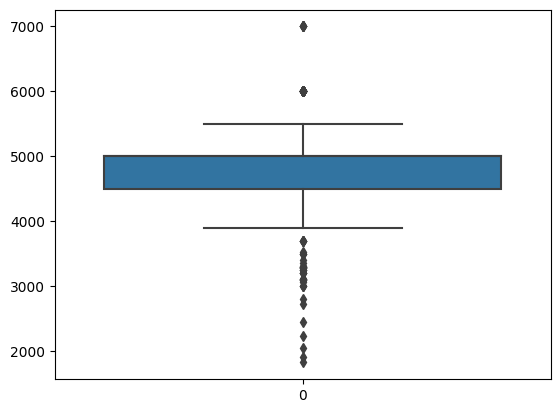

In [118]:
sns.boxplot(df['battery_capacity'])

In [119]:
df[df['battery_capacity'] > 12500]

,brand_name,model,price,rating,has_5g,has_nfc,has_ir_blaster,processor_brand,num_cores,processor_speed,...,screen_size,refresh_rate,resolution,num_rear_cameras,num_front_cameras,primary_camera_rear,primary_camera_front,extended_memory_available,extended_upto,os


In [120]:
df[df['model'] == 'Oukitel WP19']['battery_capacity']
# this is an original value i confirmed it
# upper: Oukitel WP19, Doogee V Max, 
# lower: Apple iPhone 14, Apple iPhone 13, Apple iPhone 11, Apple iPhone 11 (128GB), Jio Phone 3,
#        Apple iPhone 9, Duoqin F22 Pro, Apple iPhone 14 (256GB), Apple iPhone XR2, Apple iPhone 13 Mini, Samsung Galaxy Z Flip 3,
#        Apple iPhone 13 (256GB), Google Pixel 4,Apple iPhone 14 Pro (256GB), Vertu Signature Touch, Vivo Y25, Itel A24 Pro,
#        OnePlus 6 (8GB RAM + 128GB), Apple iPhone 13 Pro (256GB), Apple iPhone 7s, Apple iPhone SE 2020, Nokia C01 Plus, 
#        Vivo V11i, Apple iPhone 14 Pro (1TB), Apple iPhone 13 (512GB), Samsung Galaxy A40, Huawei Honor 9N, Itel A23 Pro,
#        Lyf Earth 2, TCL Ion X, Apple iPhone 13 Pro (1TB), Samsung Galaxy A9 Pro (2019), Samsung Galaxy A7 (2018), 
#        Vivo Y55S, itel A23s

Series([], Name: battery_capacity, dtype: float64)

In [121]:
df.loc[df['model'] == 'Apple iPhone 13 Pro', 'battery_capacity'] = 4352

In [122]:
df.loc[df['model'] == 'Jio JioPhone Next (3GB RAM + 32GB)','battery_capacity'] = 3500

In [123]:
df.loc[df['model'] == 'Apple iPhone 15','battery_capacity'] = 3367

In [124]:
df.loc[df['model']=='OPPO A73','battery_capacity'] = 4015

In [125]:
df.loc[df['model'] == 'Apple iPhone 13','battery_capacity'] = 3227

In [126]:
df[df['model'] == 'Jio Phone 3']['battery_capacity']
# this an original value i confirmed it

Series([], Name: battery_capacity, dtype: float64)

In [127]:
df[df['battery_capacity']<3500]

,brand_name,model,price,rating,has_5g,has_nfc,has_ir_blaster,processor_brand,num_cores,processor_speed,...,screen_size,refresh_rate,resolution,num_rear_cameras,num_front_cameras,primary_camera_rear,primary_camera_front,extended_memory_available,extended_upto,os
6,apple,Apple iPhone 14,65999,81.0,True,True,False,bionic,6.0,3.22,...,6.10,60,1170 x 2532,2,1.0,12.0,12.0,0,NaN,iOS
15,apple,Apple iPhone 13,62999,79.0,True,True,False,bionic,6.0,3.22,...,6.10,60,1170 x 2532,2,1.0,12.0,12.0,0,NaN,iOS
33,apple,Apple iPhone 11,38999,73.0,False,True,False,a13,6.0,2.65,...,6.10,60,828 x 1792,2,1.0,12.0,12.0,0,NaN,iOS
100,apple,Apple iPhone 14 Pro,119990,75.0,True,True,False,bionic,6.0,NaN,...,6.10,120,1179 x 2556,3,1.0,48.0,12.0,0,NaN,iOS
136,apple,Apple iPhone 11 (128GB),46999,75.0,False,True,False,a13,6.0,2.65,...,6.10,60,828 x 1792,2,1.0,12.0,12.0,0,NaN,iOS
173,apple,Apple iPhone 9,29990,61.0,False,True,False,a13,6.0,2.65,...,4.70,60,750 x 1334,1,1.0,12.0,7.0,0,NaN,iOS
246,apple,Apple iPhone 14 (256GB),75999,82.0,True,True,False,bionic,6.0,3.22,...,6.10,60,1170 x 2532,2,1.0,12.0,12.0,0,NaN,iOS
262,apple,Apple iPhone XR2,71999,60.0,False,True,False,apple,NaN,NaN,...,6.10,60,828 x 1792,2,1.0,12.0,7.0,0,NaN,iOS
275,apple,Apple iPhone 13 Mini,64900,79.0,True,True,False,bionic,6.0,3.22,...,5.40,60,1080 x 2340,2,1.0,12.0,12.0,0,NaN,iOS
304,samsung,Samsung Galaxy Z Flip 3,69999,84.0,True,True,False,snapdragon,8.0,2.84,...,6.70,120,1080 x 2640,2,1.0,12.0,10.0,0,NaN,NaN


C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


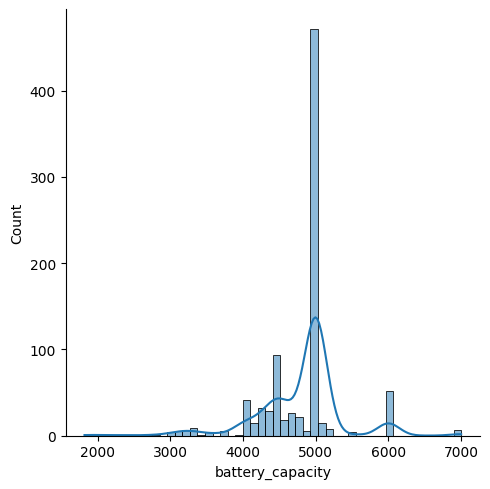

In [128]:
sns.displot(kind = 'hist',data = df,x = 'battery_capacity',kde = True)

<AxesSubplot: >

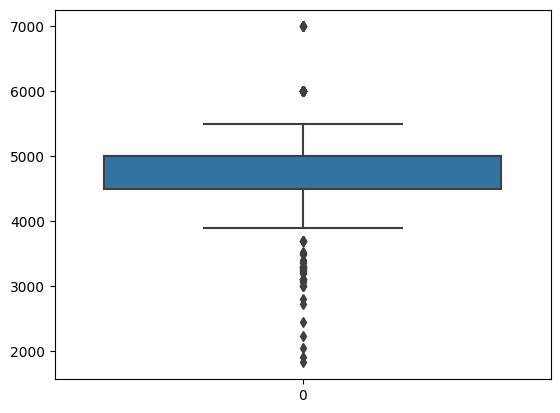

In [129]:
sns.boxplot(df['battery_capacity'])

In [129]:
df['battery_capacity'].skew()

-0.6534659735600558

In [130]:
df['battery_capacity'].describe()

count     879.000000
mean     4805.579067
std       589.854998
min      1821.000000
25%      4500.000000
50%      5000.000000
75%      5000.000000
max      7000.000000
Name: battery_capacity, dtype: float64

In [131]:
df['battery_capacity'].value_counts()

battery_capacity
5000.0    455
4500.0     91
6000.0     52
4000.0     28
4700.0     25
         ... 
4810.0      1
3900.0      1
4820.0      1
3227.0      1
2730.0      1
Name: count, Length: 76, dtype: int64

In [130]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 890 entries, 0 to 979
Data columns (total 25 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   brand_name                 890 non-null    object 
 1   model                      890 non-null    object 
 2   price                      890 non-null    int64  
 3   rating                     814 non-null    float64
 4   has_5g                     890 non-null    bool   
 5   has_nfc                    890 non-null    bool   
 6   has_ir_blaster             890 non-null    bool   
 7   processor_brand            877 non-null    object 
 8   num_cores                  884 non-null    float64
 9   processor_speed            850 non-null    float64
 10  ram_capacity               890 non-null    int64  
 11  internal_memory            890 non-null    int64  
 12  fast_charging_available    890 non-null    int64  
 13  fast_charging              720 non-null    float64
 14 

In [131]:
# 15.
# refresh_rate
df['refresh_rate'].value_counts()

refresh_rate
120    323
60     317
90     214
144     34
165      2
Name: count, dtype: int64

<AxesSubplot: xlabel='refresh_rate'>

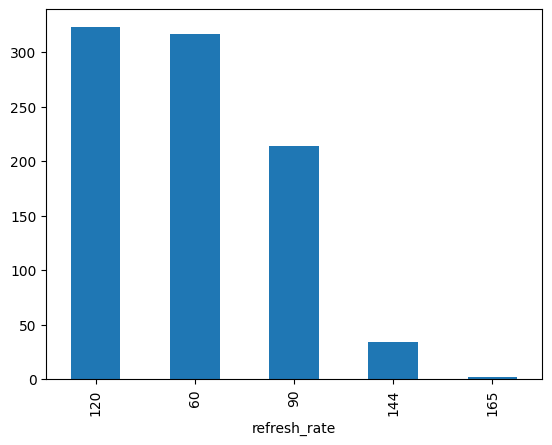

In [132]:
df['refresh_rate'].value_counts().plot(kind = 'bar')

<AxesSubplot: ylabel='count'>

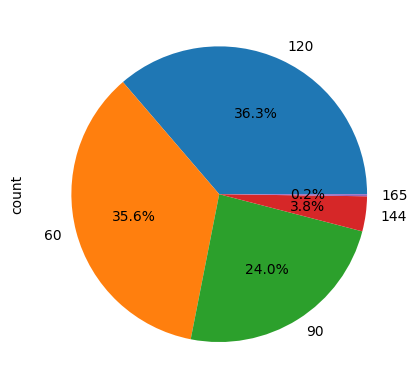

In [133]:
df['refresh_rate'].value_counts().plot(kind = 'pie',autopct = '%.1f%%')

    **Refresh Rate Distribution:**
        - The top three refresh rates, including 60Hz, 120Hz, and 90Hz, contribute to 95.9% of the dataset.
        - This suggests that the majority of smartphones in the dataset offer one of these three refresh rates.

    **Percentage Distribution:**
        - Approximately 35.6% of smartphones feature a 60Hz refresh rate, making it the most prevalent refresh rate.
        - Following 60Hz, approximately 36.3% of smartphones offer a 120Hz refresh rate.
        - In the third position, around 24.0% of smartphones feature a 90Hz refresh rate.

In [134]:
df[df['refresh_rate'] == 165]

,brand_name,model,price,rating,has_5g,has_nfc,has_ir_blaster,processor_brand,num_cores,processor_speed,...,refresh_rate,screen_size,resolution,num_rear_cameras,num_front_cameras,primary_camera_rear,primary_camera_front,extended_memory_available,extended_upto,os
182,motorola,Motorola Moto X40,39999,89.0,True,True,False,snapdragon,8.0,3.2,...,165,6.7,1080 x 2400,3,1.0,50.0,60.0,0,NaN,Android
571,motorola,Motorola Edge 40 Pro 5G,59990,89.0,True,True,False,snapdragon,8.0,3.2,...,165,6.7,1080 x 2460,3,1.0,50.0,60.0,0,NaN,Android


In [135]:
df[df['refresh_rate'] == 240]

,brand_name,model,price,rating,has_5g,has_nfc,has_ir_blaster,processor_brand,num_cores,processor_speed,...,refresh_rate,screen_size,resolution,num_rear_cameras,num_front_cameras,primary_camera_rear,primary_camera_front,extended_memory_available,extended_upto,os


In [136]:
# refresh_rate
#     I confirmed whether refresh rates of 250 and 165 are outliers, and upon examination, they were 
#     found to be within the expected range.

In [137]:
df.head()

,brand_name,model,price,rating,has_5g,has_nfc,has_ir_blaster,processor_brand,num_cores,processor_speed,...,refresh_rate,screen_size,resolution,num_rear_cameras,num_front_cameras,primary_camera_rear,primary_camera_front,extended_memory_available,extended_upto,os
0,oneplus,OnePlus 11 5G,54999,89.0,True,True,False,snapdragon,8.0,3.2,...,120,6.70,1440 x 3216,3,1.0,50.0,16.0,0,NaN,Android
1,oneplus,OnePlus Nord CE 2 Lite 5G,19989,81.0,True,False,False,snapdragon,8.0,2.2,...,120,6.59,1080 x 2412,3,1.0,64.0,16.0,1,1024.0,Android
2,samsung,Samsung Galaxy A14 5G,16499,75.0,True,False,False,exynos,8.0,2.4,...,90,6.60,1080 x 2408,3,1.0,50.0,13.0,1,1024.0,Android
3,motorola,Motorola Moto G62 5G,14999,81.0,True,False,False,snapdragon,8.0,2.2,...,120,6.55,1080 x 2400,3,1.0,50.0,16.0,1,1024.0,Android
4,realme,Realme 10 Pro Plus,24999,82.0,True,False,False,dimensity,8.0,2.6,...,120,6.70,1080 x 2412,3,1.0,108.0,16.0,0,NaN,Android


In [138]:
# 16.
# screen size
df['screen_size'].describe()

count    890.000000
mean       6.554966
std        0.296346
min        4.500000
25%        6.500000
50%        6.580000
75%        6.670000
max        8.030000
Name: screen_size, dtype: float64

In [139]:
# percentage of smartphone models with 6.5 screen_size in the dataset
round(df['screen_size'].value_counts().head(1)/df['screen_size'].shape[0] * 100,2)

screen_size
6.5    11.46
Name: count, dtype: float64

In [140]:
df['screen_size'].info()

<class 'pandas.core.series.Series'>
Index: 890 entries, 0 to 979
Series name: screen_size
Non-Null Count  Dtype  
--------------  -----  
890 non-null    float64
dtypes: float64(1)
memory usage: 46.2 KB


In [141]:
df[(df['screen_size'] >= 6.40) & (df['screen_size'] <= 6.80)]

,brand_name,model,price,rating,has_5g,has_nfc,has_ir_blaster,processor_brand,num_cores,processor_speed,...,refresh_rate,screen_size,resolution,num_rear_cameras,num_front_cameras,primary_camera_rear,primary_camera_front,extended_memory_available,extended_upto,os
0,oneplus,OnePlus 11 5G,54999,89.0,True,True,False,snapdragon,8.0,3.20,...,120,6.70,1440 x 3216,3,1.0,50.0,16.0,0,NaN,Android
1,oneplus,OnePlus Nord CE 2 Lite 5G,19989,81.0,True,False,False,snapdragon,8.0,2.20,...,120,6.59,1080 x 2412,3,1.0,64.0,16.0,1,1024.0,Android
2,samsung,Samsung Galaxy A14 5G,16499,75.0,True,False,False,exynos,8.0,2.40,...,90,6.60,1080 x 2408,3,1.0,50.0,13.0,1,1024.0,Android
3,motorola,Motorola Moto G62 5G,14999,81.0,True,False,False,snapdragon,8.0,2.20,...,120,6.55,1080 x 2400,3,1.0,50.0,16.0,1,1024.0,Android
4,realme,Realme 10 Pro Plus,24999,82.0,True,False,False,dimensity,8.0,2.60,...,120,6.70,1080 x 2412,3,1.0,108.0,16.0,0,NaN,Android
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
975,motorola,Motorola Moto Edge S30 Pro,34990,83.0,True,False,False,snapdragon,8.0,3.00,...,120,6.67,1080 x 2460,3,1.0,64.0,16.0,0,NaN,Android
976,honor,Honor X8 5G,14990,75.0,True,False,False,snapdragon,8.0,2.20,...,60,6.50,720 x 1600,3,1.0,48.0,8.0,1,1024.0,Android
977,poco,POCO X4 GT 5G (8GB RAM + 256GB),28990,85.0,True,True,True,dimensity,8.0,2.85,...,144,6.60,1080 x 2460,3,1.0,64.0,16.0,0,NaN,Android
978,motorola,Motorola Moto G91 5G,19990,80.0,True,True,False,snapdragon,8.0,2.20,...,60,6.80,1080 x 2400,3,1.0,108.0,32.0,1,1024.0,Android


<AxesSubplot: ylabel='count'>

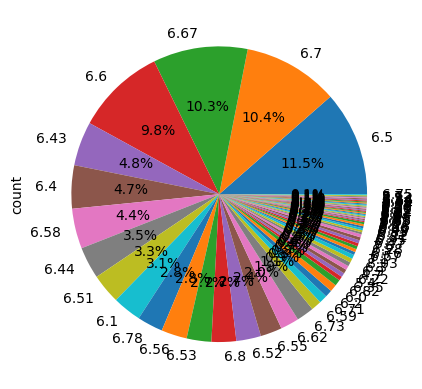

In [142]:
df['screen_size'].value_counts().plot(kind = 'pie', autopct = '%.1f%%')

In [143]:
# 86.74% of smartphones fall in between 6.4 inches to 6.8 inches
df[(df['screen_size'] >= 6.4) & (df['screen_size'] <= 6.8)].shape[0]/df['screen_size'].shape[0]

0.8674157303370786

In [144]:
df['screen_size'].value_counts()

screen_size
6.50    102
6.70     93
6.67     92
6.60     87
6.43     43
       ... 
6.14      1
4.50      1
7.92      1
5.70      1
6.75      1
Name: count, Length: 70, dtype: int64

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


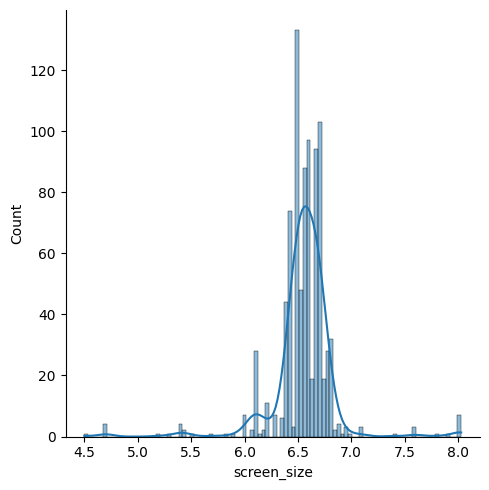

In [145]:
sns.displot(kind = 'hist',data = df,x = 'screen_size',kde = True)

In [146]:
df['screen_size'].skew()

-0.9671467366894683

   #### Peak Range and Coverage: 
        The peak range of screen sizes is observed between 6.40 to 6.80 inches, encompassing a substantial portion (86.74%) of smartphones in the dataset. This indicates that a majority of smartphones have screen sizes within this range.

   #### Most Common Screen Sizes: 
        The analysis reveals that 11.5% of smartphones have a screen size of 6.5 inches, making it the most prevalent screen size. This is followed by 6.67 inches with 10.0% prevalence, 6.7 inches with 9.5%, and 6.6 inches with 9.3%. Collectively, these top screen sizes cover 41% of the dataset.

   #### Skewness: 
        The distribution of screen sizes is negatively skewed pattern, as evidenced by a skewness value of -0.83. This indicates that the distribution is skewed towards larger screen sizes, with fewer smartphones having smaller screen sizes.

<AxesSubplot: >

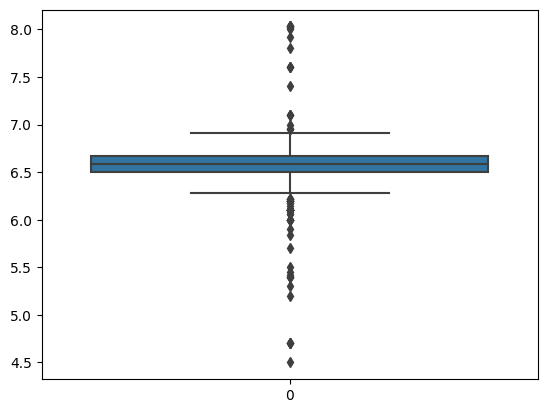

In [147]:
sns.boxplot(df['screen_size'])

In [148]:
df[df['screen_size'] < 5]

,brand_name,model,price,rating,has_5g,has_nfc,has_ir_blaster,processor_brand,num_cores,processor_speed,...,refresh_rate,screen_size,resolution,num_rear_cameras,num_front_cameras,primary_camera_rear,primary_camera_front,extended_memory_available,extended_upto,os
173,apple,Apple iPhone 9,29990,61.0,False,True,False,a13,6.0,2.65,...,60,4.7,750 x 1334,1,1.0,12.0,7.0,0,NaN,iOS
435,apple,Apple iPhone SE 3 2022,43900,NaN,True,True,False,bionic,6.0,3.22,...,60,4.7,750 x 1334,1,1.0,12.0,7.0,0,NaN,iOS
472,vivo,Vivo Y25,7499,NaN,False,False,False,helio,4.0,1.30,...,60,4.5,480 x 854,1,1.0,5.0,2.0,1,128.0,Android
595,apple,Apple iPhone 7s,52990,NaN,False,False,False,fusion,4.0,2.37,...,60,4.7,750 x 1334,1,1.0,13.0,7.0,0,NaN,iOS
638,apple,Apple iPhone SE 2020,39900,63.0,False,True,False,a13,6.0,2.65,...,60,4.7,750 x 1334,1,1.0,12.0,7.0,0,NaN,iOS


In [149]:
df.loc[df['model'] == 'Apple iPhone 9','screen_size'] = 5.2

In [150]:
df[df['screen_size'] > 7]

,brand_name,model,price,rating,has_5g,has_nfc,has_ir_blaster,processor_brand,num_cores,processor_speed,...,refresh_rate,screen_size,resolution,num_rear_cameras,num_front_cameras,primary_camera_rear,primary_camera_front,extended_memory_available,extended_upto,os
69,oppo,Oppo Find N Fold,99990,NaN,True,True,False,snapdragon,8.0,3.20,...,120,7.10,1792 x 1920,2,NaN,50.0,NaN,0,NaN,Android
98,vivo,Vivo X Fold 5G,106990,NaN,True,True,False,snapdragon,8.0,3.00,...,120,8.03,1916 x 2160,4,1.0,50.0,16.0,0,NaN,Android
158,oppo,Oppo Find N2 5G,94990,NaN,True,True,False,snapdragon,8.0,3.20,...,120,7.10,1792 x 1920,3,2.0,50.0,32.0,0,NaN,NaN
235,xiaomi,Xiaomi Mix Fold 2 5G,106990,NaN,True,True,True,snapdragon,8.0,3.20,...,120,8.02,1914 x 2160,3,1.0,50.0,20.0,0,NaN,Android
319,samsung,Samsung Galaxy Z Fold 4,154998,NaN,True,True,False,snapdragon,8.0,3.20,...,120,7.60,1812 x 2176,3,2.0,50.0,10.0,0,NaN,Android
458,xiaomi,Xiaomi Mi Mix Alpha,199990,NaN,True,False,False,snapdragon,8.0,2.96,...,60,7.92,2088 x 2250,3,NaN,108.0,NaN,0,NaN,Android
477,vivo,Vivo X Fold Plus,113990,NaN,True,True,False,snapdragon,8.0,3.20,...,120,8.03,1916 x 2160,4,2.0,50.0,16.0,0,NaN,Android
560,samsung,Samsung Galaxy Z Fold 3,110999,89.0,True,True,False,snapdragon,8.0,2.84,...,120,7.60,1768 x 2208,3,2.0,12.0,10.0,0,NaN,Android
681,oppo,Oppo Find N 5G,92249,NaN,True,True,False,snapdragon,8.0,2.84,...,120,7.10,1792 x 1920,3,1.0,50.0,32.0,0,NaN,Android
687,oppo,OPPO X 2021,134999,86.0,False,False,False,snapdragon,8.0,2.84,...,60,7.40,1440 x 3200,3,1.0,64.0,16.0,0,NaN,Android


In [151]:
df['screen_size'].skew()

-0.8294455678380327

    **Distribution Characteristics:**
        - The 'screen size' column exhibits a highly negatively skewed distribution with a skewness value of approximately 
          -0.83.
        - The distribution is left-skewed, indicating a longer tail on the left side of the distribution.

    **Outliers:**
        - After removing outliers, it's observed that genuine outliers are mostly from Apple phones on the left side and 
          predominantly from Chinese phones on the right side, except for the Samsung Galaxy Z.

    **Representative Average Screen Size:**
        - Due to the presence of outliers, the median value (6.58 inches) is considered as the representative average screen 
          size.

    **Mode and Percentage of Smartphones in a Range:**
        - The mode of the distribution is a screen size of 6.5 inches, representing 11.5% of smartphones.
        - Approximately 86.74% of smartphones have screen sizes falling within the range of 6.4 inches to 6.8 inches.

In [152]:
# 17
# resolution
df['resolution'].value_counts()

resolution
1080 x 2400     325
720 x 1600      138
1080 x 2408      64
1080 x 2412      58
1080 x 2340      41
               ... 
1200 x 2860       1
1914 x 2160       1
1400 x 3200       1
1440 x 3088       1
720 x 1280        1
Name: count, Length: 71, dtype: int64

    **Resolution Distribution:**
        - 70.3% models fall in any one of top 5 categories
        - The most common resolution among smartphones is 1080x2400 pixels, accounting for 36.5% of the dataset.
        - Following that, 15.5% of smartphones have a resolution of 720x1600 pixels.
        - Third highest is 1080 x 2408 with 7.2%.
        - Fourth highest is 1080 x 2412.
        - Fifth highest is 1080 x 2340.

<AxesSubplot: ylabel='count'>

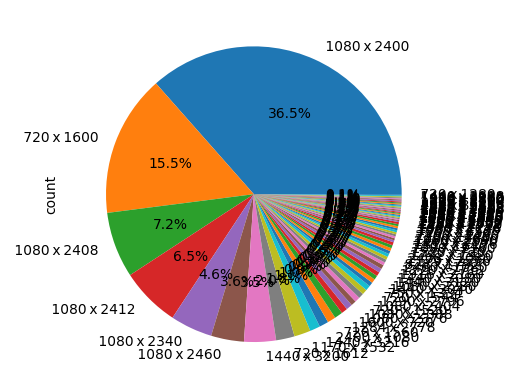

In [153]:
df['resolution'].value_counts().plot(kind = 'pie',autopct = '%.1f%%')

<AxesSubplot: xlabel='resolution'>

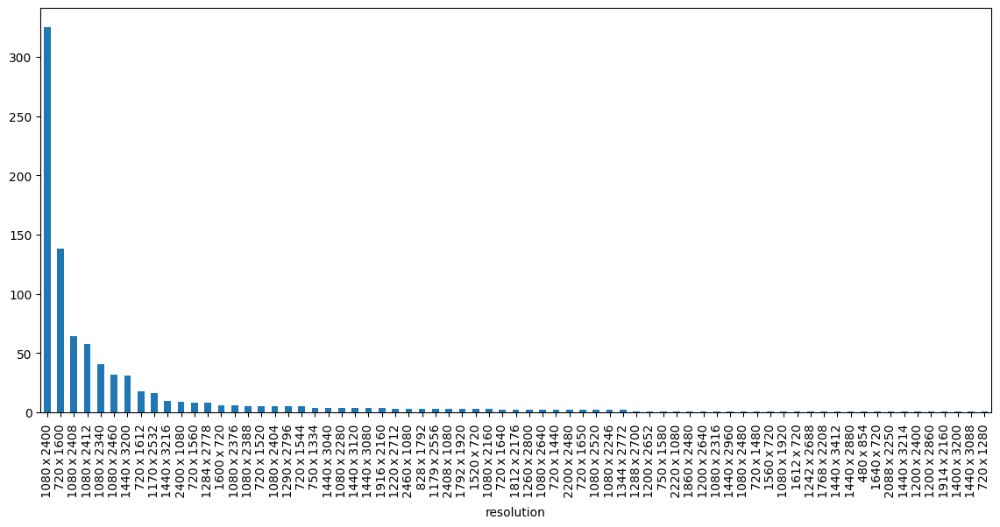

In [154]:
plt.figure(figsize = (14,6))
df['resolution'].value_counts().plot(kind = 'bar')

In [155]:
# 18.
# num_rear_cameras
df['num_rear_cameras'].value_counts()

num_rear_cameras
3    511
2    183
4    149
1     47
Name: count, dtype: int64

<AxesSubplot: xlabel='num_rear_cameras'>

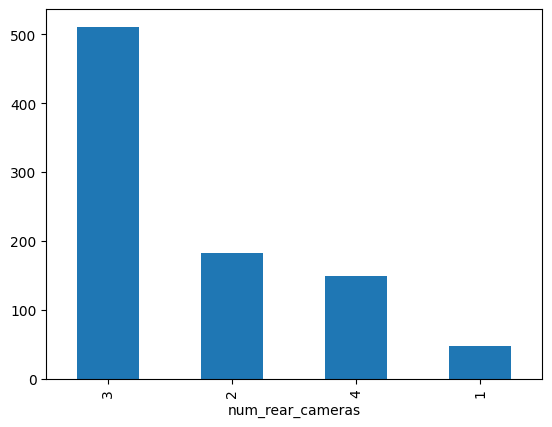

In [156]:

df['num_rear_cameras'].value_counts().plot(kind = 'bar')

<AxesSubplot: ylabel='count'>

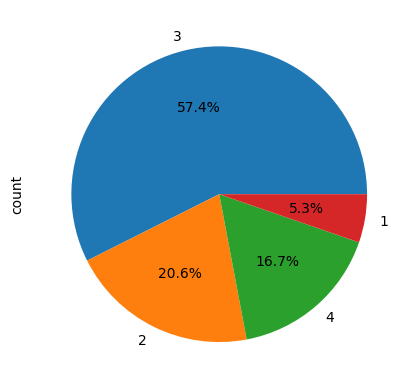

In [157]:
df['num_rear_cameras'].value_counts().plot(kind = 'pie',autopct = '%.1f%%')

    **Number of Rear Cameras Distribution:**
        - Among the four categories of the number of rear cameras, the majority, comprising 57.4% of smartphones, possess 3 
            rear cameras.
        - Following this, approximately 20.6% of smartphones feature 2 rear cameras.
        - The third position is held by smartphones with 4 cameras, accounting for 16.7% of the dataset.
        - The category with the least representation is smartphones with 1 rear camera, constituting 5.3% of the dataset.

In [158]:
# 19.
# num_front_cameras
df['num_front_cameras'].value_counts()

num_front_cameras
1.0    859
2.0     28
Name: count, dtype: int64

<AxesSubplot: xlabel='num_front_cameras'>

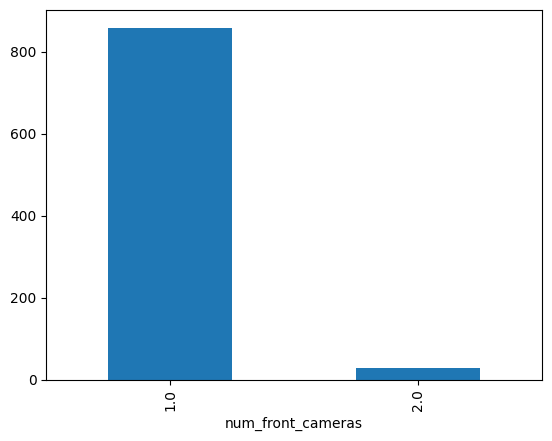

In [159]:
df['num_front_cameras'].value_counts().plot(kind = 'bar')

<AxesSubplot: ylabel='count'>

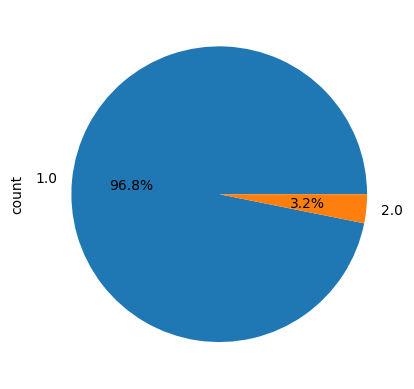

In [160]:
df['num_front_cameras'].value_counts().plot(kind = 'pie',autopct = '%.1f%%')
# 96.8% models are equipped with 1 front camera and remaining models with 2 front cameras

In [161]:
# 20 .
# primary camera rear
df['primary_camera_rear'].describe()

count    890.000000
mean      51.837865
std       33.154841
min        5.000000
25%       48.000000
50%       50.000000
75%       64.000000
max      200.000000
Name: primary_camera_rear, dtype: float64

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


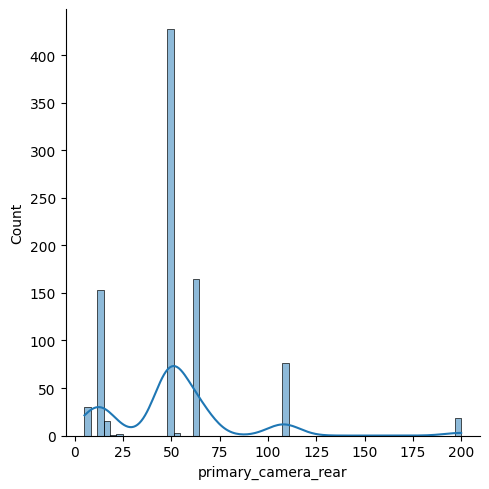

In [162]:
sns.displot(kind = 'hist',data = df,x = 'primary_camera_rear',kde = True)

In [163]:
# smartphones primary camera rear between 48MP,50MP and 64MP are 66.18% in dataset
round((df[(df['primary_camera_rear'] == 48) | (df['primary_camera_rear'] == 50) | (df['primary_camera_rear'] == 64)]['brand_name']).count()/(df['primary_camera_rear'].count()) * 100,2)

66.18

In [164]:
# smartphones primary camera rear between 12MP and 13MP are 16.74% in dataset
round((df[(df['primary_camera_rear'] == 12) | (df['primary_camera_rear'] == 13)]['brand_name']).count()/(df['primary_camera_rear'].count())*100,2)

16.74

In [165]:
# smartphones with 108MP primary camera rear are 8.54% in dataset
round((df[df['primary_camera_rear'] == 108]['primary_camera_rear'].count())/(df['primary_camera_rear'].count())*100,2)

8.54

In [166]:
df['primary_camera_rear'].value_counts()
# It`s a multimodal curve with 3 peaks 
#     first one at 13mp this is second highest peak of this distribution
#     second one at 50mp this is highest peak of the distribution 
#     Third and the flatest curve is at 108 mp

primary_camera_rear
50.0     314
64.0     165
48.0     110
13.0      99
108.0     76
12.0      50
8.0       27
200.0     18
16.0      15
12.2       4
50.3       3
54.0       3
5.0        3
24.0       2
20.0       1
Name: count, dtype: int64

In [167]:
df['primary_camera_rear'].skew()

1.847905803270693

<AxesSubplot: >

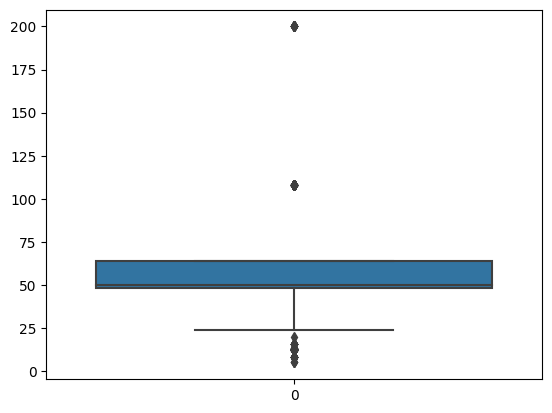

In [168]:
sns.boxplot(df['primary_camera_rear'])

In [169]:
df[df['primary_camera_rear'] == 200]['brand_name'].value_counts()

brand_name
xiaomi      6
motorola    4
samsung     3
nokia       3
infinix     1
honor       1
Name: count, dtype: int64

In [170]:
df[df['primary_camera_rear']>125]['primary_camera_rear'].value_counts()

primary_camera_rear
200.0    18
Name: count, dtype: int64

#### Analysis of Primary Rear Camera Megapixels

    **Distribution Peaks:**
        - Notable peaks are observed at 48MP, 50MP, and 64MP, which collectively account for 66.18% of the smartphones in 
          the dataset. Although this peak ranks second in terms of prevalence, it represents the highest concentration of 
          smartphones within a specific megapixel range.
        
        - Another significant peak is observed at 12MP and 13MP individually, covering 16.74% of the dataset. This peak 
          represents the primary bump in the distribution curve and is the second-highest peak in terms of prevalence.
            
        - The distribution also features a peak at 108MP, which accounts for 8.54% of smartphones in the dataset. This peak 
          forms the flattest segment of the distribution curve.

    **Skewness:**
        - The distribution displays a positive skew, as indicated by a skewness value of 1.85. This suggests that there is 
          a tendency towards higher megapixel values among primary rear cameras in the dataset.

    **Outliers:**
        - Examination reveals that all identified outlier values are genuine and predominantly consist of 200-megapixel 
          primary rear cameras. Notably, around two-thirds of these outliers belong to Chinese brands, while the 
          remaining outliers are evenly split between Samsung and Nokia.
    

In [171]:
df[df['primary_camera_rear']>125]['brand_name'].value_counts()

brand_name
xiaomi      6
motorola    4
samsung     3
nokia       3
infinix     1
honor       1
Name: count, dtype: int64

In [172]:
# 21
# primary_camera_front
df['primary_camera_front'].describe()

count    887.000000
mean      17.001578
std       11.021897
min        2.000000
25%        8.000000
50%       16.000000
75%       20.000000
max       60.000000
Name: primary_camera_front, dtype: float64

In [173]:
total_pcf = df['primary_camera_front'].count()
print(round(df[df['primary_camera_front'] == 16]['primary_camera_front'].count()/total_pcf * 100,2))              
print(round(df[df['primary_camera_front'] == 8]['brand_name'].count()/total_pcf * 100, 2))
print(round(df[df['primary_camera_front'] == 5]['brand_name'].count()/total_pcf * 100, 2))
print(round(df[df['primary_camera_front'] == 32]['brand_name'].count()/total_pcf * 100, 2))

32.36
17.81
11.61
16.46


In [174]:
df['primary_camera_front'].value_counts()

primary_camera_front
16.0    287
8.0     158
32.0    146
5.0     103
12.0     43
13.0     36
20.0     35
10.0     23
50.0     12
60.0     10
44.0      8
40.0      6
7.0       5
10.8      3
25.0      3
11.1      2
48.0      2
24.0      2
2.0       1
10.7      1
10.1      1
Name: count, dtype: int64

<AxesSubplot: ylabel='count'>

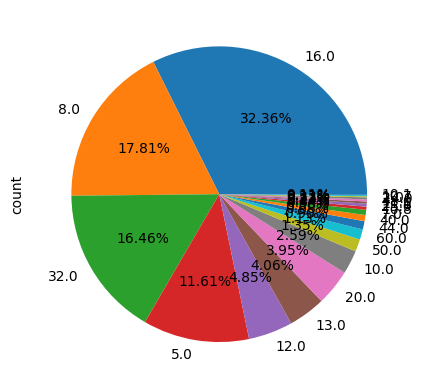

In [175]:
df['primary_camera_front'].value_counts().plot(kind = 'pie',autopct = '%.2f%%')

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


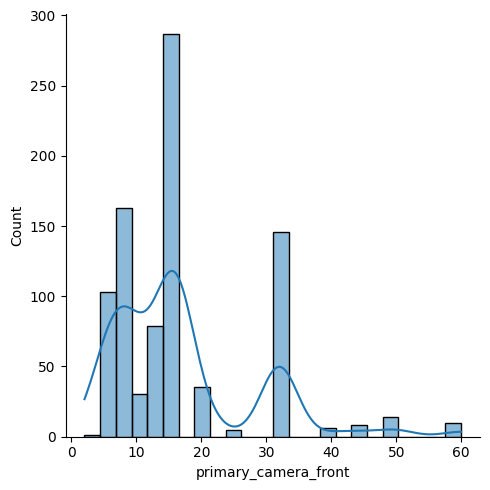

In [176]:
sns.displot(kind = 'hist',data = df,x = 'primary_camera_front',kde = True)

In [177]:
df['primary_camera_front'].skew()

1.4300448447624348

<AxesSubplot: >

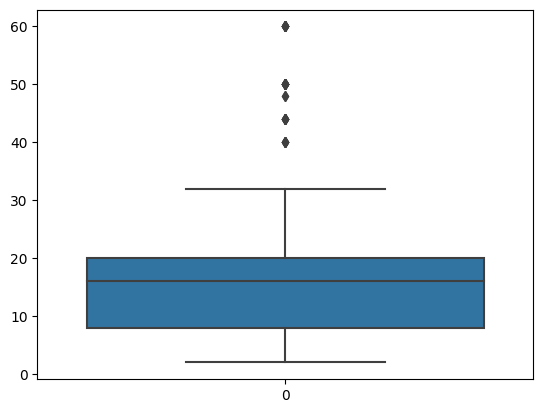

In [178]:
sns.boxplot(df['primary_camera_front'])

<AxesSubplot: >

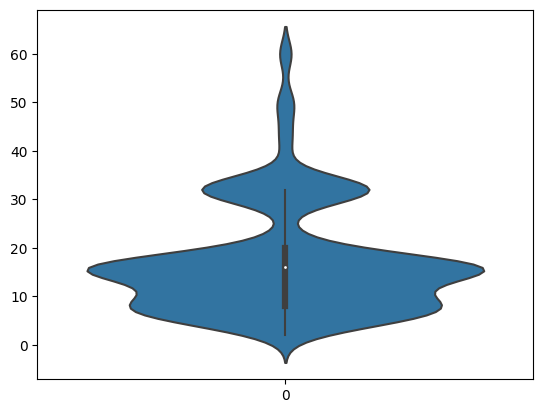

In [179]:
sns.violinplot(df['primary_camera_front'])

In [180]:
df[df['primary_camera_front'] > 30]

,brand_name,model,price,rating,has_5g,has_nfc,has_ir_blaster,processor_brand,num_cores,processor_speed,...,refresh_rate,screen_size,resolution,num_rear_cameras,num_front_cameras,primary_camera_rear,primary_camera_front,extended_memory_available,extended_upto,os
9,oneplus,OnePlus Nord 2T 5G,28999,84.0,True,True,False,dimensity,8.0,3.00,...,90,6.43,1080 x 2400,3,1.0,50.0,32.0,0,NaN,Android
17,oppo,OPPO Reno 9 Pro Plus,45999,86.0,True,True,False,snapdragon,8.0,3.20,...,120,6.70,1080 x 2412,3,1.0,50.0,32.0,0,NaN,Android
21,vivo,Vivo V25 Pro 5G,35999,85.0,True,False,False,dimensity,8.0,3.00,...,120,6.56,1080 x 2376,3,1.0,64.0,32.0,0,NaN,Android
24,vivo,Vivo V26 Pro,42990,87.0,True,True,False,dimensity,8.0,3.20,...,120,6.70,1080 x 2400,3,1.0,64.0,32.0,0,NaN,Android
25,samsung,Samsung Galaxy S20 FE 5G,31239,88.0,True,True,False,snapdragon,8.0,2.84,...,120,6.50,1080 x 2400,3,1.0,12.0,32.0,1,NaN,Android
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
969,xiaomi,Xiaomi Civi 3,32990,86.0,True,True,True,dimensity,8.0,3.10,...,120,6.70,1080 x 2400,3,2.0,64.0,32.0,0,NaN,Android
971,oppo,Oppo Find X6,69990,89.0,True,True,False,snapdragon,8.0,3.20,...,120,6.73,1080 x 2400,3,1.0,50.0,32.0,0,NaN,Android
974,vivo,Vivo X Fold 2,119990,NaN,True,True,False,snapdragon,8.0,3.20,...,120,8.03,1916 x 2160,3,1.0,50.0,32.0,0,NaN,Android
978,motorola,Motorola Moto G91 5G,19990,80.0,True,True,False,snapdragon,8.0,2.20,...,60,6.80,1080 x 2400,3,1.0,108.0,32.0,1,1024.0,Android


In [181]:
df.loc[df['model'] == 'OnePlus Nord 3 5G', 'primary_camera_front'] = 16

In [182]:
df[df['model'] == 'Vivo V27 Pro']

,brand_name,model,price,rating,has_5g,has_nfc,has_ir_blaster,processor_brand,num_cores,processor_speed,...,refresh_rate,screen_size,resolution,num_rear_cameras,num_front_cameras,primary_camera_rear,primary_camera_front,extended_memory_available,extended_upto,os
106,vivo,Vivo V27 Pro,43999,87.0,True,False,False,dimensity,8.0,3.2,...,144,6.73,1080 x 2400,3,1.0,108.0,32.0,0,NaN,Android


In [183]:
df['primary_camera_front'].describe()

count    887.00000
mean      16.98354
std       11.01041
min        2.00000
25%        8.00000
50%       16.00000
75%       20.00000
max       60.00000
Name: primary_camera_front, dtype: float64

In [184]:
round(df[df['primary_camera_front'] == 32]['primary_camera_front'].value_counts()/df['primary_camera_front'].count() * 100, 2)

primary_camera_front
32.0    16.35
Name: count, dtype: float64

In [185]:
filter = df[df['primary_camera_front'] >30]

In [186]:
((filter[['brand_name']].value_counts().sum())/969) * 100

18.885448916408667

In [187]:
filter[['brand_name', 'primary_camera_front']].value_counts()

brand_name  primary_camera_front
oppo        32.0                    32
samsung     32.0                    29
vivo        32.0                    21
xiaomi      32.0                    16
vivo        50.0                    11
motorola    32.0                    11
oneplus     32.0                     9
realme      32.0                     8
vivo        44.0                     8
motorola    60.0                     7
tecno       32.0                     6
samsung     40.0                     6
poco        32.0                     4
nokia       32.0                     3
honor       32.0                     3
tecno       48.0                     2
huawei      32.0                     2
honor       50.0                     1
samsung     60.0                     1
infinix     60.0                     1
            32.0                     1
huawei      60.0                     1
Name: count, dtype: int64

In [188]:
# Samsung 29 + Nokia 3 = 32
100-((32/(filter[['brand_name']].value_counts().sum()))*100)

82.51366120218579

In [189]:
filter[['brand_name','primary_camera_front']]

,brand_name,primary_camera_front
9,oneplus,32.0
17,oppo,32.0
21,vivo,32.0
24,vivo,32.0
25,samsung,32.0
...,...,...
969,xiaomi,32.0
971,oppo,32.0
974,vivo,32.0
978,motorola,32.0


In [190]:

df['primary_camera_front'].skew()

1.4365912121929796

##### Based on your analysis of the primary camera front megapixels:

    - The first highest peak in the distribution is observed at 16MP, covering 32.47% of the dataset.
    - The second highest peak is at 8MP, contributing 17.81% to the dataset, with a slight left tail extending to 5MP, 5MP 
      adds 11.61% to the dataset.
    - The third highest peak is at 32MP, accounting for 16.35% of the dataset.
    - Combined, these three peaks cover approximately 78.24% of the dataset.

### Primary Camera Front Analysis
- **Distribution:** The distribution of primary front camera resolutions exhibits a multimodal pattern.
- **Skewness:** The skewness value is 1.43, indicating a positively skewed distribution.
- **Outliers:** Outlier values are observed above 30MP. While some outliers were corrected based on available data, the remaining outliers are considered genuine with 19.7% from available data in dataset in which 32MP contributes to 15.79%.
- **Brands:** In outliers approximately 82.51% of the values belong to Chinese brands, with the remaining associated with Samsung and Nokia particularly in the 32MP range.
    
    ##### Based on your analysis of the primary camera front megapixels:

    - The first highest peak in the distribution is observed at 16MP, covering 32.47% of the dataset.
    - The second highest peak is at 8MP, contributing 17.81% to the dataset, with a slight left tail extending to 5MP, 5MP 
      adds 11.61% to the dataset.
    - The third highest peak is at 32MP, accounting for 16.35% of the dataset.
    - Combined, these three peaks cover approximately 78.24% of the dataset.

    **Distribution:** The primary camera front resolutions exhibit a multimodal distribution, indicating multiple peaks in 
                    the data.

    **Skewness:** The positively skewed distribution, with a skewness value of 1.43, suggests that the majority of 
                    smartphones have lower front camera resolutions, with a tail extending towards higher resolutions.

    **Outliers**: Outliers are observed above 30MP, with approximately 19.7% of the dataset containing genuine outliers.
                    Among these outliers, around 82.51% of values belong to Chinese brands, while the rest are associated 
                    with Samsung and Nokia, particularly in the 32MP range.

    **Peak Analysis:**
        - The highest peak is observed at 16MP, covering 32.47% of the dataset.
        - The second highest peak is at 8MP, contributing 17.81% to the dataset, with a slight left tail extending to 5MP,
            which adds 11.61% to the dataset.
        - The third highest peak is at 32MP, accounting for 16.35% of the dataset.
        - Together, these three peaks cover approximately 78.24% of the dataset, indicating the prevalence of these 
            resolutions among smartphones.

    **Number of Front Cameras Distribution:**
        The overwhelming majority, accounting for 96.8% of smartphones in the dataset, are equipped with a single front 
        camera.

    **Operating System Distribution:**
        Android dominates the market with a share of 93.9%, followed by iOS with 5.2%.

In [191]:
# 22.
# extended_memory_available
df['extended_memory_available'].value_counts()

extended_memory_available
1    568
0    322
Name: count, dtype: int64

<AxesSubplot: ylabel='count'>

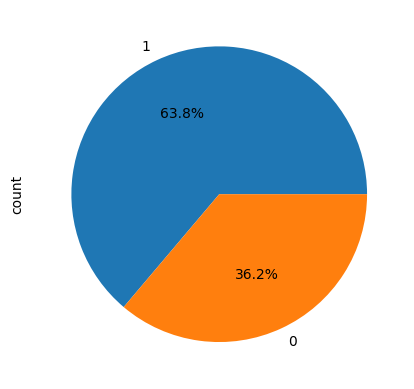

In [192]:
df['extended_memory_available'].value_counts().plot(kind = 'pie',autopct = '%.1f%%')

    **Extended Memory Availability:**
        Approximately 63.8% of phones in the dataset offer extended memory options.

In [193]:
# 23.
# extended_upto
df['extended_upto'].value_counts()

extended_upto
1024.0    253
512.0     111
256.0      95
2048.0      5
128.0       3
1000.0      1
Name: count, dtype: int64

<AxesSubplot: xlabel='extended_upto'>

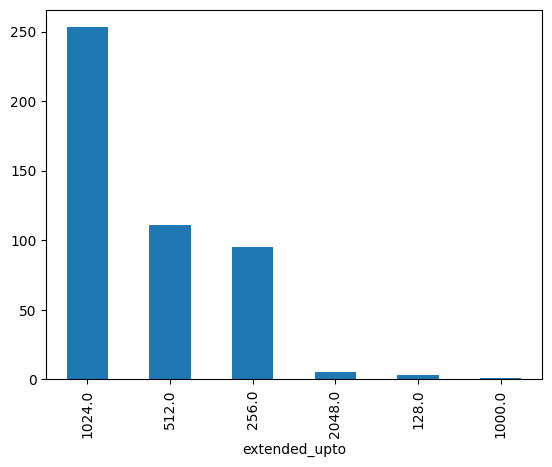

In [194]:
df['extended_upto'].value_counts().plot(kind = 'bar')

<AxesSubplot: ylabel='count'>

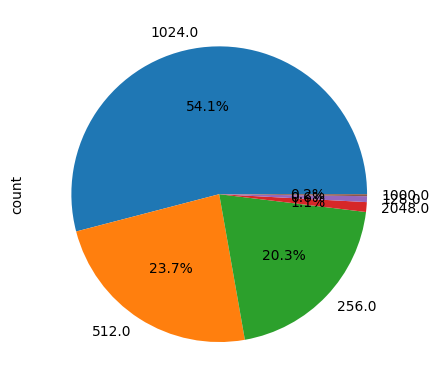

In [195]:
df['extended_upto'].value_counts().plot(kind = 'pie',autopct = '%.1f%%')

    **Extended Memory Capacity:**
        - The top three extended memory capacities are 1024GB, 512GB, and 256GB, accounting for 98.1% of smartphones in the 
            dataset.
        - Approximately 54.1% of smartphones support extended memory up to 1024GB.
        - Around 23.7% of smartphones support extended memory up to 512GB.
        - Approximately 20.3% of smartphones support extended memory up to 256GB.

In [196]:
# 24.
# os
df['os'].value_counts()

os
Android    829
iOS         46
Other        8
Name: count, dtype: int64

<AxesSubplot: xlabel='os'>

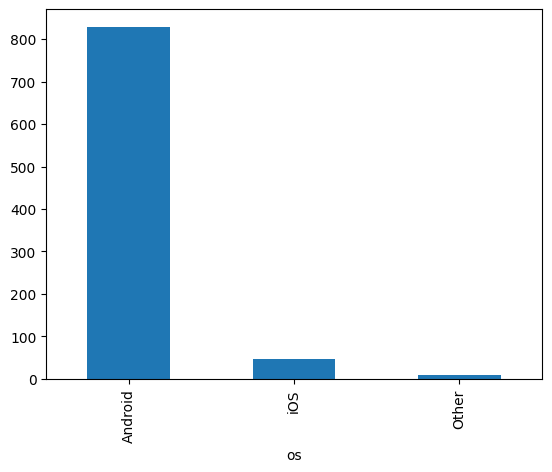

In [197]:
df['os'].value_counts().plot(kind = 'bar')

<AxesSubplot: ylabel='count'>

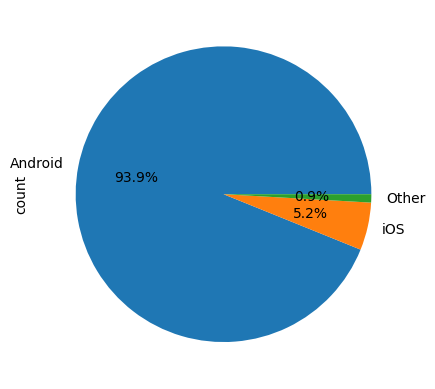

In [198]:
df['os'].value_counts().plot(kind = 'pie',autopct ='%.1f%%')
# 93.9% of models are equipped with Android. Followed by 5.2% of iOS and remaining belongs to others.

### BIVARIATE ANALYSIS

    Bivariate analysis is one of the statistical analysis where two variables are observed. One variable here is dependent 
    while the other is independent. These variables are usually denoted by X and Y. So, here we analyse the changes occured 
    between the two variables and to what extent.

with the help of domain knowledge you will know which 2 columns to be considered for analysis
in this project our target is predicting price so we will anlyse all columns once with price column
(price column X all columns)

but in a routine EDA situaion you
(all columns X all columns) when you have alot of time and less columns in case of alot columns domain knowledge will help you
other than domain knowledge there is no other way

in this project other than (price X all columns) there is an another intresting combination (brand_name X all columns)
this will give an idea of what kind of products a certain brand is producing

It's common to conduct 2-3 iterations of analysis to refine and deepen insights. This iterative process allows for the 
identification of patterns, anomalies, and correlations that may not be immediately apparent in the initial analysis. 
It also provides an opportunity to validate findings and explore additional avenues of investigation.

reason for using "estimator = np.median" is beacause price has outliers

#### price X All_columns
#### brand X All_columns:
        brand name could be a good column to do bivariate analysis, what is brand rating, particular brands 5g, relation
        between phone brand name and processor name,brands average battery capacity

In [199]:
df.head()

,brand_name,model,price,rating,has_5g,has_nfc,has_ir_blaster,processor_brand,num_cores,processor_speed,...,refresh_rate,screen_size,resolution,num_rear_cameras,num_front_cameras,primary_camera_rear,primary_camera_front,extended_memory_available,extended_upto,os
0,oneplus,OnePlus 11 5G,54999,89.0,True,True,False,snapdragon,8.0,3.2,...,120,6.70,1440 x 3216,3,1.0,50.0,16.0,0,NaN,Android
1,oneplus,OnePlus Nord CE 2 Lite 5G,19989,81.0,True,False,False,snapdragon,8.0,2.2,...,120,6.59,1080 x 2412,3,1.0,64.0,16.0,1,1024.0,Android
2,samsung,Samsung Galaxy A14 5G,16499,75.0,True,False,False,exynos,8.0,2.4,...,90,6.60,1080 x 2408,3,1.0,50.0,13.0,1,1024.0,Android
3,motorola,Motorola Moto G62 5G,14999,81.0,True,False,False,snapdragon,8.0,2.2,...,120,6.55,1080 x 2400,3,1.0,50.0,16.0,1,1024.0,Android
4,realme,Realme 10 Pro Plus,24999,82.0,True,False,False,dimensity,8.0,2.6,...,120,6.70,1080 x 2412,3,1.0,108.0,16.0,0,NaN,Android


In [200]:
df[df['processor_brand'] == 'snapdragon']['price'].skew()

2.285198672552694

In [201]:
df.groupby('processor_brand')['price'].describe().sort_values(by = 'max')

,count,mean,std,min,25%,50%,75%,max
processor_brand,,,,,,,,
mediatek,1.0,4999.000000,NaN,4999.0,4999.00,4999.0,4999.00,4999.0
spreadtrum,1.0,6999.000000,NaN,6999.0,6999.00,6999.0,6999.00,6999.0
unisoc,20.0,8655.000000,2104.225573,5249.0,7108.50,8920.0,9624.00,13499.0
tiger,18.0,9811.277778,2303.124676,5299.0,8404.25,9249.0,11720.75,13999.0
qualcomm,2.0,13149.500000,4029.801546,10300.0,11724.75,13149.5,14574.25,15999.0
samsung,1.0,17990.000000,NaN,17990.0,17990.00,17990.0,17990.00,17990.0
helio,188.0,12339.590426,4035.550047,3499.0,8999.00,11999.0,14774.25,26990.0
fusion,1.0,52990.000000,NaN,52990.0,52990.00,52990.0,52990.00,52990.0
apple,1.0,71999.000000,NaN,71999.0,71999.00,71999.0,71999.00,71999.0


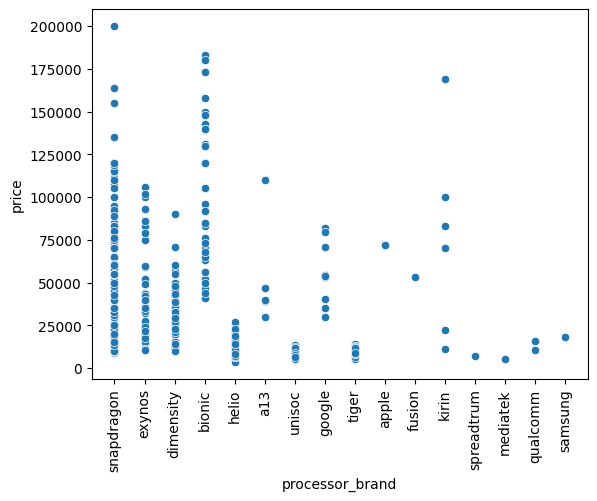

In [202]:
# 7 x 2
# Bivariate Analysis
# processor_brand x price
sns.scatterplot(data = df, x = 'processor_brand', y = 'price')
plt.xticks(rotation = 'vertical');
# 'snapdragon' has the most wide price range in the processors starting from 8990.0 mininum price to the highest price of whole 
# dataset as max price 199990.0 and is highly right skewed with skewness value 2.29.

# both 'exynos' 10499.0 minimum price and 'dimensity' 9999.0 minimum price starts at similar price both of them have 16999.0
# rupees as their Q1(First Quartile). 'exynos' maximum price is 105999.0 and 'dimensity' maximum price is 89990.0
# but median and Q3(Third Quartile) of 'dimensity' is lesserthan 'exynos'.

# 'exynos' is right skewed with 1.11 skewness value and few outliers
# 'dimensity' is right skewed with skewness value of 1.85 and have outliers

# 'helio' have very few outliers and right skewed with 0.76 skewness. have a the least price of whole dataset as minimum 
# price which is 3499.0 and a maximum price of 26990.0

# 'bionic' processors have a bimodel distribution without any outliers who`s minimum price itself is higher than the maximum 
# price of the helio processor and higher than snapdragon and dimensity`s Q3 and the median of the exynos.

# not only bionic any of apple processors`s minimum value is greater than majority of processor brands median price

In [203]:
print(df[df['processor_brand'] == 'dimensity'].shape[0])
print(df[df['processor_brand'] == 'exynos'].shape[0])

171
49


<AxesSubplot: ylabel='count'>

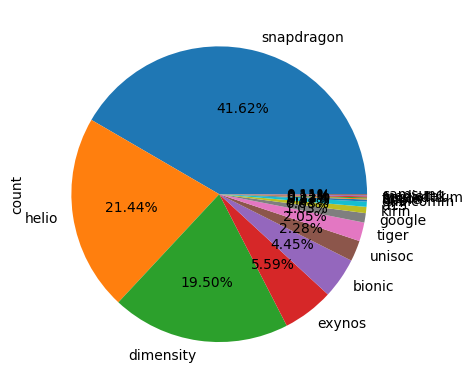

In [204]:
# processor_brand
#     82.56% market is captured by three brands
#     snapdragon processors are used in 41.62% of the devices, followed by helio which contributes to 21.44% of devices, 
#     The 3rd highest used processor is of brand named dimensity which contributes to 19.50% of devices.

df['processor_brand'].value_counts().plot(kind = 'pie',autopct = '%.2f%%')

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<AxesSubplot: xlabel='price', ylabel='Density'>

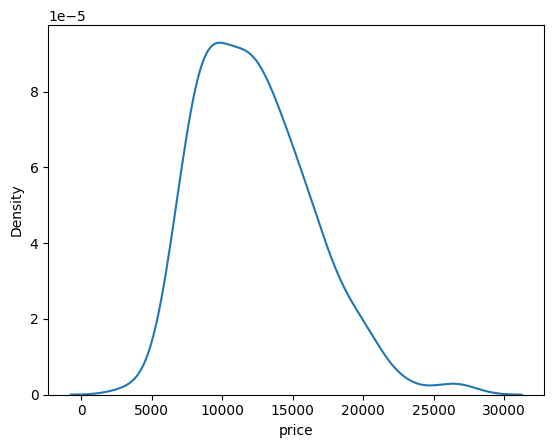

In [205]:
pl = df[df['processor_brand'] == 'helio']['price']
sns.kdeplot(data = pl)

In [206]:
df.groupby('processor_brand')['price'].describe()

,count,mean,std,min,25%,50%,75%,max
processor_brand,,,,,,,,
a13,5.0,53157.600000,32290.075539,29990.0,38999.00,39900.0,46999.00,109900.0
apple,1.0,71999.000000,NaN,71999.0,71999.00,71999.0,71999.00,71999.0
bionic,39.0,102866.205128,41510.351555,40999.0,66999.00,95999.0,135445.00,182999.0
dimensity,171.0,25497.087719,11821.248311,9999.0,16999.00,23790.0,29990.00,89990.0
exynos,49.0,38246.653061,28191.955900,10499.0,16999.00,27499.0,48900.00,105999.0
fusion,1.0,52990.000000,NaN,52990.0,52990.00,52990.0,52990.00,52990.0
google,9.0,55505.333333,18820.927335,29999.0,40480.00,53990.0,70990.00,81999.0
helio,188.0,12339.590426,4035.550047,3499.0,8999.00,11999.0,14774.25,26990.0
kirin,6.0,75818.166667,57372.492748,10949.0,33990.00,76490.0,95740.00,169000.0


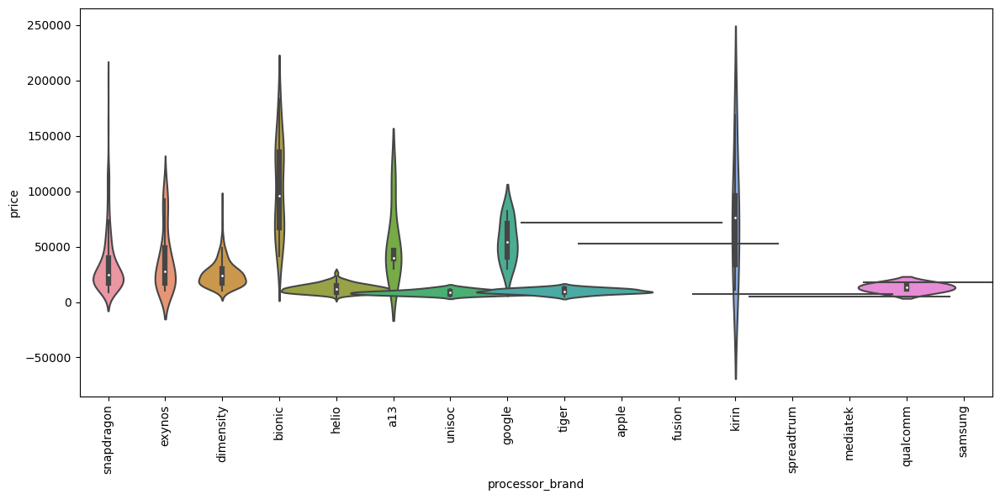

In [207]:
plt.figure(figsize = (14,6))
sns.violinplot(data = df, x = 'processor_brand', y = 'price',width = 3.5)
plt.xticks(rotation = 'vertical');

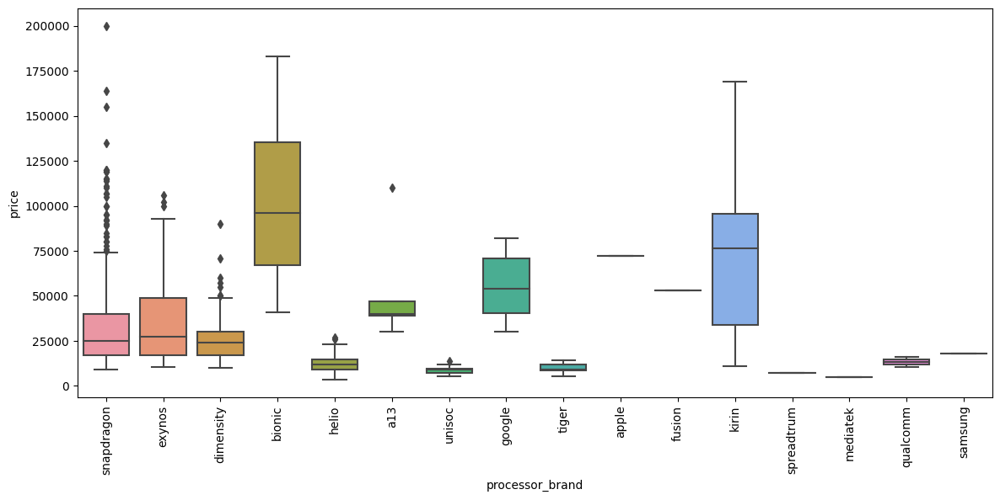

In [208]:
plt.figure(figsize = (14,6))
sns.boxplot(data = df, x = 'processor_brand', y = 'price')
plt.xticks(rotation = 'vertical');

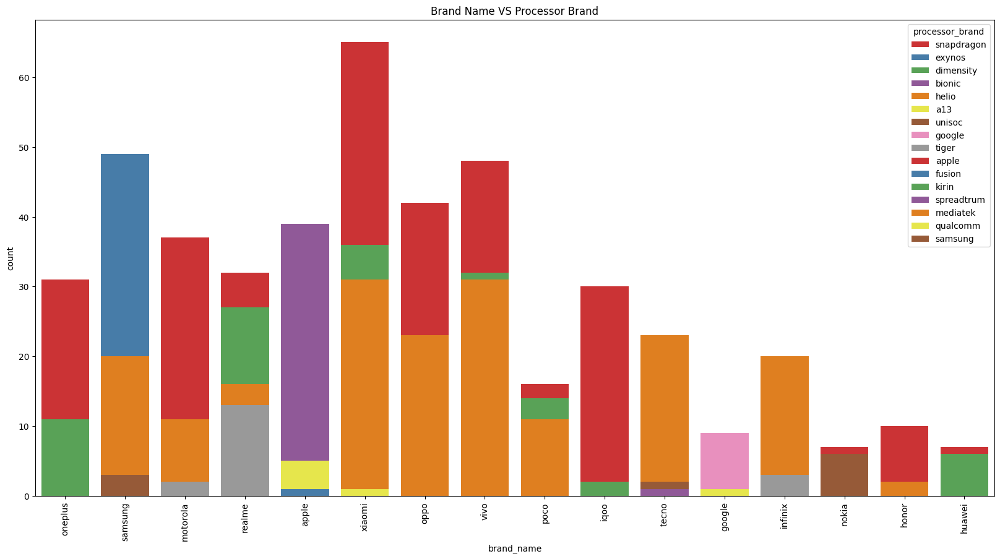

In [209]:
# 7 x 2
# processor brand x brand_name
plt.figure(figsize = (20,10))
sns.countplot(data = df,x = 'brand_name',hue = 'processor_brand',dodge = False, palette = 'Set1',)
plt.title('Brand Name VS Processor Brand')
plt.xticks(rotation = 'vertical');

# 62.5% of brands have snapdragon processors out of all processors from all brands 42.4% processors are of snapdragon only
# The 2nd place goes to helio 62.5% of brands have this processors it contributes to 20.8% of all processors used
# after that 3rd place goes to dimensity 43.7% of brands have this processors it contributes to 18% of all processors used

# we reject the null hypothesis. There is a significant association betweeen brand_name and processor_brand columns with 
# P-value: 0.0000

    * Processor Brand Distribution:
       - Snapdragon processors dominate the market, being utilized by 62.5% of smartphone brands. They account for 42.4% of 
         all processors in use.
        
       - Helio processors rank second, with 62.5% of brands opting for them, constituting 20.8% of all processors.
        
       - Dimensity processors secure the third position, being chosen by 43.7% of brands and contributing 18% of all
         processors deployed.

    * Association between Brand and Processor:
       - A hypothesis test reveals a statistically significant association between the brand_name and processor_brand 
         columns (P-value: 0.0000).

In [210]:
df.groupby('processor_brand')['brand_name'].value_counts()

processor_brand  brand_name
a13              apple          5
apple            apple          1
bionic           apple         39
dimensity        xiaomi        36
                 vivo          32
                 realme        27
                 oppo          23
                 poco          14
                 oneplus       11
                 samsung       11
                 infinix        6
                 tecno          6
                 iqoo           2
                 motorola       2
                 honor          1
exynos           samsung       49
fusion           apple          1
google           google         9
helio            vivo          31
                 xiaomi        31
                 oppo          23
                 tecno         23
                 infinix       20
                 samsung       20
                 realme        16
                 motorola      11
                 poco          11
                 honor          2
kirin            hua

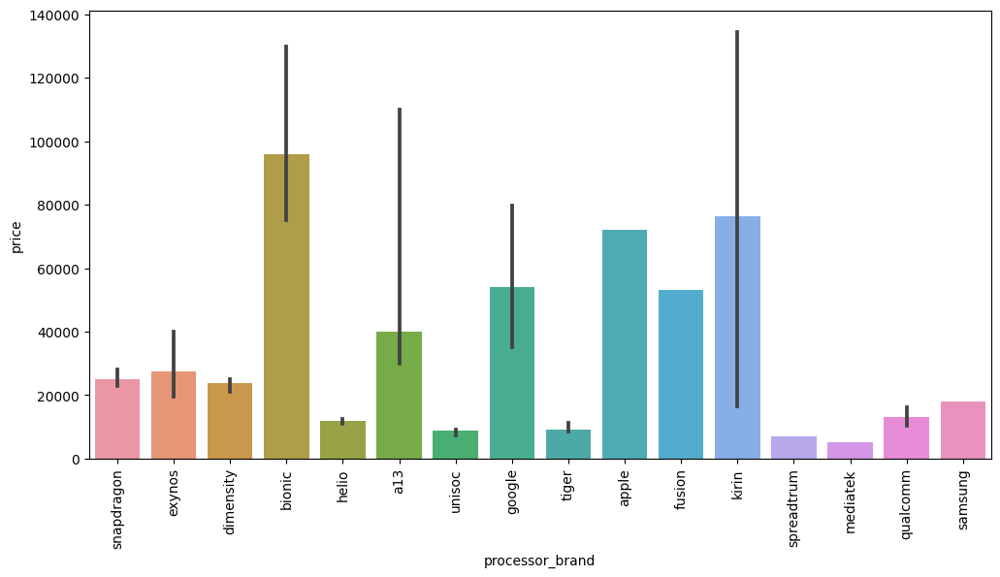

In [211]:
#barplot
plt.figure(figsize = (12,6))
sns.barplot(data = df, x = 'processor_brand', y = 'price',estimator = np.median)
plt.xticks(rotation = 'vertical');

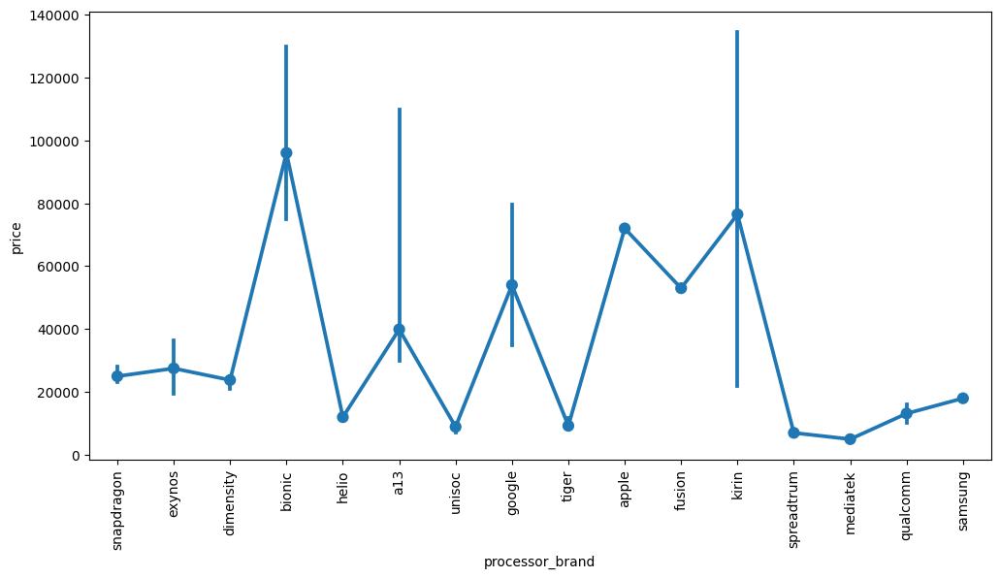

In [212]:
# point plot
plt.figure(figsize = (12,6))
sns.pointplot(data = df, x = 'processor_brand', y = 'price',estimator = np.median)
plt.xticks(rotation = 'vertical');

skew of snapdragon MP:  2.285198672552694
skew of helio MP:  0.7610811806564745
skew of dimensity MP:  1.8547664724643773
skew of exynos MP:  1.1087118923802004
skew of bionic MP:  0.22018705876629355
skew of unisoc MP:  0.6296869176208383
skew of tiger MP:  -0.08258957485249674
skew of google MP:  0.18881924001079317
skew of kirin MP:  0.6266051263601975
skew of a13 MP:  2.040269632426816
skew of qualcomm MP:  nan


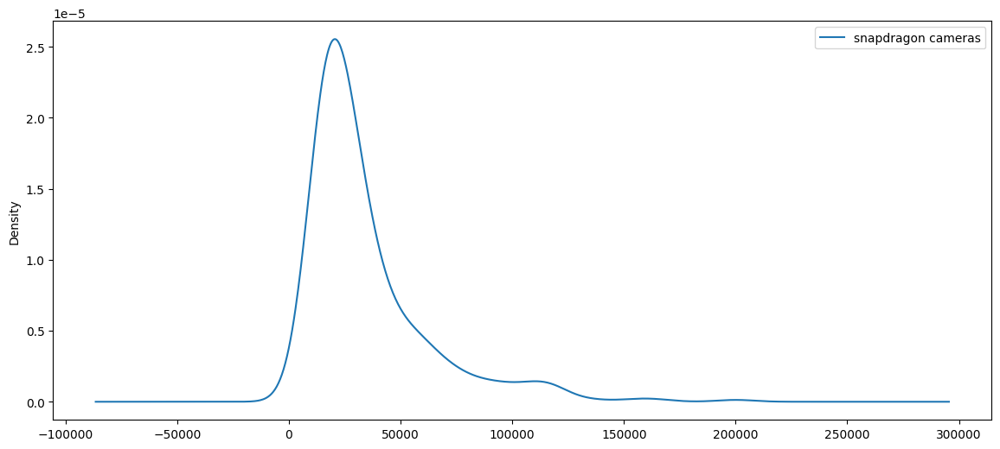

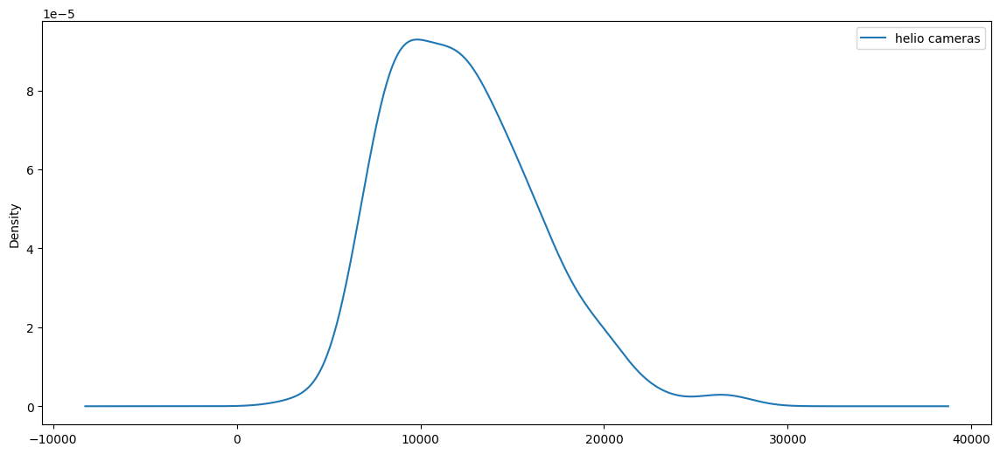

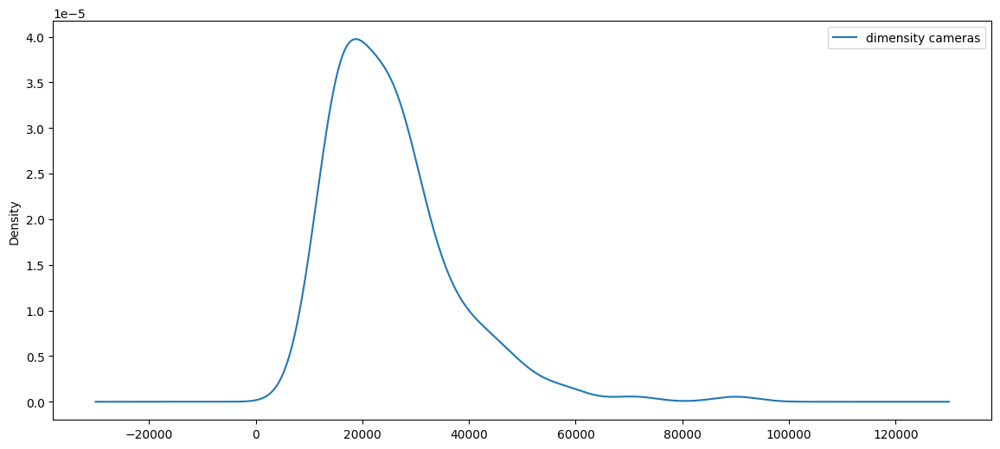

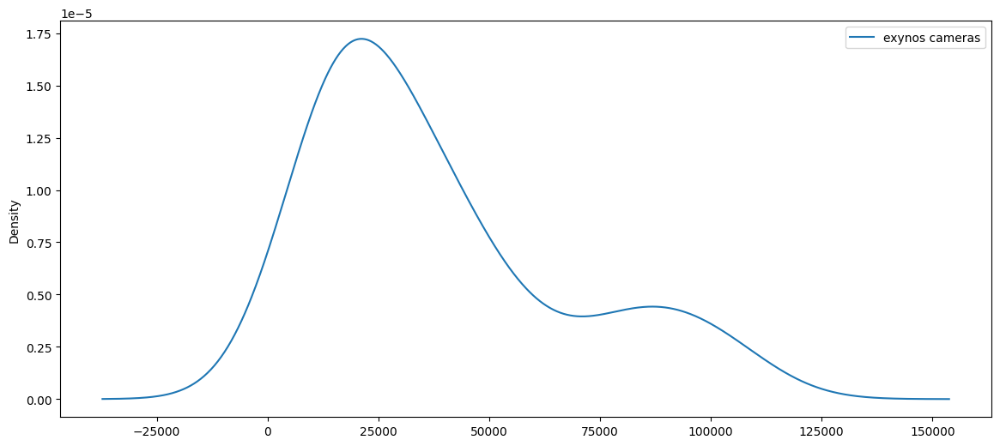

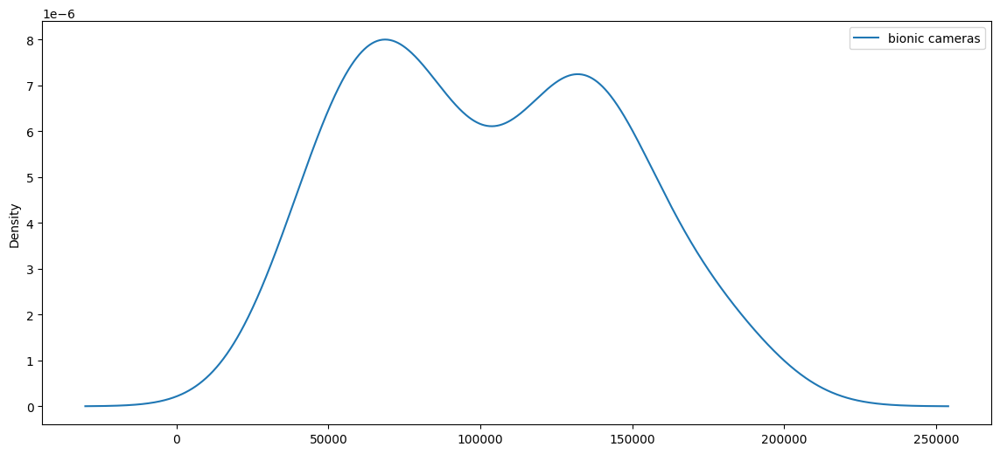

...

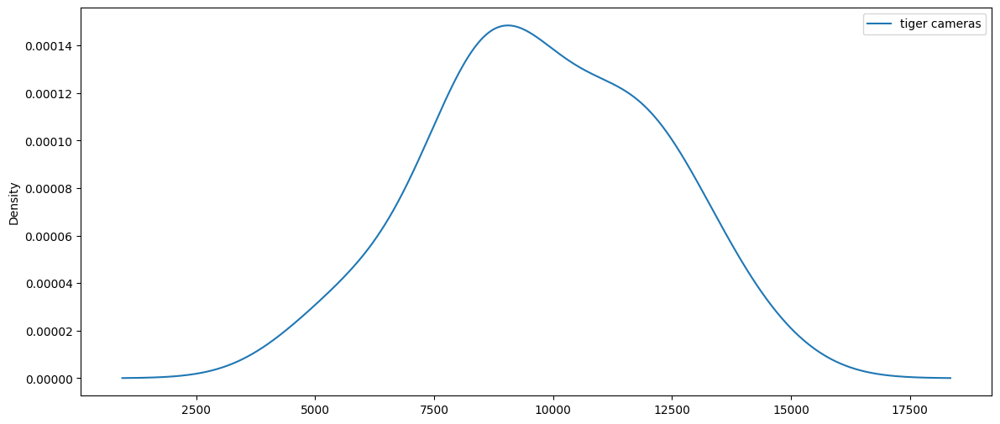

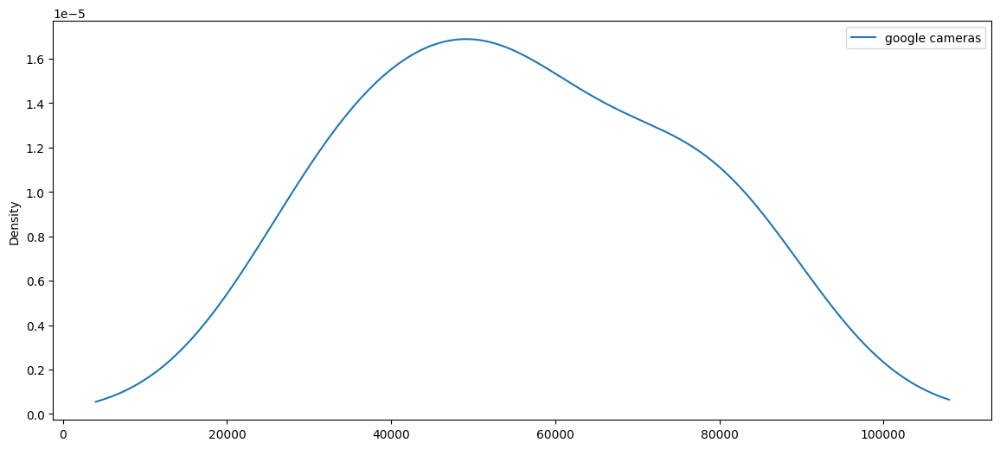

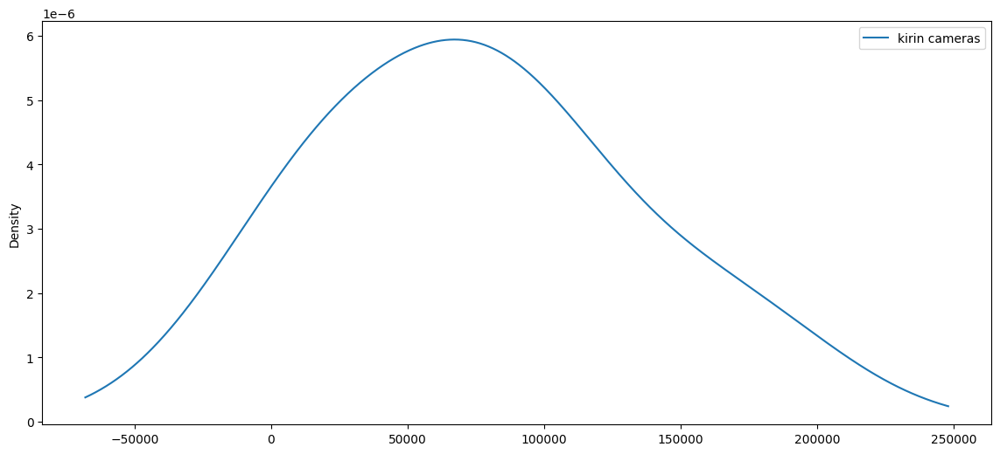

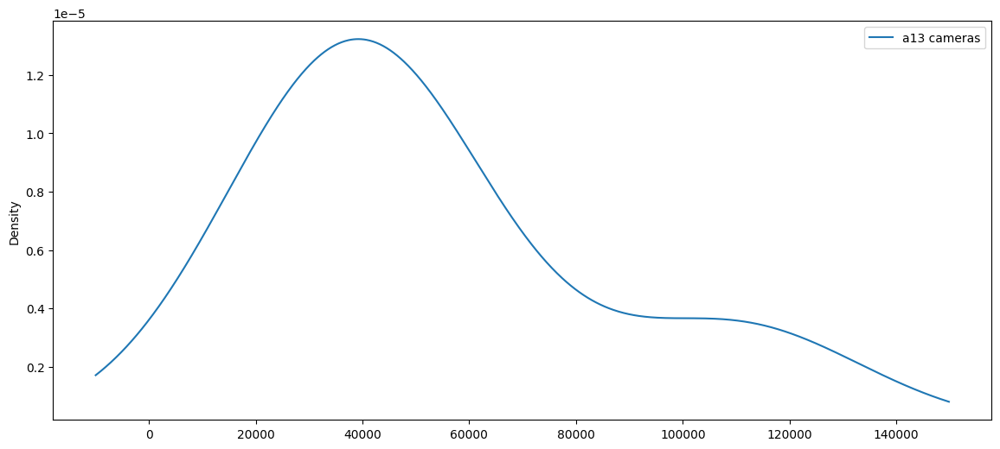

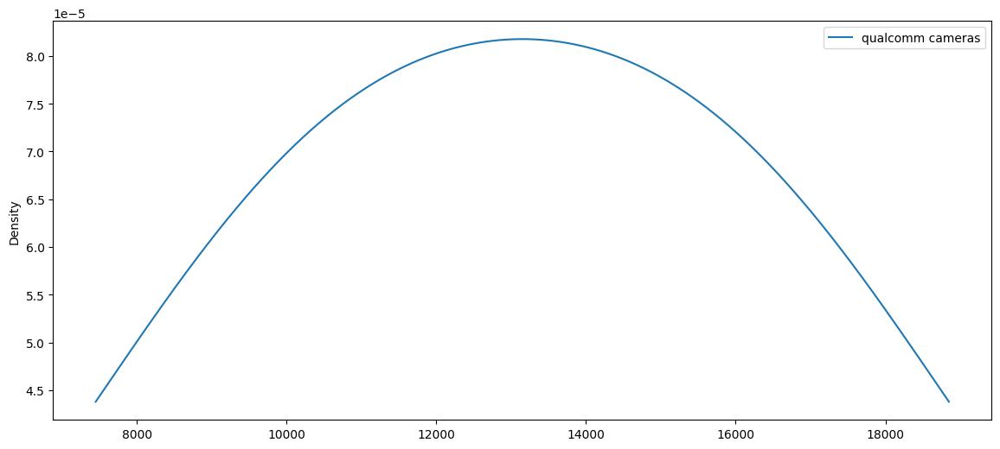

In [213]:
# 1D kde plot

# ... your existing code to create the DataFrame (df) ...
MP = df['processor_brand'].value_counts().index.tolist()

for i in MP:
    subset = df[df['processor_brand'] == i]['price']
    
    # Check if subset has more than one element before plotting
    if not subset.empty and len(subset) > 1:
        plt.figure(figsize=(14, 6))
        subset.plot(kind='kde', label=f'{i} cameras')

        # Print skewness only if the subset has more than one element
        print(f'skew of {i} MP: ', subset.skew())
        plt.legend()

# Add legend and display the plot after the loop (assuming all plots fit)
# if len(MP) > 1:  # Check if there's more than one camera count
#     plt.legend()

plt.show()

In [214]:

# Filter out rows with non-null processor_brand and price
p_df = df.dropna(subset=['processor_brand', 'price'])

# Group prices by processor brand
groups = []
for brand, group_data in p_df.groupby('processor_brand')['price']:
    groups.append(group_data.tolist())

# Perform Kruskal-Wallis test
statistic, p_value = stats.kruskal(*groups)

print("Kruskal-Wallis statistic:", statistic)
# print("p-value:", p_value)

# The Kruskal-Wallis statistic is 445.24493494204467 and the p-value is approximately 2.0709312210967183e-85. This indicates
# that there is a significant difference in prices across different processor brands.

Kruskal-Wallis statistic: 445.24493494204467


In [215]:
import scikit_posthocs as sp

# Assuming p_df is your DataFrame containing the relevant columns
posthoc_results = sp.posthoc_dunn(p_df, val_col='price', group_col='processor_brand', p_adjust='bonferroni')

print("Dunn's test results:")
print(posthoc_results)

Dunn's test results:
                 a13     apple        bionic     dimensity        exynos  \
a13         1.000000  1.000000  1.000000e+00  1.000000e+00  1.000000e+00   
apple       1.000000  1.000000  1.000000e+00  1.000000e+00  1.000000e+00   
bionic      1.000000  1.000000  1.000000e+00  3.393142e-12  1.485019e-05   
dimensity   1.000000  1.000000  3.393142e-12  1.000000e+00  1.000000e+00   
exynos      1.000000  1.000000  1.485019e-05  1.000000e+00  1.000000e+00   
fusion      1.000000  1.000000  1.000000e+00  1.000000e+00  1.000000e+00   
google      1.000000  1.000000  1.000000e+00  3.255409e-01  1.000000e+00   
helio       0.000533  1.000000  1.216977e-44  1.109481e-26  5.133516e-16   
kirin       1.000000  1.000000  1.000000e+00  1.000000e+00  1.000000e+00   
mediatek    1.000000  1.000000  1.683901e-01  1.000000e+00  1.000000e+00   
qualcomm    1.000000  1.000000  1.120048e-01  1.000000e+00  1.000000e+00   
samsung     1.000000  1.000000  1.000000e+00  1.000000e+00  1.00000

<AxesSubplot: xlabel='brand_name', ylabel='processor_brand'>

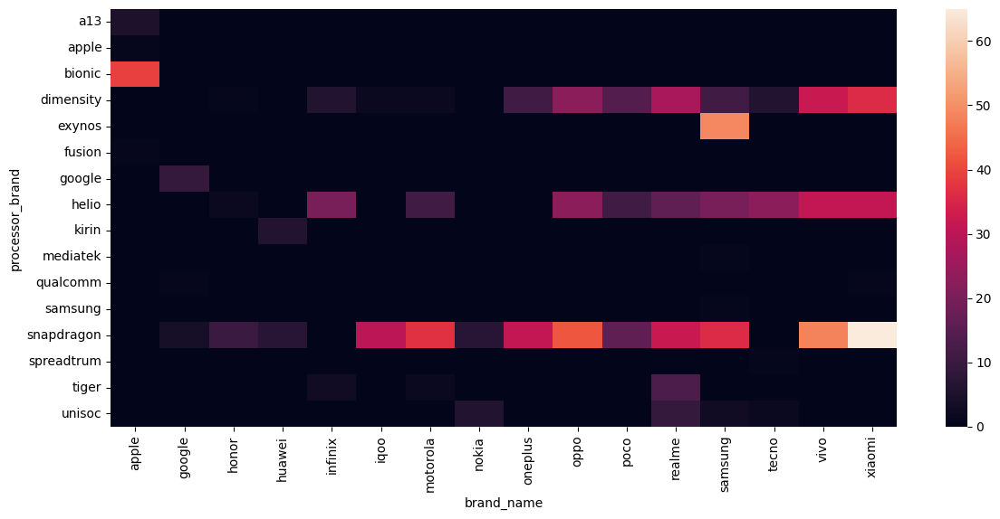

In [216]:
# processor_brand x brand_name
plt.figure(figsize = (14,6))
sns.heatmap(pd.crosstab(df['processor_brand'],df['brand_name']))

In [217]:
pd.crosstab(df['processor_brand'] == 'bionic',df['brand_name'])

brand_name,apple,google,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
processor_brand,,,,,,,,,,,,,,,,
False,7,14,13,14,29,32,52,13,42,88,41,97,132,33,111,133
True,39,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [218]:
pd.crosstab(df['processor_brand'] == 'bionic',df['os'])

os,Android,Other,iOS
processor_brand,,,
False,829,8,7
True,0,0,39


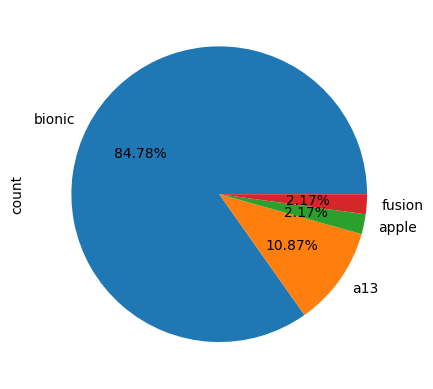

In [219]:
df[df['brand_name'] == 'apple']['processor_brand'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
plt.show()

In [220]:
# 84.78% of apple devices have bionic processors.
# followed by a13 which is used in 10.87% of apple smartphones as processor.
# remaining models are equally split between 'apple' and 'fusion' brand processors.
# These four brands exclusively used only for 'apple' brand they are not used in any other brands.

In [221]:
ab_df = df[(df['processor_brand'] != 'bionic') & (df['brand_name'] == 'apple')]
pd.crosstab(ab_df['processor_brand'],ab_df['brand_name'])

brand_name,apple
processor_brand,
a13,5
apple,1
fusion,1


In [222]:
# 43.57% of android model smarphones use snapdragon processors
# 41.62% of smartphone models use snapdragon processors
pd.crosstab(df['processor_brand'] == 'snapdragon',df['os'])

os,Android,Other,iOS
processor_brand,,,
False,473,3,46
True,356,5,0


In [223]:
# 87.27% of Android smartphones are from any of these three brands snapdragon, helio and dimensity.
# 82.56% of smartphones are from any of these  brands snapdragon, helio and dimensity.

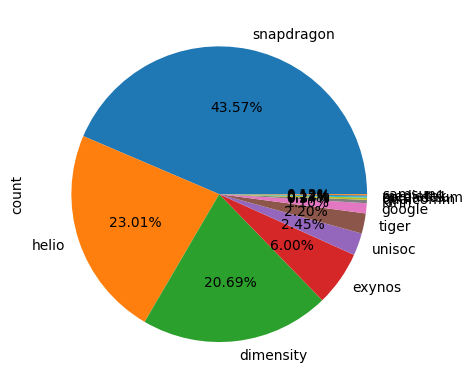

In [224]:
# only Android
df[df['os'] == 'Android']['processor_brand'].value_counts().plot(kind = 'pie', autopct = '%.2f%%');

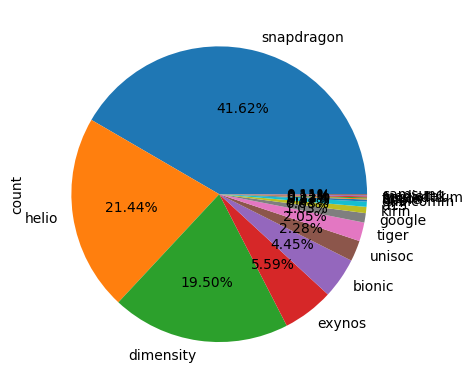

In [225]:
df['processor_brand'].value_counts().plot(kind = 'pie', autopct = '%.2f%%');

In [226]:
# 23.01% of Android model smartphones in the dataset use 'helio' brand processors.
# 21.44% of smartphones use 'helio' brand processors.
pd.crosstab(df['processor_brand'] == 'helio',df['os'])

os,Android,Other,iOS
processor_brand,,,
False,641,8,46
True,188,0,0


In [227]:
# 20.69% of Android model smartphones in the dataset use 'dimensity' brand processors.
# 19.50% of smartphones use 'dimensity' brand processors.
pd.crosstab(df['processor_brand'] == 'dimensity',df['os'])

os,Android,Other,iOS
processor_brand,,,
False,660,8,46
True,169,0,0


In [228]:
# 87.27% of Android smartphones are from any of these three brands snapdragon, helio, dimensity

In [229]:
# 6.00% of Android model smartphones in the dataset use helio brand processors.
# 5.59% of smartphones use helio brand processors.
pd.crosstab(df['processor_brand'] == 'exynos',df['os'])

os,Android,Other,iOS
processor_brand,,,
False,780,8,46
True,49,0,0


In [230]:
pd.crosstab(df['processor_brand'] == 'snapdragon',df['brand_name'])

brand_name,apple,google,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
processor_brand,,,,,,,,,,,,,,,,
False,46,10,3,7,29,2,15,6,11,46,25,65,96,33,63,68
True,0,4,10,7,0,30,37,7,31,42,16,32,36,0,48,65


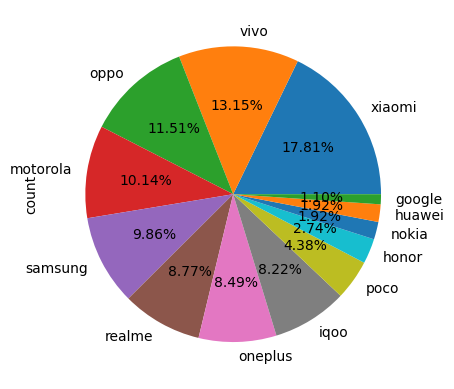

In [231]:
snapdragon_brands = df[df['processor_brand'] == 'snapdragon']['brand_name'].value_counts()
df[df['processor_brand'] == 'snapdragon']['brand_name'].value_counts().plot(kind = 'pie', autopct = '%.2f%%');

In [232]:
# 81.25% of smartphone brands use snapdragon processors. 

count = 0
for i in snapdragon_brands:
    count += 1
print('snapdragon_brands count: ',count)

count2 = 0
for i in df['brand_name'].value_counts():
    count2 += 1
print('Total brand names count: ',count2)

print('smartphone brands use snapdragon processors: ', round(count/count2 * 100, 2))

# 62.5% of smartphone brands use helio processors.
count3 = 0
for i in df[df['processor_brand'] == 'helio']['brand_name'].value_counts():
    count3 += 1
print('helio brand count: ', count3)

print('smartphone brands use helio processors: ', round(count3/count2 * 100, 2))

# 75.0% of smartphone brands use dimensity processors.
count4 = 0
for i in df[df['processor_brand'] == 'dimensity']['brand_name'].value_counts():
    count4 += 1
print('dimensity brand count: ', count4)

print('smartphone brands use dimensity processors:', round(count4/count2 * 100, 2))

# 6.25% of smartphone brands use exynos processors.
# There is only one brand which uses exynos processor that is samsung.
count5 = 0
for i in df[df['processor_brand'] == 'exynos']['brand_name'].value_counts():
    count5 += 1
print('exynos brand count: ', count5)

print('smartphone brands use exynos processors: ', round(count5/count2 * 100, 2))

snapdragon_brands count:  13
Total brand names count:  16
smartphone brands use snapdragon processors:  81.25
helio brand count:  10
smartphone brands use helio processors:  62.5
dimensity brand count:  12
smartphone brands use dimensity processors: 75.0
exynos brand count:  1
smartphone brands use exynos processors:  6.25


<AxesSubplot: ylabel='count'>

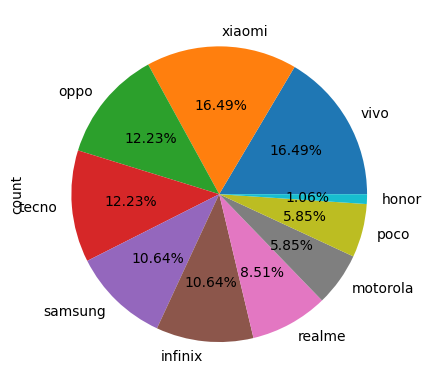

In [233]:
df[df['processor_brand'] == 'helio']['brand_name'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')

In [234]:
pd.reset_option('display.max_rows',None)
pd.reset_option('display.max_columns',None)

In [235]:
pd.crosstab(df['processor_brand'] == 'a13',df['brand_name'])

brand_name,apple,google,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
processor_brand,,,,,,,,,,,,,,,,
False,41,14,13,14,29,32,52,13,42,88,41,97,132,33,111,133
True,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


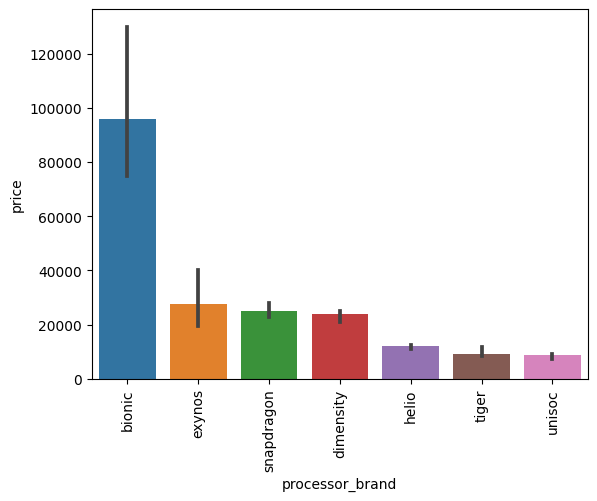

In [236]:
processor_brands_count = df['processor_brand'].value_counts()
processor_brands_to_keep = processor_brands_count[processor_brands_count>10].index
processor_df = df[df['processor_brand'].isin(processor_brands_to_keep)]
processor_avg_price = processor_df.groupby('processor_brand')['price'].median().sort_values(ascending = False)
sorted_processors = processor_avg_price.index.tolist()

# bar plot
sns.barplot(data = processor_df,x = 'processor_brand',y = 'price',estimator = np.median,order = sorted_processors)
plt.xticks(rotation = 'vertical');
# Upon investigation, it was discovered that  Bionic brand processors are substantially pricier 
# compared processors from other brands. Notably, Apple exclusively utilizes Bionic brand processors, although 
# it incorporates other processor types, albeit in minimal quantities

In [237]:
# processor_brand x brand_name
# contingency table
pd.crosstab(df['processor_brand'],df['brand_name'])

brand_name,apple,google,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
processor_brand,,,,,,,,,,,,,,,,
a13,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
apple,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
bionic,39,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
dimensity,0,0,1,0,6,2,2,0,11,23,14,27,11,6,32,36
exynos,0,0,0,0,0,0,0,0,0,0,0,0,49,0,0,0
fusion,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
google,0,9,0,0,0,0,0,0,0,0,0,0,0,0,0,0
helio,0,0,2,0,20,0,11,0,0,23,11,16,20,23,31,31
kirin,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0


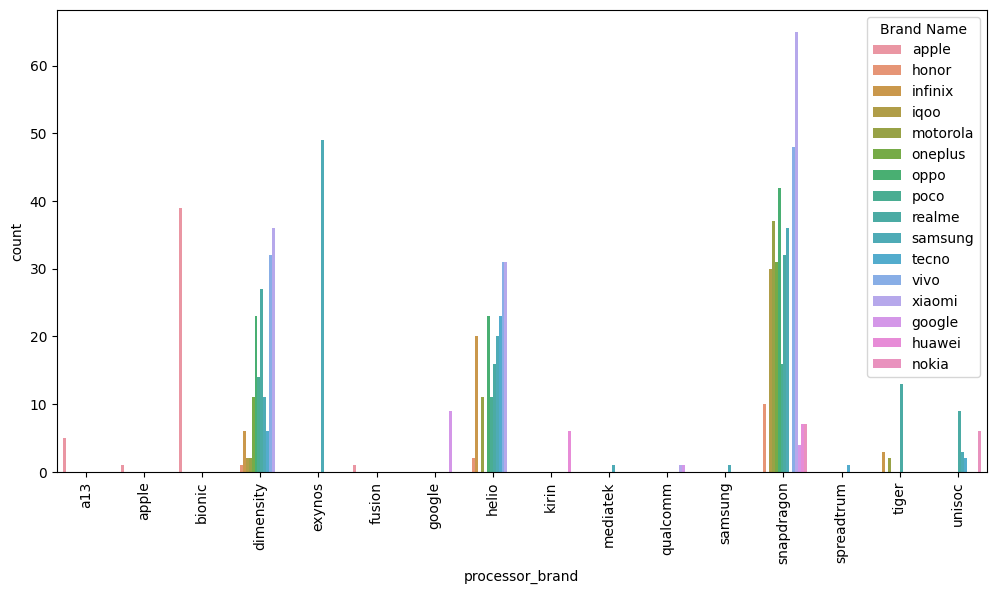

In [238]:
# Clustered Bar Chart
counts = df.groupby(['processor_brand', 'brand_name']).size().reset_index(name = 'count')


plt.figure(figsize = (12,6))
sns.barplot(data = counts, x = 'processor_brand', y = 'count', hue = 'brand_name')
plt.xticks(rotation = 'vertical')
plt.legend(title = "Brand Name")
plt.show()

# First density is at 'snapdragon'. Followed by 'dimensity'. followed by 'helio'.

In [239]:
contingency_table = pd.crosstab(df['brand_name'],df['processor_brand'])

chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print('\n Chi-Square Statistics: {:.2f}'.format(chi2))
print('p-value: {:.4f}'.format(p_value))
print('Degrees of Freedom: {}'.format(dof))
print('Expected Frequency: {}'.format(expected))

alpha = 0.5
if p_value < alpha:
    print('\n we reject the null hypothesis. There is a significant association betweeen brand_name and processor_brand columns with P-value: {:.4f}'.format(p_value))
else:
    print('\n we fail to reject the null hypothesis. There is not significant association between brand_name and processor_brand columnswith P-value: {:.4f}'.format(p_value))


 Chi-Square Statistics: 2658.43
p-value: 0.0000
Degrees of Freedom: 225
Expected Frequency: [[2.62257697e-01 5.24515393e-02 2.04561003e+00 8.96921323e+00
  2.57012543e+00 5.24515393e-02 4.72063854e-01 9.86088940e+00
  3.14709236e-01 5.24515393e-02 1.04903079e-01 5.24515393e-02
  1.91448119e+01 5.24515393e-02 9.44127708e-01 1.04903079e+00]
 [7.98175599e-02 1.59635120e-02 6.22576967e-01 2.72976055e+00
  7.82212087e-01 1.59635120e-02 1.43671608e-01 3.00114025e+00
  9.57810718e-02 1.59635120e-02 3.19270239e-02 1.59635120e-02
  5.82668187e+00 1.59635120e-02 2.87343216e-01 3.19270239e-01]
 [7.41163056e-02 1.48232611e-02 5.78107184e-01 2.53477765e+00
  7.26339795e-01 1.48232611e-02 1.33409350e-01 2.78677309e+00
  8.89395667e-02 1.48232611e-02 2.96465222e-02 1.48232611e-02
  5.41049031e+00 1.48232611e-02 2.66818700e-01 2.96465222e-01]
 [7.41163056e-02 1.48232611e-02 5.78107184e-01 2.53477765e+00
  7.26339795e-01 1.48232611e-02 1.33409350e-01 2.78677309e+00
  8.89395667e-02 1.48232611e-02 2.96

In [240]:
# Chi-Square Test

# - The code provided above calculates the chi-square statistic, p-value, degrees of freedom, and expected frequencies for the 
#   association between the processor brand and the brand name. This is done using the chi-square test of independence.

# - The chi-square statistic measures the difference between the observed and expected frequencies. A higher chi-square value
#   indicates a greater difference, suggesting that there may be a significant association between the variables.

# - The p-value associated with the chi-square test indicates the probability of observing such an extreme result if the 
#   variables were not related. A small p-value (close to 0) suggests that there is a significant association between the
#   variables.

# - The degrees of freedom represent the number of independent observations in the data. It is calculated as (number of rows
#   - 1) * (number of columns - 1) for a contingency table.

# - The expected frequencies represent the frequencies that would be expected under the null hypothesis of no association
#   between the variables.

# - Overall, the output suggests that there is a significant association between the processor brand and the brand name, as 
#   indicated by the low p-value (0.0).

In [241]:
# Cramer's V test
contingency_table = pd.crosstab(df['num_rear_cameras'],df['brand_name'])

# Compute Cramer's V
chi2, p_value, _, _ = stats.chi2_contingency(contingency_table)
n = contingency_table.sum().sum()
min_dim = min(contingency_table.shape)
cramers_v = np.sqrt(chi2/(n*(min_dim - 1)))

print("Cramer's V: ",cramers_v)
print("p-value: ",p_value)

# - The code you provided calculates Cramer's V for the association between the number of rear cameras and the brand name.
#   Cramer's V is a measure of association between two nominal variables, similar to Pearson's correlation coefficient for
#   continuous variables.

# - The interpretation of Cramer's V is similar to other correlation coefficients:

#     - Values close to 0 indicate no association between variables.
#     - Values close to 1 indicate a strong association.

# - In this case, Cramer's V is approximately 0.297, indicating a moderate association between the number of rear cameras and
#   the brand name.

# - The p-value associated with the chi-square test indicates the statistical significance of the association. In this case,
#   the p-value is very small (9.77e-28), indicating that the association is statistically significant.

# - Overall, these results suggest that there is a moderate association between the number of rear cameras and the brand name,
#   and this association is statistically significant.

Cramer's V:  0.29736818471910337
p-value:  9.76766834857627e-28


In [242]:
# 7 x 24
# processor_brand x os
pd.crosstab(df['processor_brand'],df['os'])
# The processor brands used by android smartphones and iOS smarphones are different.

os,Android,Other,iOS
processor_brand,,,
a13,0,0,5
apple,0,0,1
bionic,0,0,39
dimensity,169,0,0
exynos,49,0,0
fusion,0,0,1
google,9,0,0
helio,188,0,0
kirin,3,2,0


<AxesSubplot: ylabel='count'>

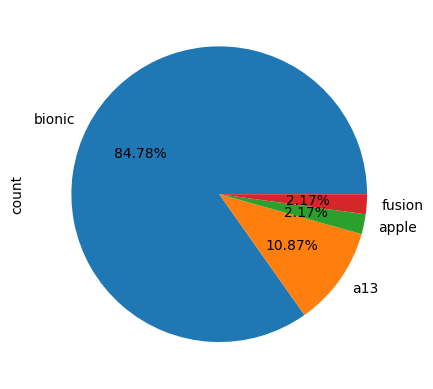

In [243]:
df[df['os'] == 'iOS']['processor_brand'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
# 84.78% of apple devices have bionic processors.followed by a13 which is used in 10.87% of apple smartphones as processor.
# remaining models are equally split between 'apple' and 'fusion' brand processors.


<AxesSubplot: ylabel='count'>

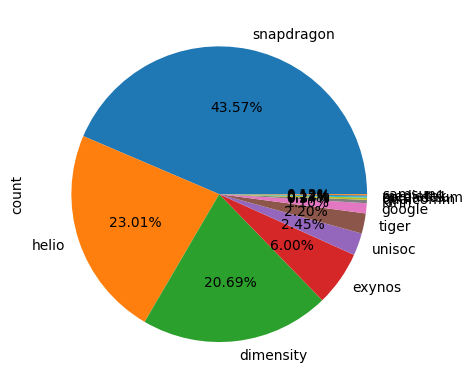

In [244]:
df[df['os'] == 'Android']['processor_brand'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
# 43.57% of android model smarphones use snapdragon processors.
# 23.01% of Android model smartphones in the dataset use 'helio' brand processors.
# 20.69% of Android model smartphones in the dataset use 'dimensity' brand processors.
# 6.00% of Android model smartphones in the dataset use helio brand processors.

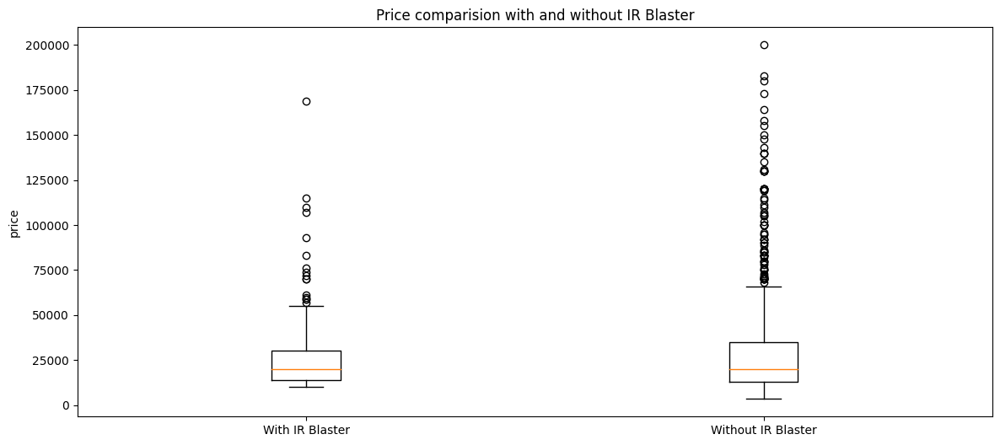

In [245]:
# Bivariate Analysis
# 6 x 2
# has_ir_blaster x price

with_ir = df[df['has_ir_blaster'] == True]['price']
without_ir = df[df['has_ir_blaster'] == False] ['price']

plt.figure(figsize = (14,6))
plt.boxplot([with_ir, without_ir], labels = ['With IR Blaster','Without IR Blaster'])
plt.ylabel('price')
plt.title('Price comparision with and without IR Blaster')
plt.show()

# in both with and without ir_blaster the distribution is right skewed with outliers
# Both categories (with and without IR blaster) have a similar median price of 19,990.0 rupees, indicating that half of 
# the items in each category fall below this price.

# without ir_blaster has more outliers and a standard deviation value of price 30261.199971.
# with an IQR of price 13139.0 - 34999.0
# and a min-max price range of 3499.00 - 199990.00

# whereas the std value with ir_blaster price is 23306.31
# with an IQR of price 13999.00 - 30494.5
# and a min-max price range of 9990.00 - 169000.00

# price is not effected by the ir_blaster feature.
# 17.42% of brands in the dataset have smartphone models with ir_blaster feature.


In [246]:
df[df['has_ir_blaster'] == True]['brand_name'].value_counts()
# as you can see in output it is provided only in chinese phones except for 1 smartphone which belongs to samsung
# xiaomi is the number one brand in smartphones with ir_blaster feature with 70.32% of smartphones with ir_blaster feature
# belongs to xiaomi

brand_name
xiaomi     109
poco        30
iqoo         6
vivo         4
huawei       4
honor        1
samsung      1
Name: count, dtype: int64

<AxesSubplot: ylabel='count'>

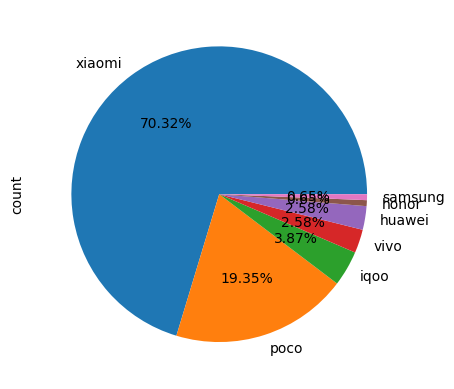

In [247]:
df[df['has_ir_blaster'] == True]['brand_name'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')

<AxesSubplot: xlabel='has_ir_blaster', ylabel='price'>

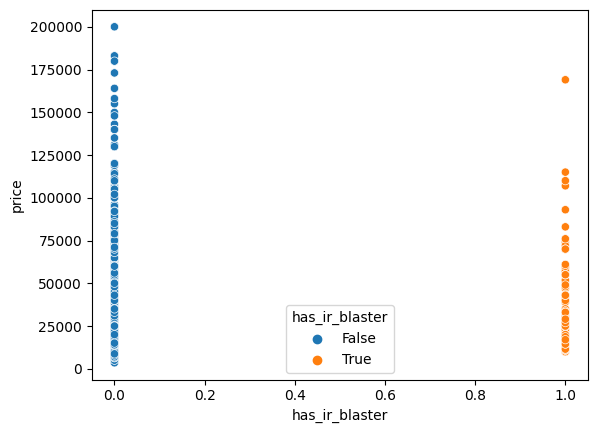

In [248]:
sns.scatterplot(data = df, x = 'has_ir_blaster', y = 'price', hue = 'has_ir_blaster')

<AxesSubplot: >

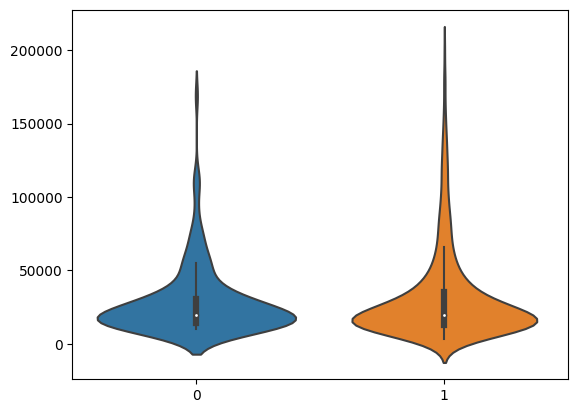

In [249]:
sns.violinplot(data = [with_ir, without_ir])
# distribution is similar for both categories

In [250]:
from scipy.stats import shapiro
# Shapiro-Wilk test for normality of has_ir_blaster
statistics,p_value = shapiro(df['has_ir_blaster'])
print('Shapiro-Wilk test for normality of \'has_ir_blaster\': ')
print('Test Statistic: ',statistics)
print('p-value: ',p_value)

if p_value<0.05:
    print("The variable 'has_ir_blaster' is not normally distributed")
else:
    print("The variable 'has_ir_blaster' appears to be normally distributed")

Shapiro-Wilk test for normality of 'has_ir_blaster': 
Test Statistic:  0.45906853675842285
p-value:  1.401298464324817e-45
The variable 'has_ir_blaster' is not normally distributed


In [251]:
# Shapiro-Wilk test for normality of price
statistics,p_value = shapiro(df['price'])
print('Shapiro-Wilk test for normality of price')
print('Test Statistic: ',statistics)
print('p-value',p_value)

if p_value<0.05:
    print("The variable 'price' is not normally distributed")
else:
    print("The variable 'price' appears to be normally distributed")

Shapiro-Wilk test for normality of price
Test Statistic:  0.7056530714035034
p-value 8.954774301136714e-37
The variable 'price' is not normally distributed


In [252]:
# If both has_ir_blaster and price are not normally distributed, it's essential to acknowledge that the interpretation of the 
# correlation coefficient and its significance may be affected. When dealing with non-normally distributed data, it's generally 
# recommended to use non-parametric correlation measures or alternative statistical tests.

# For instance, you could consider using Spearman's rank correlation coefficient, which is a non-parametric measure of 
# correlation that assesses the monotonic relationship between two variables. Spearman's correlation coefficient does not 
# assume normality and is robust to outliers.

# By using Spearman's correlation coefficient and assessing its significance, you can gain insights into the strength and 
# direction of the monotonic relationship between the variables has_ir_blaster and price, without relying on the assumption of 
# normality.

from scipy.stats import spearmanr

# population data in the DataFrame df with columns 'has_ir_blaster' and 'price'
# Calculate Spearman's rho
rho, p_value = spearmanr(df['has_ir_blaster'], df['price'])

print("Spearman's rho:", rho)
print("P-value:", p_value)

# Spearman's rho measures the strength and direction of the monotonic relationship between the variables. In this case, the 
# coefficient is close to zero (0.016), indicating a very weak positive monotonic relationship.

# The p-value associated with the correlation coefficient is 0.6279, which is greater than the typical significance level of 
# 0.05. Therefore, we fail to reject the null hypothesis, suggesting that there is insufficient evidence to conclude that there
# is a significant monotonic relationship between has_ir_blaster and price.

# It's important to note that Spearman's correlation coefficient is robust to non-normality and outliers, making it a suitable
# measure for assessing the relationship between variables when normality assumptions are violated.


Spearman's rho: 0.016266102777007612
P-value: 0.6279497818680928


In [253]:
# summary statistics
summary_stats = df.groupby('has_ir_blaster')['price'].describe()
print(summary_stats)

                count         mean           std     min      25%      50%  \
has_ir_blaster                                                               
False           735.0  31172.50068  30261.199971  3499.0  13139.0  19990.0   
True            155.0  28407.23871  23306.306621  9990.0  13999.0  19990.0   

                    75%       max  
has_ir_blaster                     
False           34999.0  199990.0  
True            30494.5  169000.0  


C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<AxesSubplot: xlabel='price', ylabel='Density'>

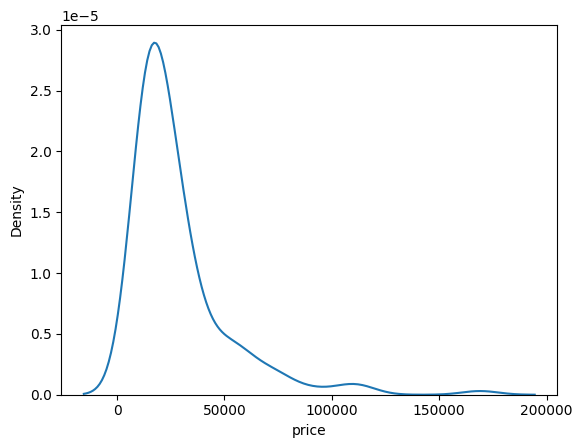

In [254]:
sns.kdeplot(data = with_ir)

In [255]:
with_ir.skew()

2.7783015934187514

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<AxesSubplot: xlabel='price', ylabel='Density'>

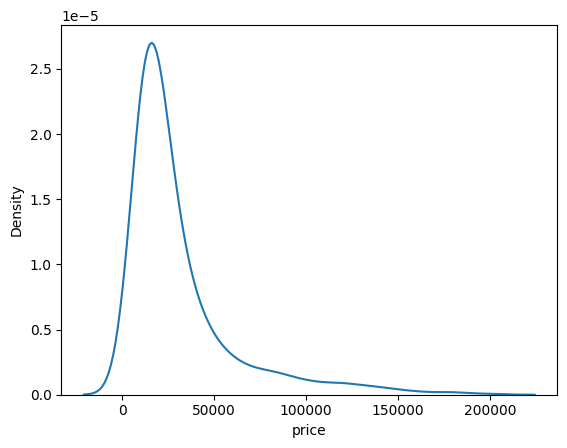

In [256]:
sns.kdeplot(data = without_ir)

In [257]:
without_ir.skew()

2.417535568555707

In [258]:
# has_ir_blaster x brand_name
pd.crosstab(df['has_ir_blaster'],df['brand_name'])

brand_name,apple,google,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
has_ir_blaster,,,,,,,,,,,,,,,,
False,46,14,12,10,29,26,52,13,42,88,11,97,131,33,107,24
True,0,0,1,4,0,6,0,0,0,0,30,0,1,0,4,109


In [259]:
# except for one smartphone from samsung remaining every smartphone in dataset belongs to chinese brands
# Among smartphones with ir_blaster feature xiaomi is in first place with 70.32% followed by poco with 19.35% both of them
# adds upto 89.67% of all smartphones with ir_blaster feature
df[df['has_ir_blaster'] == True]['brand_name'].value_counts()

brand_name
xiaomi     109
poco        30
iqoo         6
vivo         4
huawei       4
honor        1
samsung      1
Name: count, dtype: int64

<AxesSubplot: ylabel='count'>

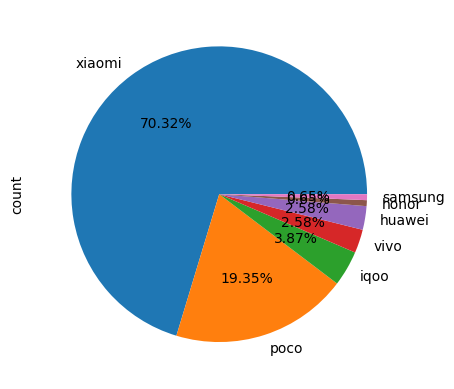

In [260]:
df[df['has_ir_blaster'] == True]['brand_name'].value_counts().plot(kind = 'pie',autopct = '%.2f%%')

In [261]:
count = 0
for i in df[df['has_ir_blaster'] == True]['brand_name'].value_counts():
    count += 1
print('number of brands with ir_blaster feature: ',count)

count2 = 0
for i in df['brand_name'].value_counts():
    count2 += 1
print('total number of brands in dataset: ',count2)

print('percentage of smartphone brands with ir_blaster feature:',round((count/count2)*100,2))

number of brands with ir_blaster feature:  7
total number of brands in dataset:  16
percentage of smartphone brands with ir_blaster feature: 43.75


In [262]:
# has_ir_blaster x price
# in both with and without ir_blaster the distribution is right skewed with outliers
# Both categories (with and without IR blaster) have a similar median price of 19,990.0 rupees, indicating that half of 
# the items in each category fall below this price.

# without ir_blaster has more outliers and a standard deviation value of price 30261.199971.
# with an IQR of price 13139.0 - 34999.0
# and a min-max price range of 3499.00 - 199990.00

# whereas the std value with ir_blaster price is 23306.31
# with an IQR of price 13999.00 - 30494.5
# and a min-max price range of 9990.00 - 169000.00


# price is not effected by the ir_blaster feature.
# 17.42% of brands in the dataset have smartphone models with ir_blaster feature.


# However, after thorough examination, it can be concluded that these higher prices are genuine values and not outliers.
# after observing violin plot we can see that the distribution is similar for both the plots

# Shapiro-Wilk test for normality of has_ir_blaster result The variable 'has_ir_blaster' is not normally distributed
# Shapiro-Wilk test for normality of has_ir_blaster result The variable 'price' is not normally distributed
# Spearman's rho: we fail to reject the null hypothesis, suggesting that there is insufficient evidence to conclude that there
#                 is a significant monotonic relationship between has_ir_blaster and price.

# has_ir_blaster x brand_name
# percentage of smartphone brands with ir_blaster feature: 43.75%
# except for one smartphone from samsung remaining every smartphone in dataset belongs to chinese brands
# Among smartphones with ir_blaster feature xiaomi is in first place with 70.32% followed by poco with 19.35% both of them
# adds upto 89.67% of all smartphones with ir_blaster feature

# has_ir_blaster x os
# Total number of Android models with ir_blaster feature:  18.21 %
# Total number of iOS models with ir_blaster feature:  0.0 %

in both with and without ir_blaster the distribution is right skewed with outliers
Both categories (with and without IR blaster) have a similar median price of 19,990.0 rupees, indicating that half of
the items in each category fall below this price.


without ir_blaster has more outliers and a standard deviation value of price 30261.199971.
with an IQR of price 13139.0 - 34999.0
and a min-max price range of 3499.00 - 199990.00


whereas the std value with ir_blaster price is 23306.31
with an IQR of price 13999.00 - 30494.5
and a min-max price range of 9990.00 - 169000.00




price is not effected by the ir_blaster feature.
17.42% of brands in the dataset have smartphone models with ir_blaster feature.




However, after thorough examination, it can be concluded that these higher prices are genuine values and not outliers.
after observing violin plot we can see that the distribution is similar for both the plots


Shapiro-Wilk test for normality of has_ir_blaster result The variable 'has_ir_blaster' is not normally distributed
Shapiro-Wilk test for normality of has_ir_blaster result The variable 'price' is not normally distributed
Spearman's rho: we fail to reject the null hypothesis, suggesting that there is insufficient evidence to conclude that there
            	is a significant monotonic relationship between has_ir_blaster and price.


has_ir_blaster x brand_name:
percentage of smartphone brands with ir_blaster feature: 43.75%
except for one smartphone from samsung remaining every smartphone in dataset belongs to chinese brands
Among smartphones with ir_blaster feature xiaomi is in first place with 70.32% followed by poco with 19.35% both of them
adds upto 89.67% of all smartphones with ir_blaster feature


has_ir_blaster x os:
Total number of Android models with ir_blaster feature:  18.21 %
Total number of iOS models with ir_blaster feature:  0.0 % 


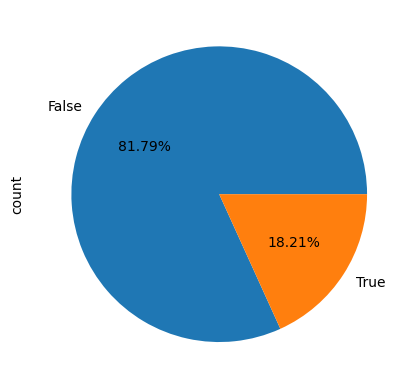

In [263]:
df[df['os'] == 'Android']['has_ir_blaster'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
plt.show()
# Total number of Android models with ir_blaster feature:  18.21 %

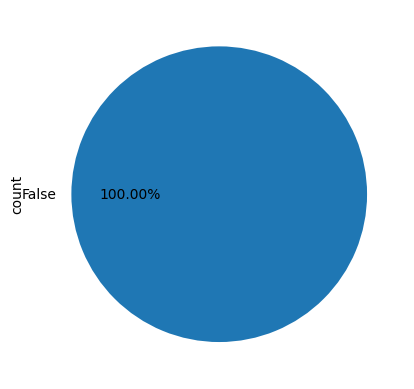

In [264]:
df[df['os'] == 'iOS']['has_ir_blaster'].value_counts().plot(kind = 'pie', autopct = '%.2f%%');
# Total number of iOS models with ir_blaster feature:  0.0 %

In [265]:
df.groupby('brand_name')['price'].mean().sort_values(ascending = False)

brand_name
apple       95707.804348
huawei      55704.071429
google      44332.571429
samsung     36843.030303
oneplus     35858.571429
iqoo        30301.875000
honor       30301.846154
oppo        29650.034091
vivo        26782.387387
nokia       24630.769231
xiaomi      24562.323308
motorola    24099.923077
poco        18479.195122
realme      17461.422680
infinix     14664.793103
tecno       14545.363636
Name: price, dtype: float64

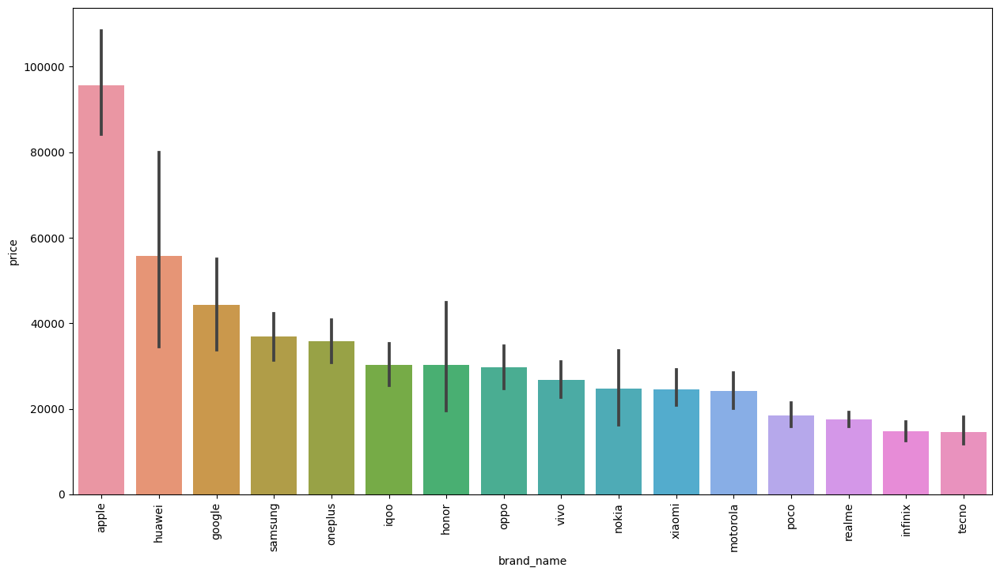

In [266]:
# Bivariate analysis
# 0x2
# brand_name x price

brand_avg_price = df.groupby('brand_name')['price'].mean().sort_values(ascending = False)
sorted_brands = brand_avg_price.index.tolist()

plt.figure(figsize = (15,8))
sns.barplot(data = df,x = 'brand_name',y = 'price',order = sorted_brands)
plt.xticks(rotation = 'vertical');



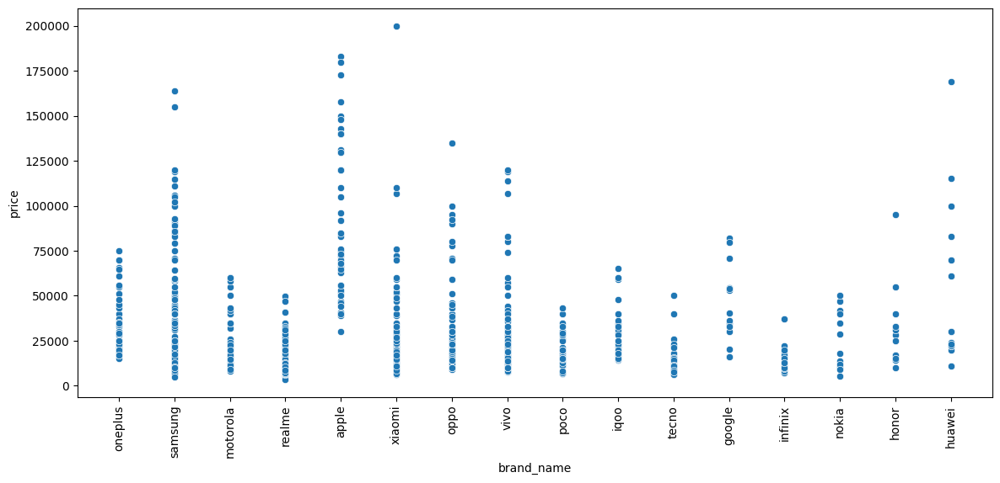

In [267]:
plt.figure(figsize = (14,6))
sns.scatterplot(data=df, x='brand_name', y='price')
plt.xticks(rotation = 'vertical');

In [268]:
df.groupby([df['brand_name'] == 'apple'])['price'].describe()

,count,mean,std,min,25%,50%,75%,max
brand_name,,,,,,,,
False,844.0,27147.335308,23578.109038,3499.0,12999.0,18999.5,30990.0,199990.0
True,46.0,95707.804348,42969.428879,29990.0,57749.0,84994.5,129990.0,182999.0


In [269]:
df.groupby('brand_name')['price'].describe().sort_values(by = 'max', ascending = False)

,count,mean,std,min,25%,50%,75%,max
brand_name,,,,,,,,
xiaomi,133.0,24562.323308,23372.940857,6171.0,12390.00,17859.0,26999.0,199990.0
apple,46.0,95707.804348,42969.428879,29990.0,57749.00,84994.5,129990.0,182999.0
huawei,14.0,55704.071429,46607.610365,10949.0,22240.00,29990.0,79740.0,169000.0
samsung,132.0,36843.030303,33093.518568,4999.0,14496.75,22746.5,44249.0,163980.0
oppo,88.0,29650.034091,23836.399272,8999.0,15367.25,20494.5,32243.0,134999.0
vivo,111.0,26782.387387,23067.105535,7499.0,13244.00,19990.0,29990.0,119990.0
honor,13.0,30301.846154,23204.339145,9999.0,14990.00,24990.0,32990.0,94990.0
google,14.0,44332.571429,22096.844104,15990.0,30749.00,38240.0,54222.5,81999.0
oneplus,42.0,35858.571429,16852.940132,14999.0,22246.75,29994.5,44999.0,74999.0


In [270]:
df.groupby('brand_name')['price'].describe().sort_values(by = 'min', ascending = True)

,count,mean,std,min,25%,50%,75%,max
brand_name,,,,,,,,
realme,97.0,17461.422680,9085.038975,3499.0,10990.00,14999.0,22998.0,49959.0
samsung,132.0,36843.030303,33093.518568,4999.0,14496.75,22746.5,44249.0,163980.0
nokia,13.0,24630.769231,16277.267134,5249.0,10499.00,17990.0,39990.0,49990.0
xiaomi,133.0,24562.323308,23372.940857,6171.0,12390.00,17859.0,26999.0,199990.0
tecno,33.0,14545.363636,9497.123673,6249.0,8799.00,11499.0,15999.0,49999.0
poco,41.0,18479.195122,9236.939545,6499.0,12799.00,14999.0,24990.0,42999.0
infinix,29.0,14664.793103,6093.395355,6999.0,9999.00,12999.0,17999.0,36999.0
vivo,111.0,26782.387387,23067.105535,7499.0,13244.00,19990.0,29990.0,119990.0
motorola,52.0,24099.923077,15207.864129,7990.0,12749.00,19744.5,32740.0,59999.0


    Apple:
        Mean Price: 95,707.80
        Median Price: 84,994.50
        Minimum Price: 29,990.00 (highest minimum price)
        Maximum Price: 182,999.00 (second highest maximum price)
        Standard Deviation: 42,969.43 (second highest)
        Distribution: Heavily right-skewed with outliers.

    Huawei:
        Mean Price: 55,704.07
        Median Price: 29,990.00
        Minimum Price: 10,949.00 (fifth highest minimum price)
        Maximum Price: 169,000.00 (third highest maximum price)
        Standard Deviation: 46,607.61 (highest)
        Distribution: Heavily right-skewed with outliers.

    Google:
        Mean Price: 44,332.57
        Median Price: 38,240.00
        Minimum Price: 15,990.00 (second highest minimum price)
        Maximum Price: 81,999.00
        Standard Deviation: N/A (right-skewed without outliers)
        Distribution: Right-skewed without outliers.

    Samsung:
        Mean Price: 36,843.03
        Median Price: 22,746.50
        Minimum Price: 4,999.00 (second lowest minimum price)
        Maximum Price: 163,980.00 (fourth highest maximum price)
        Standard Deviation: 33,093.52 (third highest)
        Distribution: Highly right-skewed with outliers.

    Oppo:
        Mean Price: 29,650.03
        Median Price: 20,494.50
        Minimum Price: 8,999.00
        Maximum Price: 134,999.00 (fifth highest maximum price)
        Standard Deviation: 23,836.40 (fourth highest)
        Distribution: Right-skewed.

    Vivo:
        Mean Price: 26,782.39
        Median Price: 19,990.00
        Minimum Price: 7,499.00
        Maximum Price: 119,990.00 (sixth highest maximum price)
        Standard Deviation: 23,067.11 (seventh highest)
        Distribution: Right-skewed.

    Xiaomi:
        Mean Price: 24,562.32
        Median Price: 17,859.00
        Minimum Price: 6,171.00 (fourth lowest minimum price)
        Maximum Price: 199,990.00 (highest maximum price)
        Standard Deviation: 23,372.94 (fifth highest)
        Distribution: Right-skewed.

In [271]:
df[df['brand_name'] == 'huawei']['brand_name'].count()

14

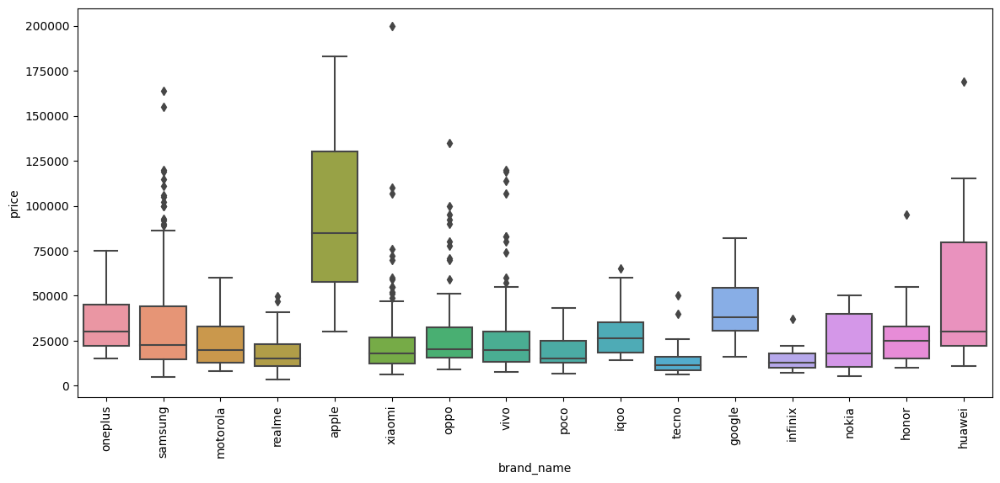

In [272]:
plt.figure(figsize = (14,6))
sns.boxplot(data = df,x = 'brand_name', y = 'price')
plt.xticks(rotation = 'vertical');

In [273]:
print(df[df['brand_name'] == 'apple']['price'].quantile(0.25) > df[df['brand_name'] == 'nokia']['price'].max())
print(df[df['brand_name'] == 'apple']['price'].median() > df[df['brand_name'] == 'google']['price'].max())
print(df[df['brand_name'] == 'apple']['price'].quantile(0.25) - df[df['brand_name'] == 'motorola']['price'].max())
print(df[df['brand_name'] == 'apple']['price'].quantile(0.25) > df[df['brand_name'] == 'samsung']['price'].quantile(0.75))

True
True
-2250.0
True


    - The minimum price of Apple smartphones surpasses the median price of 75% of brands in the dataset, indicating its
      premium pricing compared to the majority of brands.

    - Apple's median price exceeds the maximum price of 56.25% of brands in the dataset, underlining its position as a 
      high-end brand.

    - Apple stands out as the only brand with a wide dispersion of prices and no outliers, showcasing its consistent
      pricing strategy.

    - Nokia's price distribution falls within the lower range of the scale without any outliers. Its maximum price is
      even lower than the first quartile price of Apple smartphones, emphasizing its affordability.

    - Google's smartphones are priced in the lower to mid-range without any outliers. However, its maximum price is lower
      than the median price of Apple smartphones.

    - Motorola's smartphones are concentrated in the lower price range without outliers. Despite this, its maximum price
      exceeds the first quartile of Apple smartphones by 2250 rupees.

    - Samsung smartphones exhibit genuine outliers upon examination. Interestingly, Samsung's third quartile price is 
      lower than the first quartile price of Apple smartphones, suggesting varying pricing strategies.

    - All other brands in the dataset are Chinese brands positioned at the lower end of the price scale, with outliers 
      present in their distributions.

    - Among Chinese brands, Oppo, Vivo, and Xiaomi display extreme outliers, indicating variability in their pricing 
      strategies.

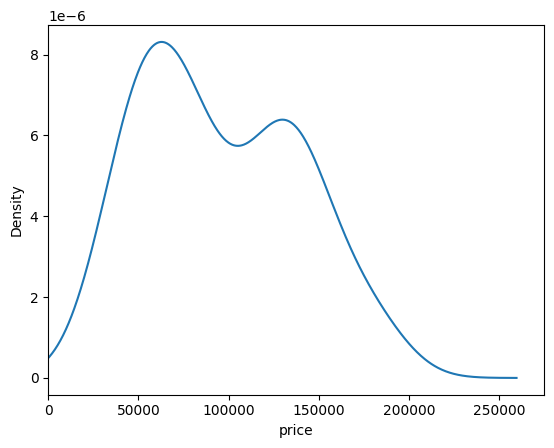

In [274]:
df[df['brand_name'] == 'apple']['price'].plot(kind = 'kde')
plt.xlim(left = 0)
plt.xlabel('price')
plt.show()

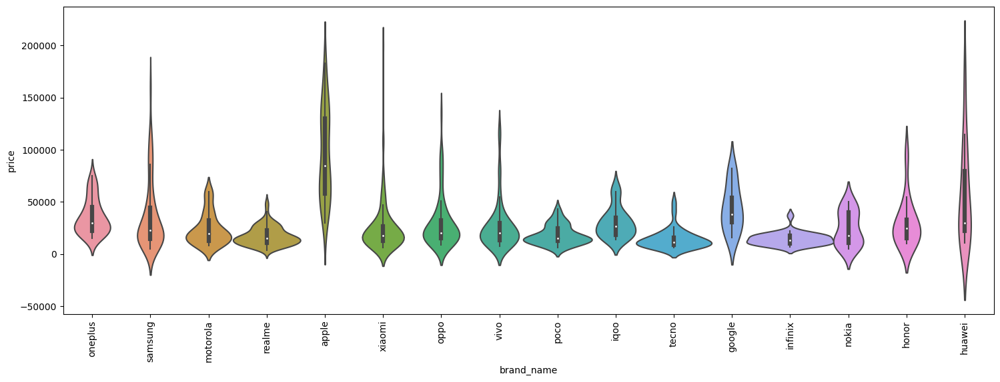

In [275]:
# violin plot
plt.figure(figsize = (18,6))
sns.violinplot(data = df,x = 'brand_name', y = 'price',width = 1.5)
plt.xticks(rotation = 'vertical');

In [276]:
apple_min_price = df[df['brand_name'] == 'apple']['price'].min()
Total_brands = df['brand_name'].value_counts().count()
count = 0

for brand, val_count in df['brand_name'].value_counts().items():
    if apple_min_price > df[df['brand_name'] == brand]['price'].median():
        count += 1
#         print(count,".",temp_df[temp_df['brand_name'] == brand]['price'].median())
        
#     else:
#         print(temp_df[temp_df['brand_name'] == brand]['price'].median())
        
print('count of brands whose price is median price is lessthan the minimum price of apple:',count)
print('Total number of brands:', Total_brands)
# print("apple minimum price:",apple_min_price)
print('Percentage of brands whose median price is lessthan apple brands minimum price',(count/Total_brands)*100)

count of brands whose price is median price is lessthan the minimum price of apple: 12
Total number of brands: 16
Percentage of brands whose median price is lessthan apple brands minimum price 75.0


In [277]:
apple_median = df[df['brand_name'] == 'apple']['price'].median()
Total_brands = df['brand_name'].nunique()
count = 0

for brand in df['brand_name'].unique():
    if apple_median > df[df['brand_name'] == brand]['price'].max():
        count += 1
print('count:',count)
print('Total:', Total_brands)
print('Percentage:',(count/Total_brands)*100)    

count: 9
Total: 16
Percentage: 56.25


In [278]:
# brand_name x os
pd.crosstab(df['brand_name'],df['os'])

# - With the exception of Apple, which exclusively employs the iOS operating system, all other smartphone brands utilize 
#   the Android operating system, highlighting the dominance of Android in the smartphone market.

# - Except for Apple, which exclusively employs the iOS operating system, all other smartphone brands utilize the Android
#   operating system, emphasizing Apple's uniqueness in the market with its exclusive OS.

os,Android,Other,iOS
brand_name,,,
apple,0,0,46
google,14,0,0
honor,13,0,0
huawei,5,7,0
infinix,29,0,0
iqoo,32,0,0
motorola,52,0,0
nokia,12,1,0
oneplus,42,0,0


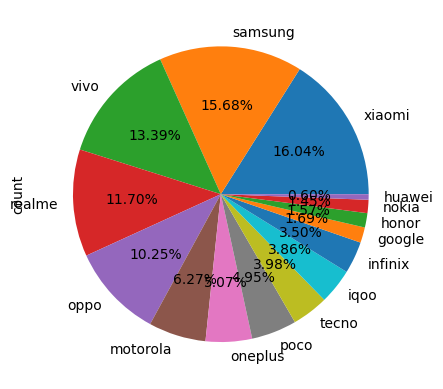

In [279]:
df[df['os'] == 'Android']['brand_name'].value_counts().plot(kind = 'pie', autopct = '%.2f%%');
# 67.06% of models with Android os belongs to top 5 brands
# highest is 'xiaomi' with 16.04%. Second highest is 'samsung' is with 15.68. Third highest is 'vivo' with 13.9%.
# Fourth highest is 'realme' with 11.70%. Fifth highest is 'oppo' with 10.25%.

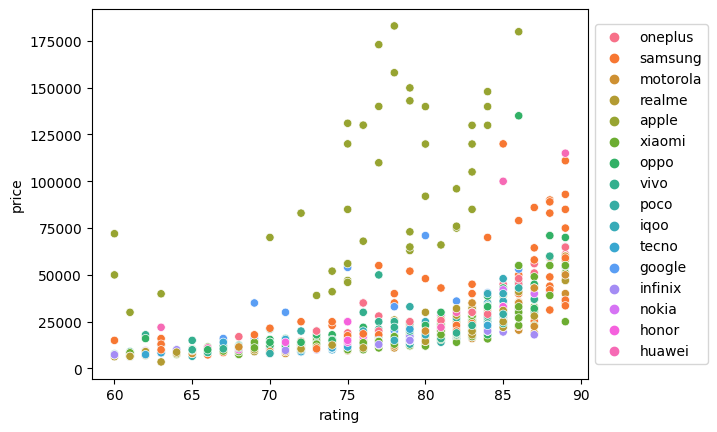

In [280]:
# rating x price
# 3x2
sns.scatterplot(data = df,x = 'rating',y = 'price',hue = 'brand_name')
plt.legend(loc = 'center left',bbox_to_anchor = (1,0.5))
plt.show()

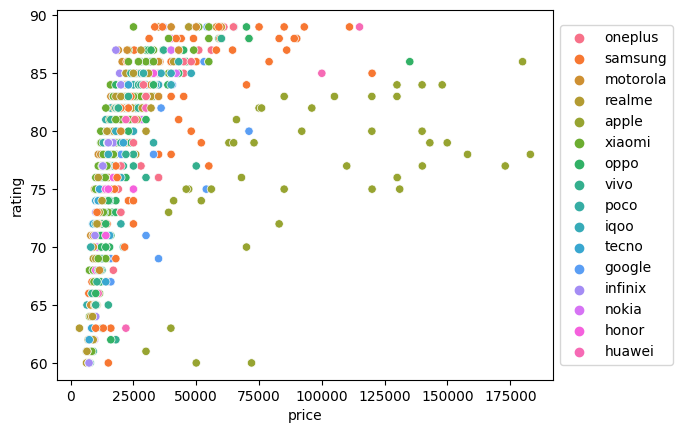

In [281]:
# Create a scatter plot with swapped x and y axes
sns.scatterplot(data=df, x='price', y='rating', hue='brand_name')

# Move the legend to the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Show the plot
plt.show()

In [282]:
filtered_df = df.dropna(subset = ['rating','price'])

rho,p_value = stats.spearmanr(filtered_df['rating'],filtered_df['price'])
print("Spearman's correlation coefficient: ",rho)
print("p-value:",p_value)

# - The Spearman's correlation coefficient of approximately 0.762 indicates a strong positive relationship between the
#   nominal discrete variable (ratings) and the continuous variable (prices). This means that as one variable (ratings) 
#   tends to increase, the other variable (prices) also tends to increase.

# - The extremely small p-value (approximately 1.2×10−1551.2×10−155) indicates that this relationship is statistically 
#   significant. In other words, it's highly unlikely to observe such a strong correlation if there were no true 
#   relationship between the variables.

# - Therefore, based on the analysis, we can conclude that there is a significant positive relationship between the ratings
#   and prices.

Spearman's correlation coefficient:  0.7623955761236529
p-value: 1.2005451021583984e-155


In [283]:
na_df = df[~(df['brand_name'] == 'apple')]


filtered_df = na_df.dropna(subset = ['rating','price'])

rho,p_value = stats.spearmanr(filtered_df['rating'],filtered_df['price'])
print("Spearman's correlation coefficient: ",rho)
print("p-value:",p_value)

# - The output from your code shows a Spearman's correlation coefficient of approximately 0.859 and a p-value of 
#   approximately 4.47×10−2254.47×10−225.

# - This indicates a very strong positive relationship between the ratings and prices in your filtered dataset. The
#   extremely small p-value suggests that this correlation is highly statistically significant, meaning it's highly 
#   unlikely to observe such a strong correlation if there were no true relationship between the variables.

# - Therefore, based on this analysis, it seems there is indeed a significant positive relationship between the ratings 
#   and prices in your filtered dataset.

Spearman's correlation coefficient:  0.8586133256296092
p-value: 4.4726981207638906e-225


In [284]:
#     - Increased Correlation Coefficient: The Spearman's correlation coefficient increased from approximately 0.762 to 
#       approximately 0.859 after removing Apple brand smartphones from the dataset. This increase in correlation coefficient
#       indicates a stronger positive relationship between the rating and price variables in the filtered dataset.

#     - Decreased P-value: The p-value decreased from approximately 1.2×10−1551.2×10−155 to approximately
#       4.47×10−2254.47×10−225 after removing Apple brand smartphones. A smaller p-value indicates greater statistical
#       significance. The p-value becoming even smaller suggests that the observed correlation between ratings and prices 
#       in the filtered dataset is highly unlikely to occur by random chance alone.

# Therefore, based on these results, it's reasonable to conclude that removing Apple brand smartphones from the dataset
# increases the correlation between the rating and price variables.

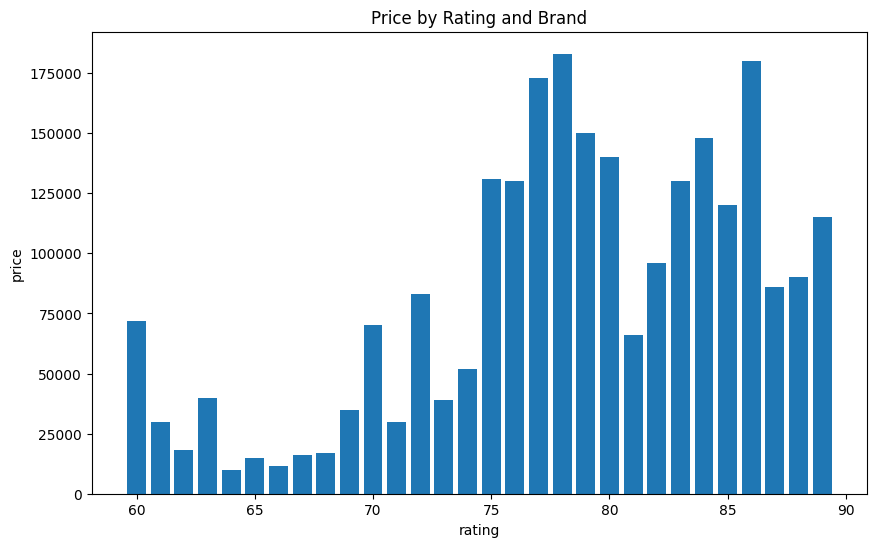

In [285]:
plt.figure(figsize=(10, 6))
plt.bar(x = df['rating'], height = df['price'])
plt.xlabel('rating')
plt.ylabel('price')
plt.title('Price by Rating and Brand')
plt.show();

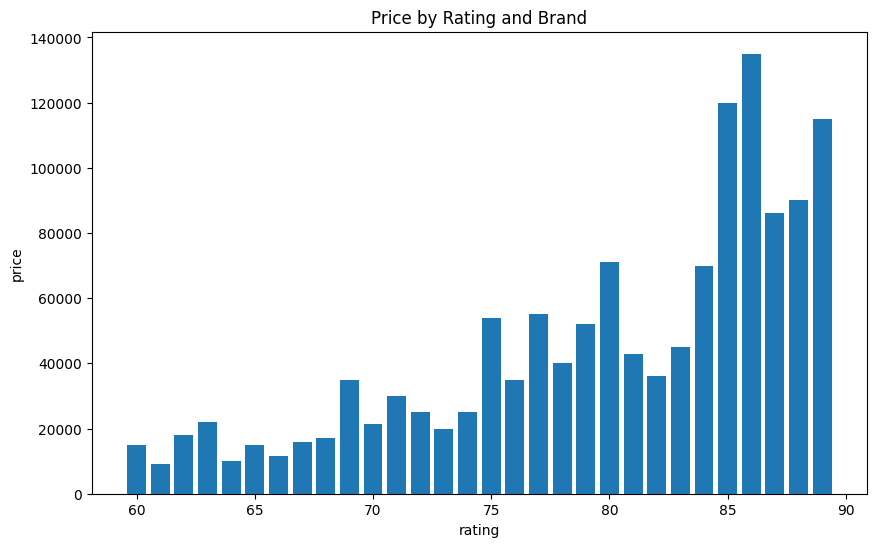

In [286]:
# without apple

plt.figure(figsize=(10, 6))
plt.bar(x = na_df['rating'], height = na_df['price'])
plt.xlabel('rating')
plt.ylabel('price')
plt.title('Price by Rating and Brand')
plt.show();

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


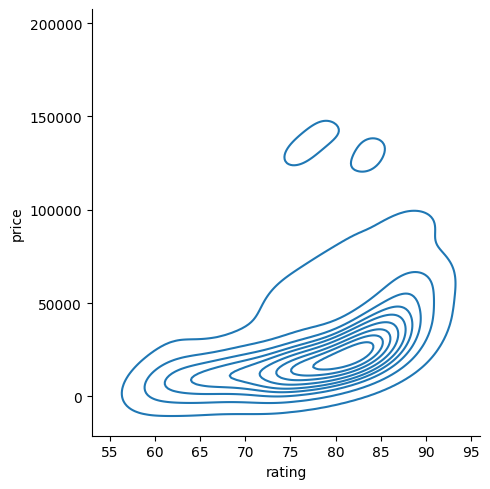

In [287]:
sns.displot(data=df, x='rating', y='price', kind='kde');
# density is around 81.

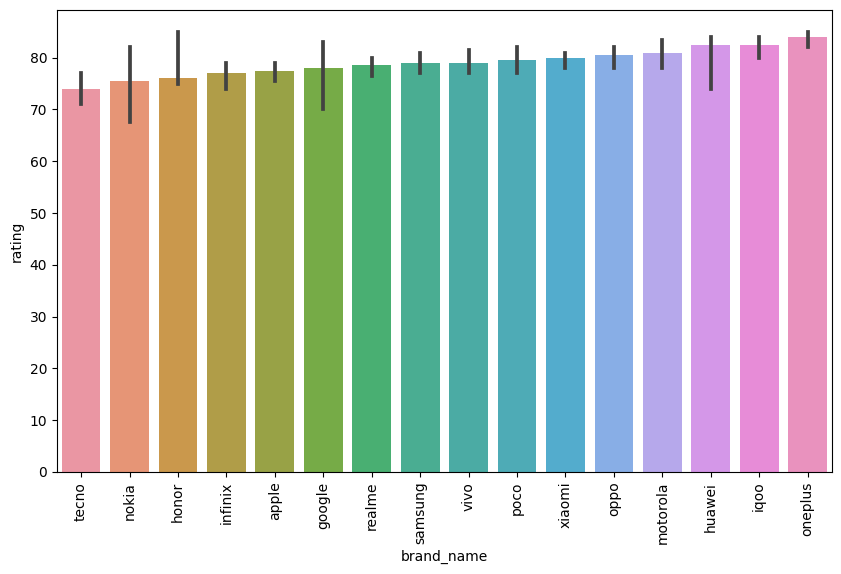

In [288]:
# 3 x 0
# rating x brand_name

filtered_df = df.dropna(subset = ['brand_name','rating'])
# Calculate the mean or median rating for each brand
# brand_rating_mean = df.groupby('brand_name')['rating'].mean()
# or 
brand_rating_median = filtered_df.groupby('brand_name')['rating'].median()

# Sort the brand names based on the mean or median rating
# order = brand_rating_mean.sort_values(ascending = False).index.tolist()
# or 
order = brand_rating_median.sort_values().index.tolist()

# Create the bar plot

plt.figure(figsize = (10,6))
sns.barplot(data = filtered_df, x = 'brand_name', y = 'rating',order = order, estimator = np.median)
plt.xticks(rotation = 'vertical');

In [289]:
filtered_df.groupby('brand_name')['rating'].median().sort_values(ascending = False)
# 'oneplus' have highest median rating of 84.0. Followed by 82.5 for both 'huawei' and 'iqoo' the least median rating is 74.0
# for 'tecno'.

brand_name
oneplus     84.0
huawei      82.5
iqoo        82.5
motorola    81.0
oppo        80.5
xiaomi      80.0
poco        79.5
samsung     79.0
vivo        79.0
realme      78.5
google      78.0
apple       77.5
infinix     77.0
honor       76.0
nokia       75.5
tecno       74.0
Name: rating, dtype: float64

In [290]:
techno_ratings = df[df['brand_name'] == 'techno']['rating']
if not techno_ratings.isnull().all():
    skewness = techno_ratings.skew()
    print("Skewness of Techno brand ratings:", skewness)
else:
    print("No non-null ratings found for Techno brand.")

No non-null ratings found for Techno brand.


In [291]:
for brand in df['brand_name'].unique():
    skewness = round(df[df['brand_name'] == brand]['rating'].skew(),2)
    print(f"Skewness of ratings for {brand}: {skewness}")

Skewness of ratings for oneplus: -1.18
Skewness of ratings for samsung: -0.41
Skewness of ratings for motorola: -0.63
Skewness of ratings for realme: -0.76
Skewness of ratings for apple: -1.31
Skewness of ratings for xiaomi: -0.8
Skewness of ratings for oppo: -0.64
Skewness of ratings for vivo: -0.55
Skewness of ratings for poco: -1.06
Skewness of ratings for iqoo: 0.03
Skewness of ratings for tecno: 0.01
Skewness of ratings for google: 0.04
Skewness of ratings for infinix: -0.46
Skewness of ratings for nokia: -0.23
Skewness of ratings for honor: 0.11
Skewness of ratings for huawei: -1.49


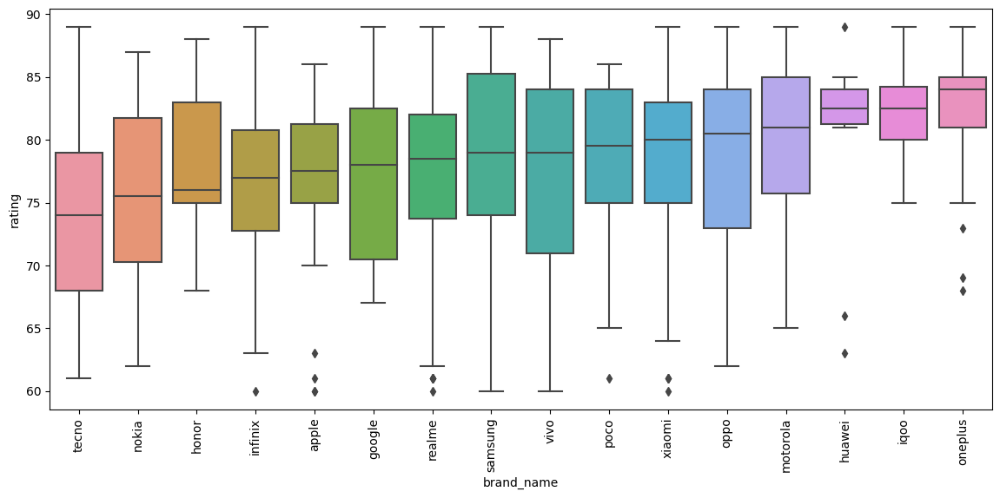

In [292]:
plt.figure(figsize = (14,6))
sns.boxplot(data = df, x  = 'brand_name', y = 'rating', order = order)
plt.xticks(rotation = 'vertical');
# 'huawei' is the only brand with outliers on both sides and is highly left skewed with skew = -1.49.

# 'samsung' have highest range of ratings from least min value 60.0 to highest max value 89.0 without any outliers and 
# little left skewed with skew = -0.41.

# 'vivo' have second highest range of ratings from least min value 60.0 to second highest max value 88.0 without any 
# outliers  and little left skewed with skew = -0.55.

# 'xiaomi', 'realme', 'infinix' have same range as samsung which is min value 60.0 and max value of 89.0 but they are 
# left skewed and they do have outliers in their left side:
#     'xiaomi' skew = -0.8
#     'realme' skew = -0.76
#     'infinix' skew = -0.47

# 'oppo', 'vivo', 'techno' have similar range of ratings without any outliers but a little  skewed:
#    'oppo' min value 62.0 and max value 89.0 with skew = -0.64 left skewed
#    'vivo' min value 60.0 and max value 88.0 with skew = -0.55 left skewed
#    'techno' min value 61.0 and max value 89.0 with skew = 0.006 a tiny little positivly right skewed

# 'iqoo', 'motorola', 'honor', 'google', 'nokia'brands without outliers:
#     'google' min value 67.0 and max value 89.0 skew = 0.04 a tiny little positivly right skewed
#     'iqoo' min value 75.0 and max value 89.0 skew = 0.03 a tiny little positivly right skewed
#     'motorola' min value 65.0 and max value 89.0 skew = -0.63 negatively left skewed
#     'honor' min value 68.0 and max value 88.0 skew = 0.11 little positively right skewed 
#     'nokia' min value 62.0 and max value 87.0 skew = -0.23 little negative


# 'apple', 'oneplus', 'poco'brands with outliers:
#     'oneplus' min value 68.0 and max value 89.0 skew = -1.18 heavily left negatively skewed
#     'apple' min value 60.0 and max value 86.0 skew = -1.31 heavily left negatively skewed
#     'poco' min value 61.0 and max value 86.0 skew = -1.06 heavily left negatively skewed

In [293]:

df.groupby('brand_name')['rating'].describe().sort_values(by = 'max',ascending = False)

,count,mean,std,min,25%,50%,75%,max
brand_name,,,,,,,,
google,12.0,77.333333,7.240459,67.0,70.50,78.0,82.50,89.0
huawei,10.0,79.900000,8.438668,63.0,81.25,82.5,84.00,89.0
infinix,28.0,76.285714,7.427961,60.0,72.75,77.0,80.75,89.0
iqoo,32.0,82.218750,3.643238,75.0,80.00,82.5,84.25,89.0
motorola,48.0,80.104167,6.627601,65.0,75.75,81.0,85.00,89.0
oneplus,38.0,82.236842,5.180182,68.0,81.00,84.0,85.00,89.0
oppo,82.0,78.731707,7.041410,62.0,73.00,80.5,84.00,89.0
realme,92.0,76.445652,7.596072,60.0,73.75,78.5,82.00,89.0
samsung,116.0,78.724138,7.334951,60.0,74.00,79.0,85.25,89.0


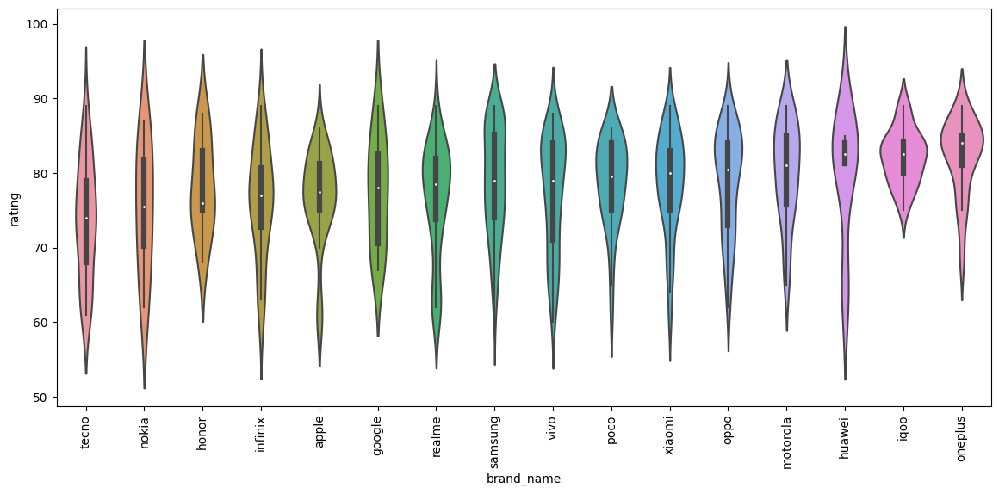

In [294]:
plt.figure(figsize = (14,6))
sns.violinplot(data = df, x  = 'brand_name', y = 'rating', order = order)
plt.xticks(rotation = 'vertical');

In [295]:
# Perform Shapiro-Wilk test for normality
statistic, p_value = stats.shapiro(df['rating'].dropna())

# Print the results
print("Shapiro-Wilk Test for Normality:")
print("Statistic:", statistic)
print("p-value:", p_value)

# Interpret the results
alpha = 0.05
if p_value > alpha:
    print("The rating variable appears to be normally distributed (fail to reject H0)")
else:
    print("The rating variable does not appear to be normally distributed (reject H0)")
    
# The Shapiro-Wilk test results indicate that the 'rating' variable does not appear to be normally distributed (rejecting 
# the null hypothesis). The p-value obtained (1.2552956809903806e-16) is much less than the chosen significance level 
# (typically 0.05), providing strong evidence against the assumption of normality for the 'rating' variable. Therefore, 
# you should consider non-parametric tests or transformations if normality assumptions are required for further analysis.

# ANOVA (Analysis of Variance) requires the dependent variable (in this case, 'rating') to be continuous and normally
# distributed within each group (in this case, 'brand_name'). Since the Shapiro-Wilk test has indicated that the 'rating'
# variable is not normally distributed, performing ANOVA may not be appropriate in this case.

# When the assumption of normality is violated, non-parametric alternatives like the Kruskal-Wallis test can be used 
# instead of ANOVA to analyze differences among groups. The Kruskal-Wallis test does not assume normality and is suitable 
# for comparing groups when the data is not normally distributed.

Shapiro-Wilk Test for Normality:
Statistic: 0.9461781978607178
p-value: 1.2552956809903806e-16
The rating variable does not appear to be normally distributed (reject H0)


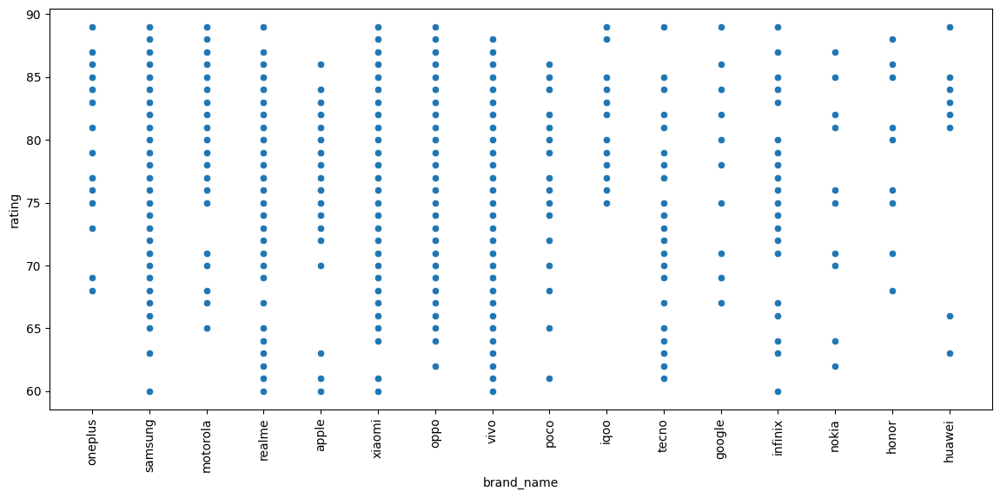

In [296]:
plt.figure(figsize = (14,6))
sns.scatterplot(data = df, x = 'brand_name', y = 'rating')
plt.xticks(rotation = 'vertical');

In [297]:
# Given that the 'brand_name' category doesn't have an equal number of rows for each category, it's better to use the 
# Kruskal-Wallis test instead of Spearman's correlation coefficient to assess the relationship between the 'rating' variable
# and the categorical variable 'brand_name'.

# The Kruskal-Wallis test is a non-parametric test that can be used to determine whether there are statistically significant 
# differences between the medians of three or more independent groups. It's an appropriate choice when the assumptions of 
# parametric tests like ANOVA are not met, such as when the data is not normally distributed or when the group sizes are 
# unequal.

na_df = df.dropna()

# Perform Kruskal-Wallis test
statistic, p_value = stats.kruskal(*[group['rating'] for name, group in na_df.groupby('brand_name')])

print('Kruskal-Wallis statistic: ',statistic)
print('P-value:',p_value)

# With a Kruskal-Wallis statistic of approximately 20.85 and a p-value of approximately 0.076, we can interpret the results 
# as follows:

# Since the p-value (0.076) is greater than the typical significance level of 0.05, we fail to reject the null hypothesis. 
# Therefore, we do not have sufficient evidence to conclude that there are statistically significant differences in the 
# median ratings across the different categories of 'brand_name'.

# In other words, based on the Kruskal-Wallis test, we do not have enough evidence to suggest that there are significant 
# differences in ratings between the different brands in your population.

Kruskal-Wallis statistic:  20.848588760266793
P-value: 0.0759778449212496


In [298]:
# there is no relationship between brand_name and rating

<AxesSubplot: xlabel='os', ylabel='rating'>

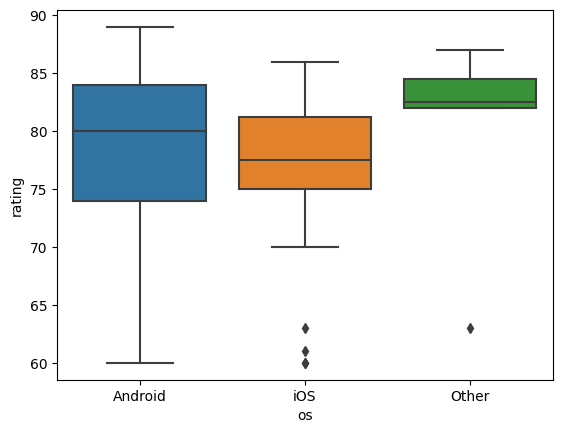

In [299]:
# rating x os
sns.boxplot(data = df, x = 'os', y = 'rating')

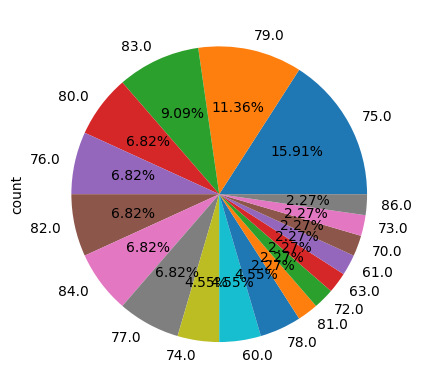

In [300]:
df[df['os'] == 'iOS']['rating'].value_counts().plot(kind = 'pie',autopct = '%.2f%%');

Rating vs. Price (Unfiltered Data):

    Spearman's correlation coefficient (0.762) suggests a strong positive relationship. Higher ratings tend to correspond with higher prices.
    The p-value (highly significant) confirms a statistically relevant association.

Rating vs. Price (Filtered Data):

    Removing Apple data strengthens the correlation (0.859) and lowers the p-value (even more significant). This implies a stronger positive relationship after filtering.

Brand Analysis:

    Median ratings: OnePlus has the highest (84.0), followed by Huawei/Iqoo (82.5), and Tecno (74.0).
    Distribution:
        Huawei: Only brand with outliers and left-skewed distribution.
        Samsung: Highest rating range with no outliers (slightly left-skewed).
        Vivo, Oppo, Techno: Similar rating ranges with no outliers (slightly left-skewed).
        Xiaomi, Realme, Infinix: Same range as Samsung but left-skewed with left-side outliers.
        Google, Nokia, Motorola, Honor, Iqoo: No outliers, mostly symmetric distributions or slightly skewed.
        Apple, OnePlus, Poco: Outliers present, heavily left-skewed distributions.
    Normality Test: Ratings are not normally distributed based on the Shapiro-Wilk test (p-value < 0.05).

Brand vs. Rating (Kruskal-Wallis Test):

    No significant differences in ratings between brands.

Operating System vs. Rating (Kruskal-Wallis Test):

    No significant differences in ratings between Android and other OS devices.
    No significant differences in ratings between iOS and other OS devices.

Overall, the analysis reveals:

    A positive correlation between ratings and prices (stronger after filtering Apple).
    Variations in rating distribution and presence of outliers across brands.
    No statistically significant differences in ratings based on brand or OS.

Potential Improvements:

    Consider mentioning the limitations of Spearman's rank for nominal ratings (ordinal association measures might be more appropriate).
    Briefly explain the Kruskal-Wallis test for non-normal data.
    You could suggest further analysis to explore potential reasons behind the rating distribution differences across brands (e.g., brand perception, target audience).

This revised write-up provides a clearer interpretation of the findings while acknowledging the limitations of the chosen tests for the rating variable.

In [301]:
# Drop rows with NaN values
na_df = df.dropna(subset = ['rating'])

# Check if there are at least two groups in the 'os' column
if len(na_df['os'].unique()) < 2:
    print("Need at least two groups in 'os' column to perform Kruskal-Wallis test.")
else:
    # Perform Kruskal-Wallis test
    statistic, p_value = stats.kruskal(*[group['rating'] for name, group in na_df.groupby('os')])

    print('Kruskal-Wallis statistic:', statistic)
    print('P-value:', p_value)
    
# The output you provided shows the results of the Kruskal-Wallis test performed on the 'rating' data grouped by the 'os' (operating system) column in your DataFrame after dropping rows with NaN values. Here's how to interpret the output:
# 
#     Kruskal-Wallis Statistic: The Kruskal-Wallis statistic is a test statistic that measures the degree of difference among the groups. In your output, the Kruskal-Wallis statistic is approximately 4.392. This value indicates the strength of evidence against the null hypothesis that the medians of all groups are equal. Higher values suggest greater differences among the groups.

#     P-value: The p-value is the probability of observing the data (or more extreme data) under the assumption that the null hypothesis is true. In your output, the p-value is approximately 0.111. This p-value indicates the likelihood of obtaining the observed results if there were no true difference among the groups. A p-value less than the chosen significance level (often 0.05) indicates statistical significance. Since your p-value is greater than 0.05, it suggests that there is not enough evidence to reject the null hypothesis at the typical significance level.

# Based on these results, you would typically conclude that there is insufficient evidence to suggest that there are significant differences in ratings among the groups defined by the 'os' column. However, the interpretation may vary depending on the context of your research question and the chosen significance level.

# If you have any specific questions or need further clarification, feel free to ask!

Kruskal-Wallis statistic: 4.3916695554074385
P-value: 0.11126564065017493


In [302]:
na_df['os'].value_counts()

os
Android    759
iOS         44
Other        6
Name: count, dtype: int64

In [303]:
na_df = df.dropna(subset = ['rating'])

# Perform Kruskal-Wallis test
statistic, p_value = stats.kruskal(*[group['rating'] for name, group in na_df.groupby([df['os'] == 'iOS'])])

print('Kruskal-Wallis statistic: ',statistic)
print('P-value:',p_value)

# The code you provided seems to perform a Kruskal-Wallis test comparing the ratings between two groups: devices with the operating system 'iOS' and devices with other operating systems. Here's how to interpret the output:

#     Kruskal-Wallis Statistic: The Kruskal-Wallis statistic is approximately 3.475. This statistic measures the strength of evidence against the null hypothesis that the medians of all groups are equal. Higher values suggest greater differences among the groups.

#     P-value: The p-value associated with the test is approximately 0.062. This p-value represents the probability of observing the data (or more extreme data) if the null hypothesis were true. A p-value less than the chosen significance level (commonly 0.05) indicates statistical significance. In this case, the p-value is close to but slightly greater than 0.05.

# Interpretation:

#     Since the p-value (0.062) is greater than the typical significance level of 0.05, we do not have sufficient evidence to reject the null hypothesis at the 0.05 significance level. This suggests that there is not enough evidence to conclude that there are significant differences in ratings between devices with the 'iOS' operating system and devices with other operating systems based on the Kruskal-Wallis test.

# However, it's important to consider the context of your research question and the chosen significance level when interpreting the results. A p-value slightly greater than 0.05 may still warrant further investigation or consideration depending on the specific context.

# If you have any further questions or need additional assistance, feel free to ask!

Kruskal-Wallis statistic:  3.475177692499391
P-value: 0.06229603112923549


In [304]:
na_df = df.dropna(subset = ['rating'])

# Perform Kruskal-Wallis test
statistic, p_value = stats.kruskal(*[group['rating'] for name, group in na_df.groupby([df['os'] == 'Android'])])

print('Kruskal-Wallis statistic: ',statistic)
print('P-value:',p_value)

# The code you provided performs a Kruskal-Wallis test comparing the ratings between two groups: devices with the operating system 'Android' and devices with other operating systems. Here's how to interpret the output:

#     Kruskal-Wallis Statistic: The Kruskal-Wallis statistic is approximately 0.087. This statistic measures the strength of evidence against the null hypothesis that the medians of all groups are equal. Higher values suggest greater differences among the groups.

#     P-value: The p-value associated with the test is approximately 0.768. This p-value represents the probability of observing the data (or more extreme data) if the null hypothesis were true.

# Interpretation:

#     Since the p-value (0.768) is much greater than the typical significance level of 0.05, we do not have sufficient evidence to reject the null hypothesis at the 0.05 significance level. This suggests that there is not enough evidence to conclude that there are significant differences in ratings between devices with the 'Android' operating system and devices with other operating systems based on the Kruskal-Wallis test.

# In summary, the results indicate that there are no significant differences in ratings between devices with the 'Android' operating system and devices with other operating systems, based on the Kruskal-Wallis test.

# If you have any further questions or need additional assistance, feel free to ask!

Kruskal-Wallis statistic:  0.08732640291631522
P-value: 0.7676040005668312


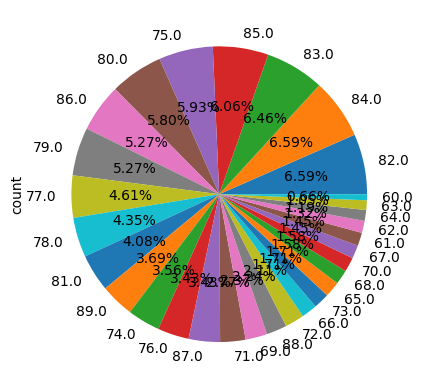

In [305]:
df[df['os'] == 'Android']['rating'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
plt.show()

<AxesSubplot: xlabel='has_5g', ylabel='price'>

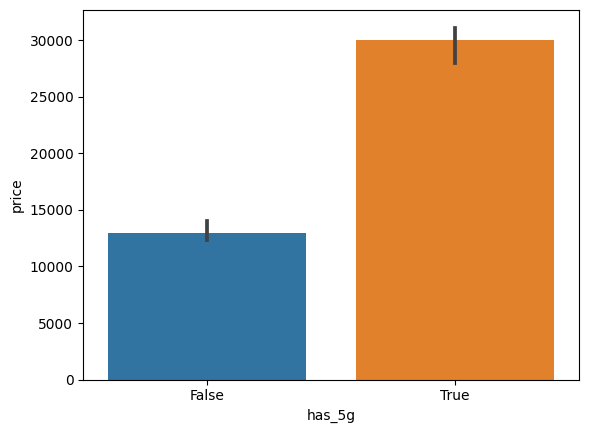

In [306]:
# 4 x 2
# has_5g x price

# as we have outliers lets use median
sns.barplot(data = df,x = 'has_5g',y = 'price',estimator = np.median)
# Smartphones with 5G feature have higher median price than once without 5G.

<AxesSubplot: xlabel='has_5g', ylabel='price'>

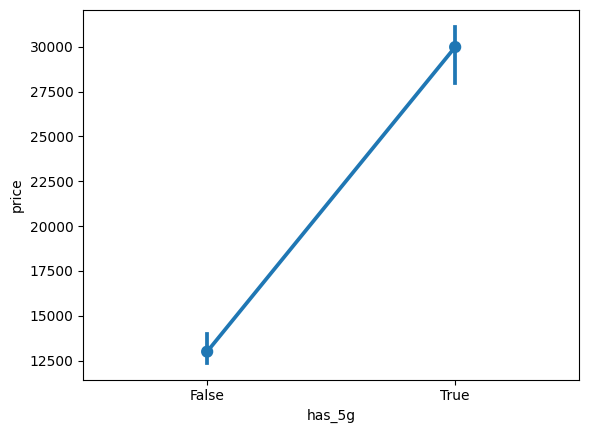

In [307]:
sns.pointplot(data = df,x = 'has_5g',y = 'price',estimator = np.median)
# The line is very steep, indicating a significant price difference between smartphones with 5G capability and those without.

<AxesSubplot: xlabel='has_5g', ylabel='price'>

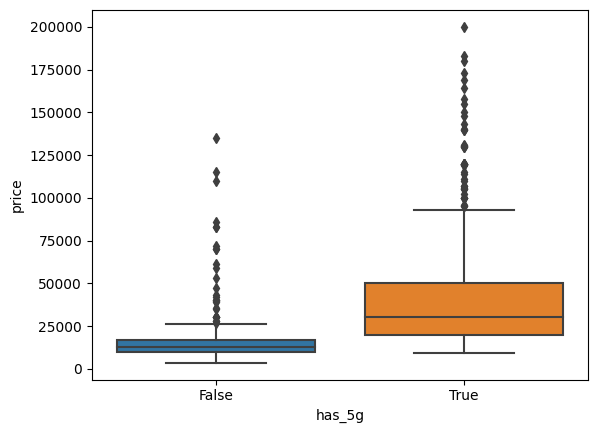

In [308]:
sns.boxplot(data = df, x = 'has_5g', y = 'price')

In [309]:
df[df['has_5g'] == False]['price'].skew()

4.748815221335685

<AxesSubplot: xlabel='has_5g', ylabel='price'>

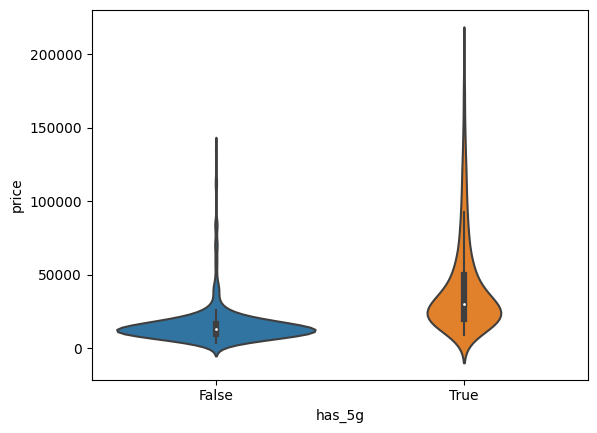

In [310]:
sns.violinplot(data = df, x = 'has_5g', y = 'price')

<AxesSubplot: xlabel='has_5g', ylabel='price'>

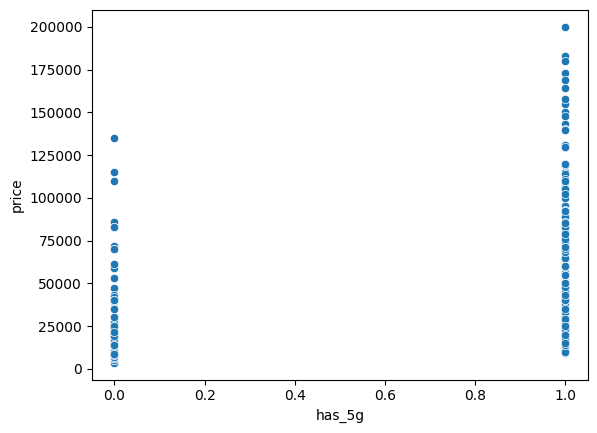

In [311]:
sns.scatterplot(data = df, x = 'has_5g', y = 'price')

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


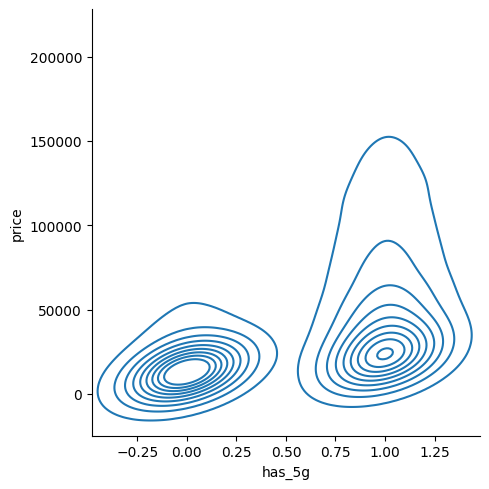

In [312]:
sns.displot(kind = 'kde', data = df, x = 'has_5g', y = 'price')

<AxesSubplot: ylabel='Density'>

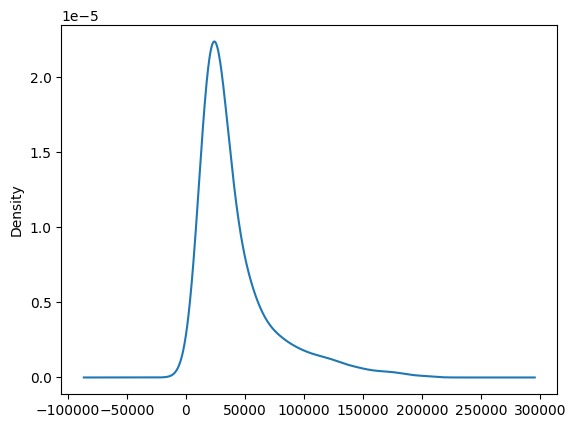

In [313]:
df[df['has_5g'] == True]['price'].plot(kind = 'kde')

<AxesSubplot: ylabel='Density'>

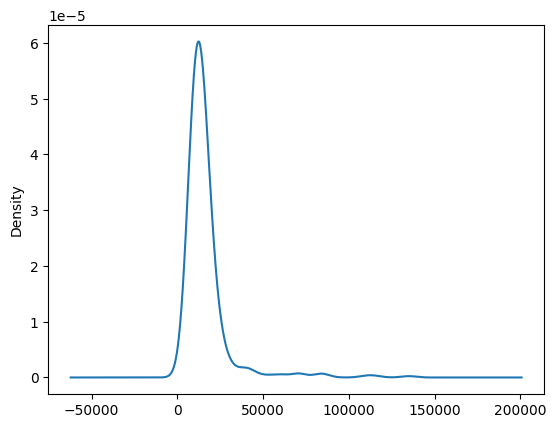

In [314]:
df[df['has_5g'] == False]['price'].plot(kind = 'kde')

- There are slightly more smartphone models with the 5G feature compared to those without it.
- There is a substantial difference between the median prices of the two categories.
- Both categories exhibit right-skewed distributions with numerous outliers.
- The distribution of smartphones with the 5G feature (skew = 2.03) is less skewed compared to those without it (skew = 4.75).
- The dispersion of prices is higher in smartphones with the 5G feature with standard deviation of 32675.36 which is 130% 
    higherthan than the one without.
- Prices of smartphones without the 5G feature are concentrated around the mean.
- The third quartile (Q3) of prices for smartphones without the 5G feature is lower than the first quartile (Q1) of prices for 
    smartphones with the 5G feature.
- The presence of the 5G feature is moderately correlated with the price of smartphones with correlation value of 0.43.

In [315]:
# statistical summary
df.groupby('has_5g')['price'].describe()

,count,mean,std,min,25%,50%,75%,max
has_5g,,,,,,,,
False,384.0,16272.682292,14197.001330,3499.0,9999.0,12999.0,16738.75,134999.0
True,506.0,41632.806324,32675.364215,8990.0,19999.0,29990.0,49990.00,199990.0


In [316]:
# shapiro Wilk test for normality of price
statistics,p_value = stats.shapiro(df['price'])# Shapiro-Wilk test for normality of has_ir_blaster
print('Shapiro-Wilk test for normality of \'price\': ')
print('Test Statistic: ',statistics)
print('p-value: ',p_value)

if p_value<0.05:
    print("The variable 'price' is not normally distributed")
else:
    print("The variable 'price' appears to be normally distributed")


Shapiro-Wilk test for normality of 'price': 
Test Statistic:  0.7056530714035034
p-value:  8.954774301136714e-37
The variable 'price' is not normally distributed


In [317]:
# Shapiro-Wilk test for normality of has_5g
statistics,p_value = shapiro(df['has_5g'])
print('Shapiro-Wilk test for normality of \'has_5g\': ')
print('Test Statistic: ',statistics)
print('p-value: ',p_value)

if p_value<0.05:
    print("The variable 'has_5g' is not normally distributed")
else:
    print("The variable 'has_5g' appears to be normally distributed")


Shapiro-Wilk test for normality of 'has_5g': 
Test Statistic:  0.6297191381454468
p-value:  5.826416845862227e-40
The variable 'has_5g' is not normally distributed


In [318]:
# Calculate the Point-Biserial Correlation Coefficient and p-value
point_biserial_corr, p_value = stats.pointbiserialr(df['has_5g'], df['price'])

print('Point-Biserial Correlation Coefficient: ', point_biserial_corr)
print('p-value: ', p_value)

# Given that the calculation was performed on population data, the Point-Biserial Correlation Coefficient and its associated 
# p-value can be interpreted in the context of the entire population. Here's how you can interpret the results:

#     Point-Biserial Correlation Coefficient: The Point-Biserial Correlation Coefficient quantifies the strength and direction 
#         of the linear relationship between a binary variable (such as "has_5g") and a continuous variable (such as "price"). 
#         A coefficient of 0.4307 suggests a moderate positive correlation between the presence of the 5G feature and the price
#         of smartphones. This indicates that, on average, smartphones with the 5G feature tend to have higher prices compared
#         to those without it.

#     p-value: The p-value associated with the correlation coefficient represents the probability of observing a correlation
#         coefficient as extreme as the one calculated (or even more extreme) if the null hypothesis were true. In this case, 
#         the null hypothesis typically states that there is no correlation between the binary variable (has_5g) and the 
#         continuous variable (price) in the population. With a p-value of approximately 1.6553e-41, which is extremely small,
#         we can reject the null hypothesis and conclude that there is a significant correlation between the presence of the 5G 
#         feature and the price of smartphones in the population.

# In summary, the results suggest a moderate positive correlation between the presence of the 5G feature and the price of
# smartphones in the population, with smartphones featuring 5G generally having higher prices compared to those without it. 
# This correlation is statistically significant, indicating that it is unlikely to have occurred by random chance.

Point-Biserial Correlation Coefficient:  0.4307365347172348
p-value:  1.6553356556562072e-41


In [319]:
# 4 x 0
# has_5g x brand_name

# contingency table
pd.crosstab(df['has_5g'],df['brand_name'])

brand_name,apple,google,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
has_5g,,,,,,,,,,,,,,,,
False,9,3,3,11,22,2,20,6,6,35,15,46,63,28,58,57
True,37,11,10,3,7,30,32,7,36,53,26,51,69,5,53,76


In [320]:
df.groupby('has_5g')['price'].median()
# category of models without 5g is 56.65% lesser than category with 5g.

has_5g
False    12999.0
True     29990.0
Name: price, dtype: float64

In [321]:
(df[df['has_5g'] == True]['price'].median()-df[df['has_5g'] == False]['price'].median())/df[df['has_5g'] == True]['price'].median()

0.5665555185061687

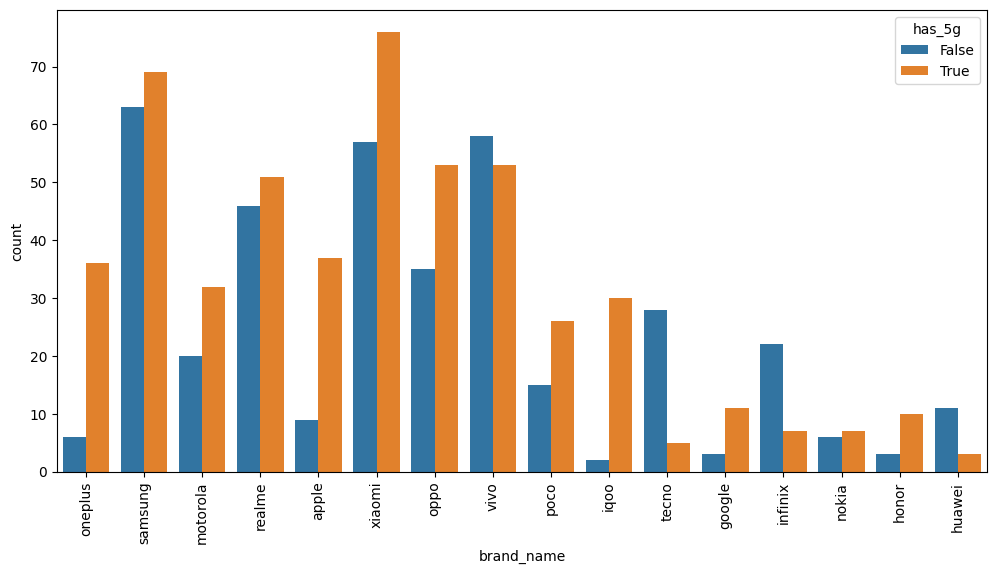

In [322]:
# 4 x 0
# has_5g x brand_name

plt.figure(figsize = (12,6))
sns.countplot(data = df, x = 'brand_name', hue = 'has_5g')
plt.xticks(rotation = 'vertical');

In [323]:
true_count = []
false_count = []

for i, j in df.groupby('brand_name')['has_5g'].value_counts().items():
    if True in i:
        true_count.append((i, j))
    else:
        false_count.append((i, j))
     

    
greater_true = 0
greater_false = 0
for a in range(len(true_count)):
    if true_count[a][1] > false_count[a][1]:
        greater_true += 1
    else:
        greater_false += 1
print(greater_true)
print(greater_false)
    
print('percentage of samrtphone brands with more models having 5g feature: ',greater_true/len(df['brand_name'].unique())*100)

12
4
percentage of samrtphone brands with more models having 5g feature:  75.0


In [324]:
contingency_table = pd.crosstab(df['has_5g'], df['brand_name'])

# Perform chi-square test of independence
chi2, _, _, _ = stats.chi2_contingency(contingency_table)

# Calculate Cramer's V coefficient
n = contingency_table.sum().sum()
min_dim = min(contingency_table.shape)
cramer_v = np.sqrt(chi2 / (n * (min_dim - 1)))

print("Cramer's V coefficient:", cramer_v)

# The output indicates a Cramer's V coefficient of approximately 0.331. This value suggests a moderate to moderately strong association between the 'has_5g' and 'brand_name' variables.

# A Cramer's V coefficient closer to 1 indicates a stronger association, while a coefficient closer to 0 suggests a weaker association.

# Therefore, based on the obtained coefficient, we can conclude that there is a significant association between the presence of 5G capability ('has_5g') and the brand of the device ('brand_name'). However, further analysis or exploration may be needed to fully understand the nature and implications of this association.

Cramer's V coefficient: 0.3313830821298209


In [325]:
# 4 x 24
# has_5g x os

# contingency table
pd.crosstab(df['has_5g'],df['os'])

os,Android,Other,iOS
has_5g,,,
False,368,6,9
True,461,2,37


has_5g x price
Smartphones with 5G feature have higher median price than once without 5G.
Shapiro-Wilk test for normality of 'price': The variable 'price' is not normally distributed.
Shapiro-Wilk test for normality of 'has_5g': The variable 'has_5g' is not normally distributed.
category of models without 5g is 56.65% lesser than category with 5g.
Point-Biserial Correlation Coefficient: In summary, the results suggest a moderate positive correlation between the
            presence of the 5G feature and the price of smartphones in the population, with smartphones featuring 5G
            generally having higher prices compared to those without it. This correlation is statistically significant, 
            indicating that it is unlikely to have occurred by random chance.
            
has_5g x brand_name
percentage of samrtphone brands with more models having 5g feature:  75.0%
The output indicates a Cramer's V coefficient of approximately 0.331. This value suggests a moderate to moderately strong association between the 'has_5g' and 'brand_name' variables.

A Cramer's V coefficient closer to 1 indicates a stronger association, while a coefficient closer to 0 suggests a weaker association.

Therefore, based on the obtained coefficient, we can conclude that there is a significant association between the presence of 5G capability ('has_5g') and the brand of the device ('brand_name'). However, further analysis or exploration may be needed to fully understand the nature and implications of this association.

has_5g x os
in both android and iOS smartphone models with 5g feature morethan the ones which doesn`t
The output indicates a Cramer's V coefficient of approximately 0.127. This value suggests a weak association between the 'has_5g' variable (presence of 5G capability) and the 'os' variable (operating system).

A Cramer's V coefficient closer to 1 indicates a stronger association, while a coefficient closer to 0 suggests a weaker association. Therefore, based on the obtained coefficient, we can infer that there is a relatively weak association between the presence of 5G capability and the operating system of the device.

Further analysis or exploration may be necessary to understand the implications of this association and its significance in the context of your dataset or research question.


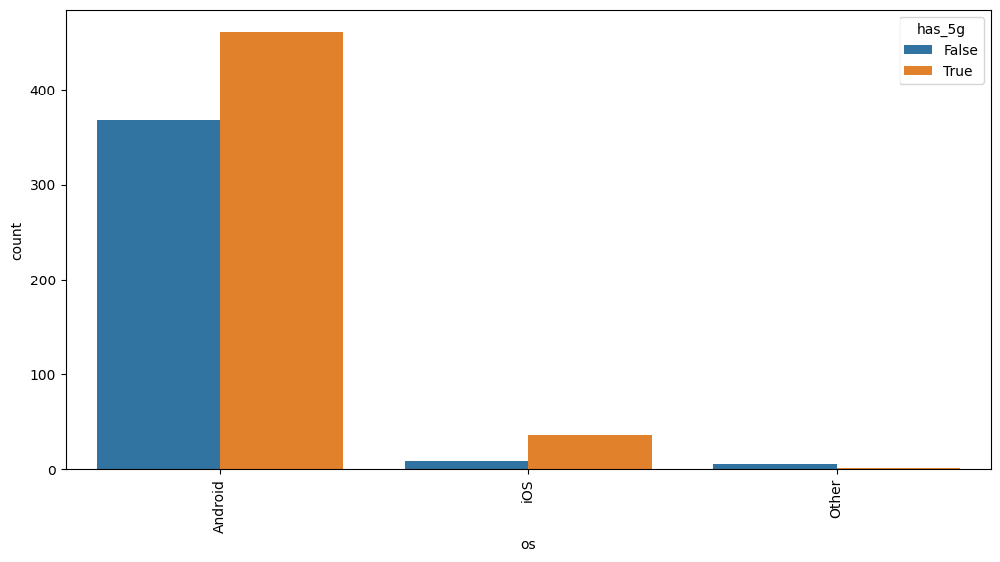

In [326]:
plt.figure(figsize = (12,6))
sns.countplot(data = df, x = 'os', hue = 'has_5g')
plt.xticks(rotation = 'vertical');
# in both android and iOS smartphone models with 5g feature morethan the ones which doesn`t

In [327]:

contingency_table = pd.crosstab(df['has_5g'], df['os'])

# Perform chi-square test of independence
chi2, _, _, _ = stats.chi2_contingency(contingency_table)

# Calculate Cramer's V coefficient
n = contingency_table.sum().sum()
min_dim = min(contingency_table.shape)
cramer_v = np.sqrt(chi2 / (n * (min_dim - 1)))

print("Cramer's V coefficient:", cramer_v)

# The output indicates a Cramer's V coefficient of approximately 0.127. This value suggests a weak association between the 'has_5g' variable (presence of 5G capability) and the 'os' variable (operating system).

# A Cramer's V coefficient closer to 1 indicates a stronger association, while a coefficient closer to 0 suggests a weaker association. Therefore, based on the obtained coefficient, we can infer that there is a relatively weak association between the presence of 5G capability and the operating system of the device.

# Further analysis or exploration may be necessary to understand the implications of this association and its significance in the context of your dataset or research question.

Cramer's V coefficient: 0.12691754331324537


<AxesSubplot: xlabel='has_nfc', ylabel='price'>

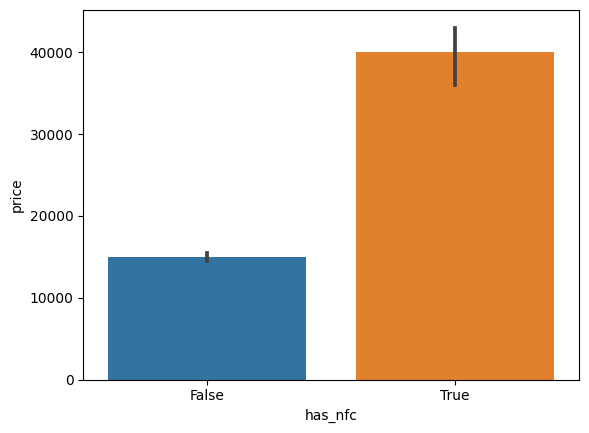

In [328]:
# 5 x 2
# has_nfc x price
sns.barplot(data = df,x = 'has_nfc',y = 'price',estimator = np.median)
# smartphones with nfc feature have higher average price than ones that don`t.

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


<AxesSubplot: xlabel='price', ylabel='Count'>

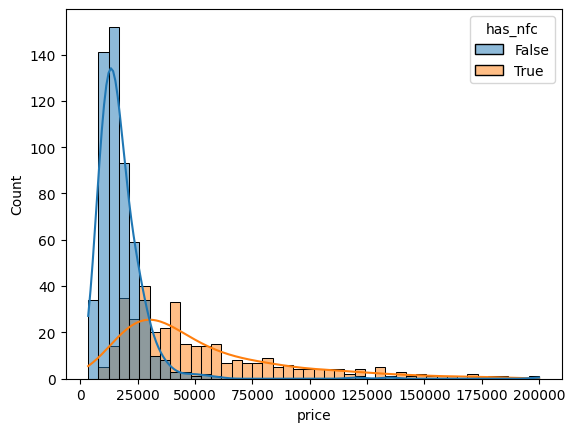

In [329]:
sns.histplot(data = df, x = 'price', hue = 'has_nfc', kde = True)
# curve of category with nfc models is less peaked and right skewed than the one without.

In [330]:
print('skewness for category with out nfc feature:',df[df['has_nfc'] == False]['price'].skew())
print('skewness for category with nfc feature:',df[df['has_nfc'] == True]['price'].skew())

skewness for category with out nfc feature: 7.659122298239903
skewness for category with nfc feature: 1.4529373630281956


<AxesSubplot: xlabel='has_nfc', ylabel='price'>

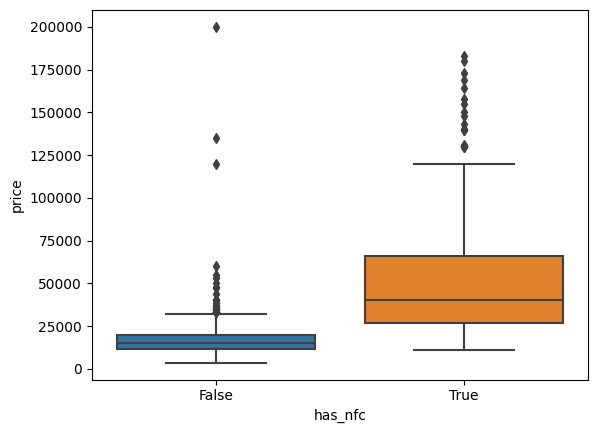

In [331]:
sns.boxplot(data = df, x = 'has_nfc', y = 'price')

<AxesSubplot: xlabel='has_nfc', ylabel='price'>

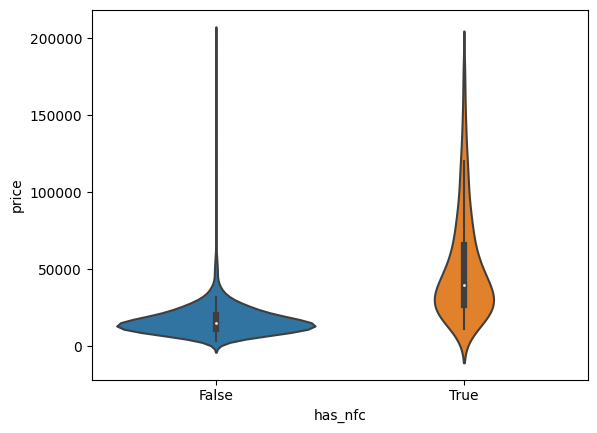

In [332]:
sns.violinplot(data = df, x = 'has_nfc', y = 'price')

<AxesSubplot: xlabel='has_nfc', ylabel='price'>

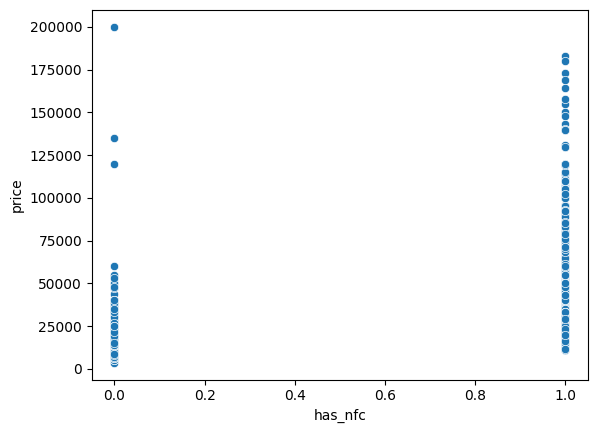

In [333]:
sns.scatterplot(data = df, x = 'has_nfc', y = 'price')

In [334]:
df['has_nfc'].value_counts()

has_nfc
False    544
True     346
Name: count, dtype: int64

In [335]:
df.groupby('has_nfc')['price'].describe()
# category of smartphone models without nfc feature are 62.50% less pricer than the ones with.

,count,mean,std,min,25%,50%,75%,max
has_nfc,,,,,,,,
False,544.0,17488.229779,13012.599850,3499.0,11496.75,14999.0,19999.0,199990.0
True,346.0,51448.881503,34929.466382,10999.0,26990.00,39999.0,65874.0,182999.0


In [336]:
true_nfc_median = df[df['has_nfc'] == True]['price'].median()
false_nfc_median = df[df['has_nfc'] == False]['price'].median()
print('models without nfc feature are ',(true_nfc_median - false_nfc_median)/true_nfc_median, ' less pricer than the ones with.')
print('models with nfc feature are ',(false_nfc_median - true_nfc_median)/false_nfc_median, ' more pricer than the ones without.')

models without nfc feature are  0.6250156253906348  less pricer than the ones with.
models with nfc feature are  -1.666777785185679  more pricer than the ones without.


In [337]:
df.groupby('has_nfc')['price'].median()

has_nfc
False    14999.0
True     39999.0
Name: price, dtype: float64

<AxesSubplot: xlabel='has_nfc', ylabel='price'>

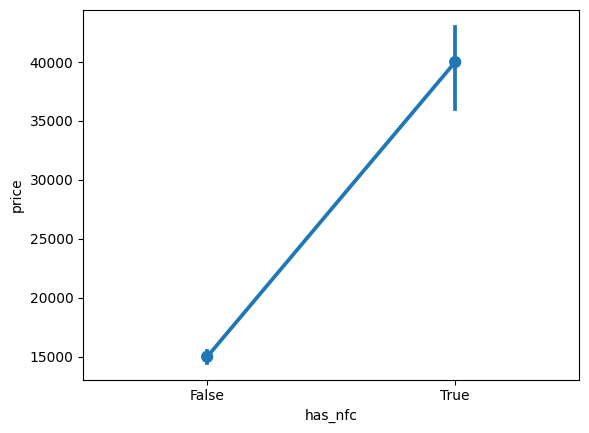

In [338]:
sns.pointplot(data = df,x = 'has_nfc',y = 'price',estimator = np.median)
# the line is very steep which means there is alot of difference in price for once with nfc and without

In [339]:
statistic, p_value = stats.shapiro(df['has_nfc'].dropna())

# Print the results
print("Shapiro-Wilk Test for Normality:")
print("Statistic:", statistic)
print("p-value:", p_value)

# Interpret the results
alpha = 0.05
if p_value > alpha:
    print("The rating variable appears to be normally distributed (fail to reject H0)")
else:
    print("The rating variable does not appear to be normally distributed (reject H0)")

Shapiro-Wilk Test for Normality:
Statistic: 0.6183319687843323
p-value: 2.1602837515570677e-40
The rating variable does not appear to be normally distributed (reject H0)


In [340]:
# Calculate the Point-Biserial Correlation Coefficient and p-value
point_biserial_corr, p_value = stats.pointbiserialr(df['has_nfc'], df['price'])

print('Point-Biserial Correlation Coefficient: ', point_biserial_corr)
print('p-value: ', p_value)

# The Point-Biserial Correlation Coefficient between the presence of NFC (Near Field Communication) and the price of 
# smartphones is approximately 0.568. This indicates a moderate positive correlation between the two variables. The p-value 
# associated with this correlation coefficient is very small (approximately 4.49e-77), indicating that the correlation is 
# statistically significant. Therefore, we reject the null hypothesis that there is no correlation between NFC presence and 
# smartphone price.

Point-Biserial Correlation Coefficient:  0.567718414455506
p-value:  4.486497131267499e-77


- The smartphone models with nfc feature tend to be priced morethan onces which don`t have that feature.
- 43.75% of smartphone brands have more models with nfc then without.
- iOS which is a premium brand its 97.83% models have nfc feature.
- Where as google only have models with nfc feature.
- 34.86% of modela in android have nfc feature.

In [341]:
# has_nfc x brand_name

# contingence table
pd.crosstab(df['has_nfc'],df['brand_name'])

brand_name,apple,google,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
has_nfc,,,,,,,,,,,,,,,,
False,1,0,6,4,28,19,18,10,9,55,30,83,65,25,94,97
True,45,14,7,10,1,13,34,3,33,33,11,14,67,8,17,36


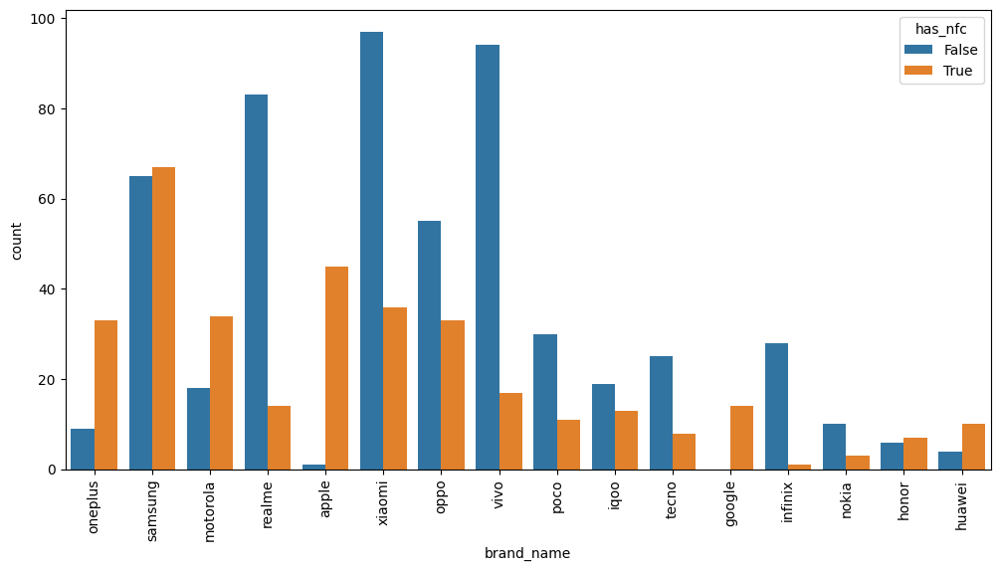

In [342]:
# barplot of brand_name and has_nfc
plt.figure(figsize = (12,6))
sns.countplot(data = df, x = 'brand_name', hue = 'has_nfc')
plt.xticks(rotation = 'vertical');

In [343]:
true_count = []
false_count = []
Total_brands = len(df['brand_name'].unique())

g_df = df[df['brand_name'] != 'google']

for i, j in g_df.groupby('brand_name')['has_nfc'].value_counts().items():
    if True in i:
        true_count.append((i, j))
    else:
        false_count.append((i, j))
     

    
greater_true = 0
greater_false = 0
exception = []
for a in range(len(true_count)):

    if true_count[a][0][0] == false_count[a][0][0]:
       
        if true_count[a][1] > false_count[a][1]:
            greater_true += 1
        else:
            greater_false += 1
            
    else:
        print(true_count[a], false_count[a])
        

print(greater_true)
print(greater_false)
print(Total_brands)
    
# as google is the brand only  with all nfc models we didn`t get to compare it and we are adding it directly 
    
print('percentage of samrtphone brands with more models having nfc feature: ',(greater_true + 1)/Total_brands*100)

6
9
16
percentage of samrtphone brands with more models having nfc feature:  43.75


In [344]:
# Cramer's V coefficent test

# construct a contingency table
contingency_table = pd.crosstab(df['has_nfc'],df['brand_name'])

# Calculate Cramer's V
chi2, p_value, _, _ = stats.chi2_contingency(contingency_table)
n = contingency_table.sum().sum()
min_dim = min(contingency_table.shape)
cramers_v = np.sqrt(chi2/(n*(min_dim - 1)))

print("Cramer's V: ", cramers_v)
print("P-value: ", p_value)

# The output indicates a Cramer's V coefficient of approximately 0.506, which suggests a moderate to strong association between the two variables. Additionally, the p-value associated with the chi-square test of independence is approximately 3.705e-40, which is extremely small.

# Interpretation:

#     The Cramer's V coefficient of 0.506 indicates a substantial association between the variables.
#     The p-value being significantly smaller than any reasonable significance level (e.g., 0.05) provides strong evidence against the null hypothesis of independence.
#     Therefore, we can confidently conclude that there is a statistically significant association between the variables.

# Overall, this analysis indicates a notable relationship between the variables under consideration, implying that changes in one variable may be associated with changes in the other variable. Further investigation may be warranted to explore the nature and implications of this association in more detail.

Cramer's V:  0.506383787054894
P-value:  3.705121438092732e-40


    Cramer's V Coefficient:
        - Cramer's V coefficient ranges from 0 to 1.
        - A value of 1 indicates a perfect association between the variables.
        - In your case, Cramer's V being 1.0 suggests a strong association between the presence of NFC feature (has_nfc) and
          the smartphone brands (brand_name). This suggests that there might be a relationship between the presence of NFC 
          feature and the brand of the smartphone.

    P-value:
        - The p-value associated with the test tells us about the statistical significance of the association.
        - In hypothesis testing, a common significance level is 0.05.
        - If the p-value is less than the significance level (0.05), we reject the null hypothesis and conclude that there 
          is a significant association.
        - In your case, the p-value is approximately 0.082, which is greater than 0.05.
        - This means that there's not enough evidence to reject the null hypothesis at the 0.05 significance level, 
          suggesting that the association may not be statistically significant. However, it's still relatively close
          to the significance level, so the association might be considered borderline significant depending on the context
          and the chosen significance level.

In summary, Cramer's V coefficient of 1.0 indicates a strong association between the presence of NFC feature and smartphone 
brands. However, the p-value being greater than 0.05 suggests that this association might not be statistically significant at 
the conventional significance level. Further analysis and consideration of the context are needed to interpret these results 
accurately.

In [345]:
# 5 x 24
# has_nfc x os
pd.crosstab(df['has_nfc'],df['os'])

os,Android,Other,iOS
has_nfc,,,
False,540,3,1
True,289,5,45


has_nfc x price
- smartphones with nfc feature have higher average price than ones that don`t.
- curve of category with nfc models is less peaked and right skewed than the one without.
- category of smartphone models without nfc feature are 62.50% less pricer than the ones with.
- Shapiro-Wilk Test for Normality:The rating variable does not appear to be normally distributed (reject H0)
- The Point-Biserial Correlation Coefficient between the presence of NFC (Near Field Communication) and the price of 
  smartphones is approximately 0.568. This indicates a moderate positive correlation between the two variables. The p-value 
  associated with this correlation coefficient is very small (approximately 4.49e-77), indicating that the correlation is 
  statistically significant. Therefore, we reject the null hypothesis that there is no correlation between NFC presence and 
  smartphone price.
has_nfc x brand_name
- iOS which is a premium brand its 97.83% models have nfc feature.
- Where as google only have models with nfc feature.
- 34.86% of modela in android have nfc feature.
- percentage of samrtphone brands with more models having 5g feature:  43.75
The output indicates a Cramer's V coefficient of approximately 0.506, which suggests a moderate to strong association between the two variables. Additionally, the p-value associated with the chi-square test of independence is approximately 3.705e-40, which is extremely small.

Interpretation:

    The Cramer's V coefficient of 0.506 indicates a substantial association between the variables.
    The p-value being significantly smaller than any reasonable significance level (e.g., 0.05) provides strong evidence against the null hypothesis of independence.
    Therefore, we can confidently conclude that there is a statistically significant association between the variables.

Overall, this analysis indicates a notable relationship between the variables under consideration, implying that changes in one variable may be associated with changes in the other variable. Further investigation may be warranted to explore the nature and implications of this association in more detail.

has_nfc x os
percentage of smartphone models with nfc in android os:  34.86%
percentage of smartphone models with nfc in iOS os:  97.83%

In [346]:
android_count = df[(df['os'] == 'Android') & (df['has_nfc'] == True)]['model'].count()
total_android_count = df[df['os'] == 'Android']['model'].count()
iOS_count = df[(df['os'] == 'iOS') & (df['has_nfc'] == True)]['model'].count()
total_iOS_count = df[df['os'] == 'iOS']['model'].count()

print('percentage of smartphone models with nfc in android os: ', android_count/total_android_count *100)
print("percentage of smartphone models with nfc in iOS os: ", iOS_count/total_iOS_count *100)

percentage of smartphone models with nfc in android os:  34.86127864897467
percentage of smartphone models with nfc in iOS os:  97.82608695652173


<AxesSubplot: xlabel='num_cores', ylabel='price'>

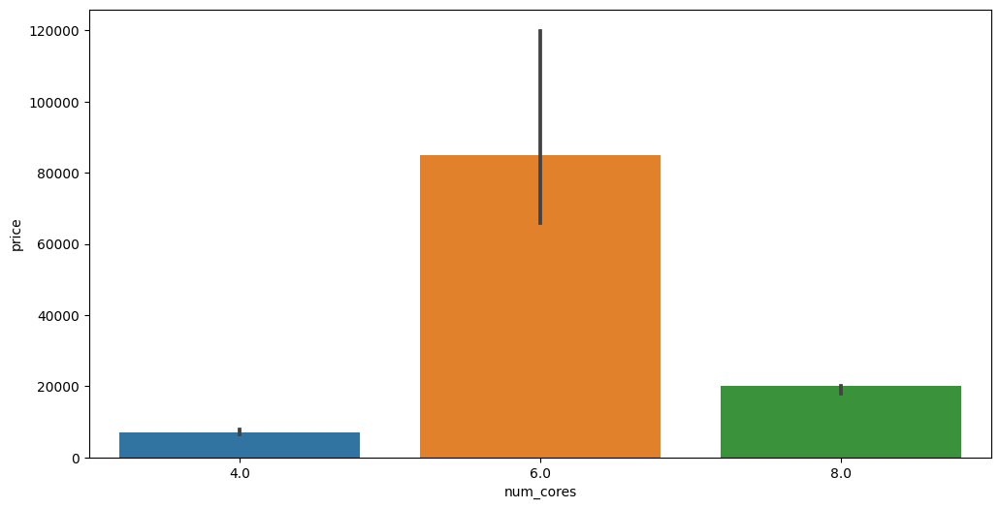

In [347]:
# 8 x 2
# num_cores x price

plt.figure(figsize = (12,6))
sns.barplot(data = temp_df, x = 'num_cores', y = 'price', estimator = np.median)

# Average price of smartphones with Hexa-core processor is significantly higher than Octa and Quad cores.

# After checking the data it is because of Apple brand smartphones. It is the only brand with Hexa-core processors.

# Apple brand smartphones, which are the only ones with Hexa-core processors, have a significantly higher average price compared
# to those with Octa and Quad cores.

<AxesSubplot: xlabel='num_cores', ylabel='price'>

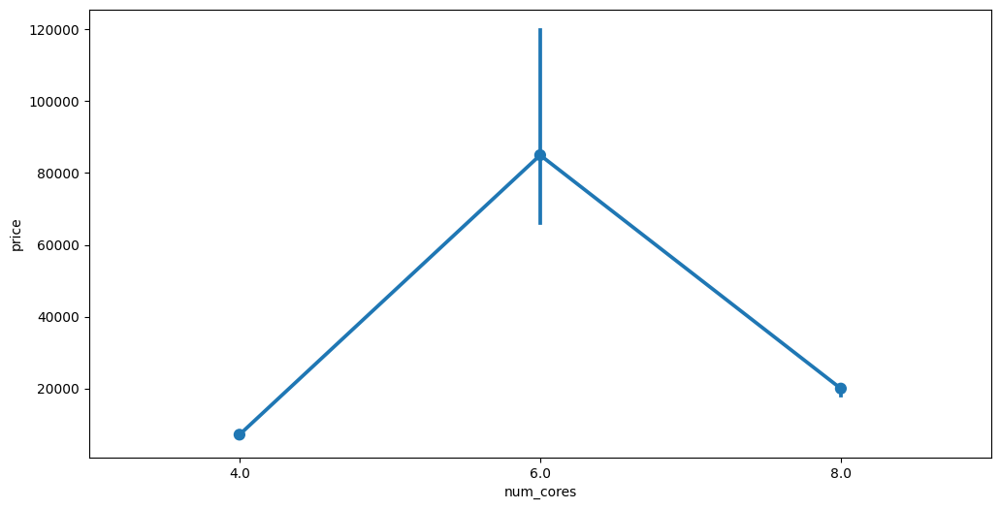

In [348]:

# point plot
plt.figure(figsize = (12,6))
sns.pointplot(data = df, x = 'num_cores', y = 'price',estimator = np.median)

<AxesSubplot: xlabel='num_cores', ylabel='price'>

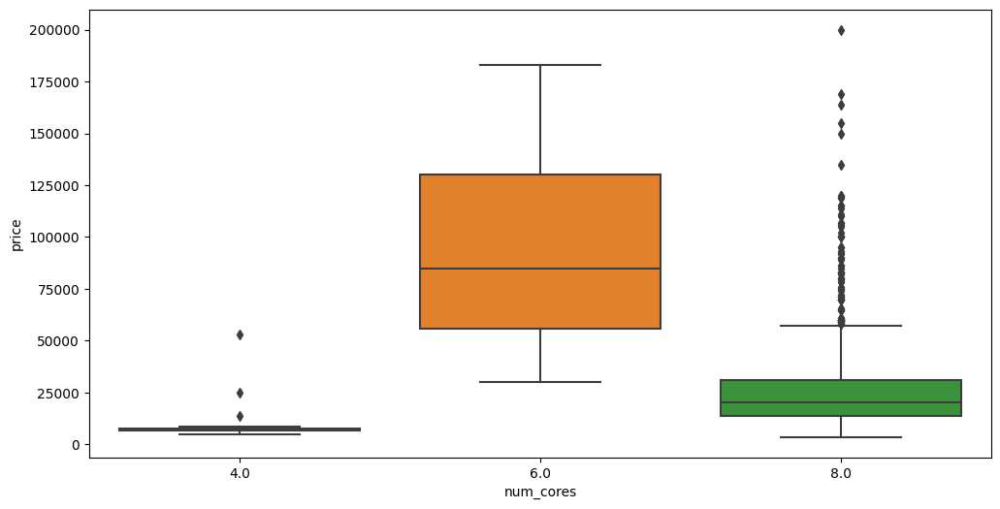

In [349]:
# box plot
plt.figure(figsize = (12,6))
sns.boxplot(data = df, x = 'num_cores', y = 'price')
# hexa-core distribution is the only distribution without any outliers

<AxesSubplot: xlabel='num_cores', ylabel='price'>

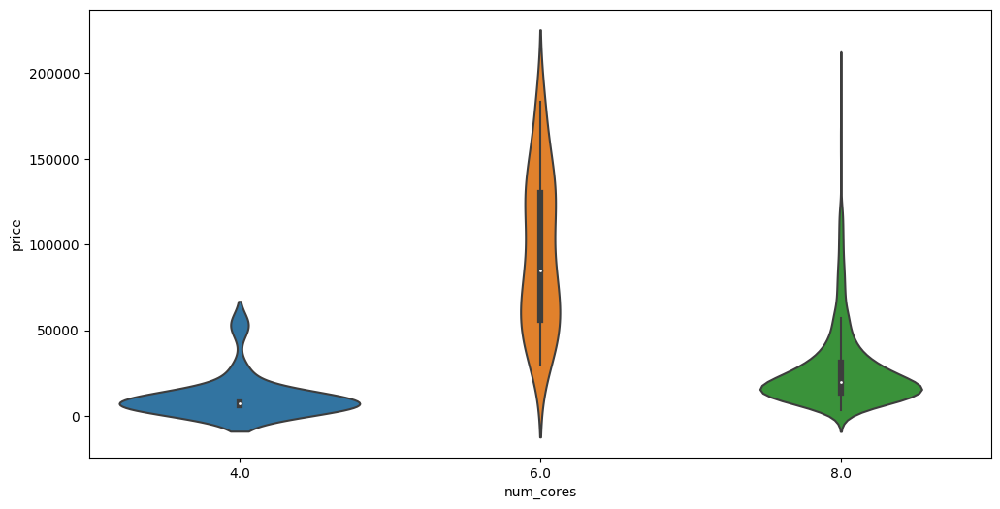

In [350]:
# violin plot
plt.figure(figsize = (12,6))
sns.violinplot(data = df, x = 'num_cores', y = 'price')

skew of 50.0 MP:  2.0294384512650296
skew of 64.0 MP:  3.4723384890247915
skew of 48.0 MP:  2.983004213310838
skew of 13.0 MP:  5.235328206762575
skew of 108.0 MP:  2.7595177526409707
skew of 12.0 MP:  0.6904696381683239
skew of 8.0 MP:  -0.18566282309528542
skew of 200.0 MP:  1.3205144618102111
skew of 16.0 MP:  2.1093044342194243
skew of 12.2 MP:  0.222288364936479
skew of 50.3 MP:  1.6430499828487446
skew of 54.0 MP:  -1.6538067593711279
skew of 5.0 MP:  -1.38963613870649
skew of 24.0 MP:  nan


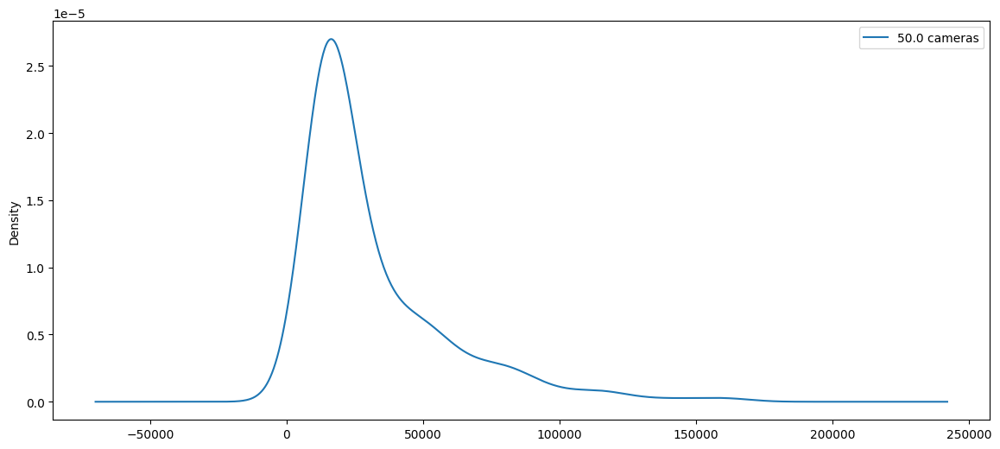

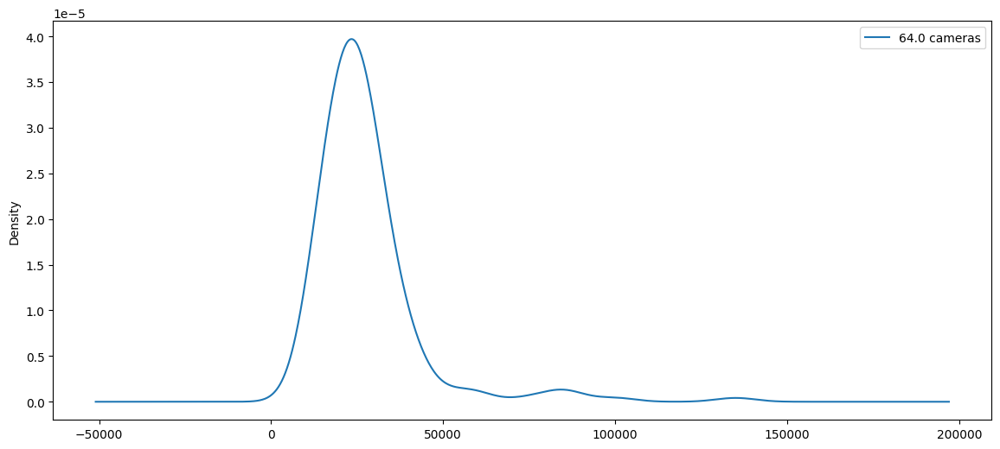

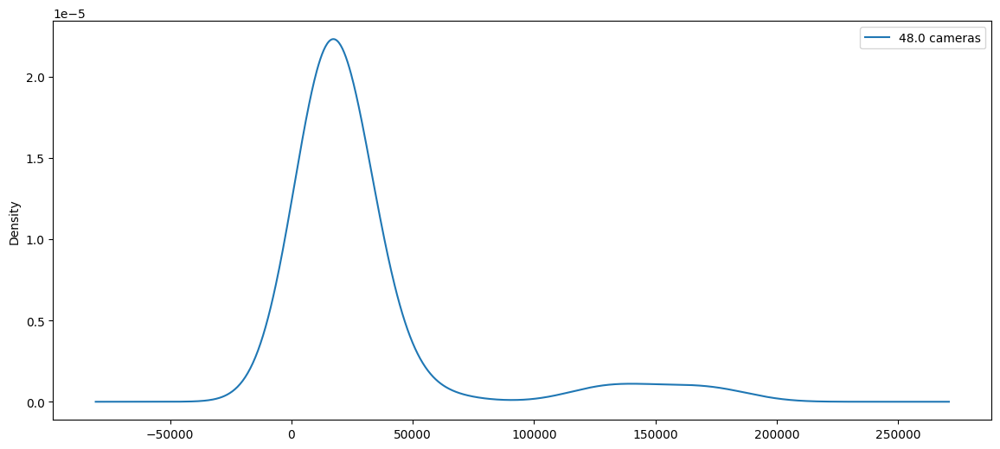

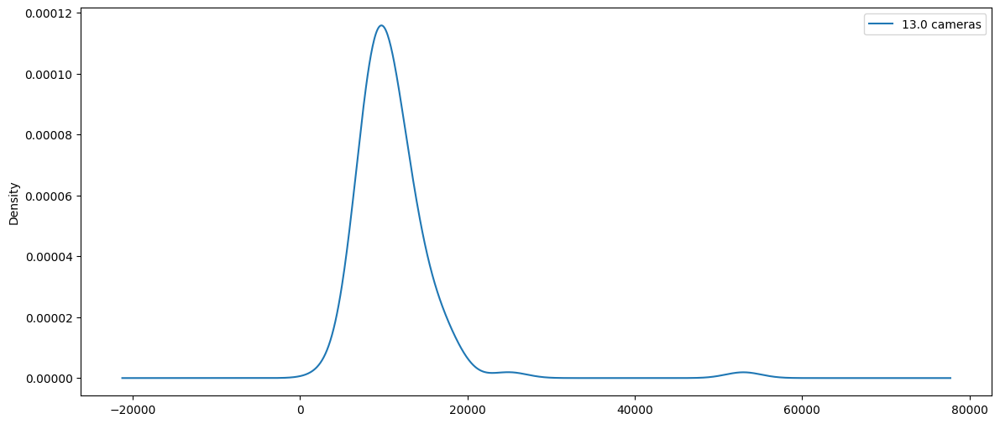

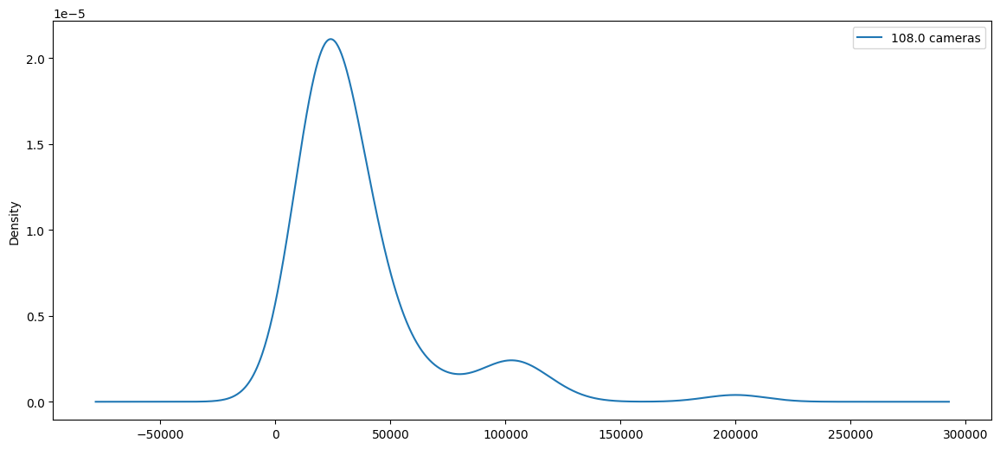

...

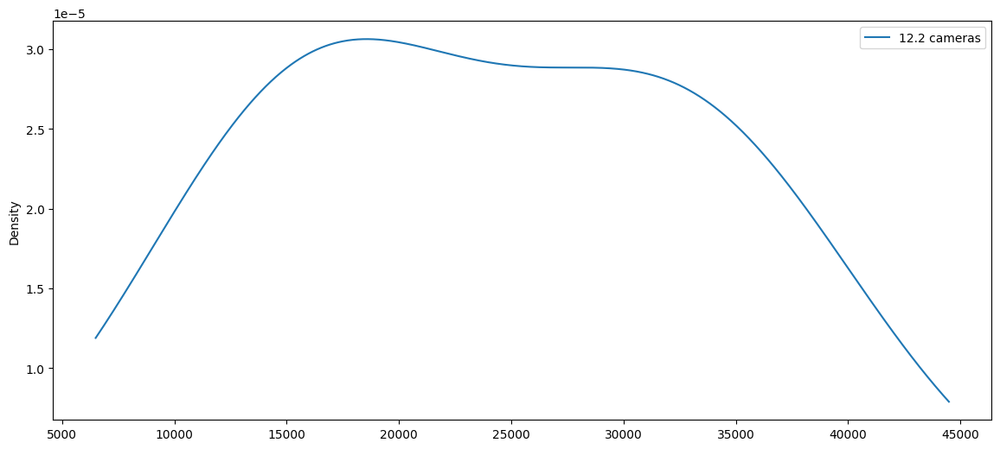

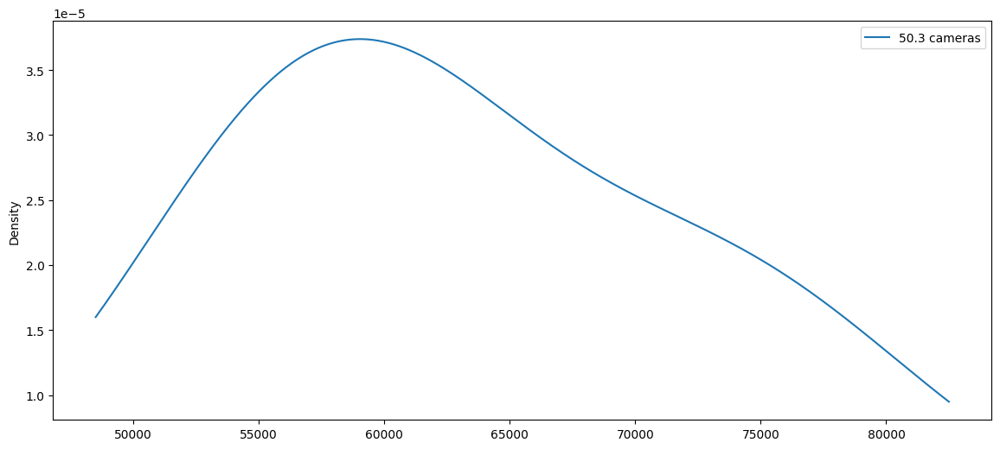

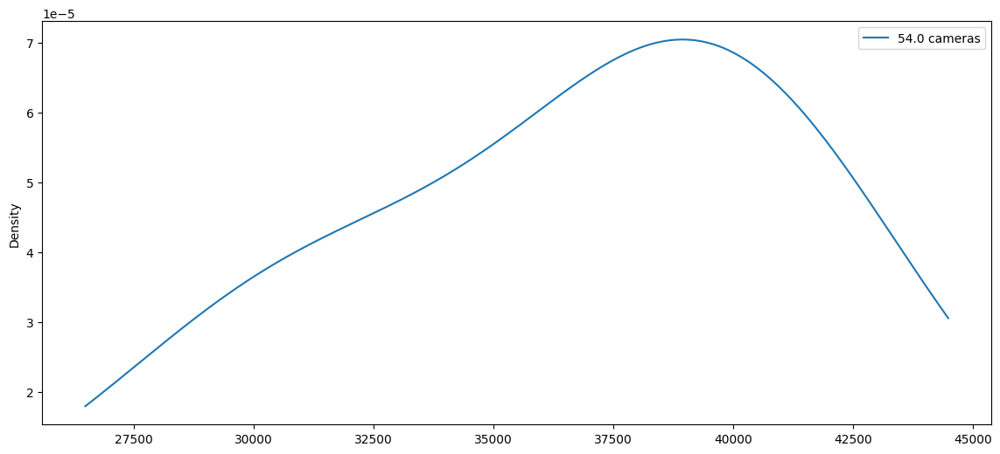

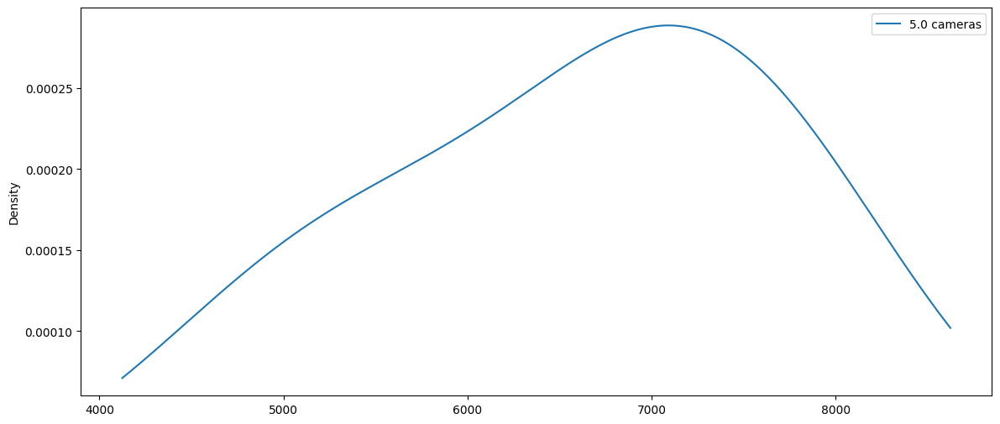

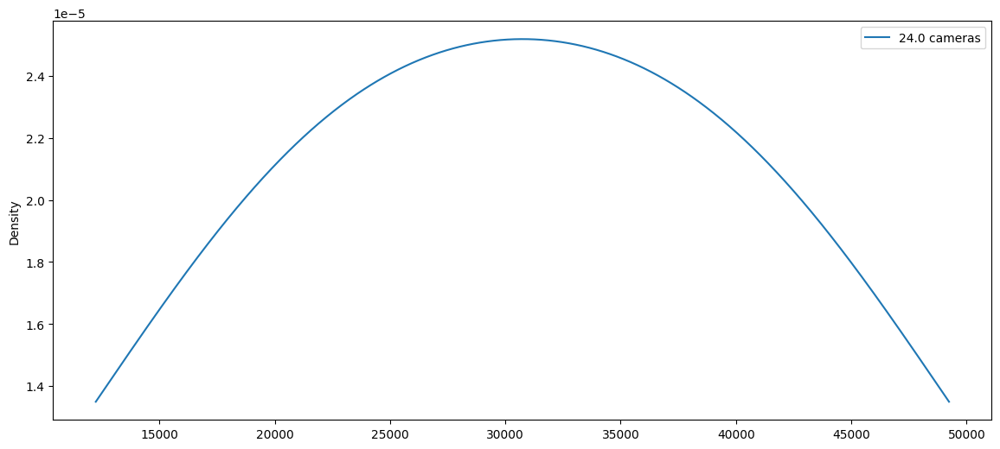

In [351]:
# 1D kde plot

# ... your existing code to create the DataFrame (df) ...
MP = df['primary_camera_rear'].value_counts().index.tolist()

for i in MP:
    subset = df[df['primary_camera_rear'] == i]['price']
    
    # Check if subset has more than one element before plotting
    if not subset.empty and len(subset) > 1:
        plt.figure(figsize=(14, 6))
        subset.plot(kind='kde', label=f'{i} cameras')

        # Print skewness only if the subset has more than one element
        print(f'skew of {i} MP: ', subset.skew())
        plt.legend()

# Add legend and display the plot after the loop (assuming all plots fit)
# if len(MP) > 1:  # Check if there's more than one camera count
#     plt.legend()

plt.show()


C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<AxesSubplot: xlabel='num_cores', ylabel='price'>

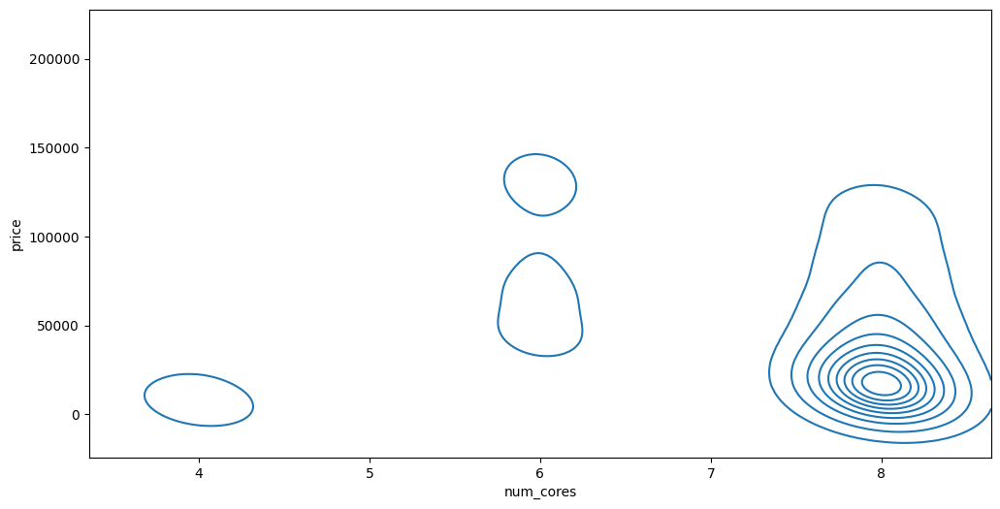

In [352]:
# 2D kde plot
plt.figure(figsize = (12,6))
sns.kdeplot(data = df, x = 'num_cores', y = 'price')
# values are more dense at octa-core.

In [353]:
# - Since "num_cores" is a discrete nominal variable and "price" is a continuous variable with non-normally distributed data 
#   and numerous outliers, a suitable correlation test would be the Kendall rank correlation coefficient (Kendall's tau).
#   This test measures the association between two ordinal variables or between one ordinal and one continuous variable.

# - Here's how you can perform Kendall's tau correlation test in Python:

filtered_df = df.dropna(subset=['num_cores', 'price'])

# Calculate Kendall's tau correlation coefficient and p-value
tau, p_value = stats.kendalltau(filtered_df['num_cores'], filtered_df['price'])

print("Kendall's tau correlation coefficient:", tau)
print("p-value:", p_value)

# - Here, the calculated Kendall's tau correlation coefficient is approximately -0.133, which indicates a weak negative
#   association between the number of cores and the price.

# - The p-value associated with the correlation coefficient measures the probability of obtaining the observed correlation 
#   coefficient (or an even more extreme value) if the null hypothesis were true, i.e., if there were no association between 
#   the variables in the population.

# - The p-value provided in the output is very small (1.2521383625503811e-06), indicating strong evidence against the null
#   hypothesis. Therefore, we reject the null hypothesis and conclude that there is a statistically significant negative
#   correlation between the number of cores and the price.

# - In summary, although the negative correlation is weak, it is statistically significant, meaning that there is evidence
#   to suggest that as the number of cores increases, the price tends to decrease, or vice versa.

Kendall's tau correlation coefficient: -0.13282710877350368
p-value: 1.2521383625503811e-06


In [354]:

# 8 x 0
# num_cores x brand_name
pd.crosstab(df['num_cores'],df['brand_name'])

brand_name,apple,google,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
num_cores,,,,,,,,,,,,,,,,
4.0,1,0,0,0,2,0,0,0,0,0,2,0,2,3,3,3
6.0,39,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8.0,1,14,13,14,27,32,52,12,42,88,39,97,130,30,108,130


In [355]:
# Create a contingency table
contingency_table = pd.crosstab(df['num_cores'], df['brand_name'])

# Compute Chi-square statistic
chi2, _, _, _ = stats.chi2_contingency(contingency_table)

# Calculate Cramér's V
num_cores = contingency_table.shape[0]
brand_name = contingency_table.shape[1]
cramers_v = np.sqrt(chi2 / (len(df) * (min(num_cores, brand_name) - 1)))

print("Cramer's V:", cramers_v)

# A Cramér's V value of 0.696 indicates a strong association between the 'num_cores' and 'brand_name' variables in your dataset.
# This suggests that the number of cores in a device (e.g., CPU cores in a smartphone) and the brand name are closely related.

Cramer's V: 0.696659274344119


- Since Cramér's V indicates the association between two categorical variables, a post-hoc test may not be applicable in this
  context. Post-hoc tests are typically used after conducting an analysis of variance (ANOVA) or other parametric tests to 
  further analyze the differences between specific groups. However, for categorical variables like 'num_cores' and 'brand_name',
  the strength of association is already captured by Cramér's V. Therefore, no post-hoc test is typically performed in this 
  scenario.

In [356]:
# 8 x 24
# num_cores x os
pd.crosstab(df['num_cores'],df['os'])

os,Android,Other,iOS
num_cores,,,
4.0,15,0,1
6.0,0,0,39
8.0,813,8,1


<AxesSubplot: ylabel='count'>

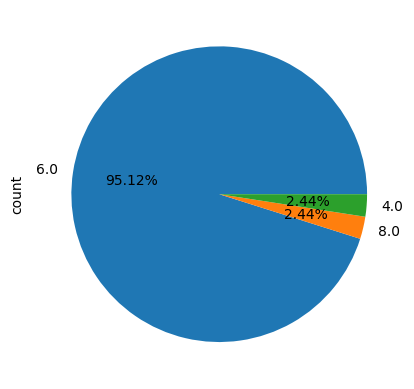

In [357]:
df[df['os'] == 'iOS']['num_cores'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
# 95.12%  of iOS model have hexa-core(6.0) processor.

num_cores x price
Average price of smartphones with Hexa-core processor is significantly higher than Octa and Quad cores.

After checking the data it is because of Apple brand smartphones. It is the only brand with Hexa-core processors.

Apple brand smartphones, which are the only ones with Hexa-core processors, have a significantly higher average price compared
to those with Octa and Quad cores.

hexa-core distribution is the only distribution without any outliers.

values are more dense at octa-core.

Kendall's tau correlation: In summary, although the negative correlation is weak, it is statistically significant, meaning 
        that there is evidence to suggest that as the number of cores increases, the price tends to decrease, or vice versa.
    
num_cores x brand_name
Cramér's V: value of 0.696 indicates a strong association between the 'num_cores' and 'brand_name' variables in your dataset.
    This suggests that the number of cores in a device (e.g., CPU cores in a smartphone) and the brand name are closely related.

num_cores x os
95.12%  of iOS model have hexa-core(6.0) processor.
98.19%  of Android model have octa-core(8.0) processor.

<AxesSubplot: ylabel='count'>

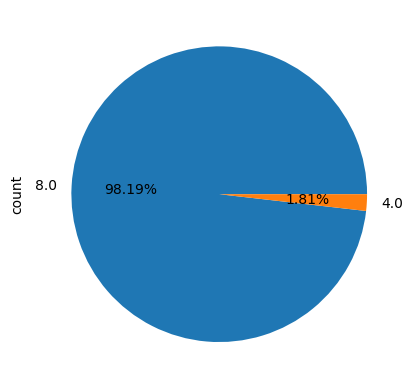

In [358]:
df[df['os'] == 'Android']['num_cores'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
# 98.19%  of Android model have octa-core(8.0) processor.

<AxesSubplot: xlabel='processor_speed', ylabel='price'>

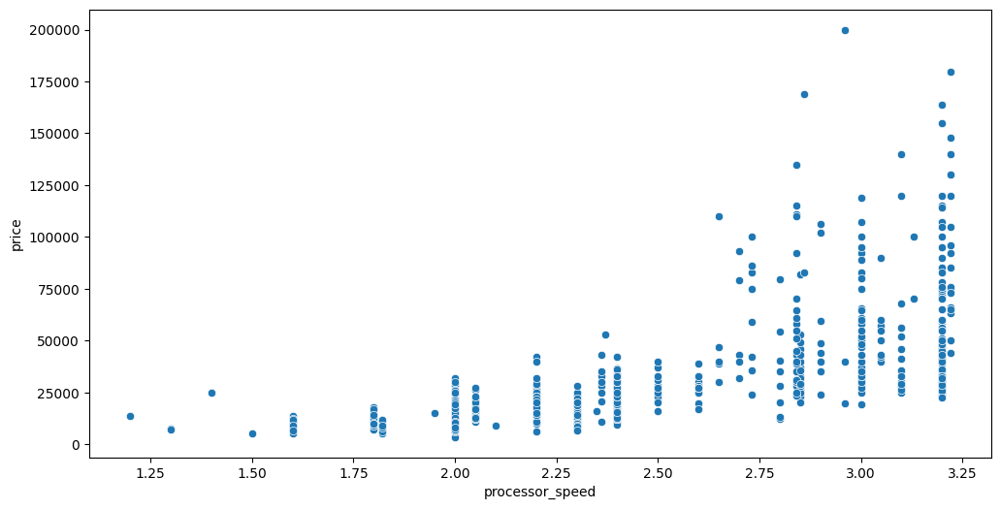

In [359]:
# 9 x 2
# processor_speed x price
plt.figure(figsize = (12,6))
sns.scatterplot(data = df,x = 'processor_speed',y = 'price')

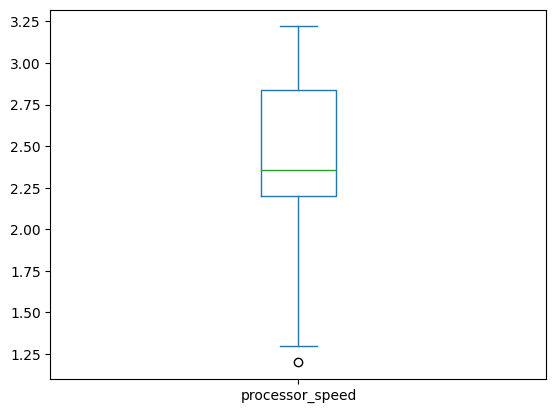

0.36179478782257735

In [360]:
df['processor_speed'].plot(kind = 'box')
plt.show()
df['processor_speed'].skew()

- Since you're analyzing the correlation between a continuous variable (processor speed) and another continuous variable 
  (price), a post-hoc test may not be applicable in this context. Post-hoc tests are typically used after conducting analysis
  of variance (ANOVA) or other similar tests that compare means between groups.

- In the case of a correlation analysis between two continuous variables, the Spearman correlation coefficient and its 
  associated p-value are usually sufficient to assess the strength and significance of the relationship. If you have specific
  hypotheses or research questions that require further investigation, you may consider exploring additional analyses or 
  conducting subgroup analyses based on relevant categorical variables.

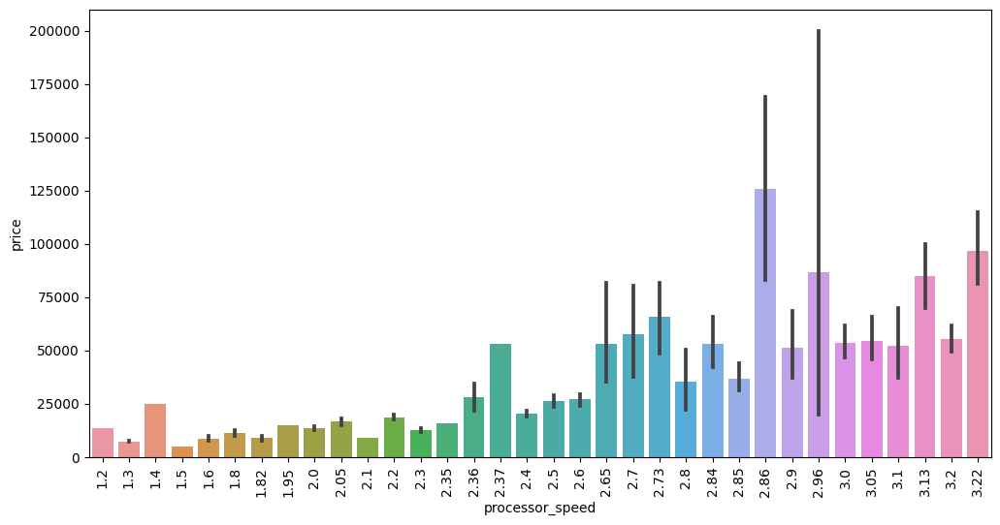

In [361]:
plt.figure(figsize = (12,6))
sns.barplot(data = df, x = 'processor_speed', y = 'price')
plt.xticks(rotation = 'vertical')
plt.show()

In [362]:
# Calculate Spearman's rank correlation coefficient

filtered_df = df.dropna(subset = ['processor_speed','price'])

spearman_corr, p_value = stats.spearmanr(filtered_df['processor_speed'], filtered_df['price'])

print("Spearman correlation coefficient:", spearman_corr)
print("p-value:", p_value)

# The Spearman correlation coefficient between processor speed and price is approximately 0.778, indicating a strong positive
# monotonic relationship between the two variables. Additionally, the p-value associated with the correlation coefficient is
# extremely low (close to zero), indicating that the observed correlation is statistically significant. This suggests that as 
# processor speed increases, the price tends to increase as well.

Spearman correlation coefficient: 0.777515430003118
p-value: 5.279594028003957e-173


In [363]:
df.groupby(df['processor_speed'])['price'].describe().sort_values(by = '50%')

,count,mean,std,min,25%,50%,75%,max
processor_speed,,,,,,,,
1.50,1.0,4999.000000,NaN,4999.0,4999.00,4999.0,4999.00,4999.0
1.30,2.0,7249.000000,353.553391,6999.0,7124.00,7249.0,7374.00,7499.0
1.82,10.0,8730.200000,2003.819342,5299.0,8074.00,8815.0,9374.00,11879.0
1.60,15.0,8724.200000,2357.166162,5249.0,6822.00,8990.0,9999.00,13499.0
2.10,1.0,8999.000000,NaN,8999.0,8999.00,8999.0,8999.00,8999.0
1.80,18.0,11186.444444,3226.509993,6999.0,8962.25,9990.0,13689.25,17999.0
2.30,82.0,12527.548780,4357.871576,6490.0,9004.75,11999.0,14329.00,27990.0
2.00,134.0,13507.373134,5211.929987,3499.0,9999.00,12230.0,15999.00,31999.0
1.20,1.0,13490.000000,NaN,13490.0,13490.00,13490.0,13490.00,13490.0


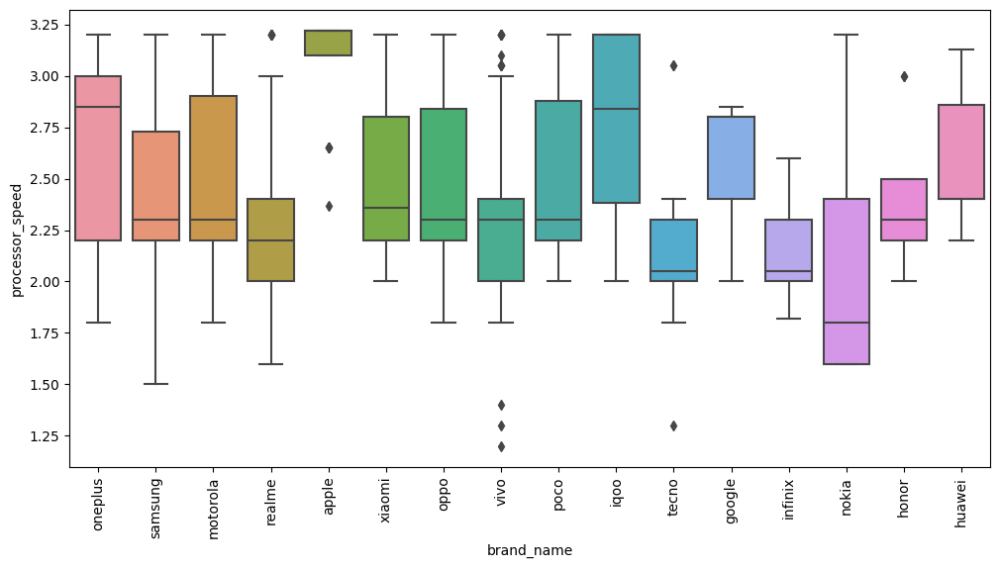

In [364]:
# 9 x 0
# processor_speed x brand_name

plt.figure(figsize = (12,6))
sns.boxplot(data = df, x = 'brand_name', y = 'processor_speed')
plt.xticks(rotation = 'vertical')
plt.show()
# 'samsung' has highest range of processor speed. Followed by 'nokia'.

In [365]:
df.groupby(df['brand_name'])['processor_speed'].describe().sort_values(by = 'min')
# both min and max of 'apple' brand processor speed are highest. Second highest min and max processor speed brand is "xiaomi".

,count,mean,std,min,25%,50%,75%,max
brand_name,,,,,,,,
vivo,107.0,2.371963,0.435737,1.20,2.00,2.30,2.4000,3.20
tecno,33.0,2.148485,0.311620,1.30,2.00,2.05,2.3000,3.05
samsung,119.0,2.423109,0.410830,1.50,2.20,2.30,2.7300,3.20
nokia,12.0,2.116667,0.657590,1.60,1.60,1.80,2.4000,3.20
realme,97.0,2.289072,0.434075,1.60,2.00,2.20,2.4000,3.20
motorola,52.0,2.453846,0.442463,1.80,2.20,2.30,2.9000,3.20
oneplus,41.0,2.673902,0.467145,1.80,2.20,2.85,3.0000,3.20
oppo,88.0,2.463864,0.374658,1.80,2.20,2.30,2.8400,3.20
infinix,29.0,2.136897,0.193780,1.82,2.00,2.05,2.3000,2.60


In [366]:
# To perform the Kruskal-Wallis test between two variables, such as processor_speed and brand_name, you typically need to have groups within each variable. However, in your case, processor_speed is continuous and brand_name is categorical. Therefore, you would need to aggregate the processor_speed data into groups based on brand_name.

# Here's how you can perform the Kruskal-Wallis test:

#     Group the data: Aggregate the processor_speed data based on the brand_name groups.
#     Apply the Kruskal-Wallis test: Use the grouped data to perform the test.

# Here's a general outline of the code:

# python

filtered_df = df.dropna(subset = ['brand_name', 'processor_speed'])

# Group processor_speed by brand_name
grouped_data = filtered_df.groupby('brand_name')['processor_speed'].apply(list)

# Perform Kruskal-Wallis test
kruskal_statistic, p_value = stats.kruskal(*grouped_data)

print("Kruskal-Wallis statistic:", kruskal_statistic)
print("p-value:", p_value)

# This code will group the processor_speed data by brand_name and then perform the Kruskal-Wallis test using the grouped data. The Kruskal-Wallis test assesses whether the distributions of processor_speed differ significantly across different brands.


# output:
# The value of the Kruskal-Wallis statistic, in this case, is 137.60. This value indicates the degree of variability or difference among the groups (brands) in terms of their processor_speed. A larger Kruskal-Wallis statistic suggests a greater difference in processor_speed between the brands.

# In summary, a Kruskal-Wallis statistic of 137.60 indicates a substantial difference in processor_speed across the various brands included in the analysis.

# The Kruskal-Wallis test statistic is 137.60, and the corresponding p-value is approximately 6.84×10−226.84×10−22.

# This result suggests that there is a significant difference in the distribution of processor_speed across different brands. In other words, the processor_speed varies significantly depending on the brand of the device.

Kruskal-Wallis statistic: 137.6007780064492
p-value: 6.838746878446643e-22


<AxesSubplot: xlabel='os', ylabel='processor_speed'>

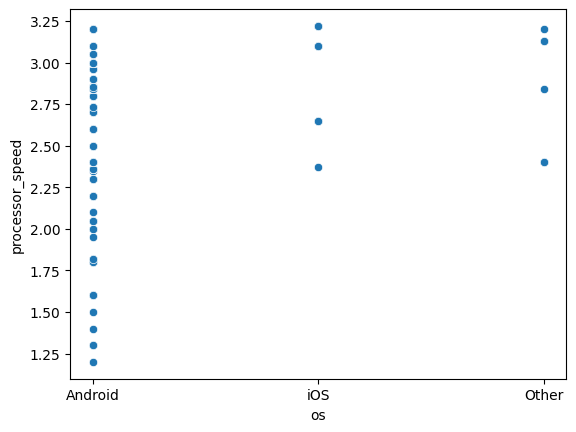

In [367]:
# 9 x 24
# processor_speed x os
sns.scatterplot(data = df,x = 'os',y = 'processor_speed')

In [368]:
pd.crosstab(df['processor_speed'],df['os'])

os,Android,Other,iOS
processor_speed,,,
1.20,1,0,0
1.30,2,0,0
1.40,1,0,0
1.50,1,0,0
1.60,15,0,0
1.80,18,0,0
1.82,10,0,0
1.95,1,0,0
2.00,134,0,0


<AxesSubplot: ylabel='count'>

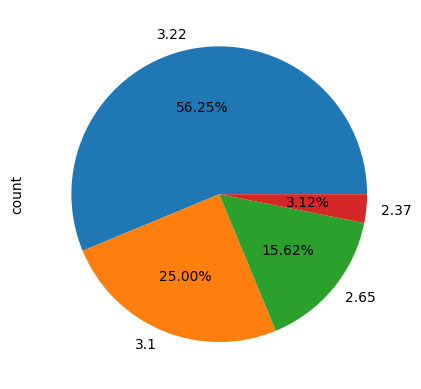

In [369]:
df[df['os'] == 'iOS']['processor_speed'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
# There are only 4 categories in iOS model smartphones. 3.22 processor speed is has highest percentage of models which is 56.25%
# Followed by 25.00% belongs to 3.1. Followed by 2.65 which has 15.62%. ramaining 3.12% belongs to 2.37 processor speed.

In [370]:
df[(df['processor_speed'] >= 2.0) & (df['processor_speed'] <= 2.4)].shape[0]/df['processor_speed'].shape[0]
# 57.07% of models fall between 2.0 to 2.4 processor  speed in Andriod category.

0.5707865168539326

<AxesSubplot: ylabel='count'>

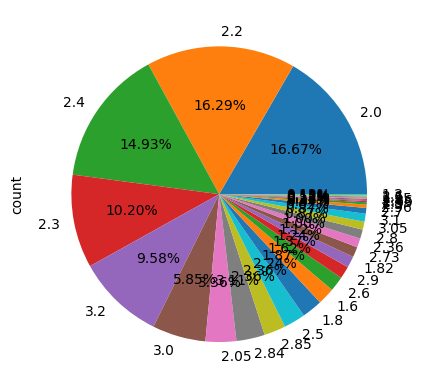

In [371]:
df[df['os'] == 'Android']['processor_speed'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
# 73.52%  of models in Android category comes under top 6 . First highest is 16.67% for 2.0. Second highest is 16.29% for 2.2.
# Third highest for 2.4 with 14.93%. Fourth highest for 2.3 with 10.20%. Fifth highest for 3.2 with 9.58%. sixth highest for
# 3.0 with 5.85%

Bivariate Analysis:-
Processor speed x price:
Spearman's correlation coefficient between processor speed and price is approximately 0.778, indicating a strong positive monotonic relationship between the two variables. Additionally, the p-value associated with the correlation coefficient is extremely low (close to zero), indicating that the observed correlation is statistically significant. This suggests that as processor speed increases, the price tends to increase as well.

Processor speed x brand_name:
Both the minimum and maximum processor speeds of the 'Apple' brand are the highest. The second-highest maximum processor speed and the third-highest minimum speed belong to the brand "Xiaomi".
‘Vivo’ has the highest range of processor speeds, followed by ‘Tecno’.
Among non-Chinese brands, 'Samsung' has the highest range of processor speeds, followed by 'Nokia'.
The Kruskal-Wallis test statistic is 137.60, indicating a substantial difference in processor_speed across the various brands included in the analysis. This statistic suggests a significant variation in processor_speed between brands (p < 0.001), highlighting that processor_speed varies significantly depending on the brand of the device.

processor_speed x os:
iOS:
There are only 4 categories in iOS model smartphones. The highest percentage of models, 56.25%, has a processor speed of 3.22. This is followed by 25.00% for 3.1, and 15.62% for 2.65. The remaining 3.12% belongs to the 2.37 processor speed.

Android:
57.07% of models fall within the 2.0 to 2.4 processor speed range in the Android category.
73.52% of models in the Android category fall within the top 6 processor speeds. The distribution is as follows: the highest is 16.67% for 2.0, followed by 16.29% for 2.2, 14.93% for 2.4, 10.20% for 2.3, 9.58% for 3.2, and 5.85% for 3.0.
The chi-square statistic measures the discrepancy between observed and expected frequencies, indicating the strength of association between variables. In this case, the chi-square statistic is 991.47 with a very low p-value (approximately 3.65 * 10^-165), providing strong evidence against the null hypothesis of independence. With 66 degrees of freedom, the significant chi-square value indicates a substantial association between the variables. The magnitude of the chi-square statistic is evaluated against critical values from the chi-square distribution to determine statistical significance.


In [372]:
contingency_table = pd.crosstab(df['processor_speed'], df['os'])

# Perform the chi-square test
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)

# Print the results
print("Chi-square statistic:", chi2)
print("p-value:", p_value)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:", expected)


#     Chi-square statistic: 991.4683382204496
#     p-value: 3.6483196856054244e-165
#     Degrees of Freedom: 66
#     Expected Frequencies: This is a matrix showing the expected frequencies under the assumption that the two variables are independent. Each cell of the matrix represents the expected count based on the marginal totals of the contingency table.

# - The chi-square statistic measures the discrepancy between the observed frequencies and the expected frequencies. A higher chi-square value indicates a greater discrepancy and suggests a stronger association between the two variables. The p-value indicates the probability of observing such an extreme chi-square statistic under the null hypothesis of independence. In this case, the very low p-value (close to zero) suggests strong evidence against the null hypothesis, indicating that there is a significant association between the variables.


# - The chi-square statistic measures the extent of discrepancy between the observed frequencies and the expected frequencies under the assumption of independence between the two variables. In this case, the chi-square statistic is approximately 991.47.

# - The p-value associated with the chi-square statistic is extremely low (approximately 3.65 * 10^-165). This indicates that the probability of observing such an extreme chi-square statistic under the null hypothesis (i.e., the variables are independent) is extremely small. With such a low p-value, we reject the null hypothesis and conclude that there is a significant association between the variables.

# - The degrees of freedom (df) for the chi-square test is 66. Degrees of freedom represent the number of values in the final calculation of a statistic that are free to vary. In the context of the chi-square test, the degrees of freedom depend on the dimensions of the contingency table and are calculated as (number of rows - 1) * (number of columns - 1).


# - The absolute value of the chi-square statistic itself doesn't indicate whether it's high or low; its significance depends on the context of the specific analysis.

# - However, in practical terms, a chi-square statistic of 991.47 is quite large, especially considering the number of degrees of freedom (66). Large chi-square values indicate a substantial discrepancy between the observed and expected frequencies, suggesting a strong association between the variables being analyzed.

# - In the context of a chi-square test, the magnitude of the chi-square statistic is compared against critical values from the chi-square distribution to determine statistical significance. The extremely low p-value (3.65 * 10^-165) suggests that the observed association between the variables is highly significant, further supporting the interpretation that the chi-square statistic is substantial.

Chi-square statistic: 991.4683382204496
p-value: 3.6483196856054244e-165
Degrees of Freedom: 66
Expected Frequencies: [[9.53736655e-01 8.30367734e-03 3.79596679e-02]
 [1.90747331e+00 1.66073547e-02 7.59193357e-02]
 [9.53736655e-01 8.30367734e-03 3.79596679e-02]
 [9.53736655e-01 8.30367734e-03 3.79596679e-02]
 [1.43060498e+01 1.24555160e-01 5.69395018e-01]
 [1.71672598e+01 1.49466192e-01 6.83274021e-01]
 [9.53736655e+00 8.30367734e-02 3.79596679e-01]
 [9.53736655e-01 8.30367734e-03 3.79596679e-02]
 [1.27800712e+02 1.11269276e+00 5.08659549e+00]
 [2.57508897e+01 2.24199288e-01 1.02491103e+00]
 [9.53736655e-01 8.30367734e-03 3.79596679e-02]
 [1.24939502e+02 1.08778173e+00 4.97271649e+00]
 [7.82064057e+01 6.80901542e-01 3.11269276e+00]
 [9.53736655e-01 8.30367734e-03 3.79596679e-02]
 [7.62989324e+00 6.64294187e-02 3.03677343e-01]
 [9.53736655e-01 8.30367734e-03 3.79596679e-02]
 [1.17309609e+02 1.02135231e+00 4.66903915e+00]
 [1.81209964e+01 1.57769870e-01 7.21233689e-01]
 [1.23985765e+01 1

<AxesSubplot: xlabel='screen_size', ylabel='price'>

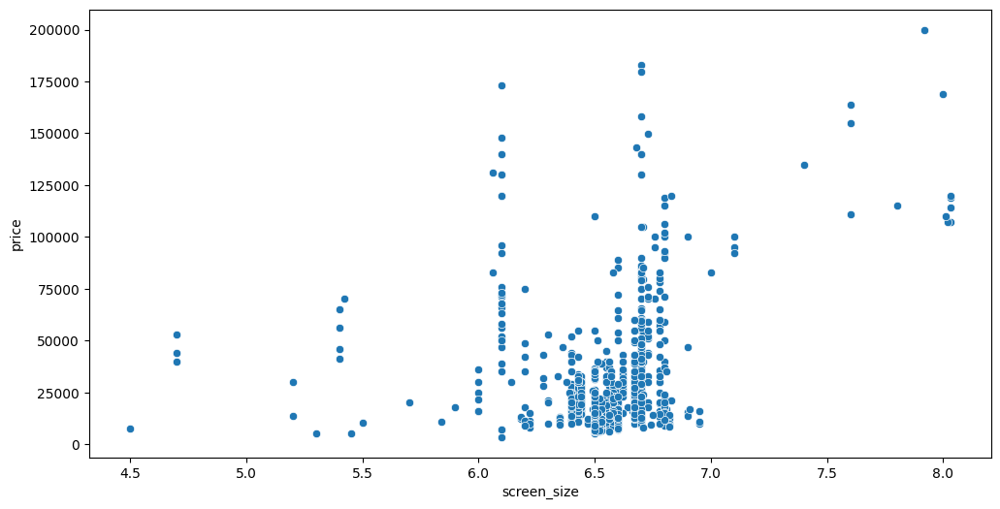

In [373]:
# 16 x 2
# screen_size x price
plt.figure(figsize = (12,6))
sns.scatterplot(data = df,x = 'screen_size',y = 'price')

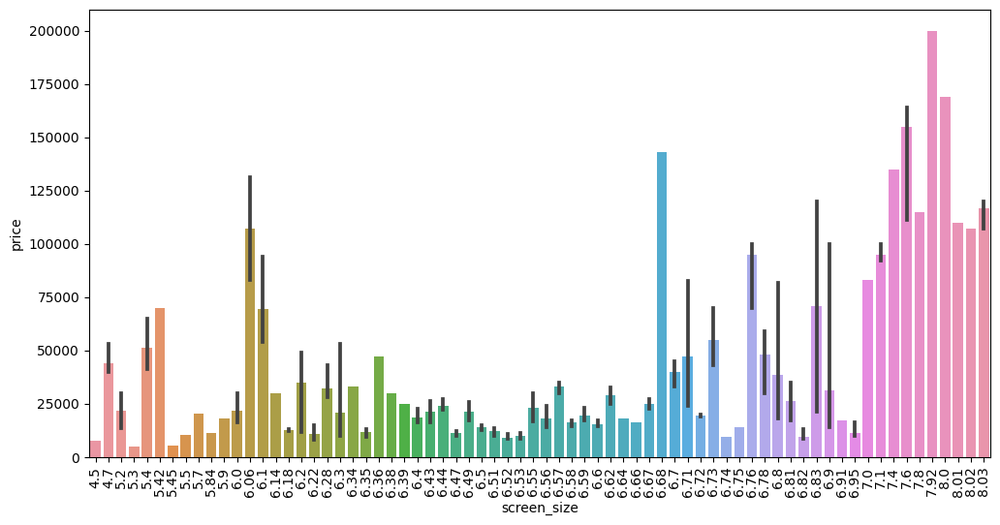

In [374]:
#barplot
plt.figure(figsize = (12,6))
sns.barplot(data = df, x = 'screen_size', y = 'price',estimator = np.median)
plt.xticks(rotation = 'vertical')
plt.show()

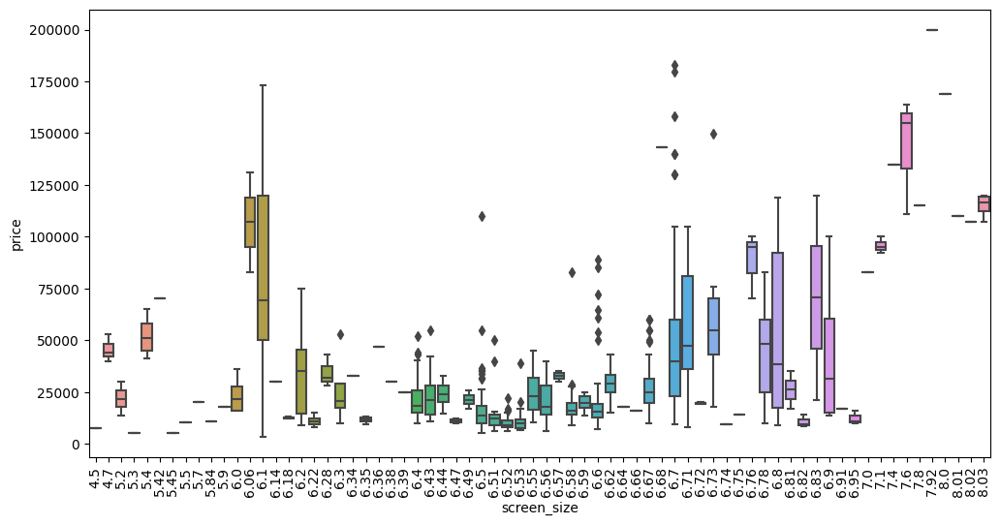

In [375]:
# box plot
plt.figure(figsize = (12,6))
sns.boxplot(data = df, x = 'screen_size', y = 'price')
plt.xticks(rotation = 'vertical')
plt.show()

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


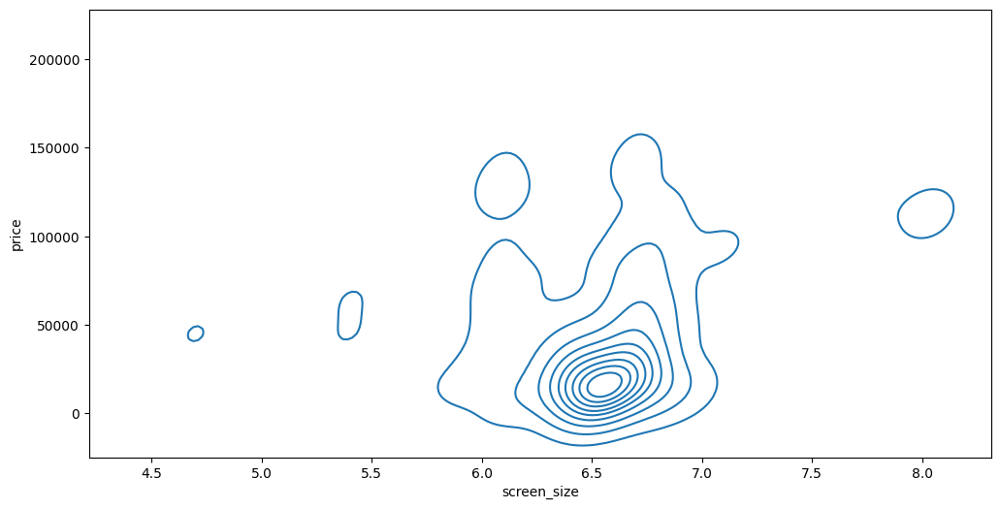

In [376]:
# 2D kde plot
plt.figure(figsize = (12,6))
sns.kdeplot(data = df, x = 'screen_size', y = 'price')
plt.show()
# highest density is around 6.6 screen size.

In [377]:
# Extracting price values for each category of screen_size
screen_sizes = df['screen_size'].unique()
price_by_screen_size = [df[df['screen_size'] == size]['price'].values for size in screen_sizes]

# Performing Kruskal-Wallis Test
kw_statistic, p_value = stats.kruskal(*price_by_screen_size)

print("Kruskal-Wallis statistic:", kw_statistic)
print("p-value:", p_value)

# - The Kruskal-Wallis statistic is a measure of the variance between the groups relative to the variance within the groups. A higher value of the Kruskal-Wallis statistic suggests a larger difference between the groups.

# - The p-value associated with the test measures the probability of observing the data if the null hypothesis (i.e., no difference between groups) were true. Here, the very low p-value (close to zero) indicates strong evidence against the null hypothesis. Therefore, you can conclude that there is a significant difference in prices across different screen sizes.


# - The interpretation of whether a Kruskal-Wallis statistic is considered low or high depends on the context of the data and the specific research question. Generally, the Kruskal-Wallis statistic itself doesn't have an inherent interpretation of being "low" or "high" in an absolute sense. Instead, its magnitude is relative to the variability within the data and the effect size being investigated.

# - In the context of your data and research question, a Kruskal-Wallis statistic of 450.4953642601921 indicates a substantial difference between groups. This suggests that the variability between the groups is significantly larger than the variability within the groups, which is reflected in the p-value being very close to zero. Therefore, in this context, the Kruskal-Wallis statistic can be considered high.

Kruskal-Wallis statistic: 449.4386472662954
p-value: 3.5684449063369394e-57


In [378]:
df[df['screen_size'] == 6.0]['price'].values

array([29990, 15990, 36000, 25000, 15999, 15990, 21490], dtype=int64)

In [379]:
# Perform Dunn's test
results = posthoc_dunn(df, val_col='screen_size', group_col='price', p_adjust='holm')

# Output the results
print(results)

        3499    4999    5249    5299    6171    6249    6299    6490    \
3499       1.0     1.0     1.0     1.0     1.0     1.0     1.0     1.0   
4999       1.0     1.0     1.0     1.0     1.0     1.0     1.0     1.0   
5249       1.0     1.0     1.0     1.0     1.0     1.0     1.0     1.0   
5299       1.0     1.0     1.0     1.0     1.0     1.0     1.0     1.0   
6171       1.0     1.0     1.0     1.0     1.0     1.0     1.0     1.0   
...        ...     ...     ...     ...     ...     ...     ...     ...   
169000     1.0     1.0     1.0     1.0     1.0     1.0     1.0     1.0   
172999     1.0     1.0     1.0     1.0     1.0     1.0     1.0     1.0   
179900     1.0     1.0     1.0     1.0     1.0     1.0     1.0     1.0   
182999     1.0     1.0     1.0     1.0     1.0     1.0     1.0     1.0   
199990     1.0     1.0     1.0     1.0     1.0     1.0     1.0     1.0   

        6499    6999    ...  147900  149900  154998  157999  163980  169000  \
3499       1.0     1.0  ...     

In [380]:
# 16 x 0
# screen_size x brand_name
pd.crosstab(df['screen_size'],df['brand_name'])

brand_name,apple,google,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
screen_size,,,,,,,,,,,,,,,,
4.50,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4.70,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5.20,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
5.30,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
5.40,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7.92,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
8.00,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
8.01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


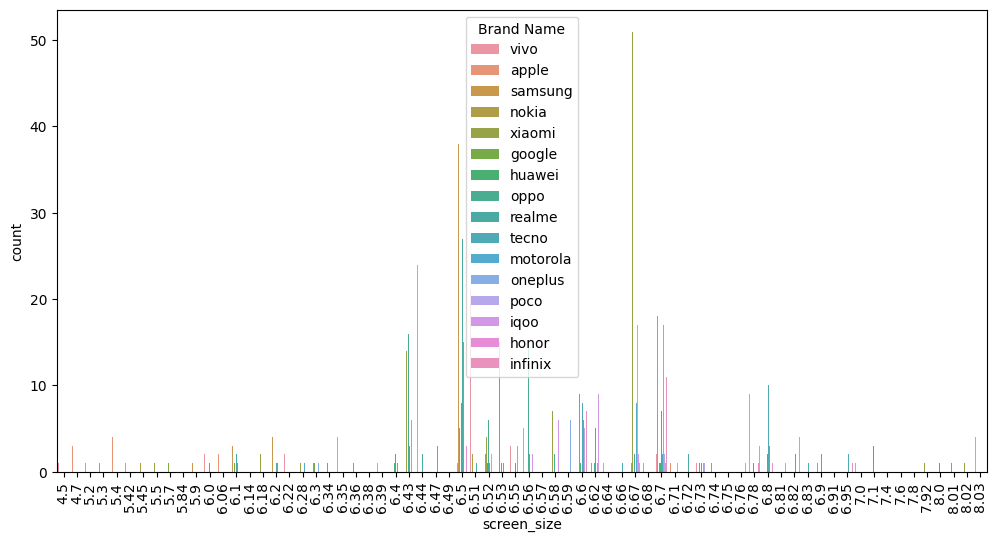

In [381]:
# Clustered Bar Chart
counts = df.groupby(['screen_size', 'brand_name']).size().reset_index(name = 'count')

plt.figure(figsize = (12,6))
sns.barplot(data = counts, x = 'screen_size', y = 'count', hue = 'brand_name')
plt.xticks(rotation = 'vertical')
plt.legend(title = "Brand Name")
plt.show()

# highest cluster is at 6.5. Followed by 6.7. Followed by 6.67. Followed by 6.6. Followed by 6.43.

<AxesSubplot: ylabel='count'>

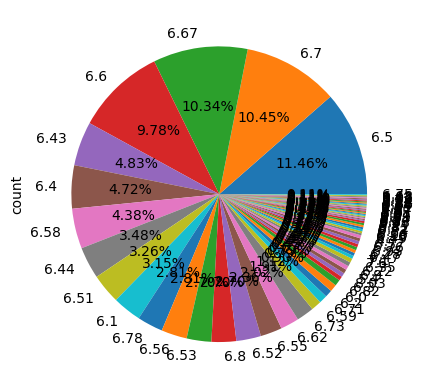

In [382]:
df['screen_size'].value_counts().plot(kind ='pie', autopct = "%.2f%%")

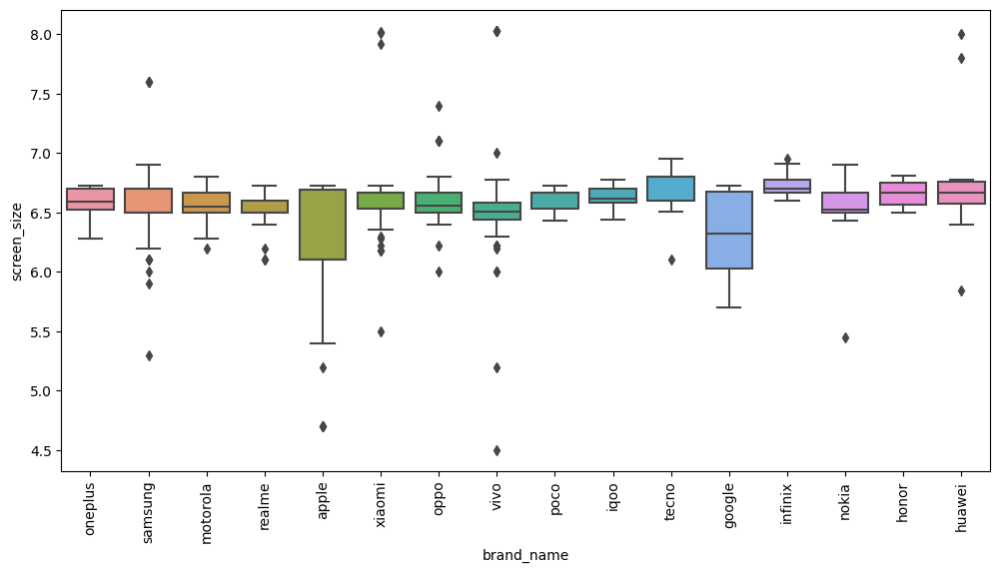

In [383]:
plt.figure(figsize = (12,6))
sns.boxplot(data = df, x = 'brand_name', y = 'screen_size')
plt.xticks(rotation = 'vertical')
plt.show()
# except 'apple' and 'google' remaining all brands distributions distributed in similar range.

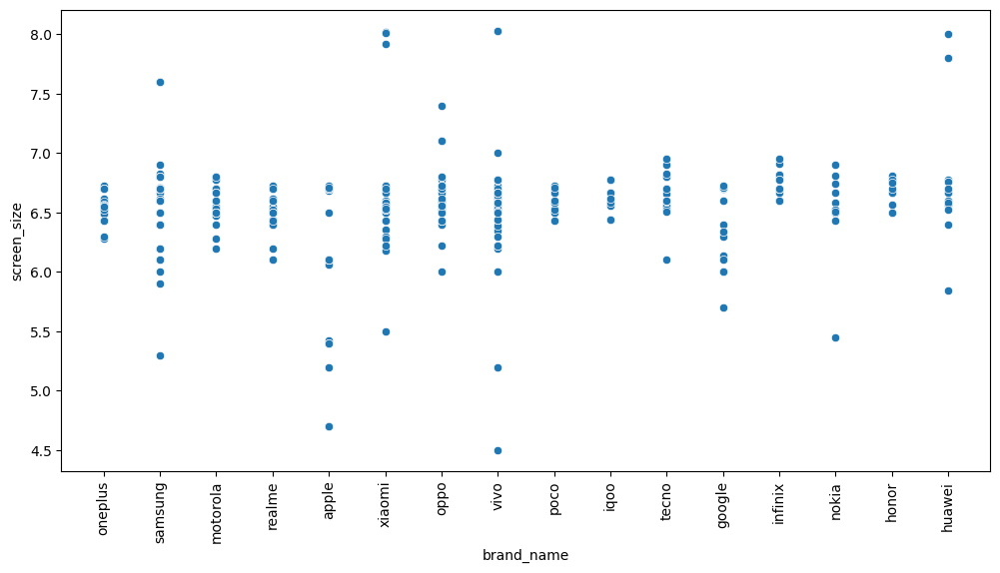

In [384]:
plt.figure(figsize = (12,6))
sns.scatterplot(data = df, x = 'brand_name', y = 'screen_size')
plt.xticks(rotation = 'vertical')
plt.show()

<AxesSubplot: xlabel='screen_size'>

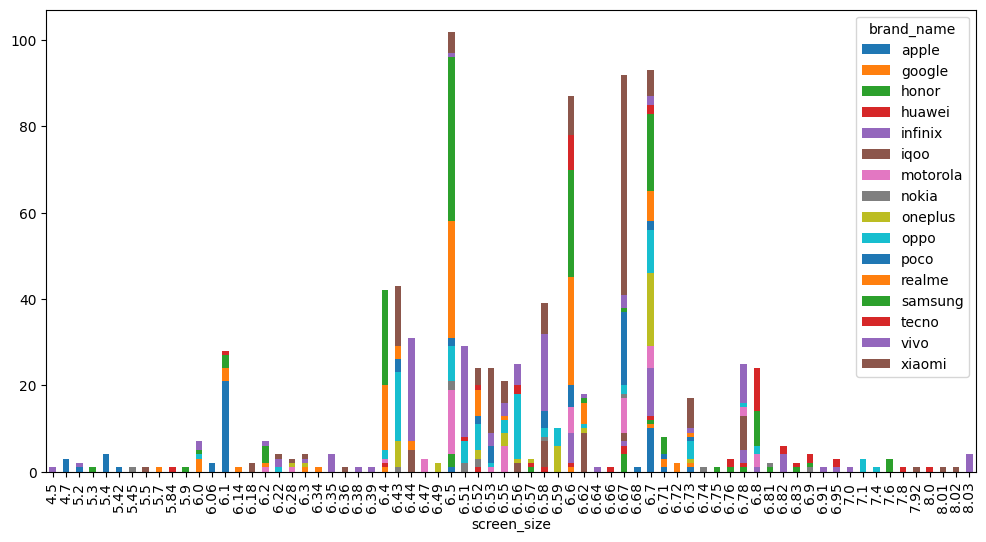

In [385]:
pd.crosstab(df['screen_size'],df['brand_name']).plot(kind = 'bar', stacked = True, figsize = (12,6))
# highest cluster is at 6.5. Followed by 6.7. Followed by 6.67. Followed by 6.6. Followed by 6.43. Followed by 6.4.

In [386]:
# Create a contingency table
contingency_table = pd.crosstab(df['screen_size'], df['brand_name'])

# Perform chi-square test
chi2, _, _, _ = stats.chi2_contingency(contingency_table)

# Calculate Cramer's V
n = contingency_table.sum().sum()
min_dim = min(contingency_table.shape) - 1
cramer_v = (chi2 / (n * min_dim)) ** 0.5

print("Cramer's V:", cramer_v)

# The calculated Cramer's V value for the association between screen_size and brand_name is approximately 0.523. This indicates
# a moderate to strong association between these two variables.

Cramer's V: 0.521695996347752


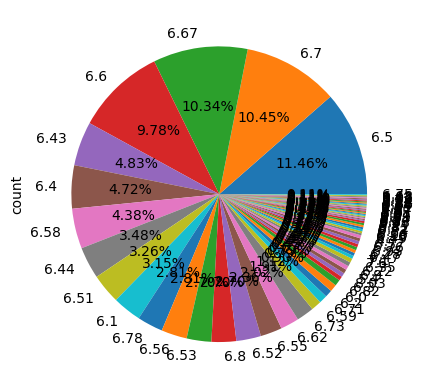

In [387]:
df['screen_size'].value_counts().plot(kind = 'pie', autopct = '%.2f%%');

In [388]:
# total percentage of smartphone models with screen_size between 6.5 and 6.7
df[(df['screen_size'] >= 6.5) & (df['screen_size'] <= 6.7)].shape[0]/df[~df['screen_size'].isnull()].shape[0] * 100

64.04494382022472

In [389]:
# 16 x 24
# screen_size x os
pd.crosstab(df['screen_size'],df['os'])

os,Android,Other,iOS
screen_size,,,
4.50,1,0,0
4.70,0,0,3
5.20,1,0,1
5.30,1,0,0
5.40,0,0,4
...,...,...,...
7.60,3,0,0
7.92,1,0,0
8.01,1,0,0


screen_size x price
highest density is around 6.5 screen size.

The Kruskal-Wallis: statistic is a measure of the variance between the groups relative to the variance within the groups. A higher value of the Kruskal-Wallis statistic suggests a larger difference between the groups.

- The p-value associated with the test measures the probability of observing the data if the null hypothesis (i.e., no difference between groups) were true. Here, the very low p-value (close to zero) indicates strong evidence against the null hypothesis. Therefore, you can conclude that there is a significant difference in prices across different screen sizes.


- The interpretation of whether a Kruskal-Wallis statistic is considered low or high depends on the context of the data and the specific research question. Generally, the Kruskal-Wallis statistic itself doesn't have an inherent interpretation of being "low" or "high" in an absolute sense. Instead, its magnitude is relative to the variability within the data and the effect size being investigated.

- In the context of your data and research question, a Kruskal-Wallis statistic of 450.4953642601921 indicates a substantial difference between groups. This suggests that the variability between the groups is significantly larger than the variability within the groups, which is reflected in the p-value being very close to zero. Therefore, in this context, the Kruskal-Wallis statistic can be considered high.

screen_size x brand_name
highest cluster is at 6.5. Followed by 6.7. Followed by 6.67. Followed by 6.6. Followed by 6.43. Followed by 6.43. 
Followed by 6.4.
except 'apple' and 'google' remaining all brands distributions distributed in similar range.

Cramer's V: value for the association between screen_size and brand_name is approximately 0.523. This indicates
a moderate to strong association between these two variables.

64.04% of smartphone models are screen_size between 6.5 and 6.7.

screen_size x os
76.09% of models in iOS fall in one top3 categories. highest models are in 6.1 screen size with 45.65%. Second highest size 
is 6.7 with 21.74%. Third highest models are in 5.4 size with 8.70%.
53.44% of models in iOS fall in one top6 categories. highest models are in 6.5 screen size with 12.18%. Second highest size 
is 6.67 with 10.98%. Third highest models are in 6.6 size with 10.37%. Fourth highest models are in 6.7 size with 9.65%. 
Fifth highest models are in 6.43 size with 5.19%.  Sixth highest models are in 6.4 size with 5.07%. 

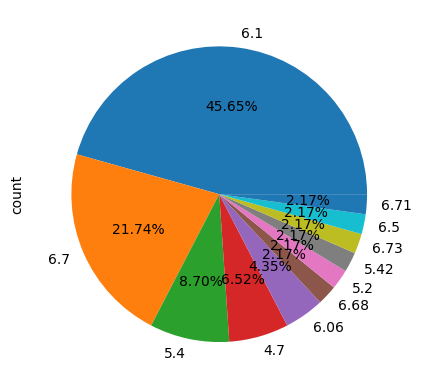

In [390]:
df[df['os'] == 'iOS']['screen_size'].value_counts().plot(kind = 'pie', autopct = '%.2f%%');
# 76.09% of models in iOS fall in one top3 categories. highest models are in 6.1 screen size with 45.65%. Second highest size 
# is 6.7 with 21.74%. Third highest models are in 5.4 size with 8.70%.

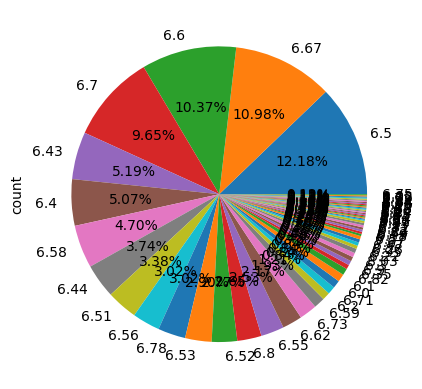

In [391]:
df[df['os'] == 'Android']['screen_size'].value_counts().plot(kind = 'pie', autopct = '%.2f%%');
# 53.44% of models in Android fall in one top6 categories. highest models are in 6.5 screen size with 12.18%. Second highest 
# size is 6.67 with 10.98%. Third highest models are in 6.6 size with 10.37%. Fourth highest models are in 6.7 size with 9.65%. 
# Fifth highest models are in 6.43 size with 5.19%.  Sixth highest models are in 6.4 size with 5.07%. 

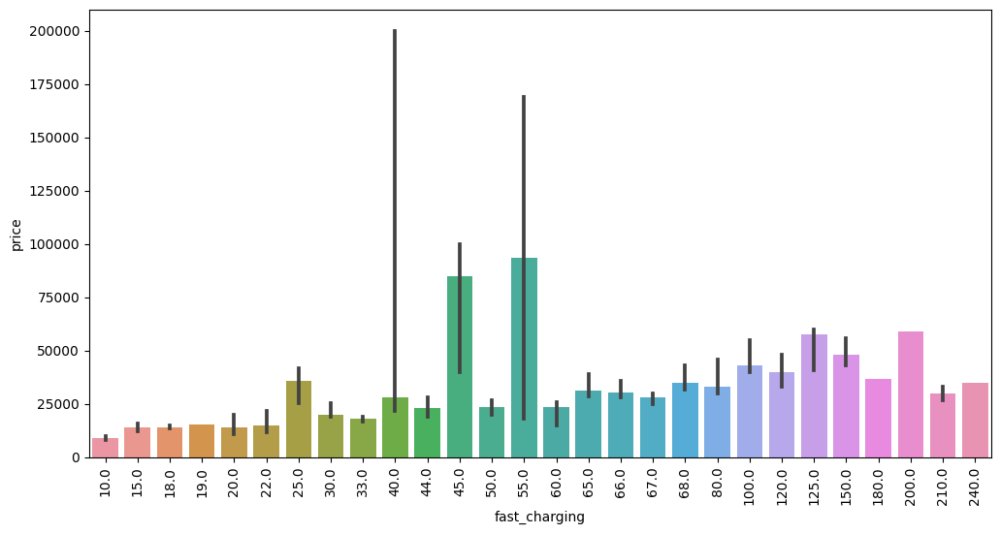

In [392]:
# 13 x 2
# fast_charging x price

#barplot
plt.figure(figsize = (12,6))
sns.barplot(data = df, x = 'fast_charging', y = 'price',estimator = np.median)
plt.xticks(rotation = 'vertical')
plt.show()
# The first highest median price is at category 55watts. Second highest is at 45watts.

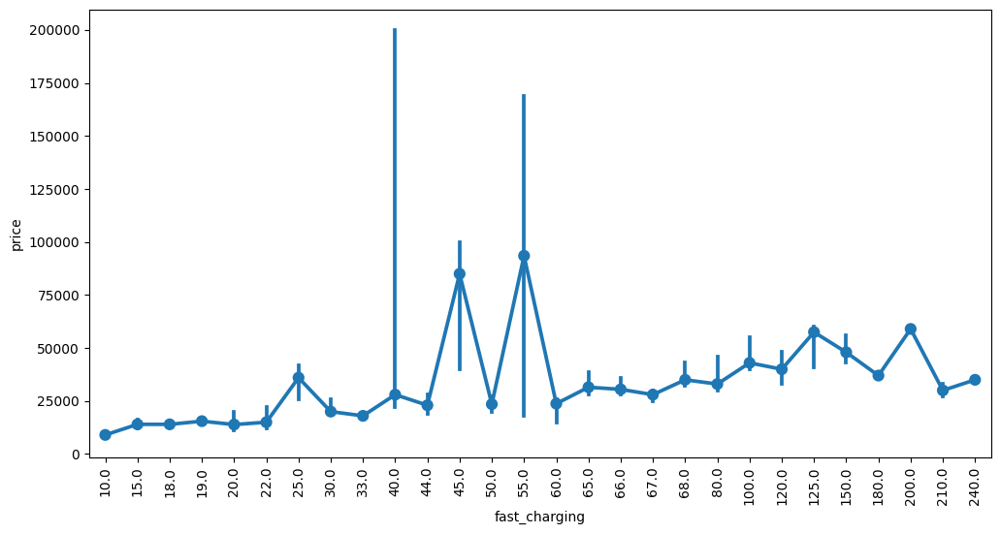

In [393]:
# point plot
plt.figure(figsize = (12,6))
sns.pointplot(data = df, x = 'fast_charging', y = 'price',estimator = np.median)
plt.xticks(rotation = 'vertical')
plt.show()
# The first highest median price is at category 55.0. Second highest is at 45.0.

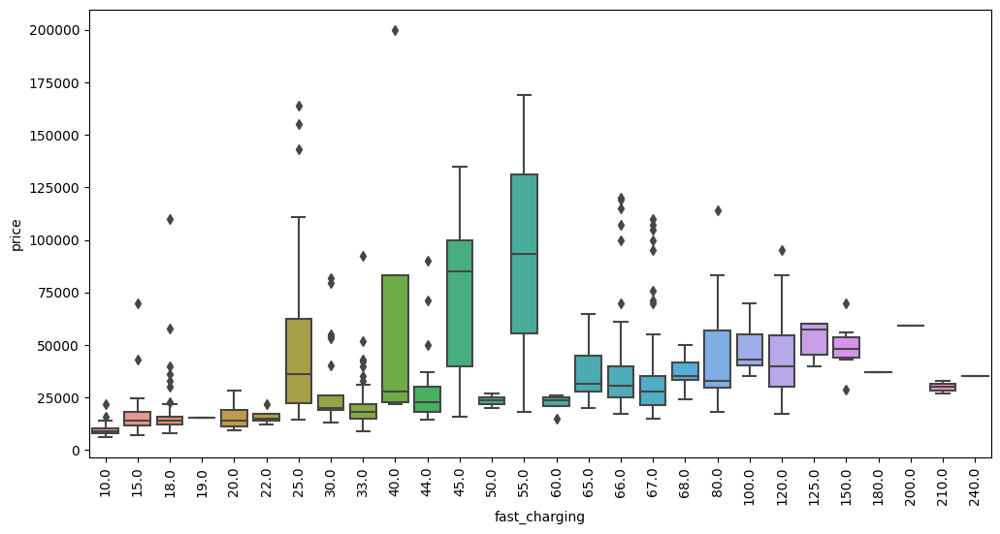

In [394]:
# box plot
plt.figure(figsize = (12,6))
sns.boxplot(data = df, x = 'fast_charging', y = 'price')
plt.xticks(rotation = 'vertical')
plt.show()
# both 55.0 and 45.0 are only two wide distributions without outliers.

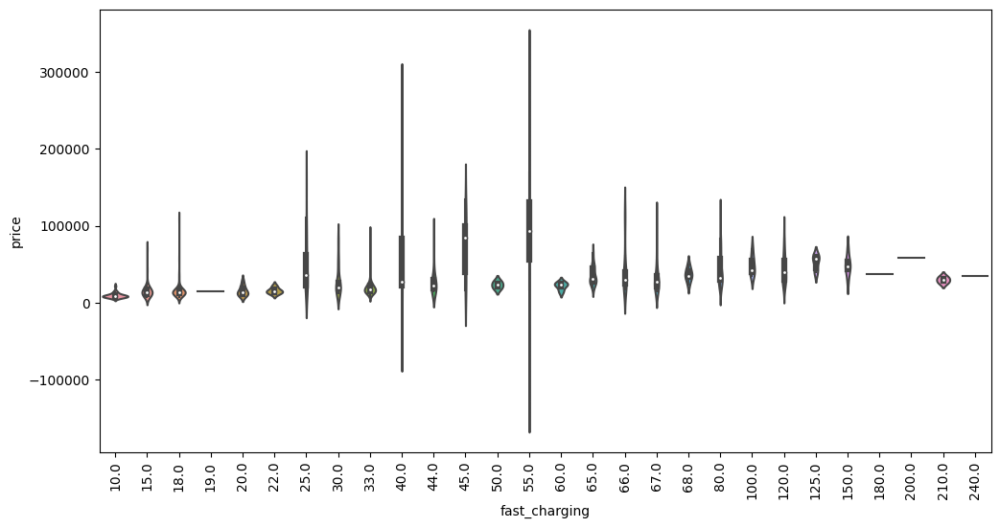

In [395]:
# violin plot
plt.figure(figsize = (12,6))
sns.violinplot(data = df, x = 'fast_charging', y = 'price')
plt.xticks(rotation = 'vertical')
plt.show()

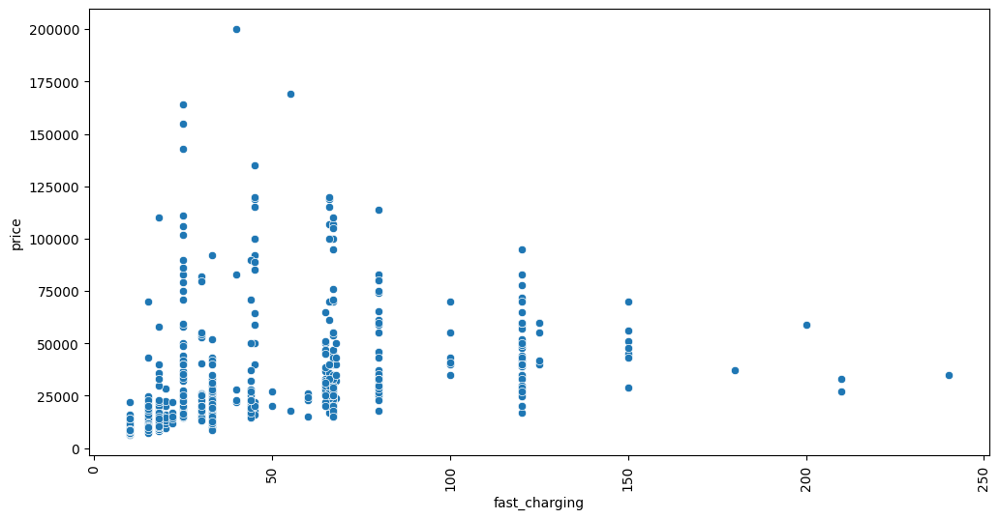

In [396]:
# scatter plot
plt.figure(figsize = (12,6))
sns.scatterplot(data = df, x = 'fast_charging', y = 'price')
plt.xticks(rotation = 'vertical')
plt.show()

skew of 50.0 MP:  2.0294384512650296
skew of 64.0 MP:  3.4723384890247915
skew of 48.0 MP:  2.983004213310838
skew of 13.0 MP:  5.235328206762575
skew of 108.0 MP:  2.7595177526409707
skew of 12.0 MP:  0.6904696381683239
skew of 8.0 MP:  -0.18566282309528542
skew of 200.0 MP:  1.3205144618102111
skew of 16.0 MP:  2.1093044342194243
skew of 12.2 MP:  0.222288364936479
skew of 50.3 MP:  1.6430499828487446
skew of 54.0 MP:  -1.6538067593711279
skew of 5.0 MP:  -1.38963613870649
skew of 24.0 MP:  nan


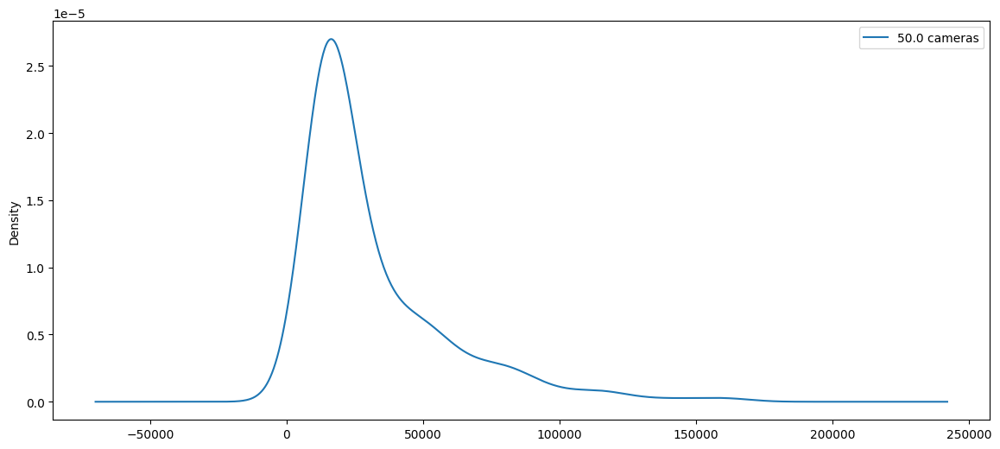

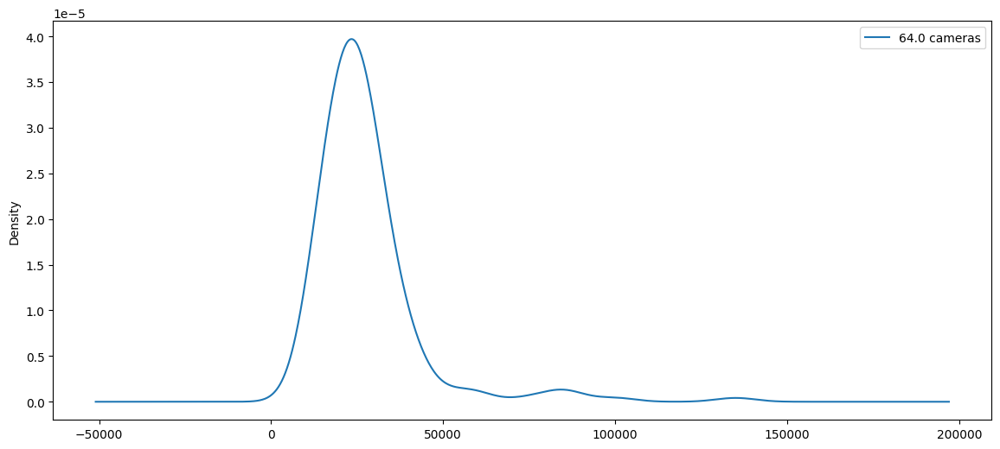

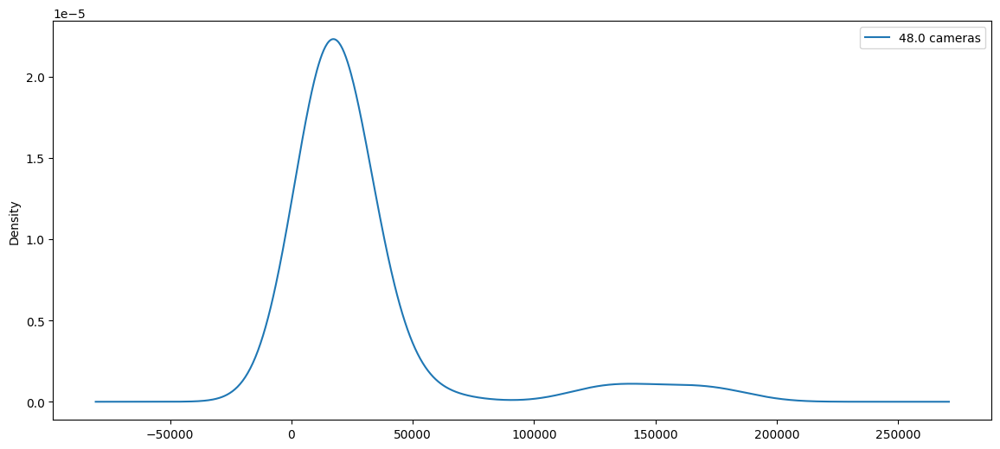

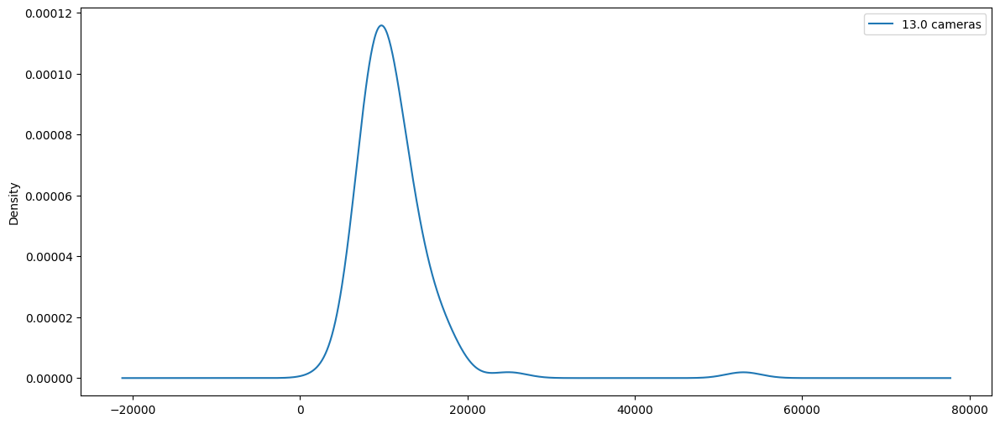

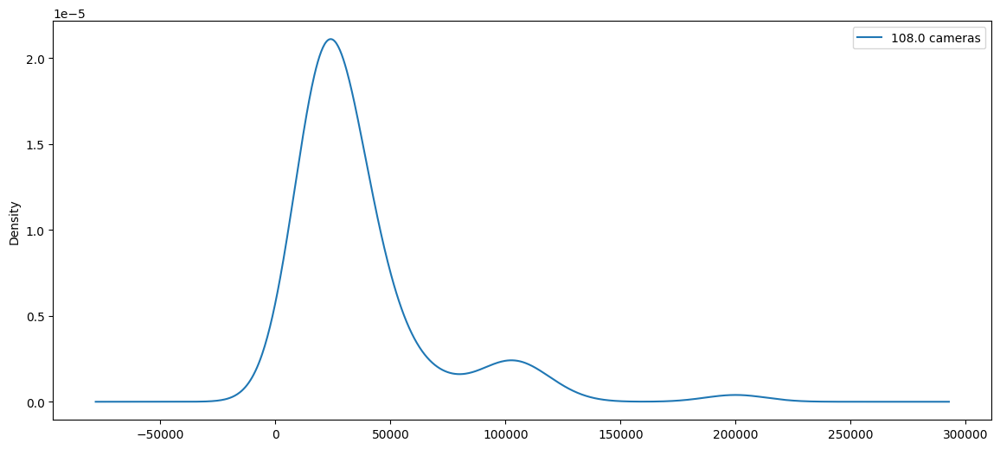

...

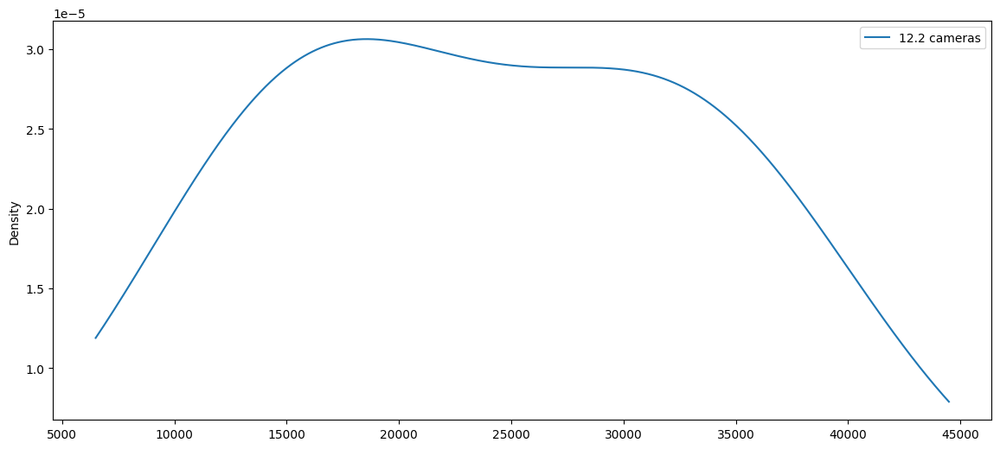

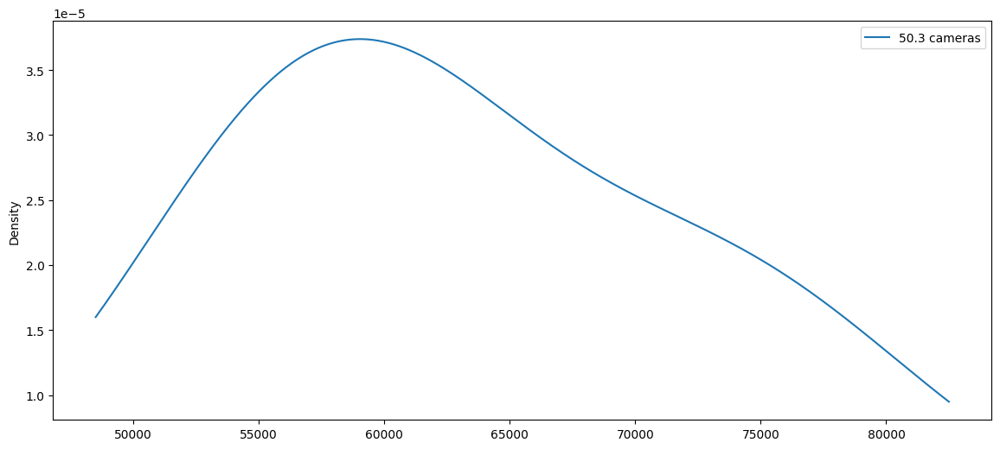

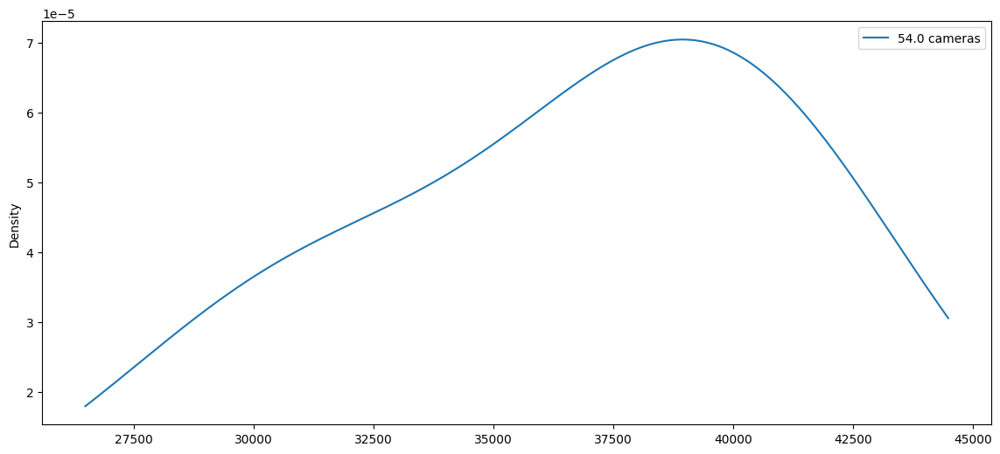

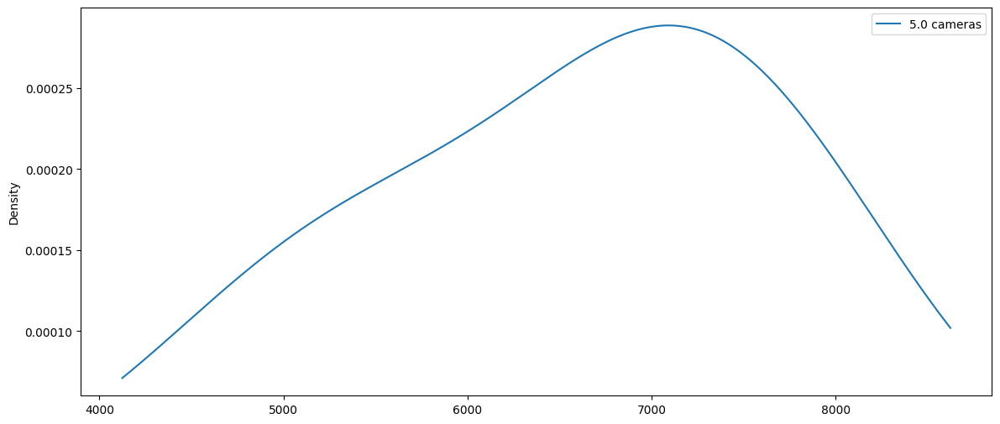

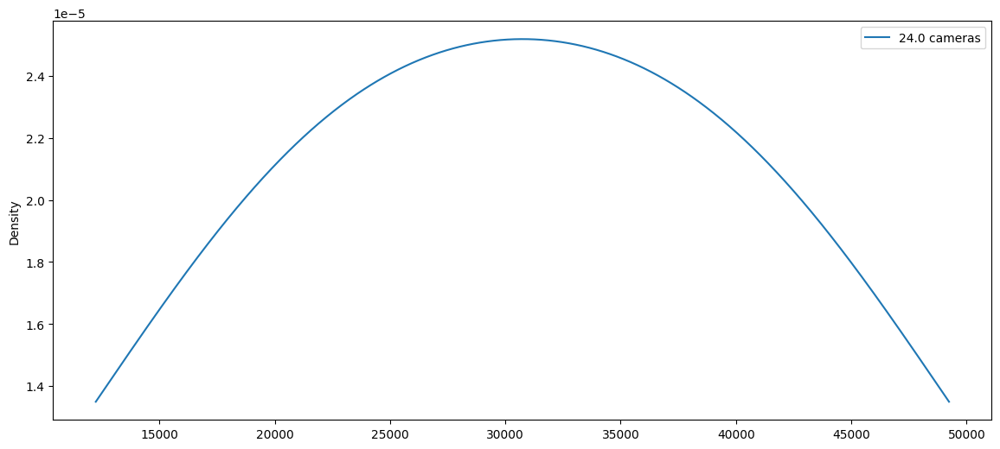

In [397]:
# 1D kde plot

# ... your existing code to create the DataFrame (df) ...
MP = df['primary_camera_rear'].value_counts().index.tolist()

for i in MP:
    subset = df[df['primary_camera_rear'] == i]['price']
    
    # Check if subset has more than one element before plotting
    if not subset.empty and len(subset) > 1:
        plt.figure(figsize=(14, 6))
        subset.plot(kind='kde', label=f'{i} cameras')

        # Print skewness only if the subset has more than one element
        print(f'skew of {i} MP: ', subset.skew())
        plt.legend()

# Add legend and display the plot after the loop (assuming all plots fit)
# if len(MP) > 1:  # Check if there's more than one camera count
#     plt.legend()

plt.show()

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


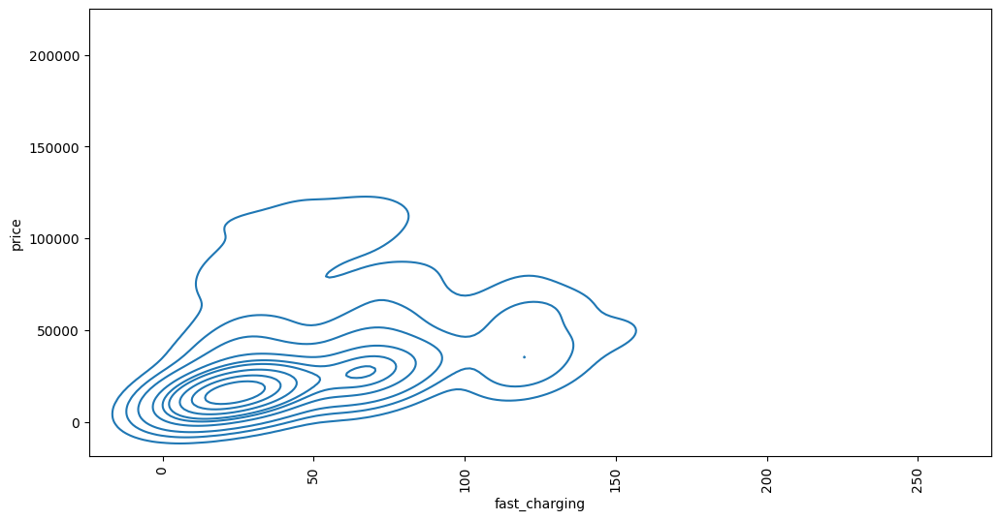

In [398]:
# 2D kde plot
# scatter plot
plt.figure(figsize = (12,6))
sns.kdeplot(data = df, x = 'fast_charging', y = 'price')
plt.xticks(rotation = 'vertical')
plt.show()

In [399]:
groups = []
for category, group_data in df.groupby('fast_charging')['price']:
    groups.append(group_data)
    
# perform Kruskal-Wallis test
statistic, p_value = stats.kruskal(*groups)

# output the results
print("Kruskal-Wallis statistic:",statistic)
print("p-value:",p_value)

# -  The output indicates that the Kruskal-Wallis statistic is 435.533 and the p-value is approximately 2.77e-75.
# - The Kruskal-Wallis statistic value of 435.533 is considered high. It indicates a strong association between the groups (different levels of fast_charging) and the variable of interest (price). Higher values of the Kruskal-Wallis statistic suggest a stronger association between the groups. 

# -  Interpretation:

#     -  The Kruskal-Wallis statistic is a measure of the strength of association between the groups (different levels of fast_charging) and the variable of interest (price). Higher values indicate a stronger association.
#     -  The p-value is the probability of observing the data, or more extreme data, if the null hypothesis (no difference between groups) is true. In this case, the p-value is extremely low, indicating strong evidence against the null hypothesis.

# -  Therefore, with such a low p-value, we reject the null hypothesis and conclude that there are significant differences in prices across different levels of fast_charging.

Kruskal-Wallis statistic: 435.53329869127657
p-value: 2.7698079787208686e-75


Q: what is threshold number to tell whether kruskal statistic value is high or low ?

There isn't a universal threshold to determine whether a Kruskal-Wallis statistic value is high or low. The interpretation of the Kruskal-Wallis statistic depends on the specific context of the study, including the number of groups being compared, the sample size, and the research question.

In general, a higher Kruskal-Wallis statistic indicates a greater difference between groups, suggesting a stronger association between the independent variable (groups) and the dependent variable. However, what constitutes a "high" or "low" value can vary depending on the factors mentioned above.

Researchers often compare the Kruskal-Wallis statistic to critical values from the chi-square distribution with appropriate degrees of freedom and significance level to determine statistical significance. The associated p-value is typically used to assess the significance of the result. If the p-value is below a predetermined significance level (e.g., 0.05), the Kruskal-Wallis test indicates a significant difference between groups.

In [400]:
# 13 x 0
# fast_charging x brand_name
pd.crosstab(df['fast_charging'],df['brand_name'])

brand_name,apple,google,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
fast_charging,,,,,,,,,,,,,,,,
10.0,0,0,1,0,0,0,6,2,0,1,2,4,0,1,7,5
15.0,0,0,0,0,0,0,0,0,0,0,0,0,41,0,2,0
18.0,2,3,0,0,8,6,4,3,3,5,8,19,1,9,25,28
19.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
20.0,0,0,0,0,0,0,8,1,0,0,0,1,0,0,0,0
22.0,0,0,3,1,0,0,0,0,0,0,0,0,0,0,0,1
25.0,1,0,0,0,0,0,0,0,0,0,0,0,51,0,0,0
30.0,0,5,0,0,0,0,5,0,3,3,0,8,0,0,0,1
33.0,0,0,0,0,11,0,10,3,7,26,10,22,4,8,9,33


In [401]:
# cramer's V test
contigency_table = pd.crosstab(df['fast_charging'],df['brand_name'])

chi2, p_value, _, _ = stats.chi2_contingency(contingency_table)
n = contigency_table.sum().sum()
min_dim = min(contingency_table.shape)
cramers_v = np.sqrt(chi2/(n*(min_dim - 1)))

print("Cramer's V: ",cramers_v)
print('P-value: ',p_value)

# - The output indicates that Cramer's V value is approximately 0.581, which suggests a moderate to strong association between "fast_charging" and "brand_name". Additionally, the p-value is extremely small (close to zero), indicating that this association is statistically significant. Therefore, there is evidence to reject the null hypothesis that there is no association between the two variables.

Cramer's V:  0.5800243939059488
P-value:  6.834963342545526e-285


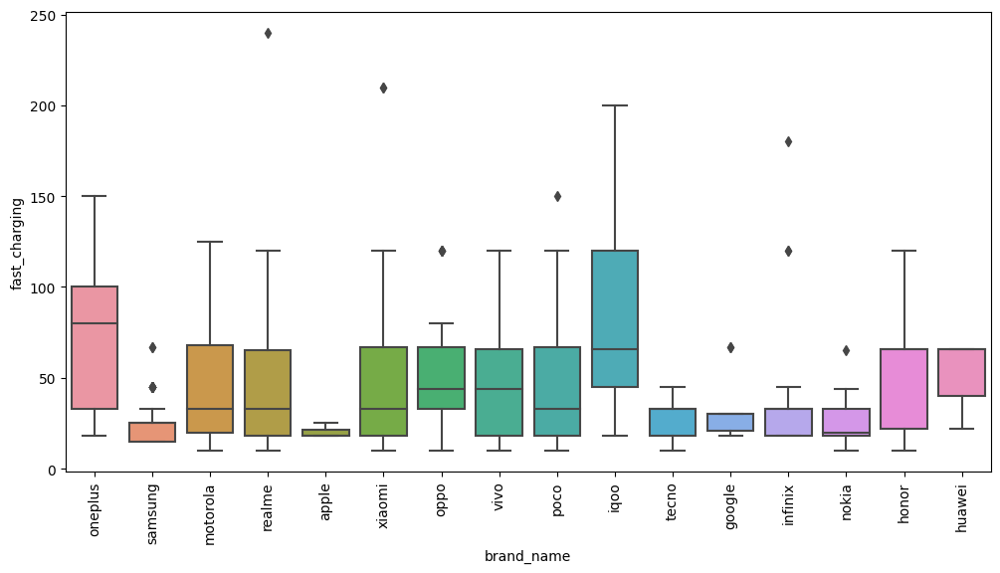

In [402]:
# box plot
plt.figure(figsize = (12,6))
sns.boxplot(data = df, x = 'brand_name', y = 'fast_charging')
plt.xticks(rotation = 'vertical')
plt.show()


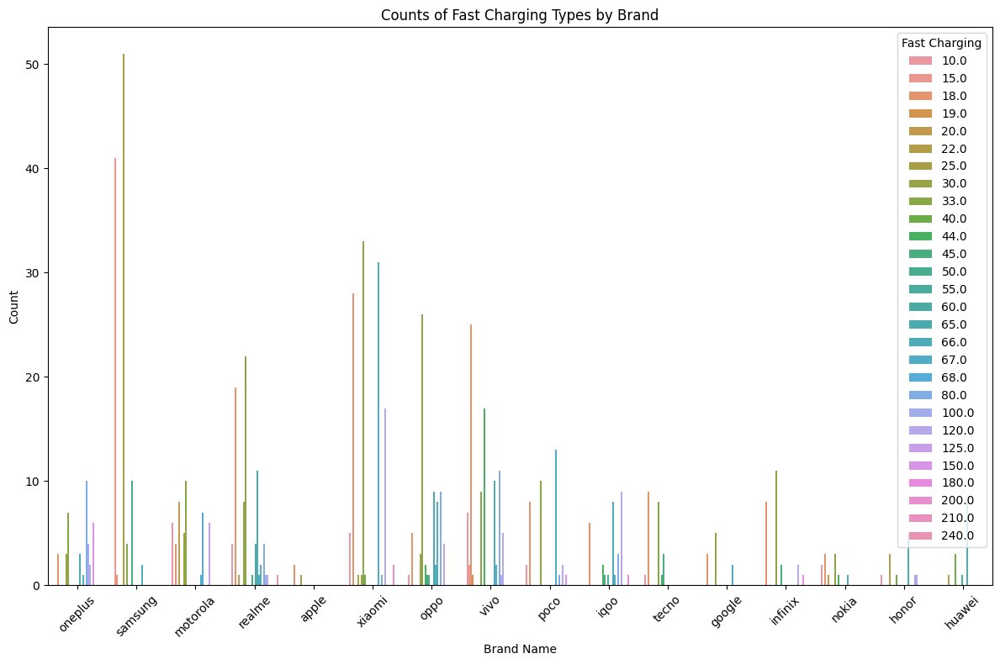

In [403]:
plt.figure(figsize=(12, 8))
sns.countplot(data=df, x='brand_name', hue='fast_charging')
plt.xticks(rotation=45)
plt.xlabel('Brand Name')
plt.ylabel('Count')
plt.title('Counts of Fast Charging Types by Brand')
plt.legend(title='Fast Charging')
plt.tight_layout()
plt.show()

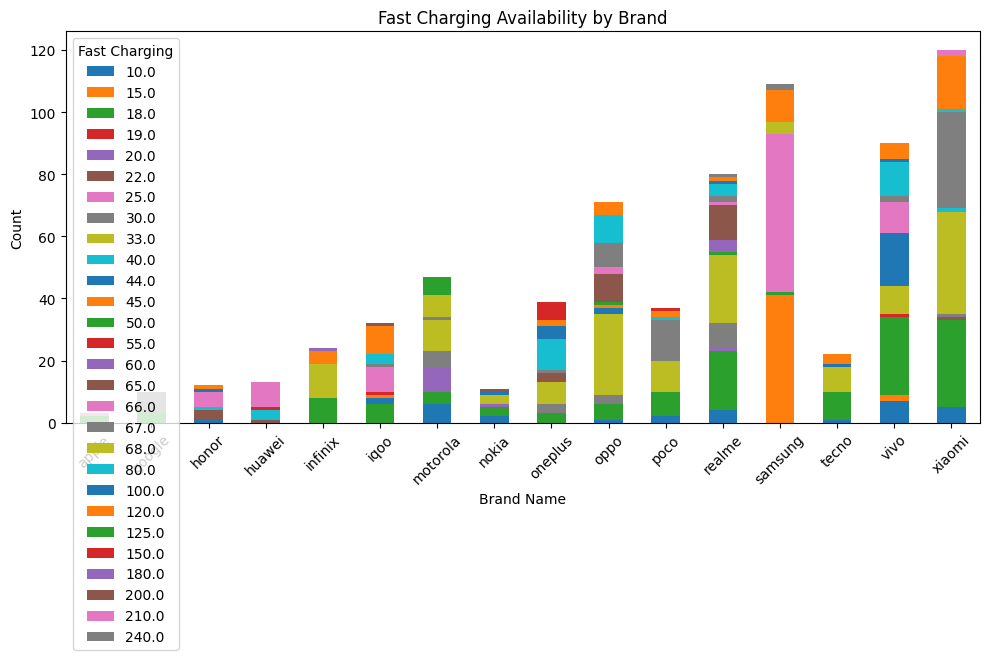

In [404]:
grouped = df.groupby(['brand_name', 'fast_charging']).size().unstack(fill_value=0)

# Plotting
ax = grouped.plot(kind='bar', stacked=True, figsize=(10, 6))
ax.set_ylabel('Count')
ax.set_xlabel('Brand Name')
ax.set_title('Fast Charging Availability by Brand')

plt.legend(title='Fast Charging', loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [405]:
# 13 x 24
# fast_charging x os
pd.crosstab(df['fast_charging'],df['os'])

os,Android,Other,iOS
fast_charging,,,
10.0,29,0,0
15.0,42,0,0
18.0,122,0,2
19.0,1,0,0
20.0,10,0,0
22.0,4,1,0
25.0,50,0,1
30.0,25,0,0
33.0,142,1,0


In [406]:
round(59.69)

60

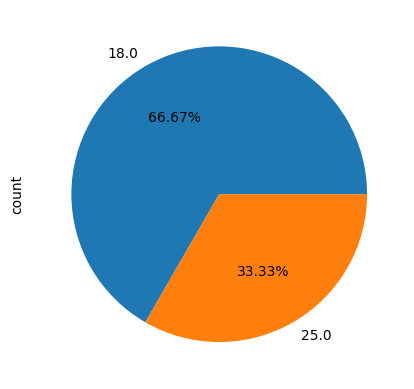

In [407]:
df[df['os'] == 'iOS']['fast_charging'].value_counts().plot(kind = 'pie', autopct = '%.2f%%');
# There are only two categories in fast charging highest one is 18W with 66.67% and remaining one is 25W with 33.33%.

fast_charging x price
The first highest median price is at category 55.0. Second highest is at 45.0.
both 55.0 and 45.0 are only two wide distributions without outliers.

-  The output indicates that the Kruskal-Wallis statistic is 435.533 and the p-value is approximately 2.77e-75.
- The Kruskal-Wallis statistic value of 435.533 is considered high. It indicates a strong association between the groups (different levels of fast_charging) and the variable of interest (price). Higher values of the Kruskal-Wallis statistic suggest a stronger association between the groups. 

-  Interpretation:

    -  The Kruskal-Wallis statistic is a measure of the strength of association between the groups (different levels of fast_charging) and the variable of interest (price). Higher values indicate a stronger association.
    -  The p-value is the probability of observing the data, or more extreme data, if the null hypothesis (no difference between groups) is true. In this case, the p-value is extremely low, indicating strong evidence against the null hypothesis.

-  Therefore, with such a low p-value, we reject the null hypothesis and conclude that there are significant differences in prices across different levels of fast_charging.


fast_charging x brand_name
The output indicates that Cramer's V value is approximately 0.581, which suggests a moderate to strong association between "fast_charging" and "brand_name". Additionally, the p-value is extremely small (close to zero), indicating that this association is statistically significant. Therefore, there is evidence to reject the null hypothesis that there is no association between the two variables.
there are only two categories in fast charging highest one is 18W with 66.67% and remaining one is 25W with 33.33%.

fast_charging x os
There are only two categories in fast charging highest one is 18W with 66.67% and remaining one is 25W with 33.33%.

71.23% of models fall in top 7 categories The first highest number of models category is 33W with 20.23%. Second highest 
category is 18W with 17.38%. Third highest category is 67W with 8.83%. Fourth highest category is 25W with 7.12%.
Fifth highest category is 120W with 6.13%. Sixth highest category is 15W with 5.98%. Seventh highest category is 80W
with 5.56%.

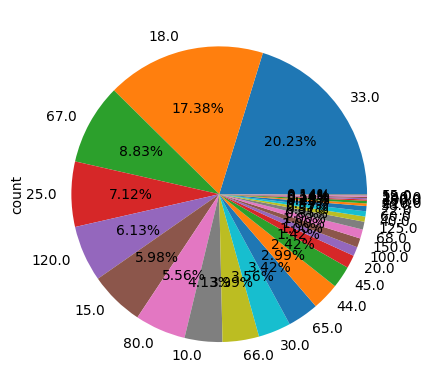

In [408]:
df[df['os'] == 'Android']['fast_charging'].value_counts().plot(kind = 'pie', autopct = '%.2f%%');
# 71.23% of models fall in top 7 categories The first highest number of models category is 33W with 20.23%. Second highest 
# category is 18W with 17.38%. Third highest category is 67W with 8.83%. Fourth highest category is 25W with 7.12%.
# Fifth highest category is 120W with 6.13%. Sixth highest category is 15W with 5.98%. Seventh highest category is 80W
# with 5.56%.

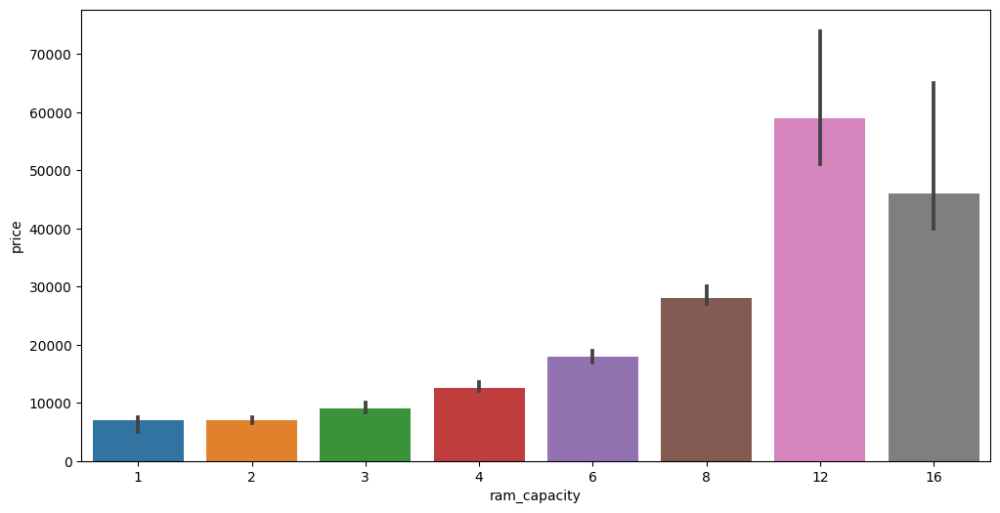

In [409]:
# 10 x 2
# ram_capacity x price
plt.figure(figsize = (12,6))
sns.barplot(data = temp_df, x = 'ram_capacity', y = 'price',estimator = np.median);

# A clear trend is evident in the graph, indicating that smartphones with higher RAM capacities generally command higher prices.
# However, an exception is observed with the 16GB RAM variant, which, despite being the RAM with the highest capacity, is priced
# second highest. Interestingly, smartphones with 12GB RAM, the second highest RAM capacity, are priced the highest

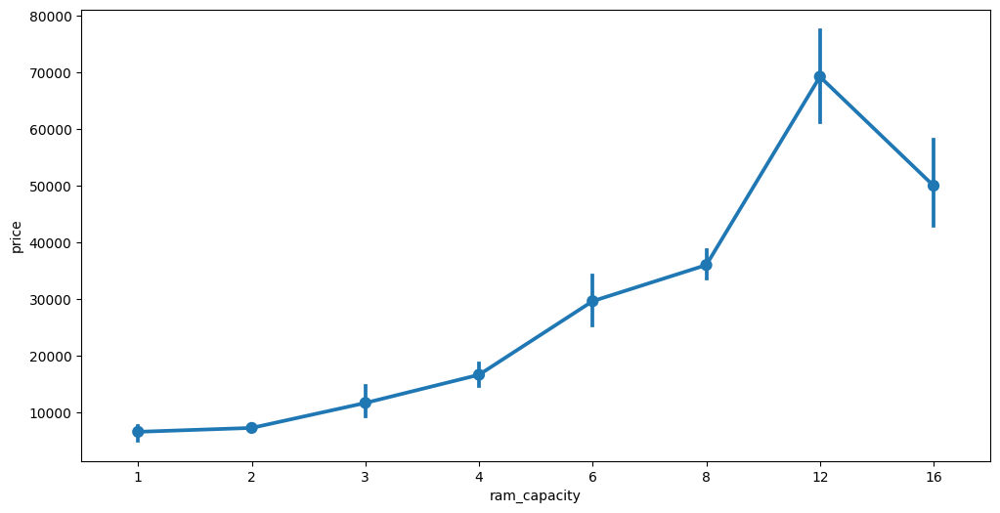

In [410]:
plt.figure(figsize = (12,6))
sns.pointplot(data = temp_df,x = 'ram_capacity', y = 'price');

Text(0.5, 1.0, 'Ram Capacity and Price')

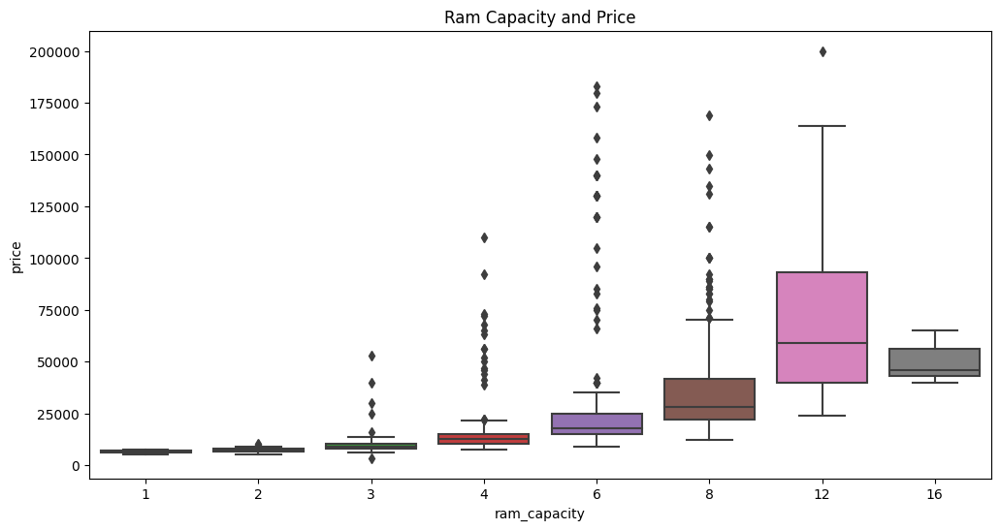

In [411]:
# box plot
plt.figure(figsize = (12,6))
sns.boxplot(data = df, x = 'ram_capacity', y = 'price')
plt.title("Ram Capacity and Price")
# The only distribution without outiers is 16GB.

<AxesSubplot: xlabel='ram_capacity', ylabel='price'>

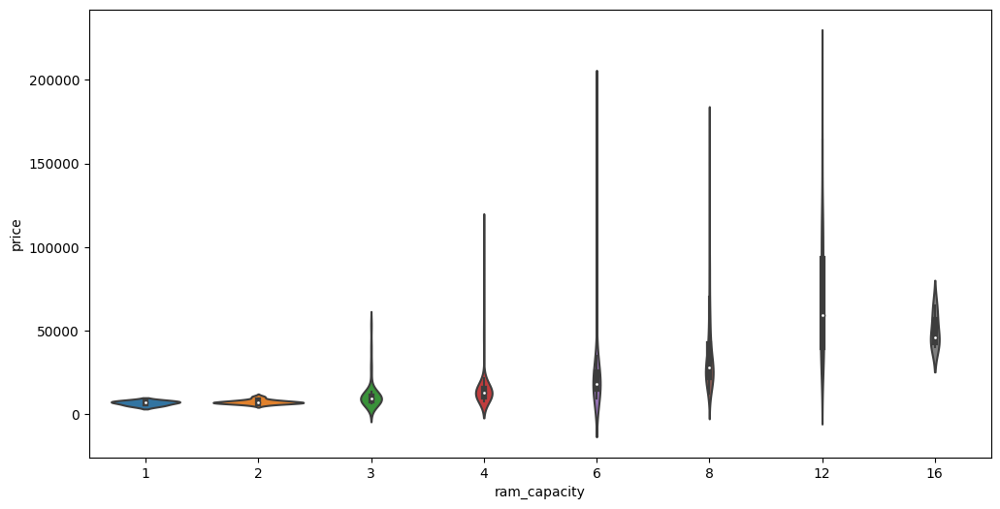

In [412]:
# violin plot
plt.figure(figsize = (12,6))
sns.violinplot(data = df, x = 'ram_capacity', y = 'price')

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<AxesSubplot: xlabel='ram_capacity', ylabel='price'>

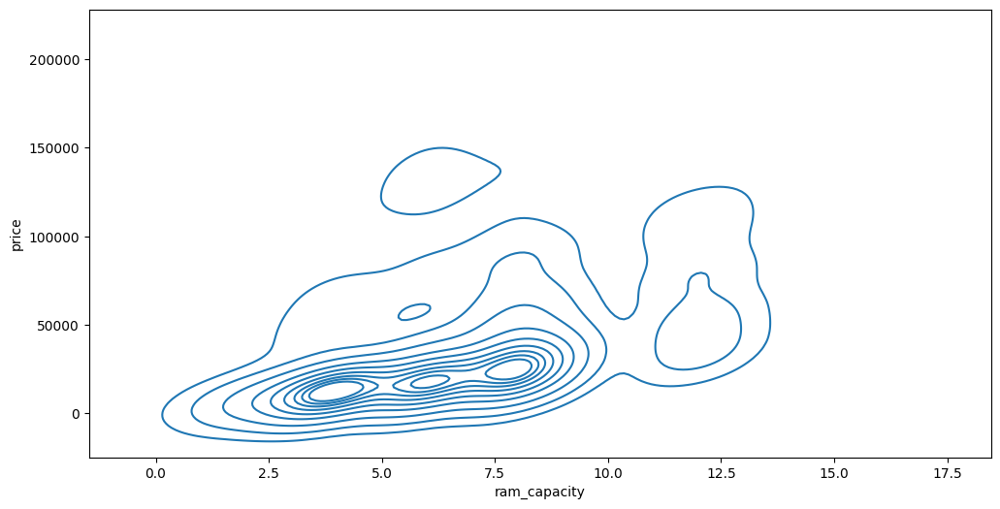

In [413]:
# 2D kde plot
plt.figure(figsize = (12,6))
sns.kdeplot(data = df, x = 'ram_capacity', y = 'price')

skew of 8 MP:  2.4450534097904377
skew of 6 MP:  2.954403161273682
skew of 4 MP:  3.7488310607811735
skew of 12 MP:  1.1973208343428114
skew of 3 MP:  3.4197827366524667
skew of 2 MP:  1.082091182785305
skew of 16 MP:  0.8279771326219663
skew of 1 MP:  -1.457862967321305


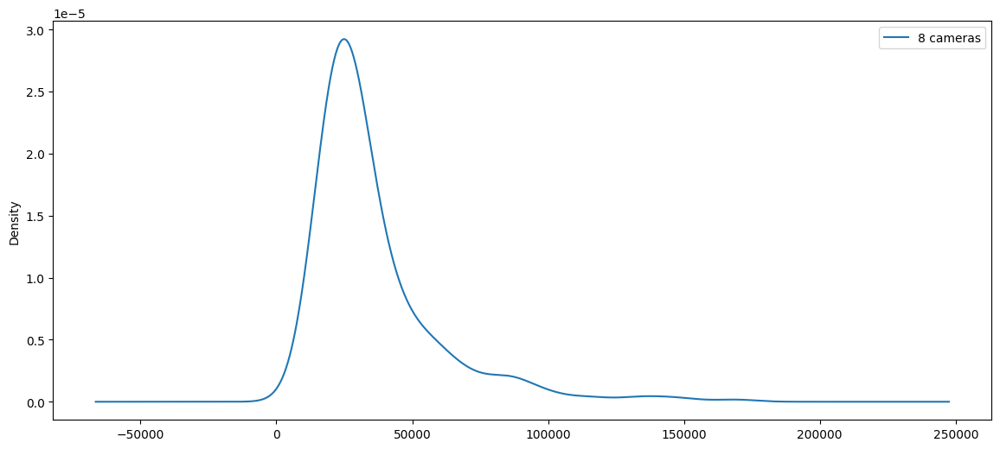

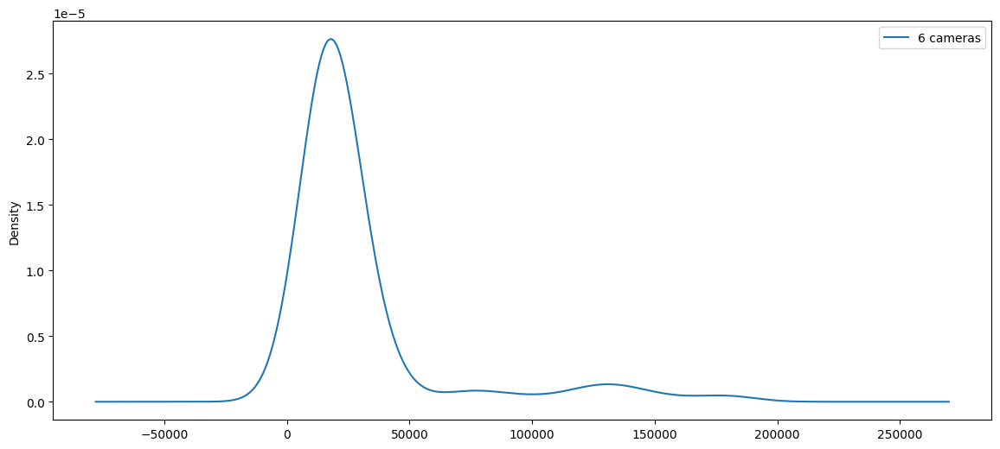

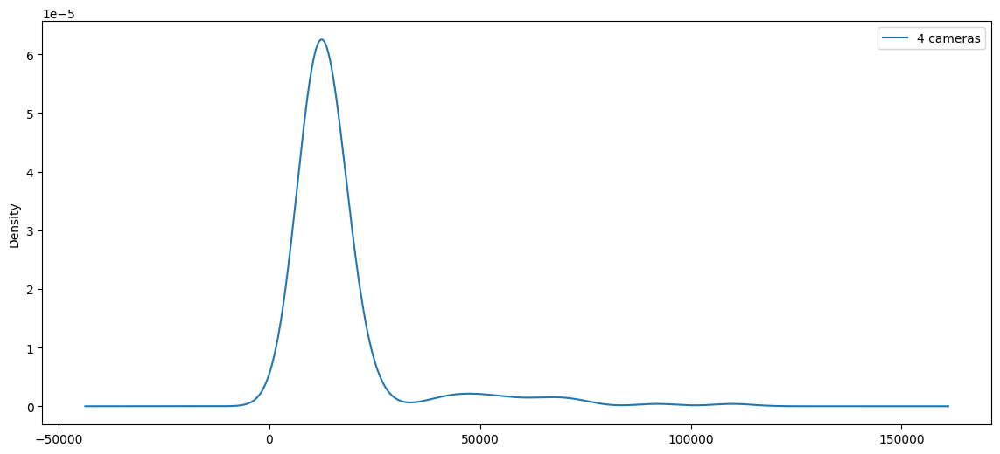

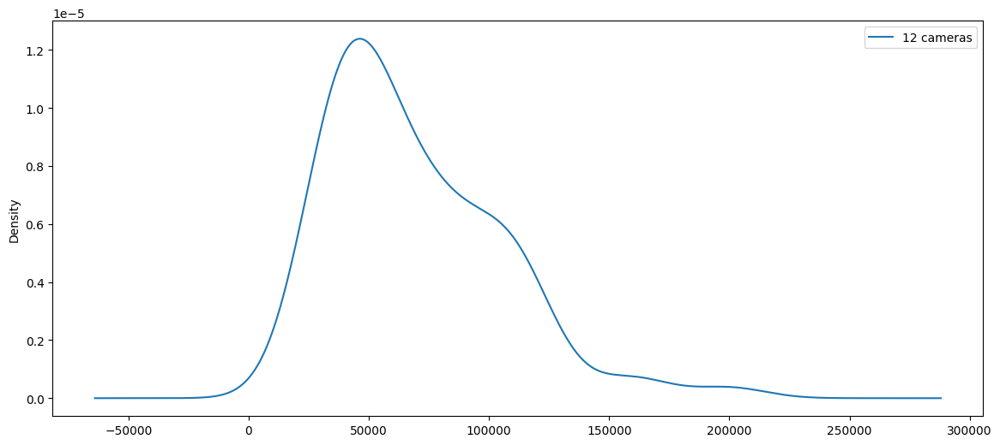

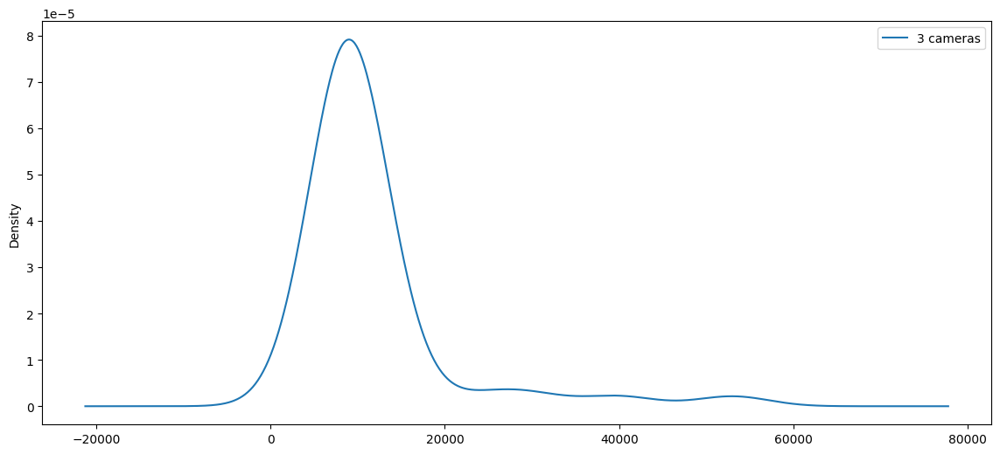

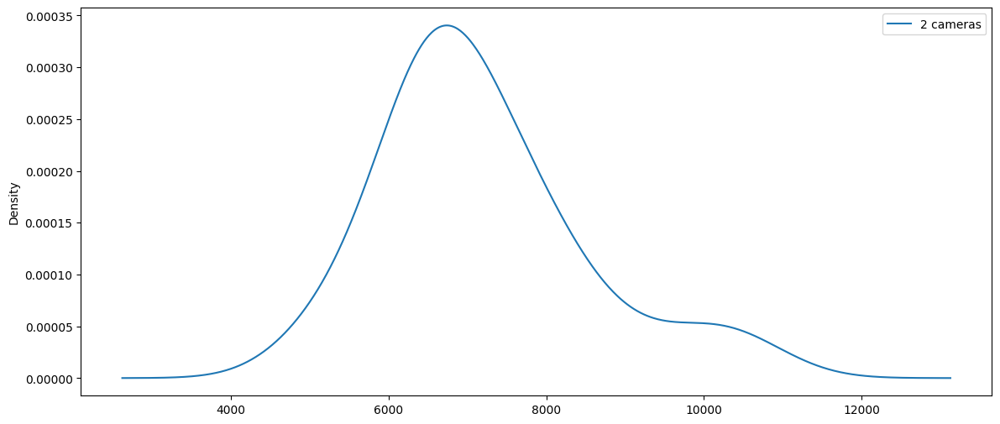

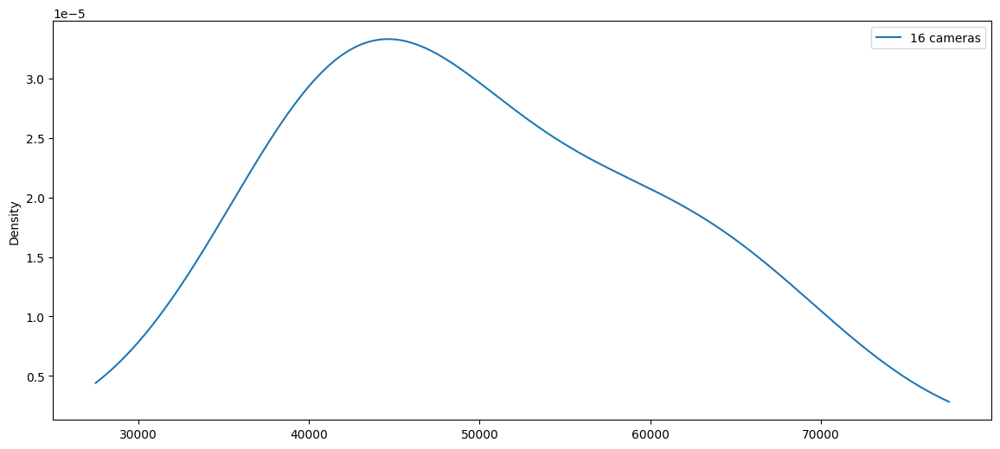

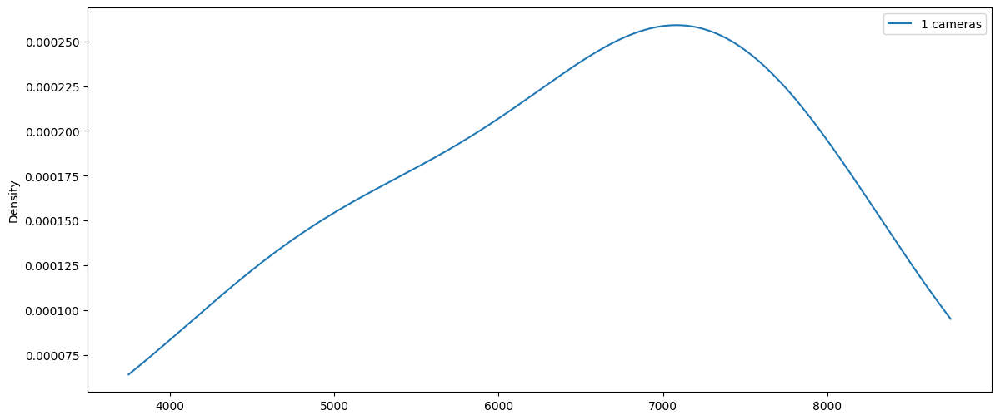

In [414]:
# 1D kde plot

# ... your existing code to create the DataFrame (df) ...
MP = df['ram_capacity'].value_counts().index.tolist()

for i in MP:
    subset = df[df['ram_capacity'] == i]['price']
    
    # Check if subset has more than one element before plotting
    if not subset.empty and len(subset) > 1:
        plt.figure(figsize=(14, 6))
        subset.plot(kind='kde', label=f'{i} cameras')

        # Print skewness only if the subset has more than one element
        print(f'skew of {i} MP: ', subset.skew())
        plt.legend()

# Add legend and display the plot after the loop (assuming all plots fit)
# if len(MP) > 1:  # Check if there's more than one camera count
#     plt.legend()

plt.show()

In [415]:
# Assuming df is your DataFrame containing the data
# Drop any rows with missing values in either ram_capacity or price column
df_clean = df.dropna(subset=['ram_capacity', 'price'])

# Calculate the Spearman rank correlation coefficient and p-value
spearman_corr, p_value = stats.spearmanr(df_clean['ram_capacity'], df_clean['price'])

# Print the results
print("Spearman correlation coefficient:", spearman_corr)
print("p-value:", p_value)

# - The output of the Spearman correlation test for "ram_capacity" and "price" indicates a strong positive correlation between
#   the two variables:

#     - Spearman correlation coefficient: 0.7355569880075197
#     - p-value: 2.437217755707856e-152

# - The correlation coefficient value of approximately 0.736 suggests a strong positive association between RAM capacity and
#   price. Additionally, the very small p-value (< 0.05) indicates that this correlation is statistically significant, meaning
#   it is unlikely to have occurred by random chance alone.

Spearman correlation coefficient: 0.7355569880075197
p-value: 2.437217755707856e-152


In [416]:
from scikit_posthocs import posthoc_dunn

# Assuming you have already performed the Kruskal-Wallis test and obtained significant results
# If not, perform the Kruskal-Wallis test first

# Post-hoc Dunn's test
dunn_results = posthoc_dunn(df, val_col='price', group_col='ram_capacity')

print("Dunn's test results:")
print(dunn_results)

Dunn's test results:
              1             2             3             4             6   \
1   1.000000e+00  9.463962e-01  4.629708e-01  1.322180e-01  5.967936e-03   
2   9.463962e-01  1.000000e+00  1.167444e-01  1.116638e-04  4.210024e-13   
3   4.629708e-01  1.167444e-01  1.000000e+00  7.915368e-03  1.218428e-12   
4   1.322180e-01  1.116638e-04  7.915368e-03  1.000000e+00  1.040053e-13   
6   5.967936e-03  4.210024e-13  1.218428e-12  1.040053e-13  1.000000e+00   
8   1.236623e-04  5.632298e-25  3.004409e-29  1.194197e-50  6.276241e-13   
12  6.599964e-07  1.235398e-34  1.763219e-39  4.698841e-51  5.133184e-23   
16  9.696439e-05  1.149382e-08  3.213797e-07  1.338187e-05  5.753055e-03   

              8             12            16  
1   1.236623e-04  6.599964e-07  9.696439e-05  
2   5.632298e-25  1.235398e-34  1.149382e-08  
3   3.004409e-29  1.763219e-39  3.213797e-07  
4   1.194197e-50  4.698841e-51  1.338187e-05  
6   6.276241e-13  5.133184e-23  5.753055e-03  
8   1.000000

In [417]:
# 10 x 0
# ram_capacity x brand_name
pd.crosstab(df['battery_capacity'],df['brand_name'])

brand_name,apple,google,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
battery_capacity,,,,,,,,,,,,,,,,
1821.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1900.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2050.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2230.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2438.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5160.0,0,0,0,0,0,0,0,0,0,0,1,0,0,2,0,2
5200.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
5500.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,3


In [418]:
# Create a contingency table
contingency_table = pd.crosstab(df['ram_capacity'], df['brand_name'])

# Perform the chi-square test
chi2, p_value, _, _ = stats.chi2_contingency(contingency_table)

print("Chi-square statistic:", chi2)
print("p-value:", p_value)

# - The Chi-square statistic measures the discrepancy between the observed frequencies in a contingency table (in this case, 
#   the frequencies of different combinations of RAM capacity and brand names) and the frequencies that would be expected 
#   if the two variables were independent.

# - In this context, a Chi-square statistic of 227.67660847081376 indicates a significant difference between the observed and 
#   expected frequencies, suggesting that there is an association between RAM capacity and brand names. The small p-value 
#   (4.656067360215653e-11) further supports this, indicating that the association is unlikely to have occurred by chance.

# - With a p-value significantly below the typical significance level of 0.05, we reject the null hypothesis and conclude that
#   there is a significant association between "ram_capacity" and "brand_name."

Chi-square statistic: 227.67660847081376
p-value: 4.656067360215653e-11


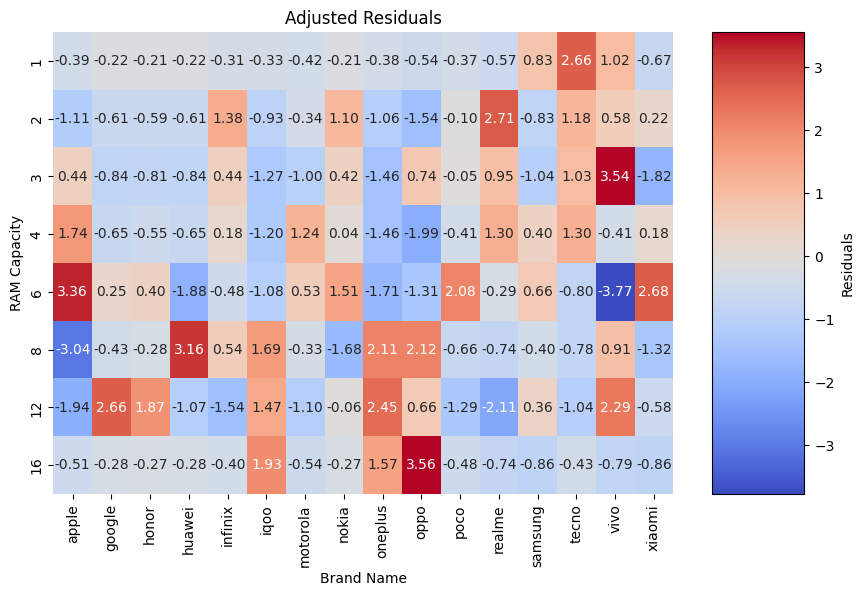

In [419]:
# - Since the Chi-square test indicates an association between RAM capacity and brand names, you might want to explore further
#   to understand which specific categories of RAM capacity and brand names are associated. One possible post-hoc test you 
#   could consider is the adjusted residual analysis.

# - Adjusted residuals quantify the difference between observed and expected cell counts in a contingency table, adjusted for 
#   multiple comparisons. Positive residuals indicate higher observed counts than expected, while negative residuals indicate 
#   lower observed counts than expected. Residuals with absolute values greater than 1.96 are typically considered significant.

# Calculate adjusted residuals
observed = contingency_table.values
expected = stats.contingency.expected_freq(contingency_table)
residuals = (observed - expected) / np.sqrt(expected)

# Create a DataFrame for adjusted residuals
residuals_df = pd.DataFrame(residuals, index=contingency_table.index, columns=contingency_table.columns)

# Visualize adjusted residuals
plt.figure(figsize=(10, 6))
heatmap = sns.heatmap(residuals_df, annot=True, cmap='coolwarm', fmt=".2f", cbar=False)
plt.title('Adjusted Residuals')
plt.xlabel('Brand Name')
plt.ylabel('RAM Capacity')

# Add a color bar
cbar = plt.colorbar(heatmap.collections[0], aspect=5)
cbar.set_label('Residuals')

plt.show()

# This will provide a heatmap visualization of adjusted residuals, allowing you to identify specific combinations of RAM
# capacity and brand names that contribute to the significant association observed in the Chi-square test.

# Th- analysis of adjusted residuals reveals significant patterns in the distribution of smartphone brands across different 
# categories of RAM size. These patterns provide valuable insights into brand preferences and market dynamics within the smartphone industry.

#   - 1GB Category: Tecno stands out as the dominant brand in the 1GB category, with an adjusted residual of 2.66. This 
# indicates that the number of Tecno smartphones in this category is significantly larger than expected under the null
# hypothesis, suggesting a strong market presence or strategic focus on this segment.

#   - 2GB Category: Realme emerges as the dominant brand in the 2GB category, with an adjusted residual of 2.71. Similar to 
# Tecno in the 1GB category, this indicates a significant overrepresentation of Realme smartphones, highlighting brand strength 
# or strategic positioning in this segment.

#   - 3GB Category: Vivo demonstrates dominance in the 3GB category, with an adjusted residual of 3.54. This suggests that Vivo 
# smartphones are significantly more prevalent in this category compared to other brands, indicating a strong market foothold
# or targeted marketing efforts.

#   - 4GB Category: No significant deviations from the expected distribution are observed in the 4GB category, indicating a 
# relatively balanced representation of brands in this segment.

#   - 6GB Category: Apple, Poco, and Xiaomi exhibit significantly higher representation in the 6GB category, with adjusted 
# residuals of 3.36, 2.08, and 2.68 respectively. Conversely, Vivo demonstrates a notable underrepresentation with an adjusted
# residual of -3.77, suggesting a weaker presence or focus in this segment compared to other brands.

#   - 8GB Category: Huawei, OnePlus, and Oppo show significant overrepresentation in the 8GB category, with adjusted residuals 
# of 3.16, 2.11, and 2.12 respectively. Conversely, Apple exhibits a significant underrepresentation with an adjusted residual
# of -3.04, indicating a comparatively smaller presence in this segment.

#   - 12GB Category: Google, OnePlus, and Vivo are significantly overrepresented in the 12GB category, with adjusted residuals 
# of 2.66, 2.45, and 2.29 respectively. Conversely, Realme demonstrates a significant underrepresentation with an adjusted 
# residual of -2.11, suggesting a weaker presence or market focus in this segment.

#   - 16GB Category: Oppo emerges as the dominant brand in the 16GB category, with an adjusted residual of 3.56. This indicates 
# a significant overrepresentation of Oppo smartphones in this segment, highlighting brand strength or market focus in high-RAM
# devices.
        
        

In [420]:
heatmap.collections[0]

In [421]:
# 10 x 24
# ram_capacity x os
pd.crosstab(df['ram_capacity'],df['os'])

os,Android,Other,iOS
ram_capacity,,,
1,3,0,0
2,24,0,0
3,42,0,3
4,184,1,16
6,200,1,23
8,299,6,4
12,72,0,0
16,5,0,0


<AxesSubplot: ylabel='count'>

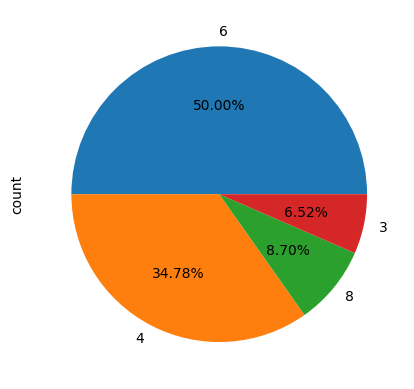

In [422]:
df[df['os'] == 'iOS']['ram_capacity'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
# iOS models use only 4 categories highest category with models is 6GB with exactly 50.00%. Second highest is 4GB with 34.78%
# Third one is 8GB with 8.70. Fourth and the remaining one is 3GB with 6.53%.

ram_capacity x price
A clear trend is evident in the graph, indicating that smartphones with higher RAM capacities generally command higher prices.
However, an exception is observed with the 16GB RAM variant, which, despite being the RAM with the highest capacity, is priced
second highest. Interestingly, smartphones with 12GB RAM, the second highest RAM capacity, are priced the highest.
The distributions without outiers are 1GB and 16GB.
spearman correaltion: The correlation coefficient value of approximately 0.736 suggests a strong positive association between
    RAM capacity and price. Additionally, the very small p-value (< 0.05) indicates that this correlation is statistically 
    significant, meaning it is unlikely to have occurred by random chance alone.
    
ram_capacity x brand_name
- The Chi-square statistic measures the discrepancy between the observed frequencies in a contingency table (in this case, 
  the frequencies of different combinations of RAM capacity and brand names) and the frequencies that would be expected 
  if the two variables were independent.

- In this context, a Chi-square statistic of 227.67660847081376 indicates a significant difference between the observed and 
  expected frequencies, suggesting that there is an association between RAM capacity and brand names. The small p-value 
  (4.656067360215653e-11) further supports this, indicating that the association is unlikely to have occurred by chance.

- With a p-value significantly below the typical significance level of 0.05, we reject the null hypothesis and conclude that
  there is a significant association between "ram_capacity" and "brand_name."
    
The analysis of adjusted residuals reveals significant patterns in the distribution of smartphone brands across different categories of RAM size. These patterns provide valuable insights into brand preferences and market dynamics within the smartphone industry.

    1GB Category: Tecno stands out as the dominant brand in the 1GB category, with an adjusted residual of 2.66. This indicates that the number of Tecno smartphones in this category is significantly larger than expected under the null hypothesis, suggesting a strong market presence or strategic focus on this segment.

    2GB Category: Realme emerges as the dominant brand in the 2GB category, with an adjusted residual of 2.71. Similar to Tecno in the 1GB category, this indicates a significant overrepresentation of Realme smartphones, highlighting brand strength or strategic positioning in this segment.

    3GB Category: Vivo demonstrates dominance in the 3GB category, with an adjusted residual of 3.54. This suggests that Vivo smartphones are significantly more prevalent in this category compared to other brands, indicating a strong market foothold or targeted marketing efforts.

    4GB Category: No significant deviations from the expected distribution are observed in the 4GB category, indicating a relatively balanced representation of brands in this segment.

    6GB Category: Apple, Poco, and Xiaomi exhibit significantly higher representation in the 6GB category, with adjusted residuals of 3.36, 2.08, and 2.68 respectively. Conversely, Vivo demonstrates a notable underrepresentation with an adjusted residual of -3.77, suggesting a weaker presence or focus in this segment compared to other brands.

    8GB Category: Huawei, OnePlus, and Oppo show significant overrepresentation in the 8GB category, with adjusted residuals of 3.16, 2.11, and 2.12 respectively. Conversely, Apple exhibits a significant underrepresentation with an adjusted residual of -3.04, indicating a comparatively smaller presence in this segment.

    12GB Category: Google, OnePlus, and Vivo are significantly overrepresented in the 12GB category, with adjusted residuals of 2.66, 2.45, and 2.29 respectively. Conversely, Realme demonstrates a significant underrepresentation with an adjusted residual of -2.11, suggesting a weaker presence or market focus in this segment.

    16GB Category: Oppo emerges as the dominant brand in the 16GB category, with an adjusted residual of 3.56. This indicates a significant overrepresentation of Oppo smartphones in this segment, highlighting brand strength or market focus in high-RAM devices.
    
ram_capacity x os
iOS models use only 4 categories highest category with models is 6GB with exactly 50.00%. Second highest is 4GB with 34.78%
Third one is 8GB with 8.70. Fourth and the remaining one is 3GB with 6.53%.

in Android 91.09% of models fall in top 4 categories they are 8GB RAM with 36.07%. Followed by 24.13% for 6GB. Followed by 
4GB with 22.20%. Followed by 12GB with 8.69%.

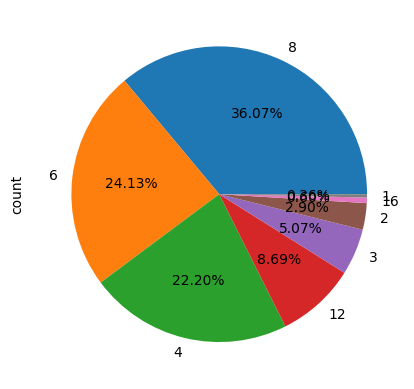

In [423]:
df[df['os'] == 'Android']['ram_capacity'].value_counts().plot(kind = 'pie', autopct = '%.2f%%');
# in Android 91.09% of models fall in top 4 categories they are 8GB RAM with 36.07%. Followed by 24.13% for 6GB. Followed by 
# 4GB with 22.20%. Followed by 12GB with 8.69%.

<AxesSubplot: xlabel='internal_memory', ylabel='price'>

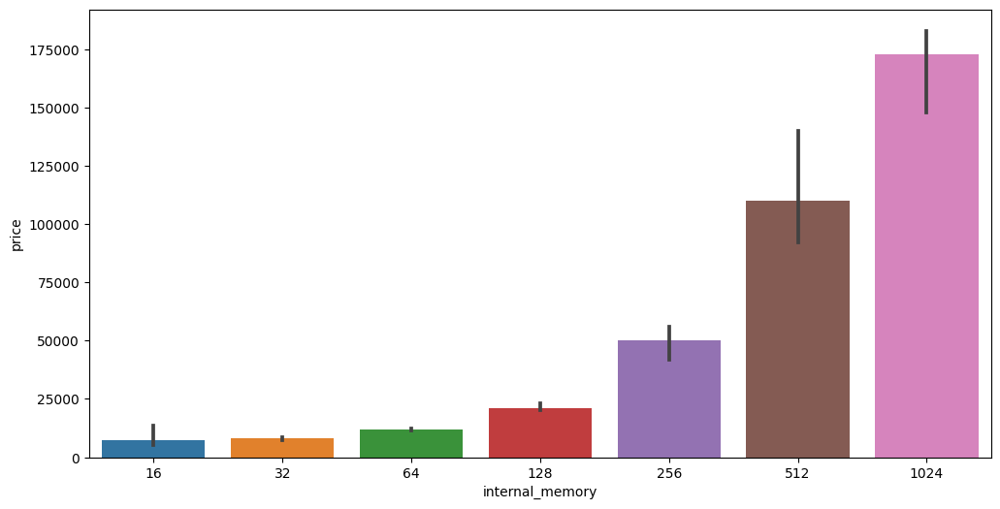

In [424]:
# 11 x 2
# internal memory x price
plt.figure(figsize = (12,6))
sns.barplot(data = temp_df,x = 'internal_memory',y = 'price',estimator = np.median)
# It is evident from the plot that there is a positive correlation between the internal memory capacity (measured in GB) and 
# the average price of smartphones. As the internal memory capacity increases, so does the price of the smartphone

<AxesSubplot: xlabel='internal_memory', ylabel='price'>

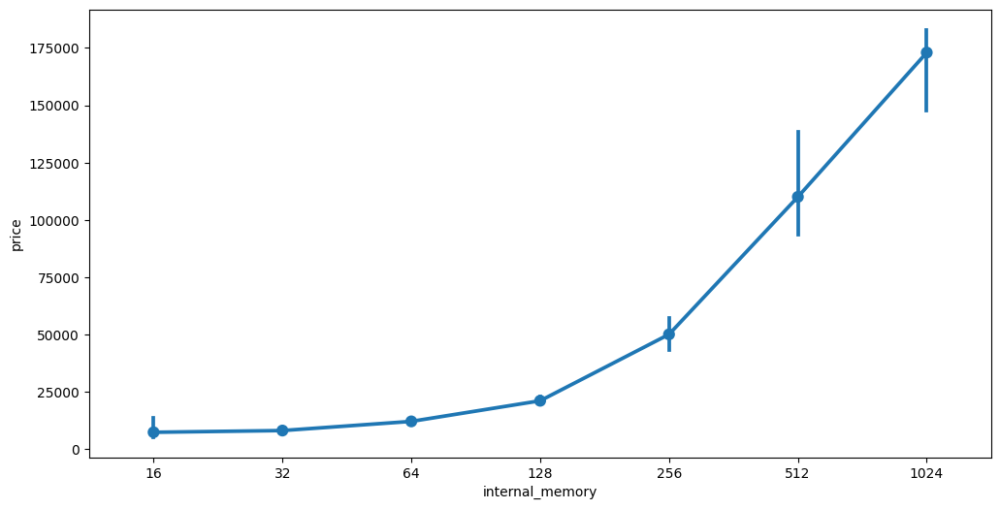

In [425]:
# point plot
plt.figure(figsize = (12,6))
sns.pointplot(data = df, x = 'internal_memory', y = 'price',estimator = np.median)

<AxesSubplot: xlabel='internal_memory', ylabel='price'>

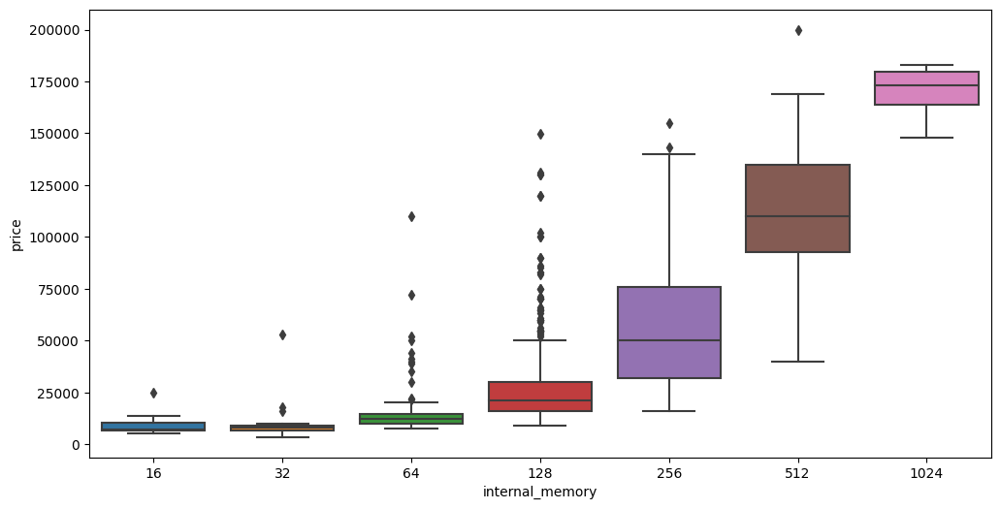

In [426]:
# box plot
plt.figure(figsize = (12,6))
sns.boxplot(data = df, x = 'internal_memory', y = 'price')

<AxesSubplot: xlabel='internal_memory', ylabel='price'>

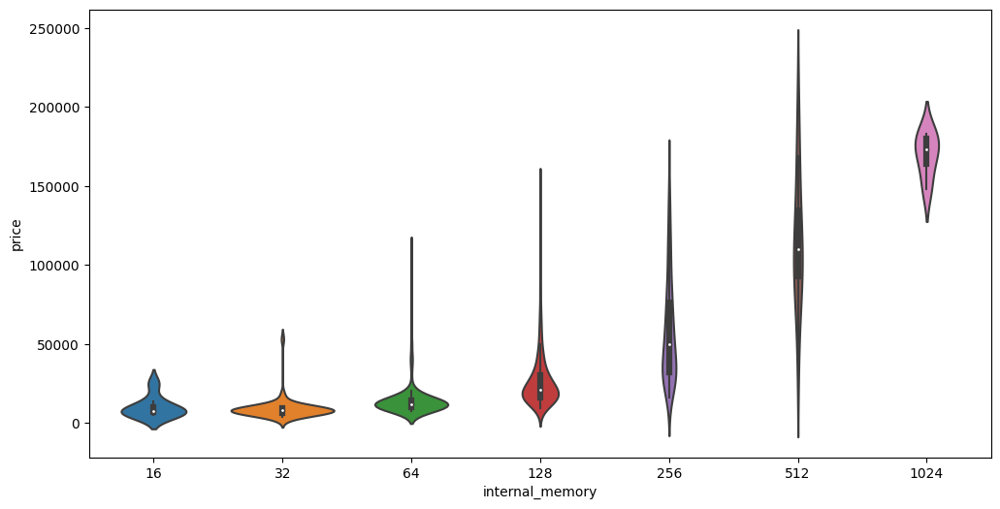

In [427]:
# violin plot
plt.figure(figsize = (12,6))
sns.violinplot(data = df, x = 'internal_memory', y = 'price')

skew of 50.0 MP:  2.0294384512650296
skew of 64.0 MP:  3.4723384890247915
skew of 48.0 MP:  2.983004213310838
skew of 13.0 MP:  5.235328206762575
skew of 108.0 MP:  2.7595177526409707
skew of 12.0 MP:  0.6904696381683239
skew of 8.0 MP:  -0.18566282309528542
skew of 200.0 MP:  1.3205144618102111
skew of 16.0 MP:  2.1093044342194243
skew of 12.2 MP:  0.222288364936479
skew of 50.3 MP:  1.6430499828487446
skew of 54.0 MP:  -1.6538067593711279
skew of 5.0 MP:  -1.38963613870649
skew of 24.0 MP:  nan


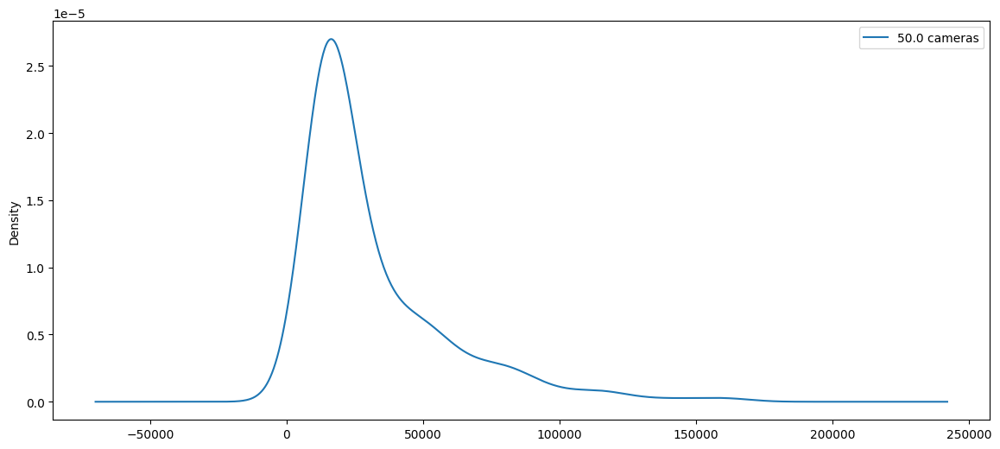

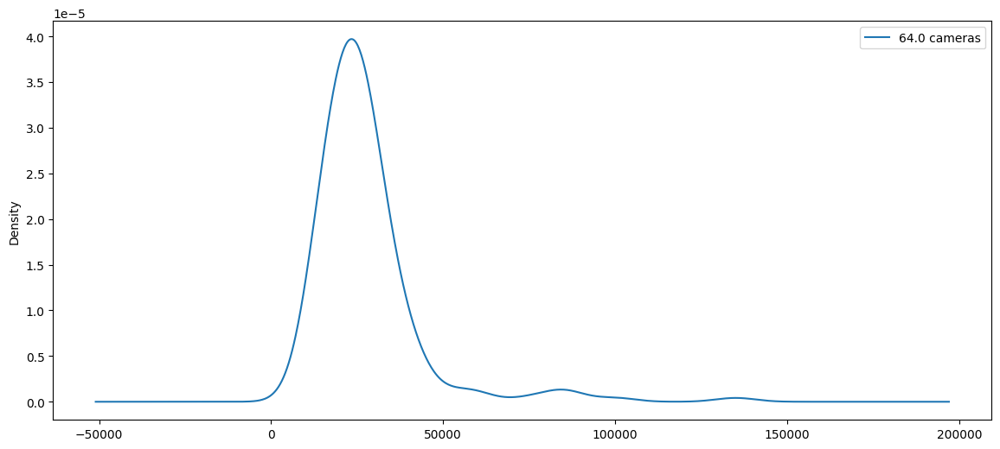

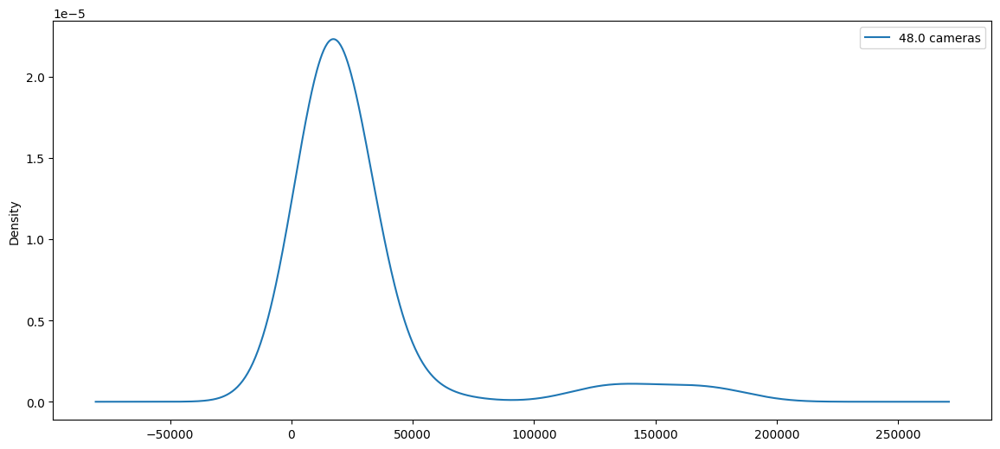

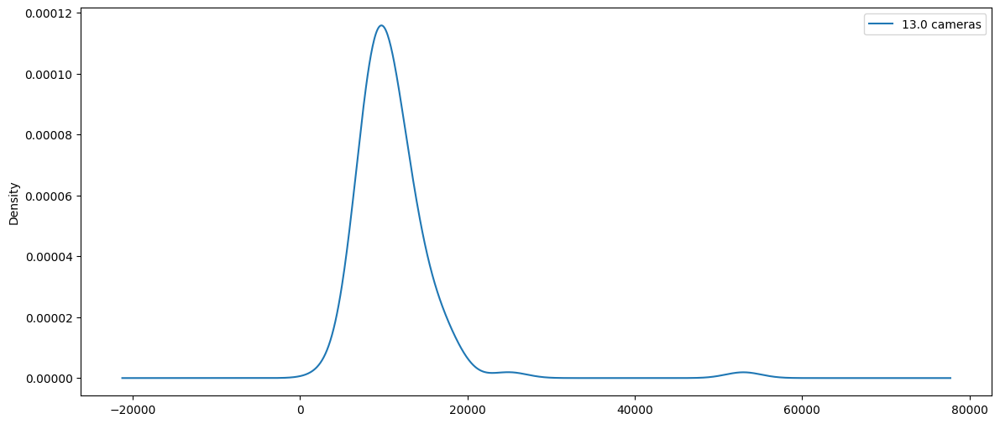

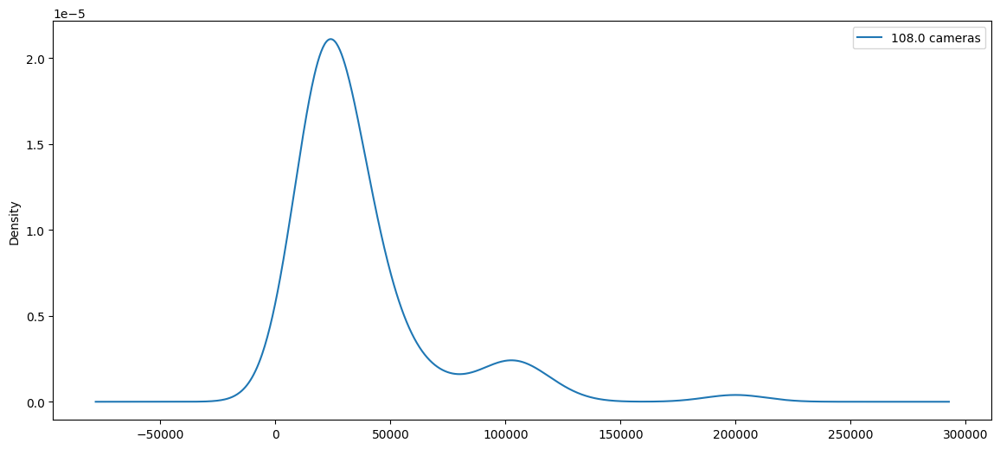

...

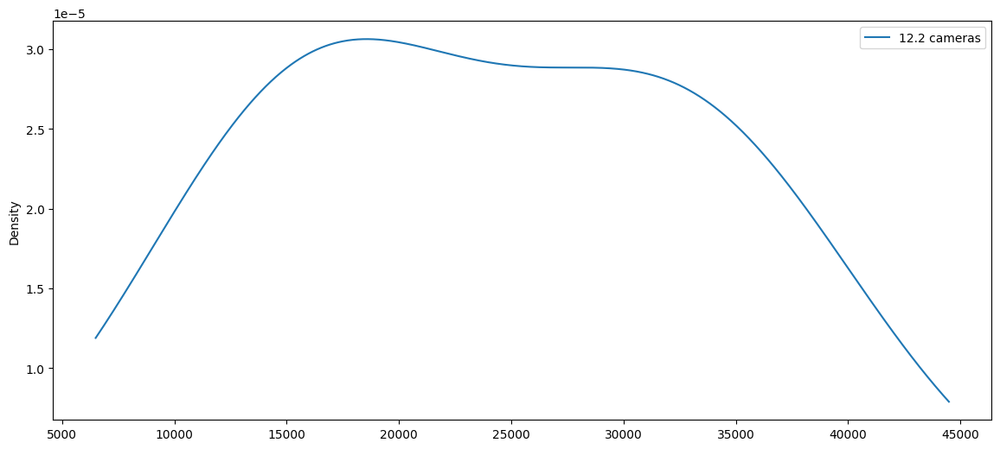

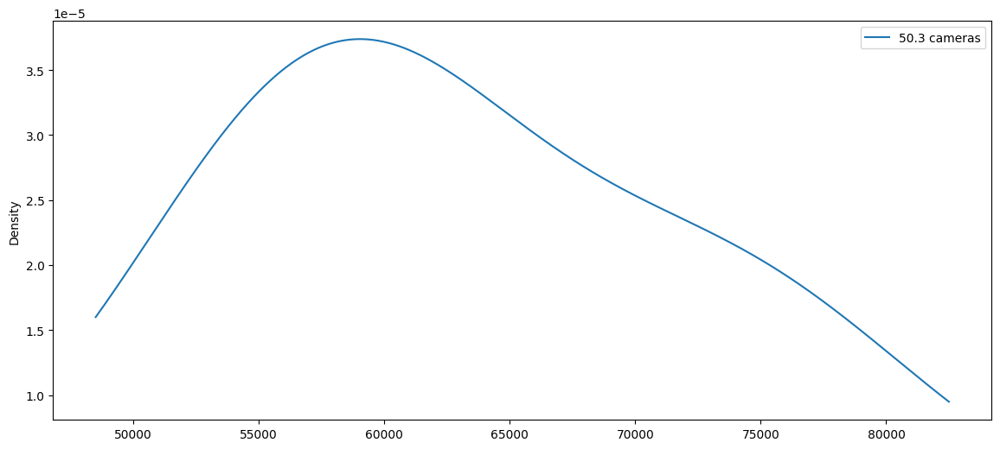

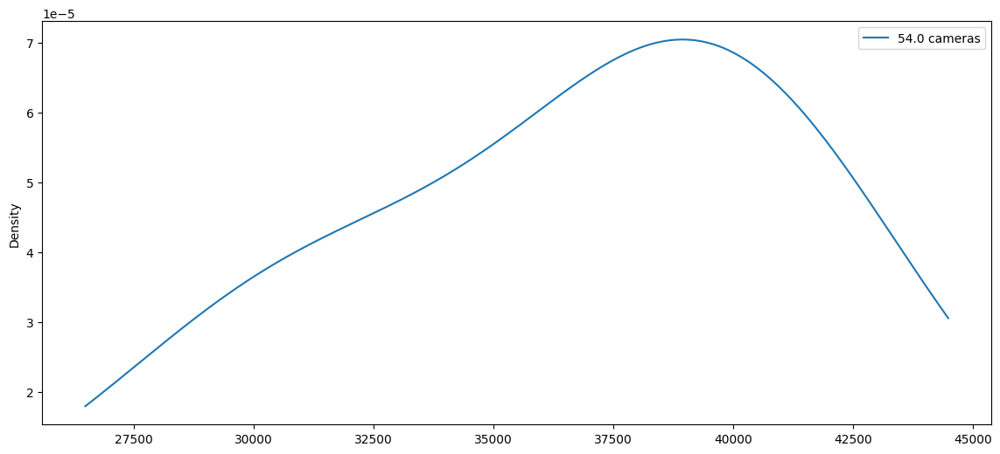

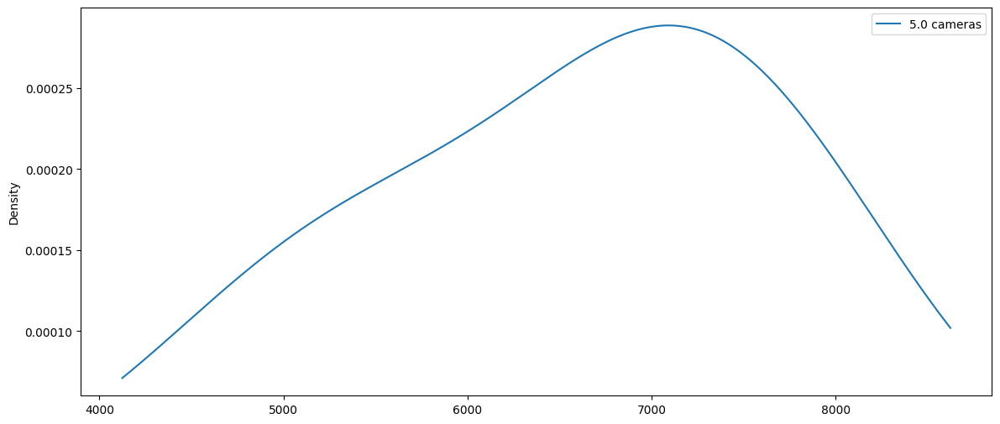

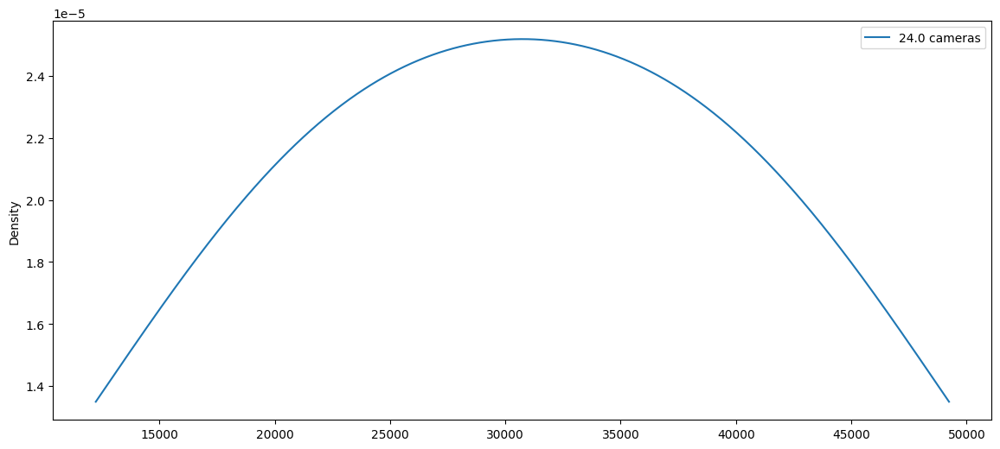

In [428]:
# 1D kde plot

# ... your existing code to create the DataFrame (df) ...
MP = df['primary_camera_rear'].value_counts().index.tolist()

for i in MP:
    subset = df[df['primary_camera_rear'] == i]['price']
    
    # Check if subset has more than one element before plotting
    if not subset.empty and len(subset) > 1:
        plt.figure(figsize=(14, 6))
        subset.plot(kind='kde', label=f'{i} cameras')

        # Print skewness only if the subset has more than one element
        print(f'skew of {i} MP: ', subset.skew())
        plt.legend()

# Add legend and display the plot after the loop (assuming all plots fit)
# if len(MP) > 1:  # Check if there's more than one camera count
#     plt.legend()

plt.show()

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<AxesSubplot: xlabel='internal_memory', ylabel='price'>

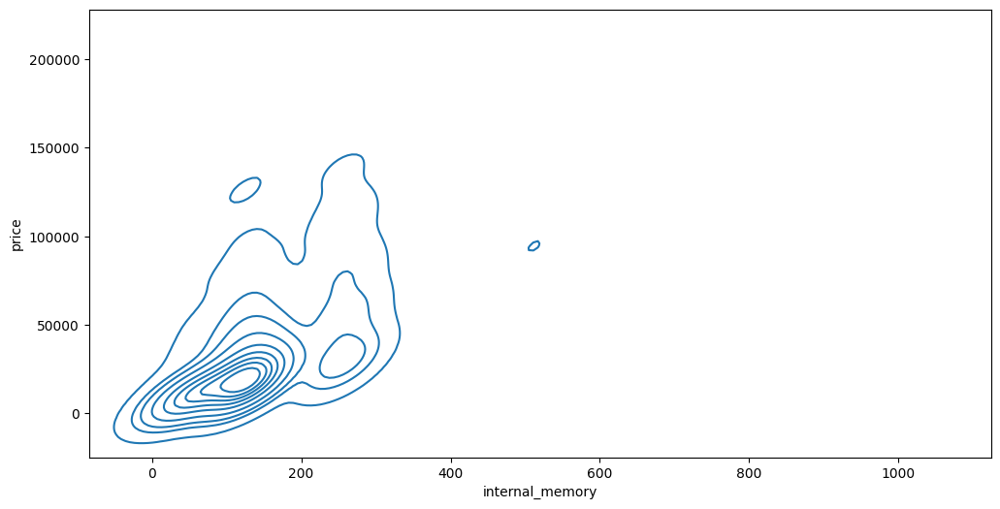

In [429]:
# 2D kde plot
plt.figure(figsize = (12,6))
sns.kdeplot(data = df, x = 'internal_memory', y = 'price')

In [430]:
# Extract the relevant columns from your DataFrame
internal_memory = df['internal_memory']
price = df['price']

# Calculate the Spearman correlation coefficient and p-value
spearman_corr, p_value = stats.spearmanr(internal_memory, price)

# Print the results
print("Spearman correlation coefficient:", spearman_corr)
print("p-value:", p_value)

# The Spearman correlation coefficient between internal memory and price is approximately 0.743, indicating a strong positive
# correlation. Additionally, the p-value is very close to zero (8.46e-157), suggesting that this correlation is statistically
# significant.

Spearman correlation coefficient: 0.742648462163985
p-value: 8.461797293392874e-157


- Since the Spearman correlation coefficient assesses the relationship between two variables without assuming a specific
  distribution, there's no direct post-hoc test associated with it. However, you can explore the relationship further by 
  examining the scatter plot between internal memory and price to visualize the correlation. Additionally, you may consider 
  conducting a bootstrapping analysis to estimate the confidence interval for the correlation coefficient. This can provide
  insights into the stability and precision of the correlation estimate.

In [431]:

# Sample data for demonstration (replace this with your actual data)
# data = pd.read_csv('your_data.csv')

def bootstrap_corr(data, col1, col2, n_bootstraps=1000, alpha=0.05):
    if col1 not in data.columns or col2 not in data.columns:
        raise KeyError(f"One or both columns: '{col1}', '{col2}' not found in DataFrame")

    corr_coeffs = []

    for _ in range(n_bootstraps):
        bootstrap_sample = data.sample(frac=1, replace=True)
        corr_coeff, _ = stats.spearmanr(bootstrap_sample[col1], bootstrap_sample[col2])
        corr_coeffs.append(corr_coeff)

    sorted_corr_coeffs = np.sort(corr_coeffs)
    lower_bound = sorted_corr_coeffs[int((alpha / 2) * n_bootstraps)]
    upper_bound = sorted_corr_coeffs[int((1 - alpha / 2) * n_bootstraps)]

    return np.mean(corr_coeffs), lower_bound, upper_bound

# Perform bootstrapping analysis
corr_coeff, lower_bound, upper_bound = bootstrap_corr(df, 'internal_memory', 'price')

print("Spearman correlation coefficient:", corr_coeff)
print("95% Confidence Interval for correlation coefficient:", (lower_bound, upper_bound))

Spearman correlation coefficient: 0.741709897276176
95% Confidence Interval for correlation coefficient: (0.7047961411012676, 0.7776052787085675)


In [432]:
# 11 x 0
# internal_memory x brand_name
pd.crosstab(df['internal_memory'],df['brand_name'])

brand_name,apple,google,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
internal_memory,,,,,,,,,,,,,,,,
16,0,0,0,0,0,0,0,1,0,0,0,2,1,1,3,0
32,1,0,0,0,1,0,1,1,0,4,3,12,5,3,12,6
64,9,2,1,2,12,1,14,4,5,10,12,22,26,11,16,31
128,16,10,7,6,13,21,34,6,27,48,24,56,81,13,56,77
256,11,2,3,4,3,10,3,1,9,26,2,5,17,5,22,18
512,5,0,2,2,0,0,0,0,1,0,0,0,1,0,2,1
1024,4,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [433]:
# Create a contingency table
contingency_table = pd.crosstab(df['internal_memory'], df['brand_name'])

# Perform Chi-Square Test of Independence
chi2, _, _, _ = stats.chi2_contingency(contingency_table)

# Calculate Cramér's V
n = contingency_table.sum().sum()
min_dim = min(contingency_table.shape)
cramers_v = np.sqrt(chi2 / (n * (min_dim - 1)))

print("Cramer's V:", cramers_v)

# The Cramér's V value of approximately 0.211 indicates a moderate association between internal memory and brand name in your 
# dataset. This suggests that there is a relationship between the two variables, but it's not very strong.

Cramer's V: 0.211414175563095


In [434]:
# 11 x 24
# internal_memory x os
pd.crosstab(df['internal_memory'],df['os'])

os,Android,Other,iOS
internal_memory,,,
16,8,0,0
32,48,0,1
64,168,1,9
128,471,5,16
256,126,2,11
512,7,0,5
1024,1,0,4


internal_memory x price
- It is evident from the plot that there is a positive correlation between the internal memory capacity (measured in GB) and 
the average price of smartphones. As the internal memory capacity increases, so does the price of the smartphone.
- The Spearman correlation coefficient: between internal memory and price is approximately 0.743, indicating a strong positive
correlation. Additionally, the p-value is very close to zero (8.46e-157), suggesting that this correlation is statistically
significant.
- The Spearman correlation coefficient between internal memory and price is approximately 0.7426. The 95% confidence interval 
for the correlation coefficient is (0.7079, 0.7774). This suggests a strong positive correlation between internal memory and 
price, indicating that as internal memory increases, the price tends to increase as well.

internal_memory x brand_name
The Cramér's V value of approximately 0.211 indicates a moderate association between internal memory and brand name in your 
dataset. This suggests that there is a relationship between the two variables, but it's not very strong.

internal_memory x os
in iOS models first highest category is 128GB with 34.78%. Second highest is 256GB with 23.91%. Third highest is 256GB 
with 19.57%. Fourth highest is 64GB with 10.87%. Fifth highest is 512GB with 8.70%. Sixth and the last one is 32GB with 2.17%.

in Android 98.08% fall in top 4 categories first highest is 128GB internal_memory with 56.82%. Second highest is 64GB with
20.27%. Third highest is 256GB with 15.20%. Fourth highest is 32GB with 5.79%.

<AxesSubplot: ylabel='count'>

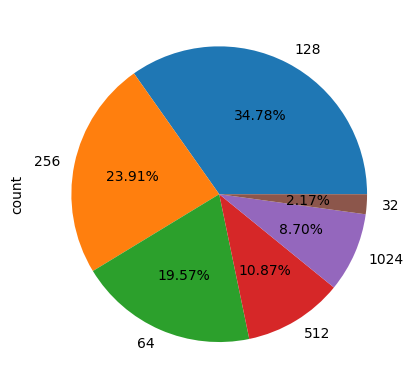

In [435]:
df[df['os'] == 'iOS']['internal_memory'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
# in iOS models first highest category is 128GB with 34.78%. Second highest is 256GB with 23.91%. Third highest is 256GB 
# with 19.57%. Fourth highest is 64GB with 10.87%. Fifth highest is 512GB with 8.70%. Sixth and the last one is 32GB with 2.17%.

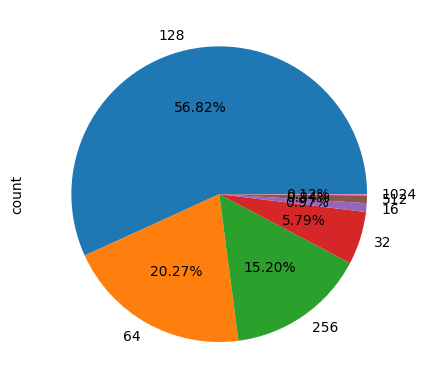

In [436]:
df[df['os'] == 'Android']['internal_memory'].value_counts().plot(kind = 'pie', autopct = '%.2f%%');
# in Android 98.08% fall in top 4 categories first highest is 128GB internal_memory with 56.82%. Second highest is 64GB with
# 20.27%. Third highest is 256GB with 15.20%. Fourth highest is 32GB with 5.79%.

<AxesSubplot: xlabel='fast_charging_available', ylabel='price'>

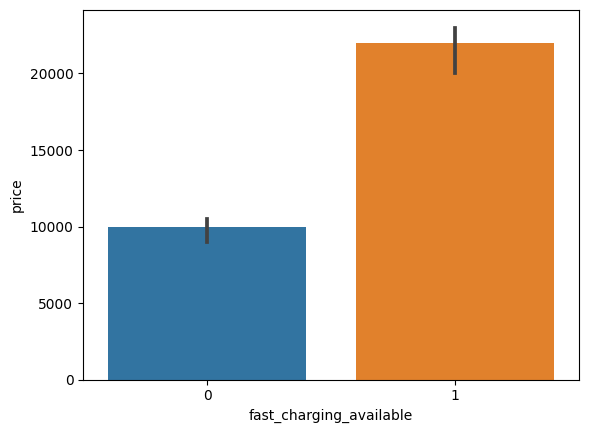

In [437]:
# 12 x 2.
# fast charging available x price
sns.barplot(data = temp_df,x = 'fast_charging_available',y = 'price',estimator = np.median)
# The average price of smartpnones with fast charging capability is approximately twice that of smartphones without this feature

<AxesSubplot: xlabel='fast_charging_available', ylabel='price'>

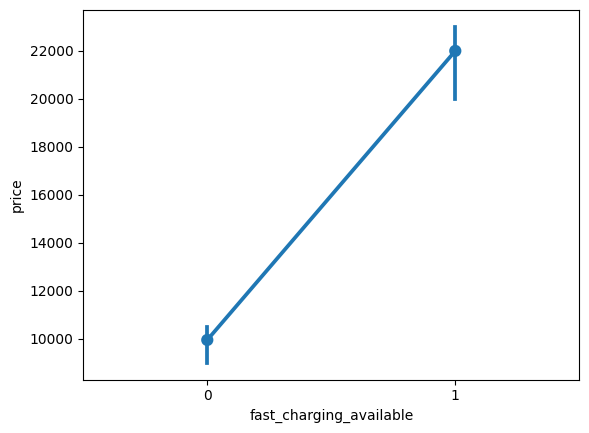

In [438]:

# pointplot:
sns.pointplot(data = df,x = 'fast_charging_available',y = 'price',estimator = np.median)
# there is a clear steep line between to two medians price points

- both the category distributions are heavily right skewed with numeruous outliers.
- majority of data points are clustered around the midean of both the category distributions.
- the Q3 price of smartphones without fastcharging availablity category is lesserthan the Q1 price of the fast_charging once
  the 21994.0 median price of smartphones with fast_charging availability is 121.05% morethan the 9950.0 median price of
  category without availability
- even the standard deviation and the mean of the category with the fast_charging availabliliy is more than the onces that 
  doesn't
- both both categories means are not equal to there medians.
- smartphones with fast charging available tend to have higher prices on average.

- in every brand smarphone models with fast_chariging feature more than the ones that doesn't.
- each and every models of 'iqoo' and 'google' are equiped with fast_charging feature.
- 15.62 % of smartphones with fast charging belongs to samsung brand with 122 models
- 15.62 % of smartphones with fast charging belongs to xiaomi brand with 122 models

- percentage of smartphone models with fast_charging_available in android os:  88.54%.
- percentage of smartphone models with fast_charging_available in iOS os:  69.56%.

<AxesSubplot: xlabel='fast_charging_available', ylabel='price'>

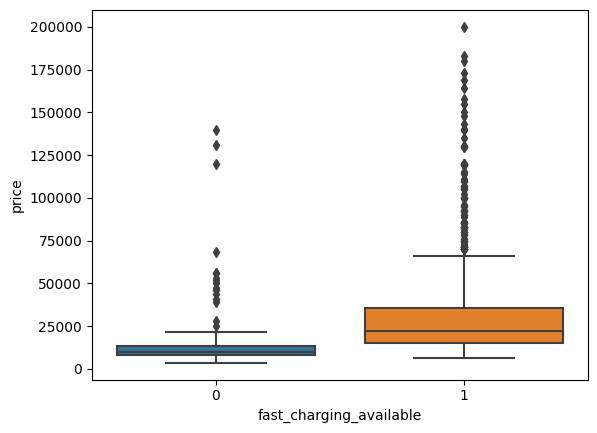

In [439]:

# boxplot:
sns.boxplot(data = df, x = 'fast_charging_available', y = 'price')


<AxesSubplot: xlabel='fast_charging_available', ylabel='price'>

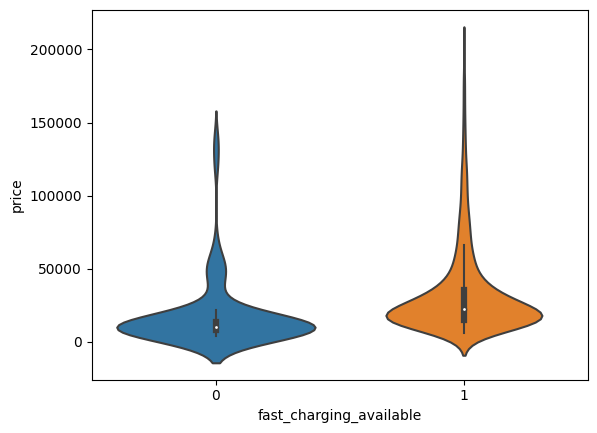

In [440]:
# violinplot:
sns.violinplot(data = df, x = 'fast_charging_available', y = 'price')


<AxesSubplot: xlabel='fast_charging_available', ylabel='price'>

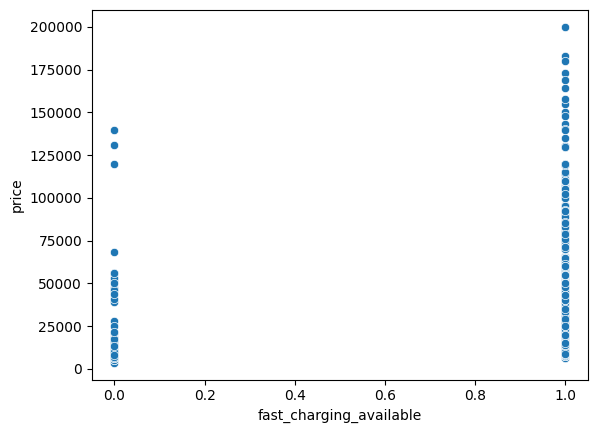

In [441]:
# scatterplot:
sns.scatterplot(data = df, x = 'fast_charging_available', y = 'price')


C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


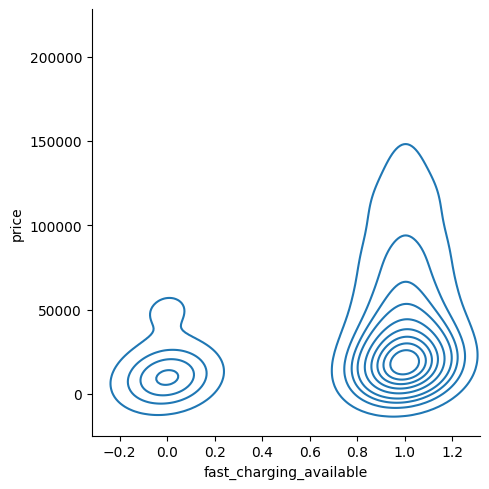

In [442]:
# 2D kdeplot:
sns.displot(kind = 'kde', data = df, x = 'fast_charging_available', y = 'price')


skewness:  2.4483579518011864


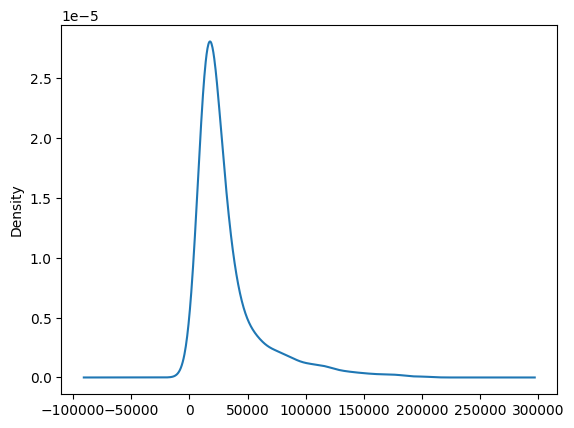

In [443]:
# 1D kdeplot:
df[df['fast_charging_available'] == True]['price'].plot(kind = 'kde')
print('skewness: ', df[df['fast_charging_available'] == True]['price'].skew())

skewness:  3.659165899274468


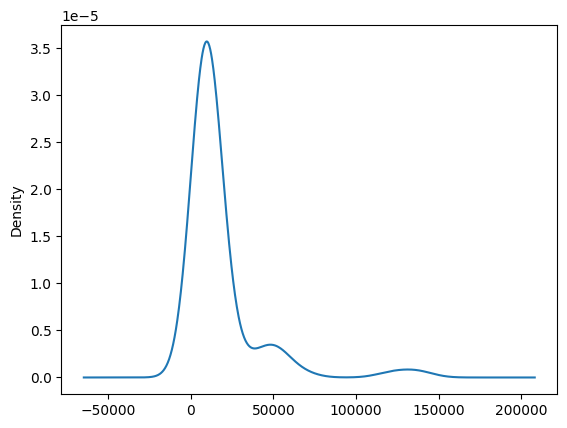

In [444]:
# 1D kdeplot:
df[df['fast_charging_available'] == False]['price'].plot(kind = 'kde')
print('skewness: ', df[df['fast_charging_available'] == False]['price'].skew())

In [445]:
# statisitcal summary:
df.groupby('fast_charging_available')['price'].describe()
# the Q3 pricd of smartphones without fastcharging availablity category is lesserthan the Q1 price of the fast_charging once
# the 21994.0 median price of smartphones with fast_charging availability is 121.05% morethan the median price of category
# without availability
# even the standard deviation and the mean of the category with the fast_charging availabliliy is more than the onces that 
# doesn't
# both of there means are not equal to there medians
# 54.76% --- 121.05%

,count,mean,std,min,25%,50%,75%,max
fast_charging_available,,,,,,,,
0,109.0,17538.963303,23058.37183,3499.0,7999.0,9950.0,13490.0,139900.0
1,781.0,32526.457106,29479.99327,6171.0,14999.0,21994.0,35499.0,199990.0


-2.30708409497014

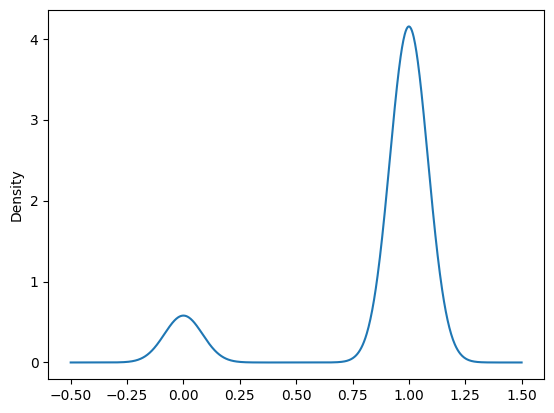

In [446]:
df['fast_charging_available'].plot(kind = 'kde')
df['fast_charging_available'].skew()

2.4866259011176255

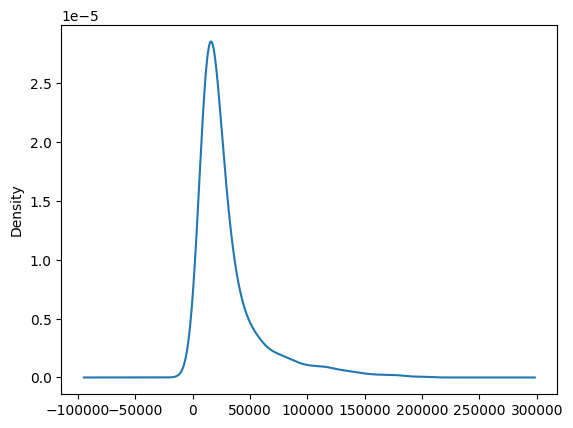

In [447]:
df['price'].plot(kind = 'kde')
df['price'].skew()

<AxesSubplot: >

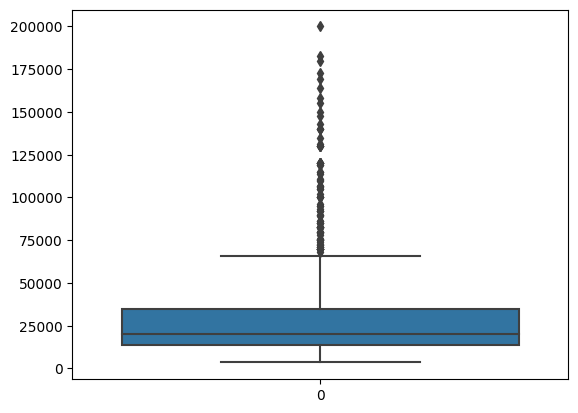

In [448]:
sns.boxplot(data = df['price'])

<AxesSubplot: >

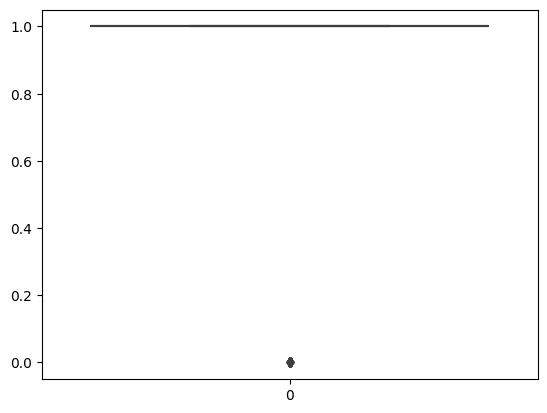

In [449]:
sns.boxplot(data = df['fast_charging_available'])

In [450]:
# Calculate the Spearman correlation coefficient
spearman_corr, p_value = stats.spearmanr(df['fast_charging_available'], df['price'])

print("Spearman correlation coefficient:", spearman_corr)
print("P-value:", p_value)


# The Spearman correlation coefficient you obtained is approximately 0.357, and the associated p-value is very close to zero 
# (3.31e-28). Let's interpret these results:

#     Spearman Correlation Coefficient (rho):
#         - The Spearman correlation coefficient measures the strength and direction of the monotonic relationship between two 
#             variables.
#         - In your case, a Spearman correlation coefficient of approximately 0.357 indicates a moderate positive monotonic 
#             relationship between "fast_charging_available" and "price" in the population data.


# The Spearman correlation coefficient you obtained is approximately 0.357, and the associated p-value is very close to zero (3.31e-28). Let's interpret these results:
#     P-value:
#         - The p-value associated with the test tells us about the statistical significance of the observed correlation 
#             coefficient.
#         - In your case, the p-value is very close to zero (3.31e-28), which is significantly smaller than the conventional
#             significance level of 0.05.
#         - This suggests strong evidence against the null hypothesis (that there is no correlation between the variables),
#             indicating that the observed correlation is statistically significant.

# Based on these results, you can conclude that there is a statistically significant moderate positive monotonic relationship 
# between the availability of fast charging and the price of smartphones in the population data. This suggests that smartphones 
# with fast charging available tend to have higher prices on average.

Spearman correlation coefficient: 0.3573927862363263
P-value: 3.3135829216882543e-28


In [451]:
# 12 x 0
# fast_charging_available x brand_name
# contingency table
pd.crosstab(df['fast_charging_available'],df['brand_name'])

brand_name,apple,google,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
fast_charging_available,,,,,,,,,,,,,,,,
0,14,0,1,1,5,0,2,2,1,13,3,17,10,11,18,11
1,32,14,12,13,24,32,50,11,41,75,38,80,122,22,93,122


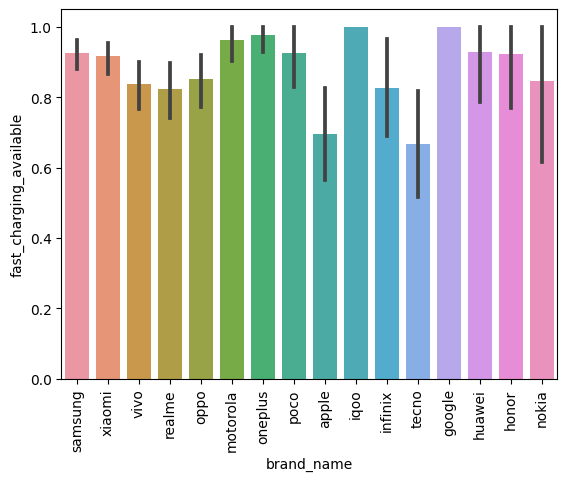

In [452]:
# bar plot
f_order = df[df['fast_charging_available'] == True]['brand_name'].value_counts().index.tolist()

sns.barplot(data = df, x = 'brand_name', y = 'fast_charging_available',order = f_order)
plt.xticks(rotation = 'vertical');


<AxesSubplot: ylabel='count'>

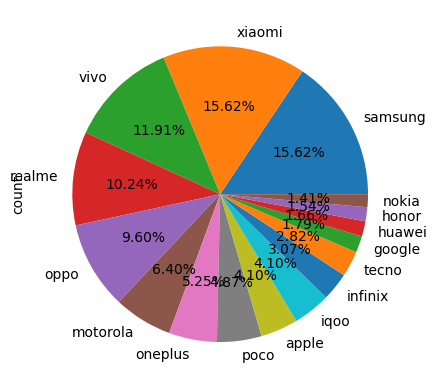

In [453]:
df[df['fast_charging_available'] == True]['brand_name'].value_counts().plot(kind = 'pie',autopct = '%.2f%%')

fast_charging_available x price
The average price of smartpnones with fast charging capability is approximately twice that of smartphones without this feature.


    both the category distributions are heavily right skewed with numeruous outliers.

    majority of data points are clustered around the midean of both the category distributions.

    the Q3 price of smartphones without fastcharging availablity category is lesserthan the Q1 price of the fast_charging once the 21994.0 median price of smartphones with fast_charging availability is 121.05% morethan the 9950.0 median price of category without availability

    even the standard deviation and the mean of the category with the fast_charging availabliliy is more than the onces that doesn't

    both both categories means are not equal to there medians.

    smartphones with fast charging available tend to have higher prices on average.
Spearman: there is a statistically significant moderate positive monotonic relationship 
between the availability of fast charging and the price of smartphones in the population data. This suggests that smartphones 
with fast charging available tend to have higher prices on average.

fast_charging_available x brand_name
    in every brand smarphone models with fast_chariging feature more than the ones that doesn't.

    each and every models of 'iqoo' and 'google' are equiped with fast_charging feature.

    15.62 % of smartphones with fast charging belongs to samsung brand with 122 models

    another 15.62 % of smartphones with fast charging belongs to xiaomi brand with 122 models

fast_charging_available x os
    percentage of smartphone models with fast_charging_available in android os: 88.54%.

    percentage of smartphone models with fast_charging_available in iOS os: 69.56%.



In [454]:
df[df['fast_charging_available'] == True]['brand_name'].value_counts()
# smartphone brand with highest number of models with fast charging feature is samsung followed by xiaomi

brand_name
samsung     122
xiaomi      122
vivo         93
realme       80
oppo         75
motorola     50
oneplus      41
poco         38
apple        32
iqoo         32
infinix      24
tecno        22
google       14
huawei       13
honor        12
nokia        11
Name: count, dtype: int64

<AxesSubplot: ylabel='count'>

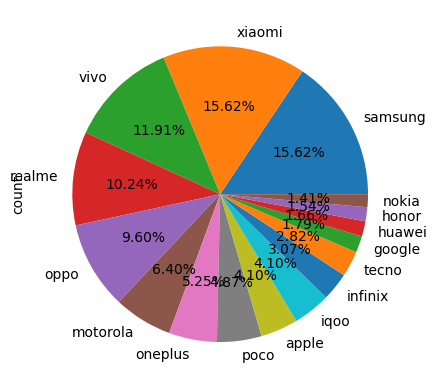

In [455]:
df[df['fast_charging_available'] == True]['brand_name'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
# In every smartphone brand, models with the fast charging feature outnumber those without it.
# Every model of 'iQOO' and 'Google' is equipped with fast charging.
# 15.62% of smartphones with fast charging belong to Samsung brand.
# Another 15.62% of smartphones with fast charging belong to Xiaomi brand.
# followed by 'vivo' with 11.91%. followed by 'realme' with 10.24%. followed by 'oppo' with 9.60 all these 5 brands adds 
# upto 62.99%

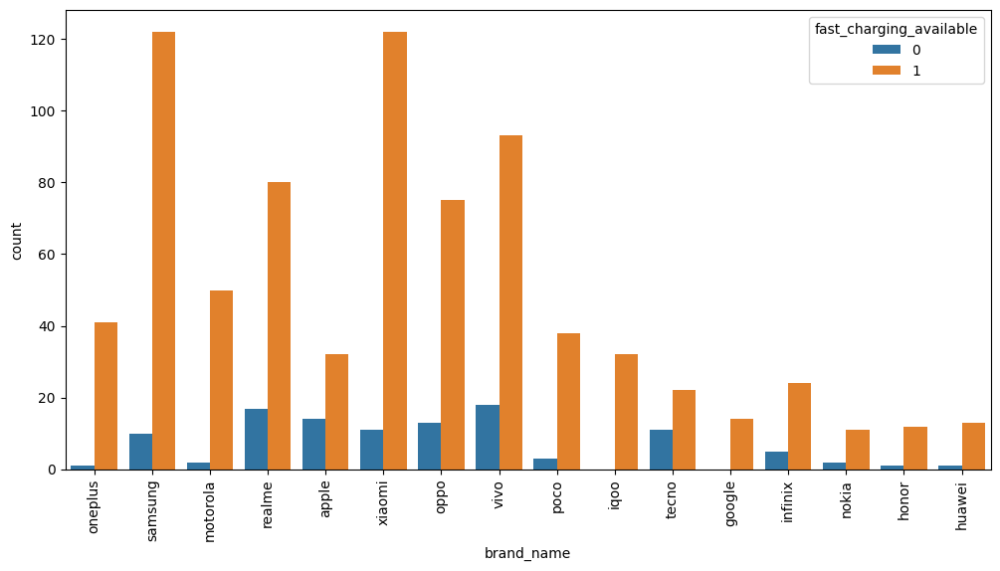

In [456]:
plt.figure(figsize = (12,6))
sns.countplot(data = df, x = 'brand_name', hue = 'fast_charging_available')
plt.xticks(rotation = 'vertical');
# in every brand smarphone models with fast_chariging feature more than the ones that doesn't
# each and every models of 'iqoo' and 'google' are equiped with fast_charging feature

In [457]:
df[(df['brand_name'] == 'google') & (df['fast_charging_available'] == False)]

,brand_name,model,price,rating,has_5g,has_nfc,has_ir_blaster,processor_brand,num_cores,processor_speed,...,refresh_rate,screen_size,resolution,num_rear_cameras,num_front_cameras,primary_camera_rear,primary_camera_front,extended_memory_available,extended_upto,os


In [458]:
# 12 x 24
# fast_charging_available x os
pd.crosstab(df['fast_charging_available'],df['os'])

os,Android,Other,iOS
fast_charging_available,,,
0,95,0,14
1,734,8,32


In [459]:
android_count = df[(df['os'] == 'Android') & (df['fast_charging_available'] == True)]['model'].count()
total_android_count = df[df['os'] == 'Android']['model'].count()
iOS_count = df[(df['os'] == 'iOS') & (df['fast_charging_available'] == True)]['model'].count()
total_iOS_count = df[df['os'] == 'iOS']['model'].count()

print('percentage of smartphone models with fast_charging_available in android os: ', android_count/total_android_count *100)
print("percentage of smartphone models with fast_charging_available in iOS os: ", iOS_count/total_iOS_count *100)

percentage of smartphone models with fast_charging_available in android os:  88.54041013268998
percentage of smartphone models with fast_charging_available in iOS os:  69.56521739130434


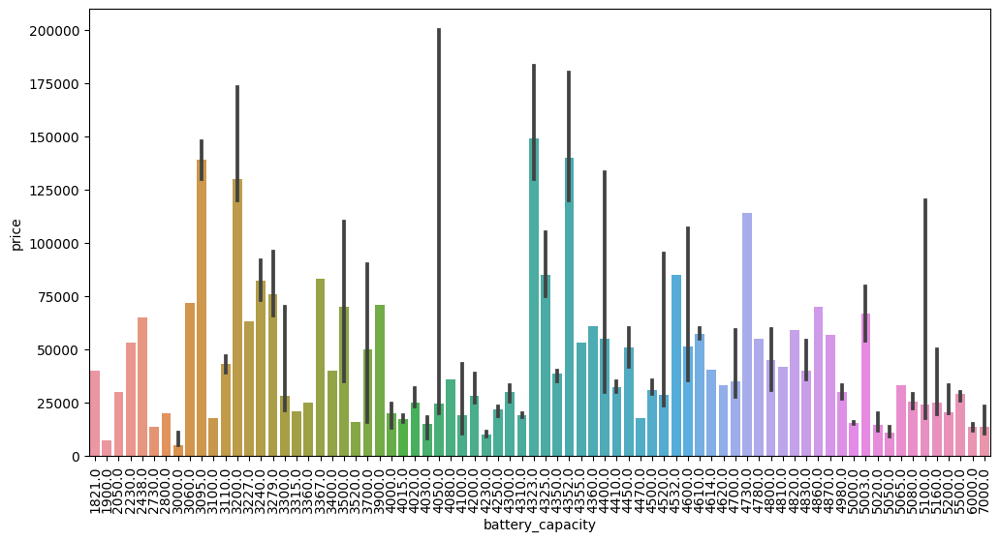

In [460]:
# 14 x 2 
# battery capacity x price
#barplot
plt.figure(figsize = (12,6))
sns.barplot(data = df, x = 'battery_capacity', y = 'price',estimator = np.median)
plt.xticks(rotation = 'vertical')
plt.show()

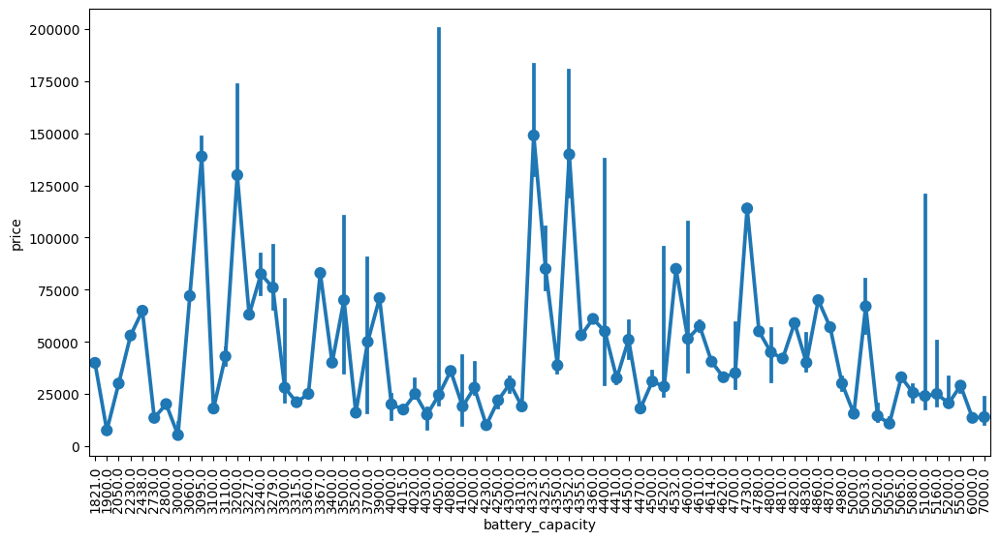

In [461]:
# point plot
plt.figure(figsize = (12,6))
sns.pointplot(data = df, x = 'battery_capacity', y = 'price',estimator = np.median)
plt.xticks(rotation = 'vertical')
plt.show()

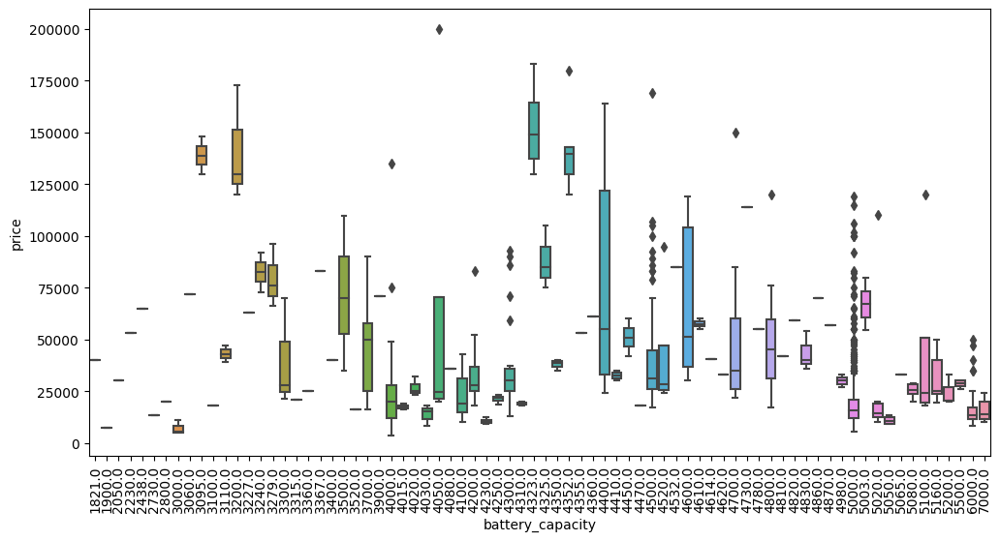

In [462]:
# box plot
plt.figure(figsize = (12,6))
sns.boxplot(data = df, x = 'battery_capacity', y = 'price')
plt.xticks(rotation = 'vertical')
plt.show()

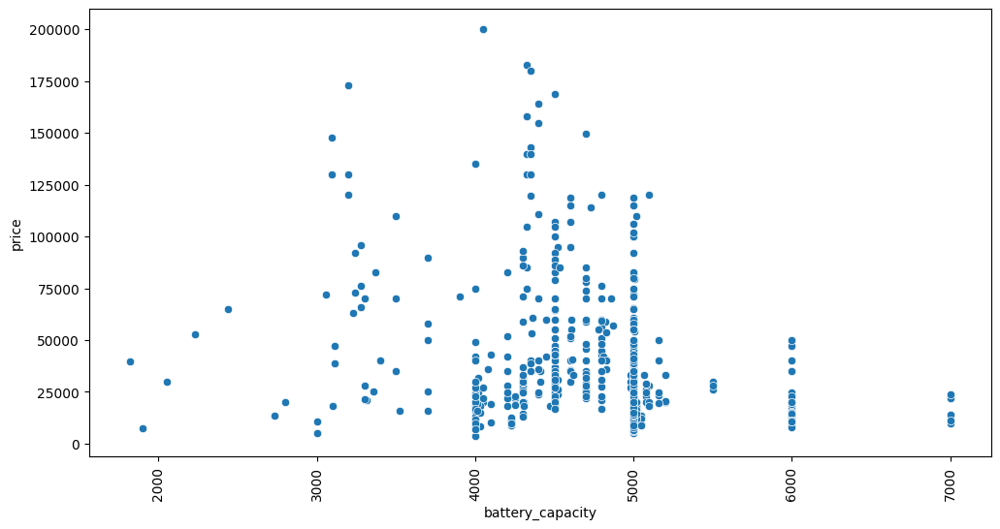

In [463]:
# scatter plot
plt.figure(figsize = (12,6))
sns.scatterplot(data = df, x = 'battery_capacity', y = 'price')
plt.xticks(rotation = 'vertical')
plt.show()

<AxesSubplot: ylabel='count'>

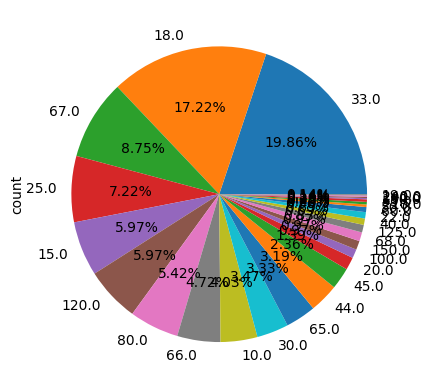

In [464]:
df['fast_charging'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')

skew of 5000.0 MP:  3.194970154381657
skew of 4500.0 MP:  2.4084364121610142
skew of 6000.0 MP:  2.37833978785402
skew of 4000.0 MP:  3.0761893889647483
skew of 4700.0 MP:  1.8470486620724957
skew of 4300.0 MP:  1.4128295579527403
skew of 4800.0 MP:  1.4133894960717557
skew of 4200.0 MP:  2.1288248023569287
skew of 5020.0 MP:  3.2359444866026337
skew of 4600.0 MP:  0.46180395730180385
skew of 4400.0 MP:  0.6734346549900526
skew of 4230.0 MP:  0.4531425681367328
skew of 7000.0 MP:  0.7147956912360612
skew of 5080.0 MP:  -0.4594940024970761
skew of 4352.0 MP:  1.3624088462374682
skew of 3700.0 MP:  0.5366948653553282
skew of 5160.0 MP:  0.8312483413082066
skew of 5500.0 MP:  -0.8489455243435059
skew of 4050.0 MP:  1.993407285499099
skew of 4323.0 MP:  0.7404840374647585
skew of 5100.0 MP:  1.9545651031771298
skew of 5050.0 MP:  0.36664796061524685
skew of 4520.0 MP:  1.9550935888190744
skew of 3300.0 MP:  1.6137277780752732
skew of 3000.0 MP:  1.7213041551296562
skew of 3279.0 MP:  0.935

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_7084\1451150690.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(14, 6))


skew of 4100.0 MP:  1.2321836766009717
skew of 4030.0 MP:  -1.0630717305019497
skew of 4350.0 MP:  -1.263377631672051
skew of 3500.0 MP:  0.19650174306381796
skew of 3200.0 MP:  1.4896697904311484
skew of 4020.0 MP:  1.3889133834690734
skew of 4325.0 MP:  0.9352195295828272
skew of 5200.0 MP:  1.7230755931005235
skew of 4830.0 MP:  1.389275040147685
skew of 4980.0 MP:  0.0
skew of 4250.0 MP:  -1.2637317205080625
skew of 3240.0 MP:  nan
skew of 4450.0 MP:  nan
skew of 4015.0 MP:  nan
skew of 3095.0 MP:  nan
skew of 3110.0 MP:  nan
skew of 4610.0 MP:  nan
skew of 4410.0 MP:  nan
skew of 5003.0 MP:  nan
skew of 4310.0 MP:  nan


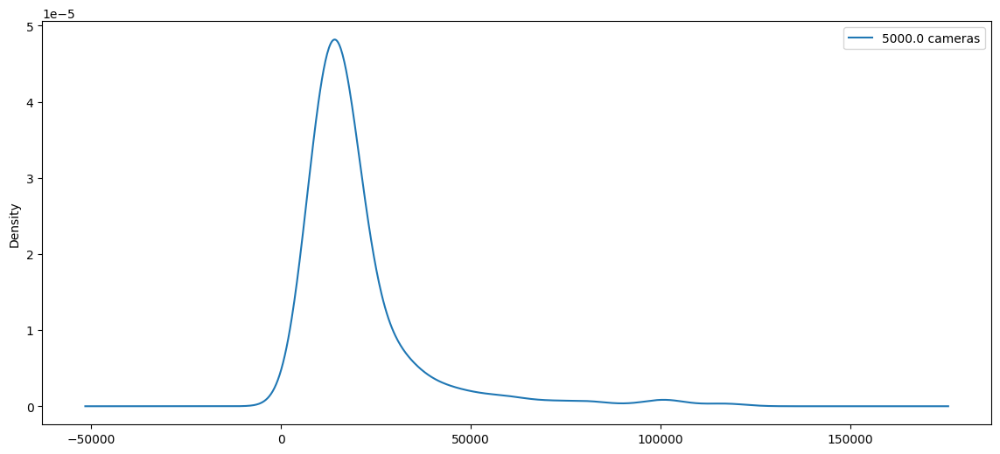

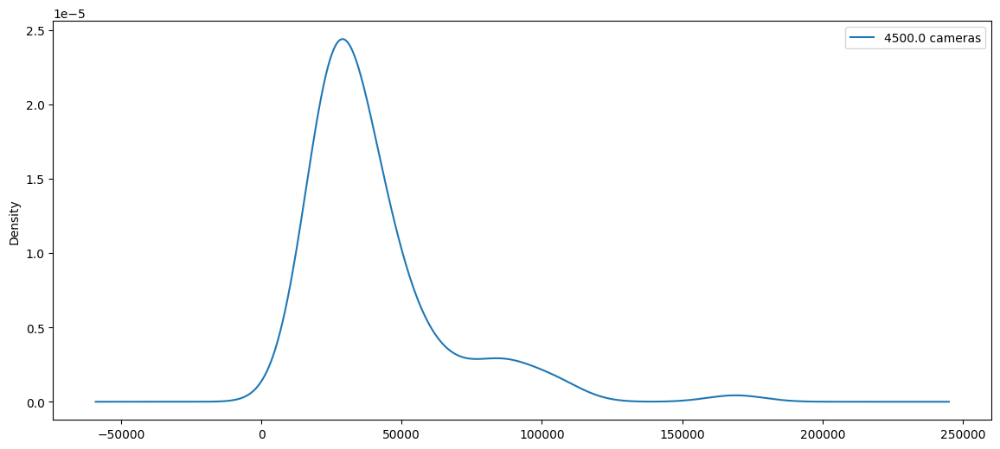

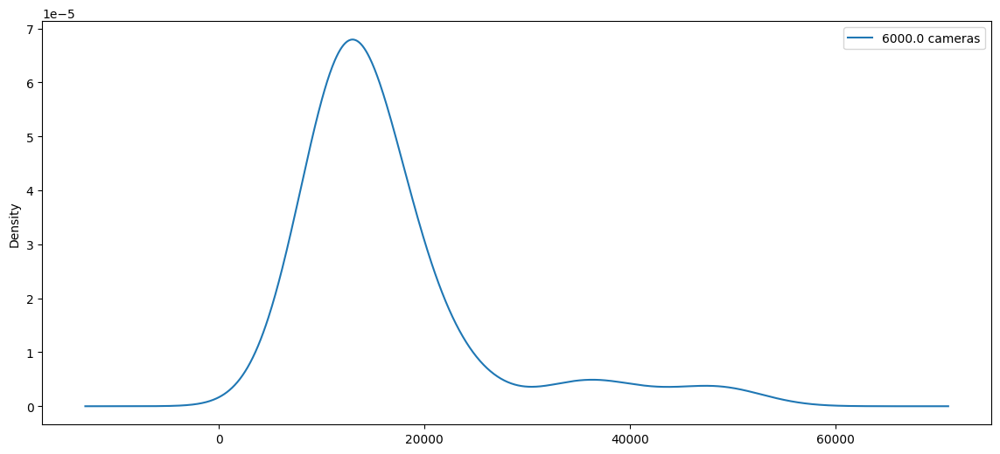

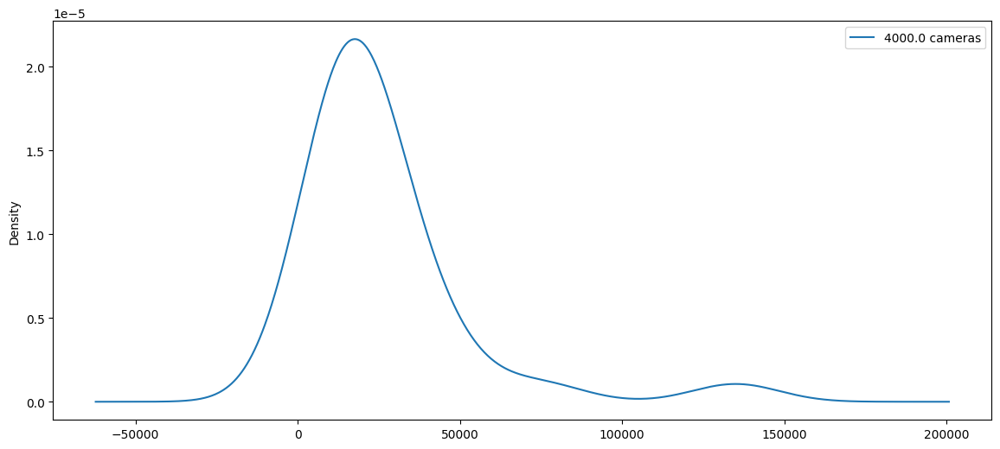

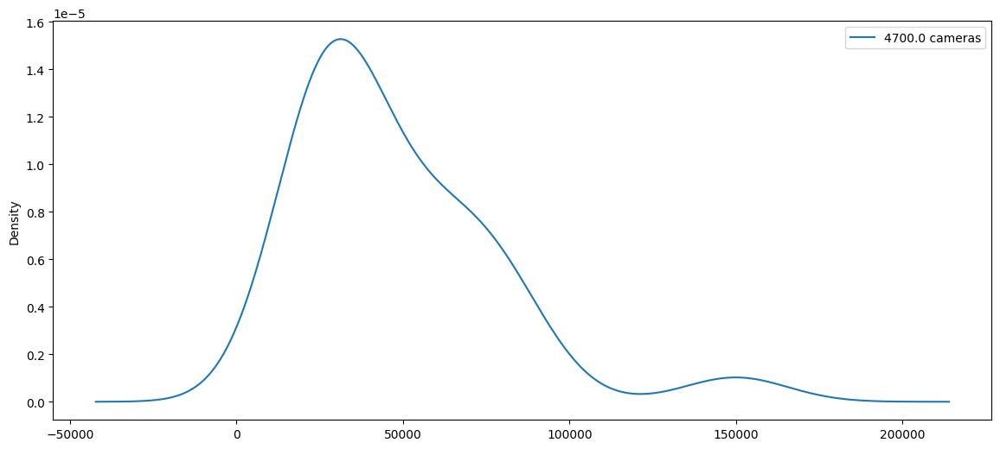

...

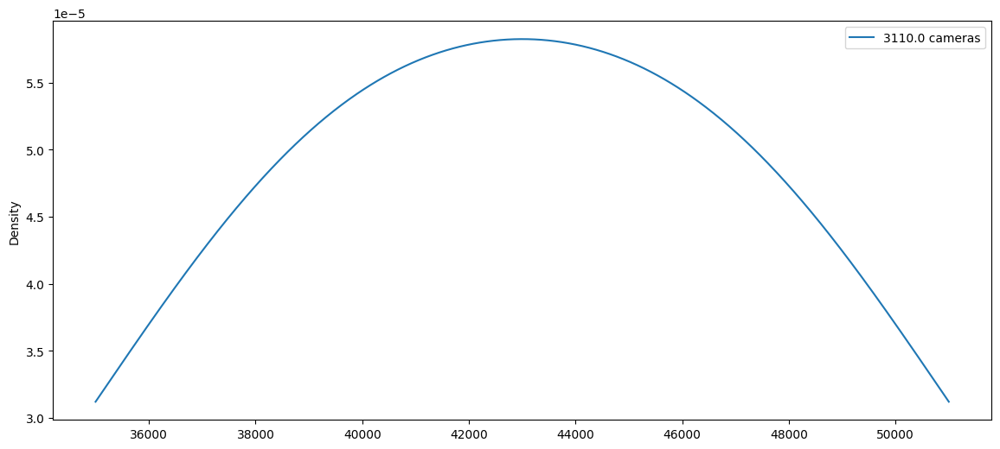

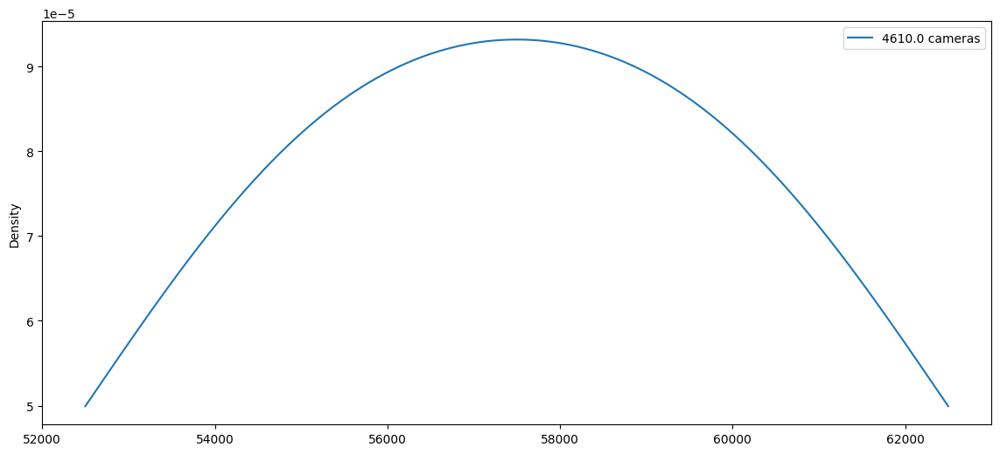

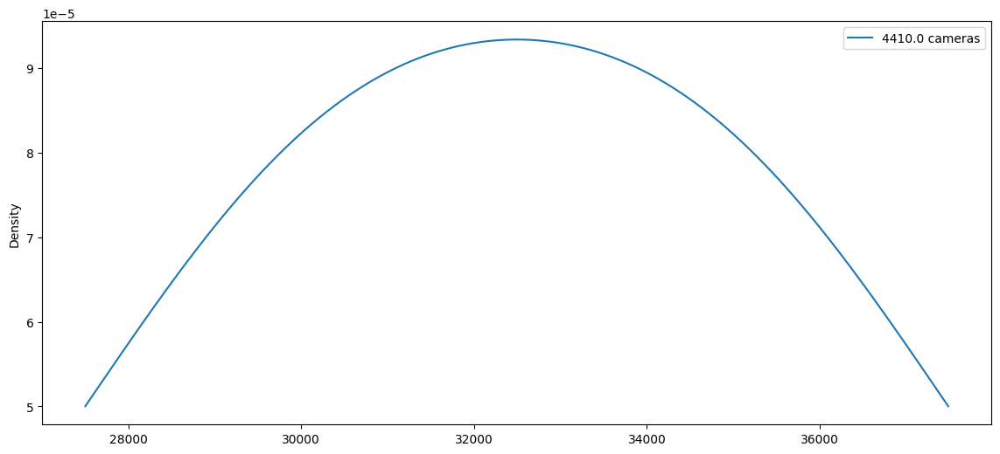

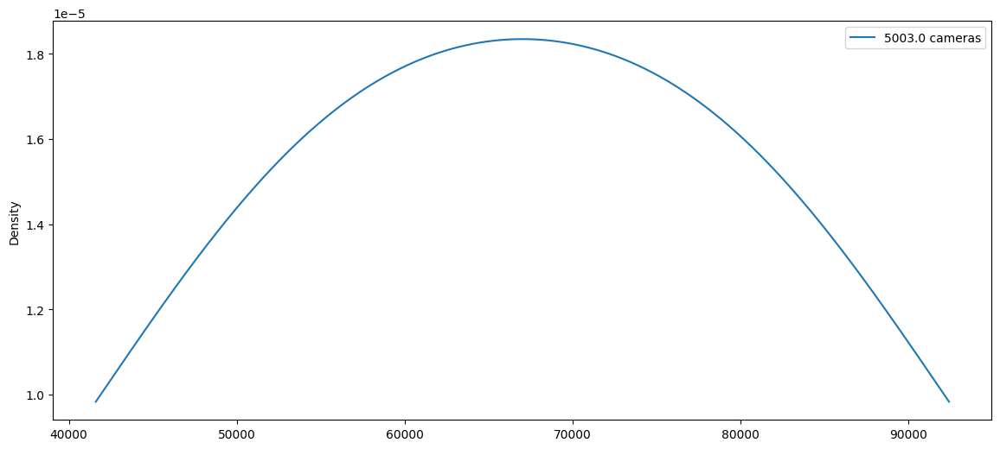

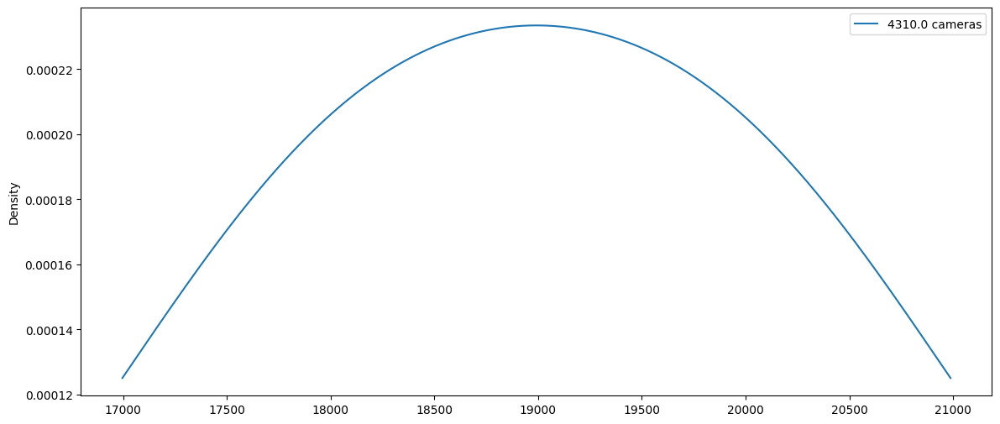

In [465]:
# 1D kde plot

# ... your existing code to create the DataFrame (df) ...
MP = df['battery_capacity'].value_counts().index.tolist()

for i in MP:
    subset = df[df['battery_capacity'] == i]['price']
    
    # Check if subset has more than one element before plotting
    if not subset.empty and len(subset) > 1:
        plt.figure(figsize=(14, 6))
        subset.plot(kind='kde', label=f'{i} cameras')

        # Print skewness only if the subset has more than one element
        print(f'skew of {i} MP: ', subset.skew())
        plt.legend()

# Add legend and display the plot after the loop (assuming all plots fit)
# if len(MP) > 1:  # Check if there's more than one camera count
#     plt.legend()

plt.show()

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


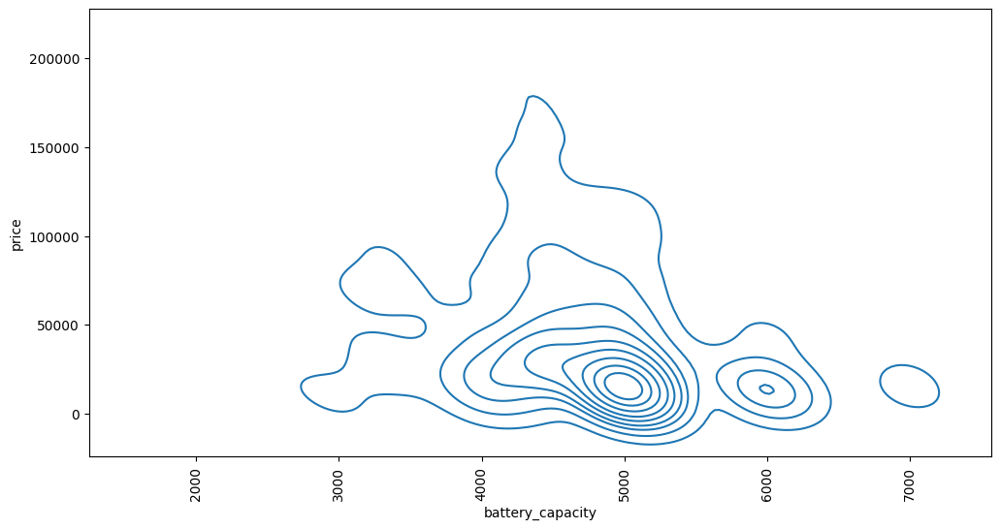

In [466]:
# 2D kde plot
plt.figure(figsize = (12,6))
sns.kdeplot(data = df, x = 'battery_capacity', y = 'price')
plt.xticks(rotation = 'vertical')
plt.show()

In [467]:
filtered_df = df.dropna(subset = ['battery_capacity','brand_name'])

h_statistic,p_value = stats.kruskal(filtered_df['price'], filtered_df['battery_capacity'])

print("Kruskal-Wallis statistic:", h_statistic)
print("P-value: ", p_value)

# - The value of the Kruskal-Wallis statistic, 1329.99, is high. It indicates a substantial difference between groups. In the context of the Kruskal-Wallis test, higher values of the statistic suggest a stronger evidence against the null hypothesis, indicating greater differences between groups.
# and a p-value much less than 0.05 (specifically, 3.44×10−2913.44×10−291).

# - This result suggests strong evidence against the null hypothesis, indicating that there is a statistically significant relationship between battery capacity and price.

Kruskal-Wallis statistic: 1329.9877006124725
P-value:  3.4397797290997836e-291


In [468]:
# 14 x 0
# battery_capacity x brand_name
pd.crosstab(df['battery_capacity'],df['brand_name'])

brand_name,apple,google,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
battery_capacity,,,,,,,,,,,,,,,,
1821.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1900.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2050.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2230.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2438.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5160.0,0,0,0,0,0,0,0,0,0,0,1,0,0,2,0,2
5200.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
5500.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,3


In [469]:
#  Create a contingency table between battery_capacity and brand_name
contingency_table = pd.crosstab(df['battery_capacity'], df['brand_name'])

# Perform the chi-square test
chi2, p_value, dof, _ = stats.chi2_contingency(contingency_table)

# Output the results
print("Chi-square statistic: ", chi2)
print("p-value: ", p_value)
print("Degrees Of Fredom: ",dof)

# - In the context of the Chi-square statistic, the value of 3024.2800101110242 is high. This indicates a strong association between the variables battery_capacity and brand_name. Additionally, the low p-value further supports the significance of this association.

# - The Chi-square statistic value is 3024.2800101110242, the p-value is approximately 1.4151046064973097e-173, and the degrees of freedom is 1125. This suggests a significant association between battery_capacity and brand_name, considering the low p-value and the large degrees of freedom.

Chi-square statistic:  3024.2800101110242
p-value:  1.4151046064973097e-173
Degrees Of Fredom:  1125


In [470]:
# 14 x 24
# battery_capacity x os
pd.crosstab(df['battery_capacity'],df['os'])

os,Android,Other,iOS
battery_capacity,,,
1821.0,0,0,1
1900.0,1,0,0
2050.0,0,0,1
2230.0,0,0,1
2438.0,0,0,1
...,...,...,...
5160.0,5,0,0
5200.0,3,0,0
5500.0,4,0,0


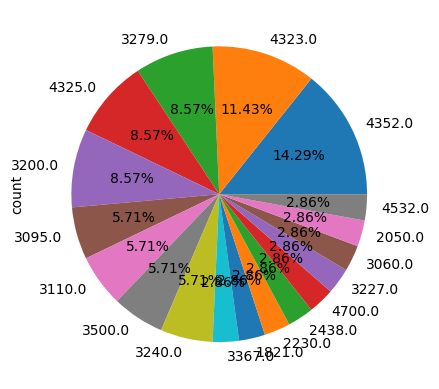

In [471]:
df[df['os'] == 'iOS']['battery_capacity'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
plt.show()
# in iOS 51.43% of models fall in top5 categories First highest models category is 4352mAh with 14.29%. Second highest i 4323mAh
# with 11.43%. Third highest models category is 3279mAh with 8.57%. Fourth highest models category is 4325mAh with 8.57%.
# Fifth highest models category is 2200mAh with 8.57%.

battery_capacity x price
- The value of the Kruskal-Wallis: statistic, 1329.99, is high. It indicates a substantial difference between groups. In the context of the Kruskal-Wallis test, higher values of the statistic suggest a stronger evidence against the null hypothesis, indicating greater differences between groups.

and a p-value much less than 0.05 (specifically, 3.44×10−2913.44×10−291).

- This result suggests strong evidence against the null hypothesis, indicating that there is a statistically significant relationship between battery capacity and price.

battery_capacity x brand_name
- In the context of the Chi-square: statistic, the value of 3024.2800101110242 is high. This indicates a strong association between the variables battery_capacity and brand_name. Additionally, the low p-value further supports the significance of this association.

- The Chi-square statistic value is 3024.2800101110242, the p-value is approximately 1.4151046064973097e-173, and the degrees of freedom is 1125. This suggests a significant association between battery_capacity and brand_name, considering the low p-value and the large degrees of freedom.

battery_capacity x os
- in iOS 51.43% of models fall in top5 categories First highest models category is 4352mAh with 14.29%. Second highest i 4323mAh
with 11.43%. Third highest models category is 3279mAh with 8.57%. Fourth highest models category is 4325mAh with 8.57%.
Fifth highest models category is 2200mAh with 8.57%.

- in Android 71.53% fall in this category First highest models category is 5000mAh with 54.64%. Second highest i 4500mAh
with 10.74%. Third highest models category is 6000mAh with 6.15%.

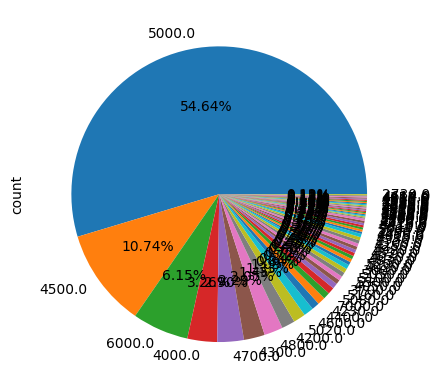

In [472]:
df[df['os'] == 'Android']['battery_capacity'].value_counts().plot(kind = 'pie', autopct = '%.2f%%');
# in Android 71.53% fall in this category First highest models category is 5000mAh with 54.64%. Second highest i 4500mAh
# with 10.74%. Third highest models category is 6000mAh with 6.15%.

<AxesSubplot: ylabel='count'>

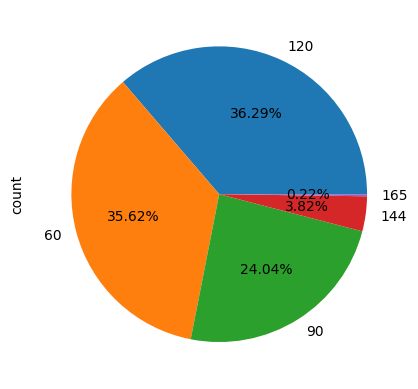

In [473]:
df['refresh_rate'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
# 60Hz for 35.62%, 36.3% of smartphones feature a 120Hz refresh rate.
# In the third position, around 24.0% of smartphones have a 90Hz refresh rate. followed by 90Hz eith 24.04% which adds upto 
# 95.95%


<AxesSubplot: xlabel='refresh_rate', ylabel='price'>

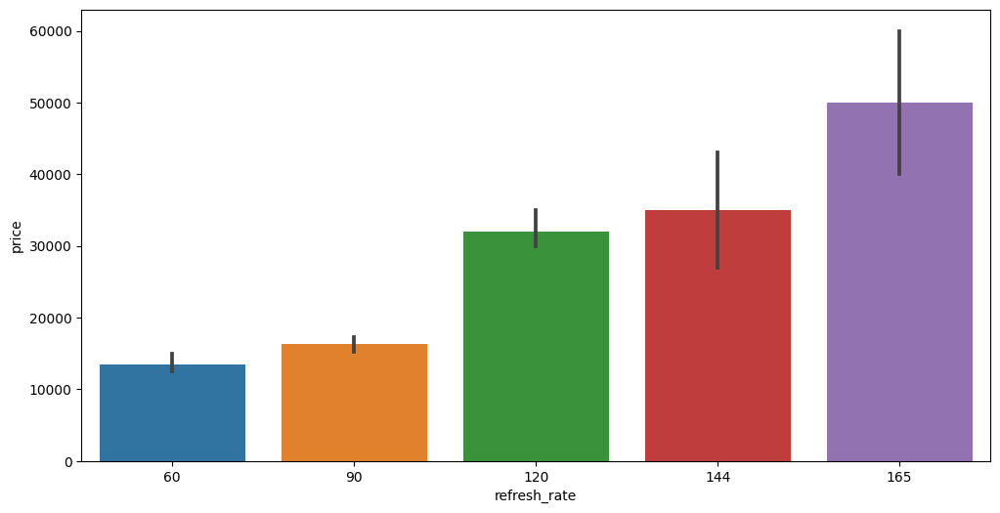

In [474]:
# 15 x 2
# refresh rate x price

# bar plot
plt.figure(figsize = (12,6))
sns.barplot(data = temp_df,x = 'refresh_rate', y = 'price',estimator = np.median)
# Smartphones with higher refresh rate have high average price

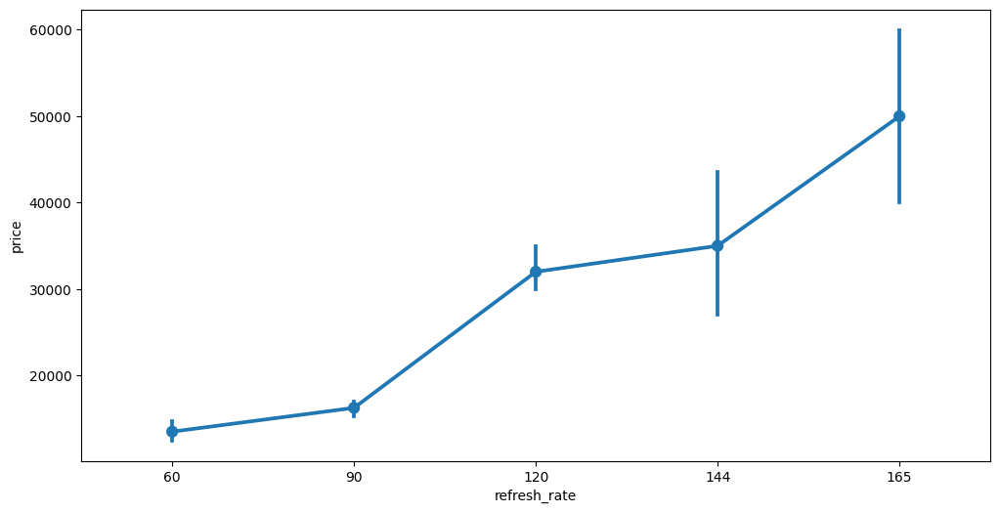

In [475]:
# point plot
plt.figure(figsize = (12,6))
sns.pointplot(data = temp_df,x = 'refresh_rate', y = 'price',estimator = np.median);

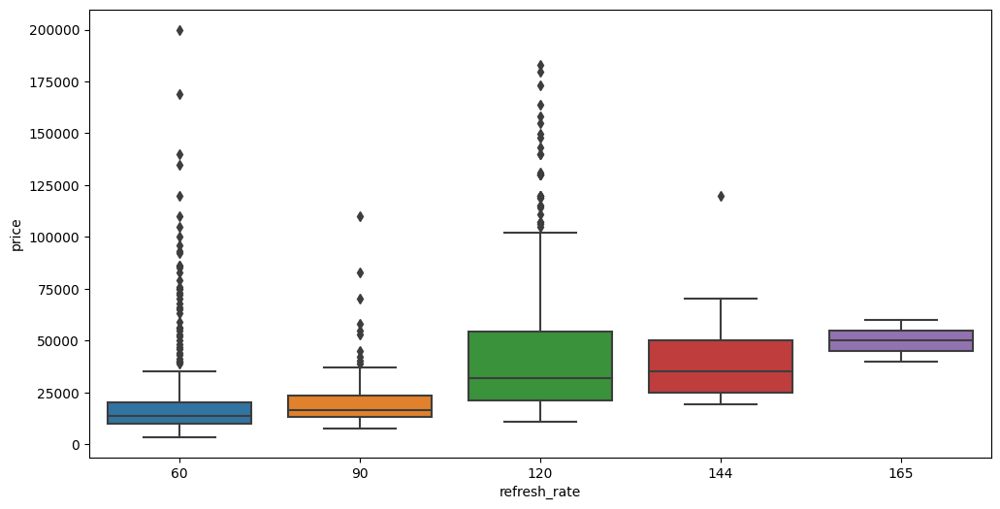

In [476]:
# box plot
plt.figure(figsize = (12,6))
sns.boxplot(data = df, x = 'refresh_rate', y = 'price');

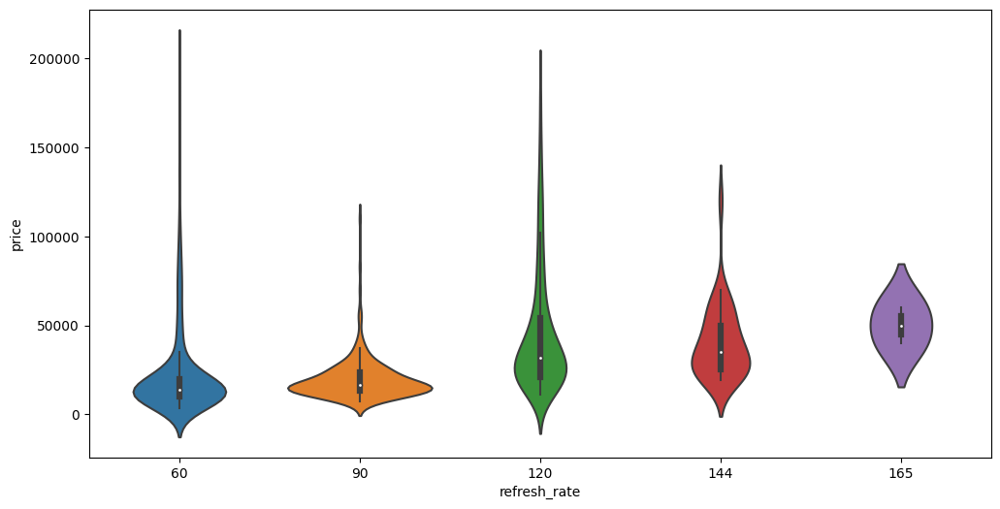

In [477]:
# violin plot
plt.figure(figsize = (12,6))
sns.violinplot(data = df, x = 'refresh_rate', y = 'price');

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


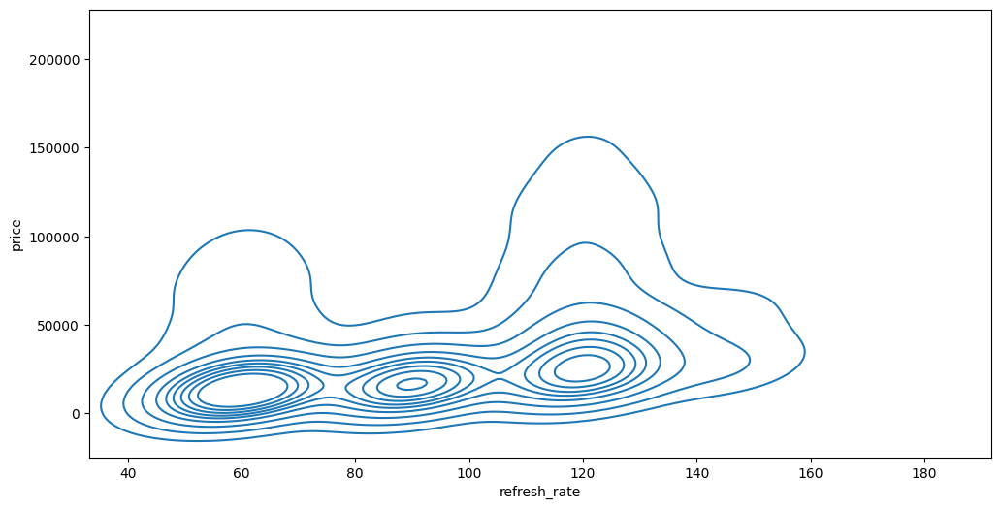

In [478]:
# 2D kde plot
plt.figure(figsize = (12,6))
sns.kdeplot(data = df, x = 'refresh_rate', y = 'price');
# The highest density is around 60, 90 and 120

skew of 120 MP:  1.7872817073036635
skew of 60 MP:  3.3560912047142235
skew of 90 MP:  3.6594484602423485
skew of 144 MP:  1.9624522707642307
skew of 165 MP:  nan


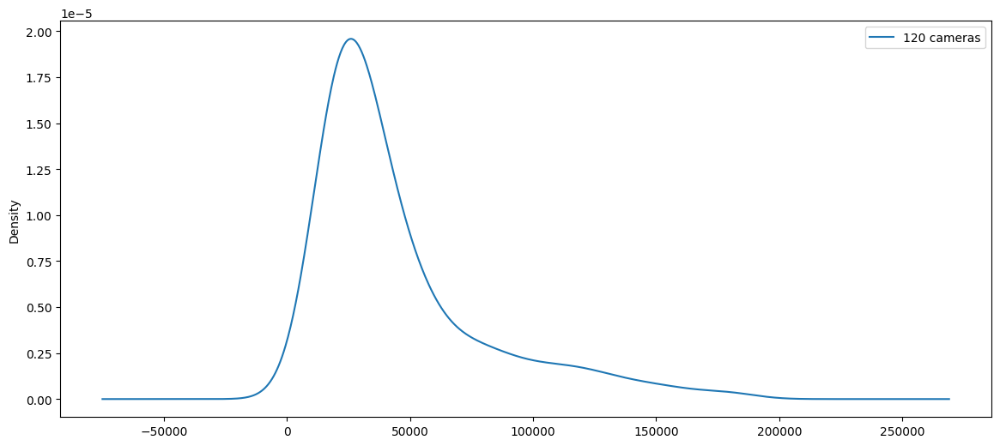

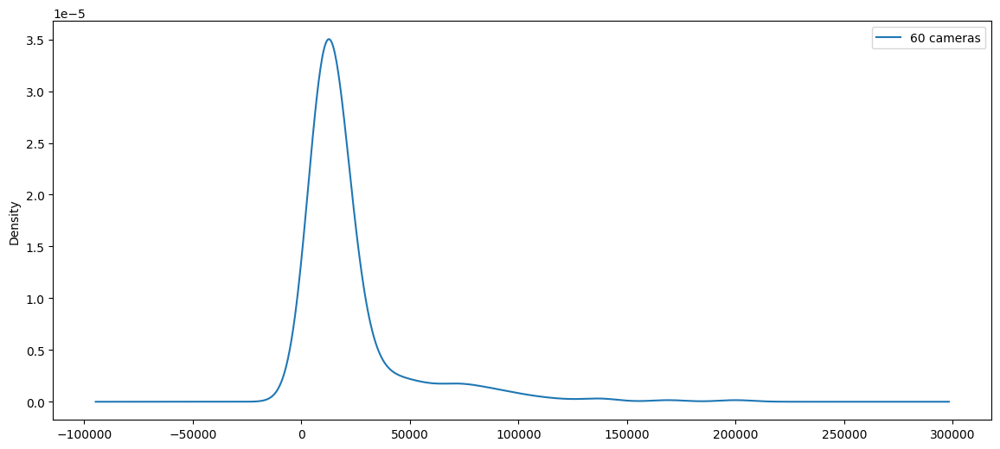

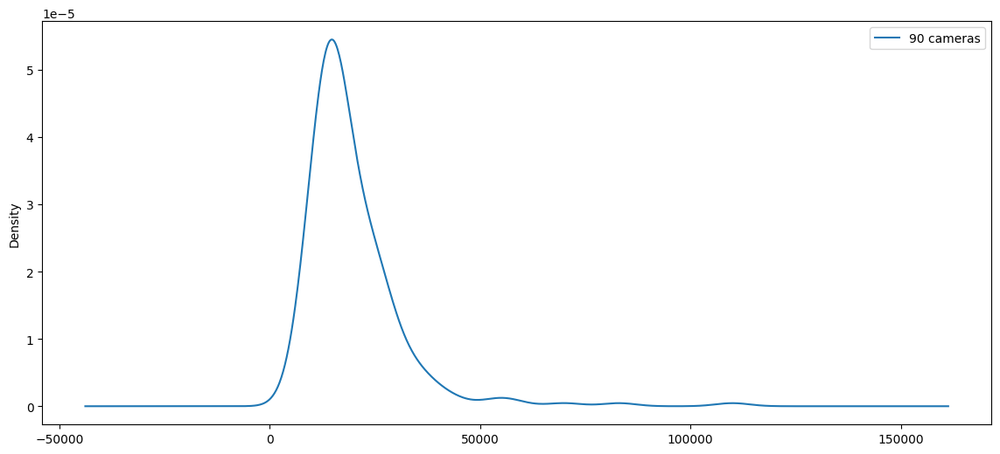

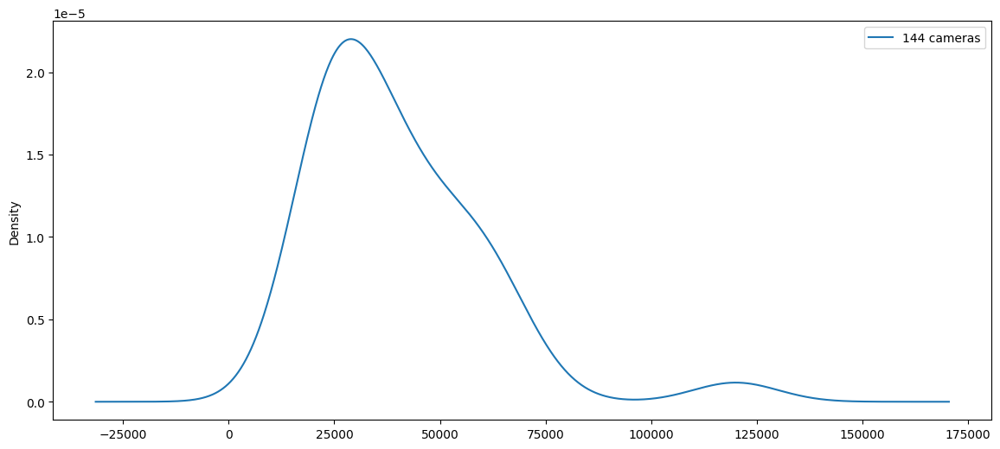

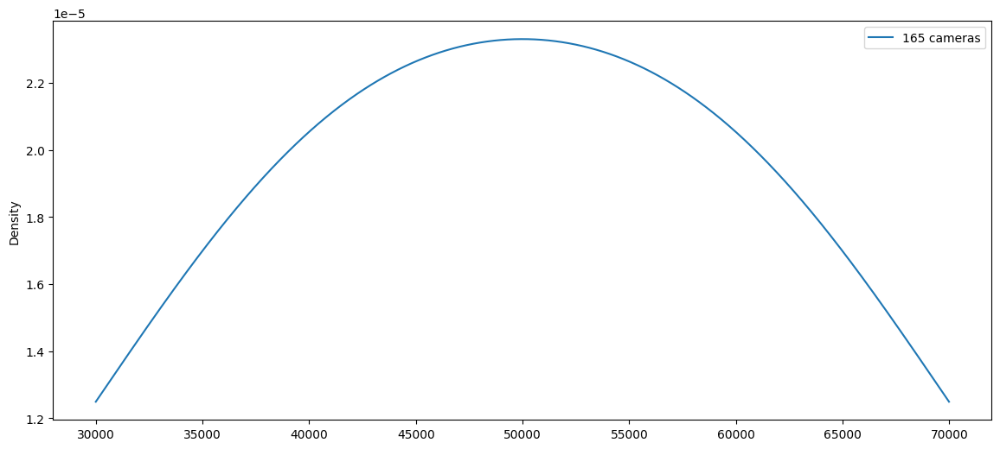

In [479]:
# 1D kde plot

# ... your existing code to create the DataFrame (df) ...
MP = df['refresh_rate'].value_counts().index.tolist()

for i in MP:
    subset = df[df['refresh_rate'] == i]['price']
    
    # Check if subset has more than one element before plotting
    if not subset.empty and len(subset) > 1:
        plt.figure(figsize=(14, 6))
        subset.plot(kind='kde', label=f'{i} cameras')

        # Print skewness only if the subset has more than one element
        print(f'skew of {i} MP: ', subset.skew())
        plt.legend()

# Add legend and display the plot after the loop (assuming all plots fit)
# if len(MP) > 1:  # Check if there's more than one camera count
#     plt.legend()

plt.show()

In [480]:
filtered_df = df.dropna(subset = ['refresh_rate','price'])

statistic, p_value = stats.kruskal(filtered_df['refresh_rate'], filtered_df['price'])

print("Kruskl-Wallis statistic: ", statistic)
print("p-value: ", p_value)

# -  Kruskal-Wallis statistic of approximately 1352.34 and a p-value of approximately 4.77×10−2964.77×10−296.

# Interpretation:

#     The Kruskal-Wallis statistic is a measure of the strength of association between the variables.
#     The p-value is the probability of observing the data if the null hypothesis (no association between the variables) is true.
#     In this case, the extremely low p-value suggests strong evidence against the null hypothesis, indicating that there is a significant relationship between refresh_rate and price.
    
# - The Kruskal-Wallis statistic of approximately 1352.34 is high. This indicates a substantial difference among the groups being compared.

Kruskl-Wallis statistic:  1352.343343528455
p-value:  4.7692507918948036e-296


In [481]:
# 15 x 0 
# refresh_rate x brand_name

# contingency table
pd.crosstab(df['refresh_rate'],df['brand_name'])

brand_name,apple,google,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
refresh_rate,,,,,,,,,,,,,,,,
60,29,5,4,4,15,0,9,5,4,36,8,33,56,10,58,41
90,0,4,2,5,7,3,15,4,10,26,12,33,28,14,22,29
120,17,5,7,5,7,25,13,2,27,26,18,28,47,9,30,57
144,0,0,0,0,0,4,13,2,1,0,3,3,1,0,1,6
165,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0


In [482]:
statistic,p_value = stats.kruskal(*[group["refresh_rate"] for name, group in df.groupby("brand_name")])

print("Kruskal-Wallis statistic: ", statistic)
print("p-value: ", p_value)

# - The Kruskal-Wallis statistic is a measure of the strength of the relationship between the variable "refresh_rate" and the categorical variable "brand_name." In this case, the calculated Kruskal-Wallis statistic is 98.79.

# - The p-value associated with the Kruskal-Wallis statistic is extremely small, approximately 2.22e-14 (or 0.00000000000002215). This p-value indicates the probability of observing such an extreme or more extreme result if the null hypothesis were true.

# - With such a small p-value, much smaller than a typical significance level of 0.05, we reject the null hypothesis. Therefore, we can conclude that there is a significant relationship between the refresh rate and the brand name.

# - In simpler terms, the Kruskal-Wallis test suggests that there are significant differences in the refresh rates among the different brands.

Kruskal-Wallis statistic:  98.78568653716903
p-value:  2.2154772219923576e-14


In [483]:
for name, group in df.groupby("brand_name"):
    print(group["refresh_rate"])

6       60
15      60
27     120
33      60
56      60
76     120
100    120
111     60
136     60
149     60
152    120
161    120
173     60
209    120
246     60
262     60
275     60
280     60
288    120
305     60
321     60
344     60
361     60
398    120
416    120
435     60
444    120
521    120
594     60
595     60
613     60
621     60
638     60
682    120
706     60
737     60
739    120
756    120
788     60
789    120
813     60
824     60
880     60
881     60
892    120
923    120
Name: refresh_rate, dtype: int64
122     60
129     90
215    120
243     90
270    120
324     90
372     60
500     60
509     90
527    120
740    120
838     60
937     60
973    120
Name: refresh_rate, dtype: int64
214    120
317     60
420    120
494    120
502    120
649    120
675     60
736    120
747     90
902     60
930    120
960     90
976     60
Name: refresh_rate, dtype: int64
485     90
535     90
631     90
702    120
704    120
712    120
714    120
775     90
832     60

In [484]:
# 15 x 24
# refresh_rate x os

# contingency table
pd.crosstab(df['refresh_rate'],df['os'])

os,Android,Other,iOS
refresh_rate,,,
60,286,1,29
90,212,2,0
120,296,4,17
144,33,1,0
165,2,0,0


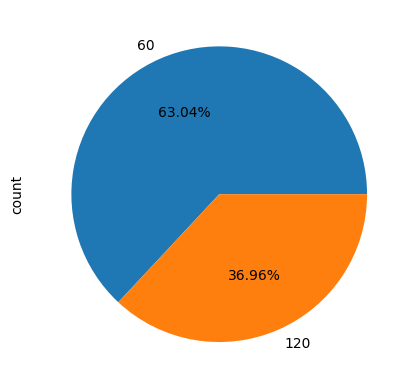

In [485]:
df[df['os'] == 'iOS']['refresh_rate'].value_counts().plot(kind = 'pie', autopct = '%.2f%%');
# There are only 2 categories in iOS first highest percentage is for 60Hz refresh rate with 63.04%. Second and the last category
# is 120Hz with 36.96%.

refresh_rate x price
Smartphones with higher refresh rate have high average price.
The highest density is around 60, 90 and 120.
The Kruskal-Wallis: statistic is a measure of the strength of association between the variables.
    The p-value is the probability of observing the data if the null hypothesis (no association between the variables) is true.
    In this case, the extremely low p-value suggests strong evidence against the null hypothesis, indicating that there is a significant relationship between refresh_rate and price.
    
- The Kruskal-Wallis statistic of approximately 1352.34 is high. This indicates a substantial difference among the groups being compared.

refresh_rate x brand_name

- The Kruskal-Wallis statistic is a measure of the strength of the relationship between the variable "refresh_rate" and the categorical variable "brand_name." In this case, the calculated Kruskal-Wallis statistic is 98.79.

- The p-value associated with the Kruskal-Wallis statistic is extremely small, approximately 2.22e-14 (or 0.00000000000002215). This p-value indicates the probability of observing such an extreme or more extreme result if the null hypothesis were true.

- With such a small p-value, much smaller than a typical significance level of 0.05, we reject the null hypothesis. Therefore, we can conclude that there is a significant relationship between the refresh rate and the brand name.

- In simpler terms, the Kruskal-Wallis test suggests that there are significant differences in the refresh rates among the different brands.

refresh_rate x os
There are only 2 categories in iOS first highest percentage is for 60Hz refresh rate with 63.04%. Second and the last category
is 120Hz with 36.96%.
There are 4 categories in Android first highest percentage is for 120Hz refresh rate with 35.71%. Second category
is 60Hz with 34.50%. Third category is 90Hz with 25.57%. And the last one is 165Hz with 0.24%.

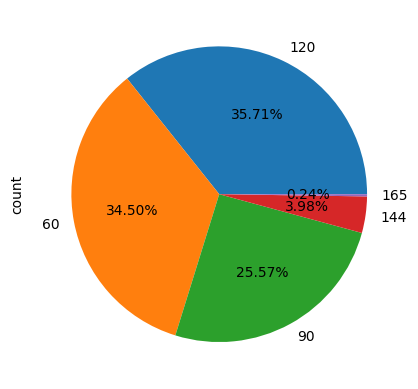

In [486]:
df[df['os'] == 'Android']['refresh_rate'].value_counts().plot(kind = 'pie', autopct = '%.2f%%');
# There are 4 categories in Android first highest percentage is for 120Hz refresh rate with 35.71%. Second category
# is 60Hz with 34.50%. Third category is 90Hz with 25.57%. And the last one is 165Hz with 0.24%.

<AxesSubplot: ylabel='count'>

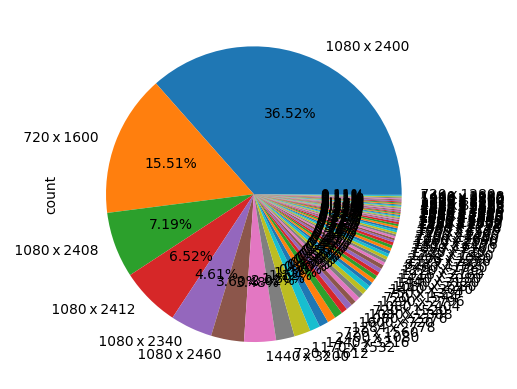

In [487]:
df['resolution'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


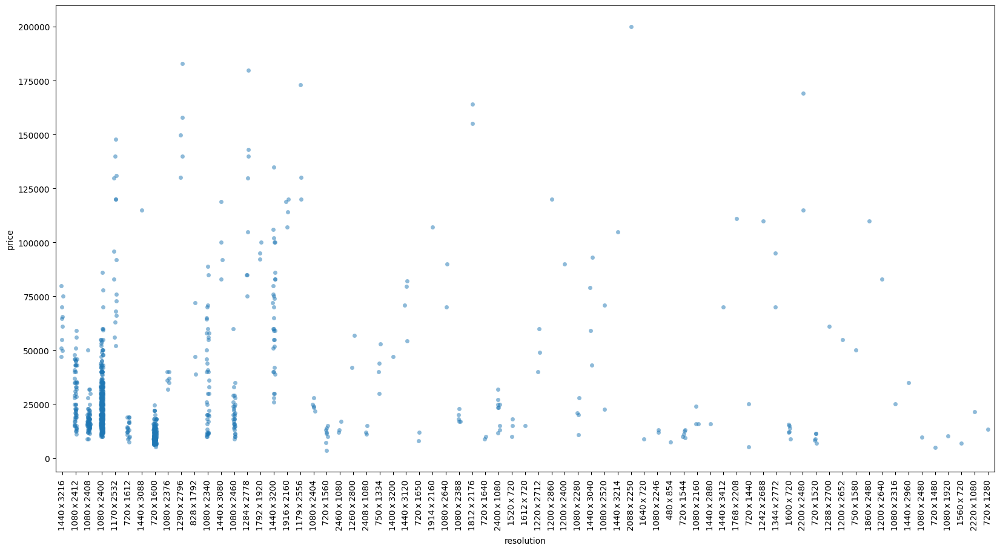

In [488]:
# 17 x 2
# resolution x price
plt.figure(figsize = (20,10))
sns.stripplot(data = temp_df,x = 'resolution',y = 'price',alpha = 0.5)
plt.xticks(rotation = 'vertical');
# there is no relation between resolution and price of the smartphones 
# a huge cluster is seen at 1080 x 2400 and another next alittle lesser densed onee at 1080 x 2412 followed by 720 x 1600,
# 1080 x 2408,1080 x 2460,720 x 1612 oout of 5 3 cluster are of 1080 width.

# The analysis suggests that the relationship between smartphone resolution and price may not be significant. It identifies 
# distinct clusters of data points, particularly prominent at resolutions like 1080 x 2400 and 1080 x 2412. Notably, three out 
# of five clusters have a width of 1080 pixels. While no direct correlation between resolution and price is evident, certain 
# resolution values seem prevalent among smartphones in the dataset.

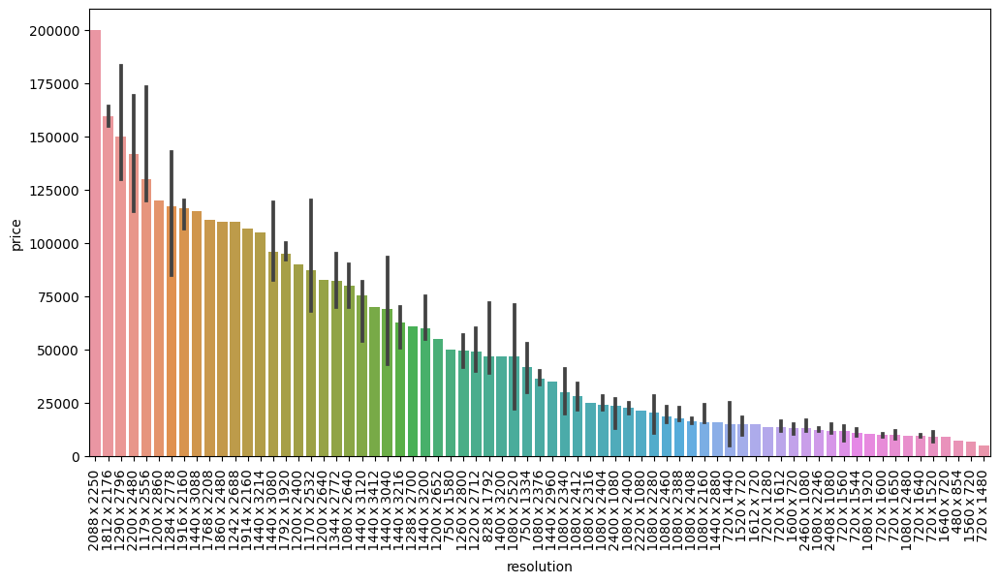

In [489]:
#barplot
resolution_order = df.groupby('resolution')['price'].median().sort_values(ascending = False).index.tolist()

plt.figure(figsize = (12,6))
sns.barplot(data = df, x = 'resolution', y = 'price',estimator = np.median,order = resolution_order)
plt.xticks(rotation = 'vertical')
plt.show()
# the median price of 2088 x 2250 is highest. Followed by 1812 x 2176 and so on.

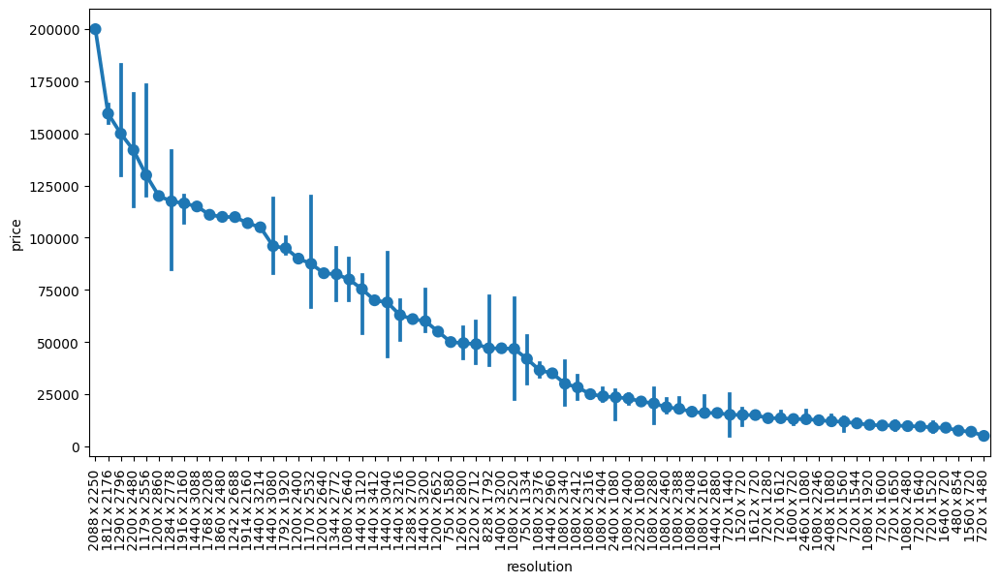

In [490]:
# point plot
plt.figure(figsize = (12,6))
sns.pointplot(data = df, x = 'resolution', y = 'price',estimator = np.median, order = resolution_order)
plt.xticks(rotation = 'vertical')
plt.show()

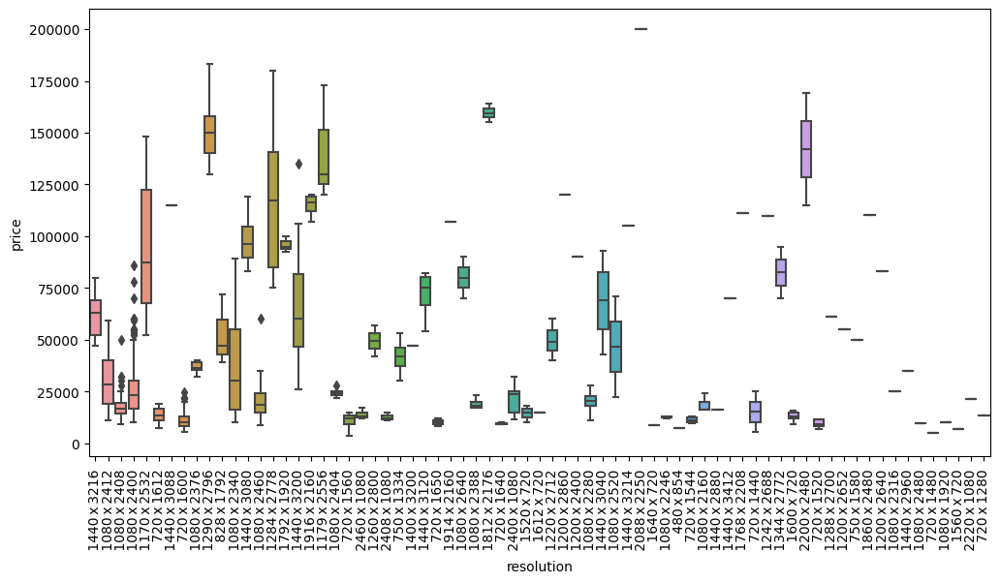

In [491]:
# box plot
plt.figure(figsize = (12,6))
sns.boxplot(data = df, x = 'resolution', y = 'price')
plt.xticks(rotation = 'vertical')
plt.show()

In [492]:

# Perform Kruskal-Wallis test
statistic, p_value = stats.kruskal(*[group["price"] for name, group in df.groupby("resolution")])

# Output the results
print("Kruskal-Wallis statistic:", statistic)
print("p-value:", p_value)

# The Kruskal-Wallis statistic is a measure of the variance between groups. In this case, the calculated statistic value is 570.9178. The p-value associated with this statistic is approximately 1.26×10−791.26×10−79, which is extremely small.

# Interpreting the results:

#     Since the p-value is significantly smaller than the chosen significance level (e.g., 0.05), we reject the null hypothesis.
#     This indicates that there are significant differences in prices across different resolution categories.

# In summary, based on the Kruskal-Wallis test, we have evidence to suggest that there are significant differences in prices between at least two resolution categories.

# is this value high or low
# Kruskal-Wallis statistic: 570.9178336617157

# The Kruskal-Wallis statistic represents the measure of variance between groups. Its value is high when there are considerable differences between groups in terms of the variable being analyzed. In this case, a Kruskal-Wallis statistic value of 570.9178 indicates substantial variance among the groups.

# Therefore, we consider this value to be relatively high, suggesting notable differences between groups in terms of their respective resolutions and their associated prices.

Kruskal-Wallis statistic: 570.9178336617157
p-value: 1.2587255761576888e-79


In [493]:
# 17 x 0
# resolution x brand_name
pd.crosstab(df['resolution'],df['brand_name'])

brand_name,apple,google,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
resolution,,,,,,,,,,,,,,,,
1080 x 1920,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1080 x 2160,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0
1080 x 2246,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
1080 x 2280,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0
1080 x 2316,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
720 x 1640,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0
720 x 1650,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1
750 x 1334,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [494]:
# Create a contingency table between resolution and brand_name
contingency_table = pd.crosstab(df['resolution'], df['brand_name'])

# Perform the chi-square test
chi2, p_value, _, _ = stats.chi2_contingency(contingency_table)

# Output the results
print("Chi-square statistic:", chi2)
print("p-value:", p_value)

# The output of the Chi-square test indicates a strong association between resolution and brand_name.

#     The Chi-square statistic is 3111.52, suggesting a substantial departure from the expected frequencies under the null hypothesis of independence.
#     The p-value is approximately 9.53e-203, which is significantly smaller than the typical significance level of 0.05. This indicates strong evidence against the null hypothesis, supporting the presence of a significant association between resolution and brand_name.
    
    

Chi-square statistic: 3111.5248955355282
p-value: 9.53399270813973e-203


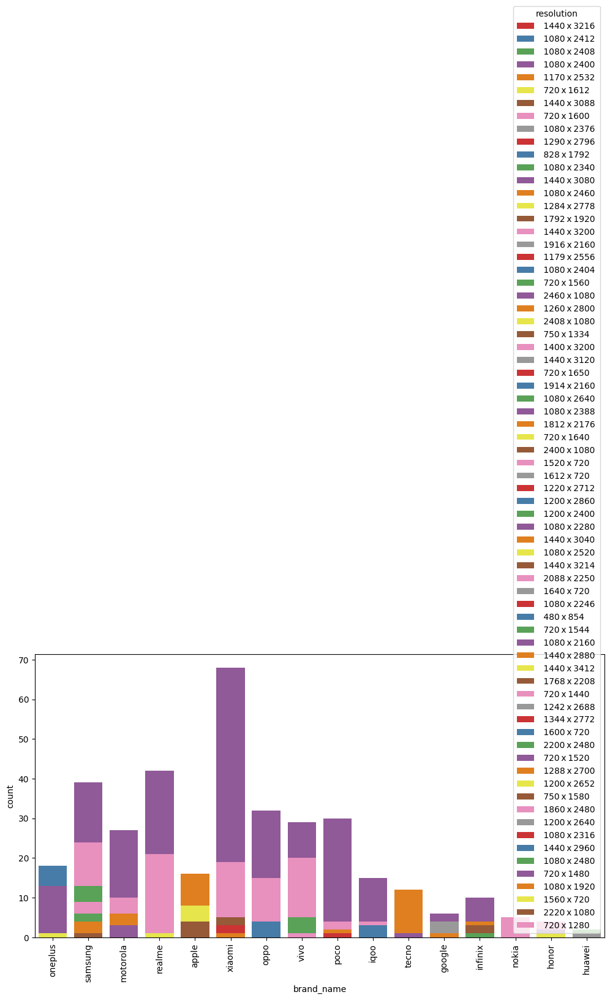

In [495]:
#stacked version1
plt.figure(figsize = (12,6))
sns.countplot(data = df,x = 'brand_name',hue = 'resolution',dodge = False, palette = 'Set1')
plt.xticks(rotation = 'vertical')
plt.show()

In [496]:
contingency_table = pd.crosstab(df['resolution'],df['brand_name'])

chi2, p_value, dof, _ = stats.chi2_contingency(contingency_table)

print("Chi-square statistic: ", chi2)
print("p-value: ", p_value)
print("Degrees Of Freedom: ",dof)

# The output indicates the results of the chi-square test:

#     Chi-square statistic: 3111.52
#     p-value: 9.53e-203 (very close to zero)
#     Degrees of Freedom: 1050

# This suggests a significant association between the variables resolution and brand_name, as the p-value is extremely small, indicating strong evidence against the null hypothesis of independence.

# The interpretation of whether the chi-square statistic and degrees of freedom values are high or low depends on the context and the specific analysis being conducted.

#     Chi-square Statistic (3111.52): This value represents the magnitude of the association between the variables. Higher values indicate a stronger association. In this case, 3111.52 is a relatively large value, suggesting a significant association between the variables.

#     Degrees of Freedom (1050): The degrees of freedom represent the number of independent pieces of information available to estimate a statistic. In the chi-square test, it's calculated as the product of the number of categories minus 1 for each variable. In this case, 1050 degrees of freedom indicate a large number of categories or levels within the variables.

# Therefore, while these values are high in absolute terms, they are appropriate given the large number of categories and the significant association between the variables.

Chi-square statistic:  3111.5248955355282
p-value:  9.53399270813973e-203
Degrees Of Freedom:  1050


In [497]:
# Create the contingency table
contingency_table = pd.crosstab(df['resolution'], df['brand_name'])

# Calculate the chi-square statistic and p-value
chi2, _, _, _ = stats.chi2_contingency(contingency_table)

# Calculate Cramer's V
n = contingency_table.sum().sum()
min_dim = min(contingency_table.shape)
cramers_v = np.sqrt(chi2 / (n * (min_dim - 1)))

print("Cramer's V:", cramers_v)

# The calculated Cramer's V value of approximately 0.483 suggests a moderate to strong association between the variables "resolution" and "brand_name". This indicates that there is a non-negligible relationship between the two variables, implying that they are not independent of each other.

Cramer's V: 0.4827763725399277


In [498]:
# 17 x 24
# resolution x os
pd.crosstab(df['resolution'], df['os'])

os,Android,Other,iOS
resolution,,,
1080 x 1920,1,0,0
1080 x 2160,3,0,0
1080 x 2246,2,0,0
1080 x 2280,4,0,0
1080 x 2316,1,0,0
...,...,...,...
720 x 1640,2,0,0
720 x 1650,2,0,0
750 x 1334,0,0,4


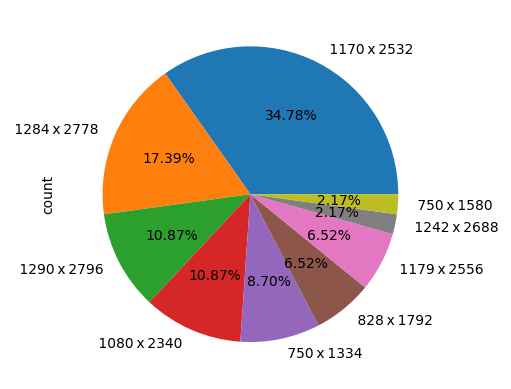

In [499]:
df[df['os'] == 'iOS']['resolution'].value_counts().plot(kind = 'pie', autopct = '%.2f%%');
# 82.61% of iOS models fall in top 5 brands first highest is 1170 x 2532 with 34.78%. Second highest is 1284 x 2778 with 17.39%.
# Third highest is 1290 x 2796 with 10.87%. Fourth highest is 1080 x 2340 with 10.87%. Fifth highest is 750 x 1334 with 8.70%.

resolution x price
a huge cluster is seen at 1080 x 2400 and another next alittle lesser densed onee at 1080 x 2412 followed by 720 x 1600,
1080 x 2408,1080 x 2460,720 x 1612 oout of 5 3 cluster are of 1080 width

The analysis suggests that the relationship between smartphone resolution and price may not be significant. It identifies 
distinct clusters of data points, particularly prominent at resolutions like 1080 x 2400 and 1080 x 2412. Notably, three out 
of five clusters have a width of 1080 pixels. While no direct correlation between resolution and price is evident, certain 
resolution values seem prevalent among smartphones in the dataset.

The Kruskal-Wallis statistic is a measure of the variance between groups. In this case, the calculated statistic value is 570.9178. The p-value associated with this statistic is approximately 1.26×10−791.26×10−79, which is extremely small.

Interpreting the results:

    Since the p-value is significantly smaller than the chosen significance level (e.g., 0.05), we reject the null hypothesis.
    This indicates that there are significant differences in prices across different resolution categories.

In summary, based on the Kruskal-Wallis test, we have evidence to suggest that there are significant differences in prices between at least two resolution categories.
User
is this value high or low
Kruskal-Wallis statistic: 570.9178336617157
ChatGPT

The Kruskal-Wallis statistic represents the measure of variance between groups. Its value is high when there are considerable differences between groups in terms of the variable being analyzed. In this case, a Kruskal-Wallis statistic value of 570.9178 indicates substantial variance among the groups.

Therefore, we consider this value to be relatively high, suggesting notable differences between groups in terms of their respective resolutions and their associated prices.

resolution x brand_name
The output of the Chi-square test indicates a strong association between resolution and brand_name.

    The Chi-square statistic is 3111.52, suggesting a substantial departure from the expected frequencies under the null hypothesis of independence.
    The p-value is approximately 9.53e-203, which is significantly smaller than the typical significance level of 0.05. This indicates strong evidence against the null hypothesis, supporting the presence of a significant association between resolution and brand_name.
    
    The calculated Cramer's V value of approximately 0.483 suggests a moderate to strong association between the variables "resolution" and "brand_name". This indicates that there is a non-negligible relationship between the two variables, implying that they are not independent of each other.
    
resolution x os

- 82.61% of iOS models fall in top 5 brands first highest is 1170 x 2532 with 34.78%. Second highest is 1284 x 2778 with 17.39%.
Third highest is 1290 x 2796 with 10.87%. Fourth highest is 1080 x 2340 with 10.87%. Fifth highest is 750 x 1334 with 8.70%

- 70.21% of models fall in top 4 categories first highest is 1080 x 2400 with 38.96%. Second highest is 720 x 1600 with 16.53%.
Third highest is 1080 x 2408 with 7.72%. Fourth highest is 1080 x 2412 with 7.00%.

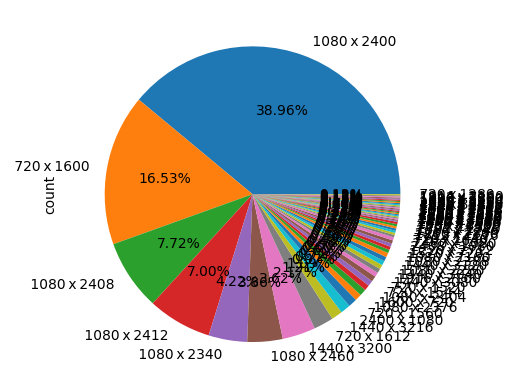

In [500]:
df[df['os'] == 'Android']['resolution'].value_counts().plot(kind = 'pie', autopct = '%.2f%%');
# 70.21% of models fall in top 4 categories first highest is 1080 x 2400 with 38.96%. Second highest is 720 x 1600 with 16.53%.
# Third highest is 1080 x 2408 with 7.72%. Fourth highest is 1080 x 2412 with 7.00%.

In [501]:
df['resolution'].nunique()

71

In [502]:
df[df['os'] == 'Android']['resolution'].nunique()

59

In [503]:
df[df['os'] == 'iOS']['resolution'].nunique()

9

In [504]:
df[df['os'] == 'Other']['resolution'].nunique()

7

<AxesSubplot: xlabel='num_rear_cameras', ylabel='price'>

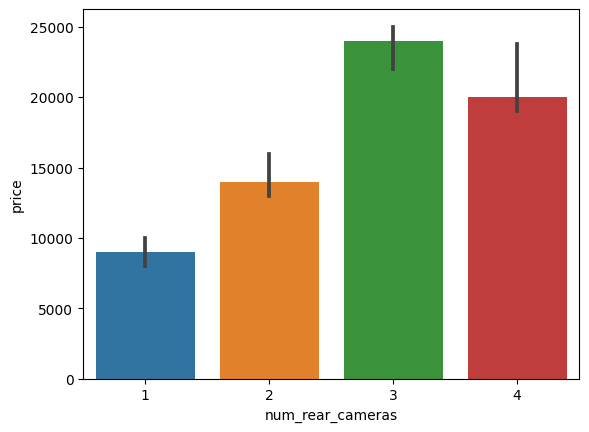

In [505]:
# 18 x 2
# num_rear_cameras x price
sns.barplot(data = df, x = 'num_rear_cameras', y = 'price',estimator = np.median)
# The analysis reveals a consistent increase in the average price of smartphones as the number of rear cameras increases up to 
# three. However, a notable deviation occurs at four rear cameras, where the average price experiences a decline yet noticablely
# higher than 2 cameras.

Price Analysis:

    - The average price of smartphones demonstrates a consistent increase with the number of rear cameras up to three. 
      However, there is a notable deviation at four rear cameras, where the average price experiences a decline, yet remains
      noticeably higher than that of smartphones with two cameras.
    - Median prices follow a similar pattern, with the highest median price observed for smartphone models with three rear 
      cameras, followed by those with four, two, and one rear camera(s), respectively.
    - All categories exhibit left-skewed distributions with numerous outliers, indicating variations in pricing across 
      different smartphone models.
    - The density of smartphone models is highest for those with three rear cameras, followed by models with two and four 
      rear cameras, while the least density is observed for models with one rear camera.
    - Dunn's test results confirm the overall difference in price distribution suggested by the Kruskal-Wallis test and 
      pinpoint that the difference is statistically significant among different categories.

Brand Name Analysis:
    Category: 4 Rear Cameras
        Two brands capture 59.73% of the market share in this category.
            'Samsung' secures the first position with 36.91%.
            'Xiaomi' follows closely with 22.82%.

    Category: 3 Rear Cameras
        Four brands collectively hold 49.9% of the market share.
            'Realme' leads with 13.31%.
            'Xiaomi' secures the second position with 12.72%.
            'Vivo' holds the third position with 12.52%.
            'Samsung' captures 11.35% of the market share.

    Category: 2 Rear Cameras
        Six brands dominate with a combined market share of 72.13%.
            'Vivo' holds the highest share with 15.30%.
            'Oppo' secures the second position with 14.21%.
            'Xiaomi' captures the third position with 13.11%.
            'Apple' follows closely with 12.02%.
            'Samsung' captures 9.29% of the market share.
            'Tecno' secures the sixth position with 8.20%.

    Category: 1 Rear Camera
        'Xiaomi' and 'Realme' dominate with 21.28% market share each.
        'Vivo' secures the third position with 19.15%.
        'Oppo' follows closely with 10.64%.
        'Apple' captures 10.64% of the market share.
        These top five brands collectively capture 82.99% of the market share in this category.

Operating System (OS) Analysis:

    - There is a moderate association between the number of rear cameras and the brand name of smartphones, which is 
      statistically significant.
    - iOS-based smartphones do not have models with four rear cameras.
    - In the Android OS, the majority of smartphone models feature three rear cameras (58.62%), followed by models with two 
      (18.94%) and four (17.37%) rear cameras.

<AxesSubplot: xlabel='num_rear_cameras', ylabel='price'>

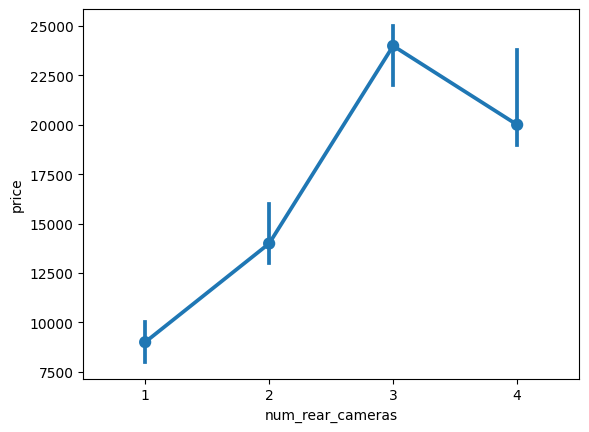

In [506]:
# point plot
sns.pointplot(data = temp_df, x = 'num_rear_cameras', y = 'price',estimator = np.median)
# The highest median price is for smartphone models with 3 rear cameras.
# The second highest median price is for smartphone models with 4 rear cameras.
# The third highest median price is for smartphone models with 2 rear cameras.
# The forth place median price is for smartphone models with 1 rear camera.

<AxesSubplot: xlabel='num_rear_cameras', ylabel='price'>

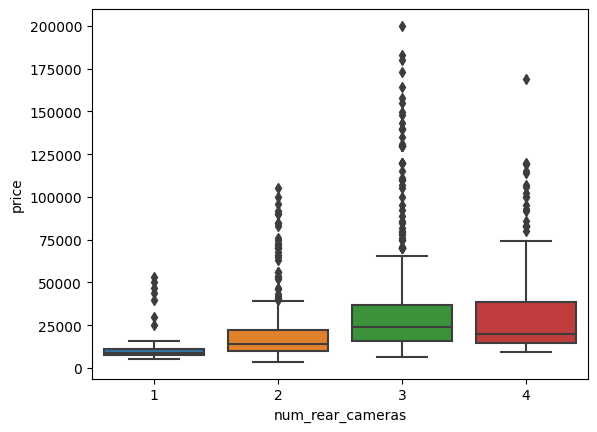

In [507]:
# box plot
sns.boxplot(data = df, x = 'num_rear_cameras', y = 'price')
# all the categories are right skewed with numerous ouliers

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<AxesSubplot: xlabel='num_rear_cameras', ylabel='price'>

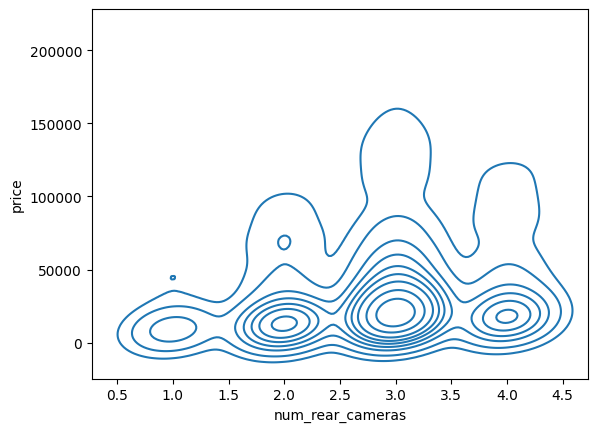

In [508]:
# 2D kde plot
sns.kdeplot(data = df, x = 'num_rear_cameras', y = 'price')
# More density in the category with 3 rear cameras.
# The next highest density is at the category of 2 rear cameras.
# the later highest density is at the category of 3 rear cameras.
# and least density is at the category of 1 rear camera.

skew of 4 num_rear_cameras:  1.8705245172891898
skew of 3 num_rear_cameras:  2.620678214117017
skew of 2 num_rear_cameras:  1.9295322432727087
skew of 1 num_rear_cameras:  2.2045506641897106


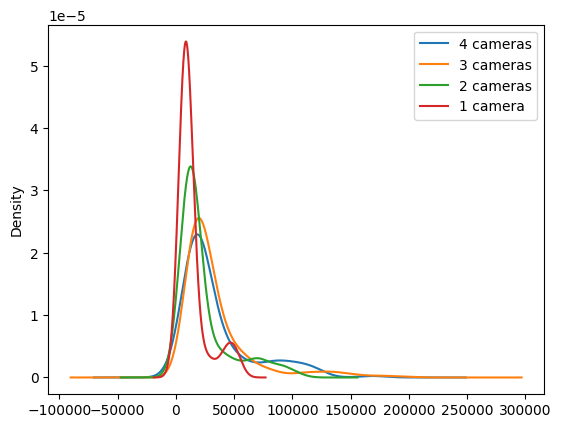

In [509]:
# 1D kde plot
df[df['num_rear_cameras'] == 4]['price'].plot(kind = 'kde', label = '4 cameras')
print('skew of 4 num_rear_cameras: ',df[df['num_rear_cameras'] == 4]['price'].skew())

df[df['num_rear_cameras'] == 3]['price'].plot(kind = 'kde', label = '3 cameras')
print('skew of 3 num_rear_cameras: ',df[df['num_rear_cameras'] == 3]['price'].skew())

df[df['num_rear_cameras'] == 2]['price'].plot(kind = 'kde', label = '2 cameras')
print('skew of 2 num_rear_cameras: ',df[df['num_rear_cameras'] == 2]['price'].skew())

df[df['num_rear_cameras'] == 1]['price'].plot(kind = 'kde', label = '1 camera')
print('skew of 1 num_rear_cameras: ',df[df['num_rear_cameras'] == 1]['price'].skew())

plt.legend()
plt.show()

# distribution of every category is skewed.

In [510]:
# statistical summary:
df.groupby('num_rear_cameras')['price'].describe()

# - the median price 23990.0 of smartphone models with 3 rear cameras is highest. follwed by second highest median price 
#   14490.0 for models with 4 cameras. the third highest median price is 12990.0 for models with 2 rear camers. fourth and the
#   last least median price 8999.0 is for models with 1 rear camera. std, Q1 and max also follow same price order
# - In min Q1, mean and Q3 the highest price is for models with 4 rear cameras, followed by models with 3 rear cameras, next 
#   follows models with 2 rear cameras and the least price model is 1 rear camera


,count,mean,std,min,25%,50%,75%,max
num_rear_cameras,,,,,,,,
1,47.0,13743.936170,12469.858153,4999.0,7499.0,8999.0,10994.5,52990.0
2,183.0,23532.704918,22634.390475,3499.0,9999.0,13990.0,21994.5,104999.0
3,511.0,33793.561644,30898.031110,6499.0,15990.0,23990.0,36496.5,199990.0
4,149.0,34187.583893,30743.149209,9499.0,14490.0,19999.0,38700.0,169000.0


In [511]:
groups = {}

for i in range(1, 5):
    group_name = f"group{i}"
    group_data = df[df['num_rear_cameras'] == i]['price']
    groups[group_name] = group_data

# Now 'groups' contains price data for each category of 'num_rear_cameras'

# Create variables for each group using a loop
for group_name, group_data in groups.items():
    globals()[group_name] = group_data

# Now you have variables group1, group2, group3, and group4 containing the price data

# Perform Kruskal-Wallis H-test
h_statistic, p_value = stats.kruskal(group1, group2, group3, group4)

print("Kruskal-Wallis H-statistic:", h_statistic)
print("P-value:", p_value)

# The Kruskal-Wallis H-test results indicate that there are statistically significant differences in medians of prices among 
# the categories of 'num_rear_cameras'.

#     - The Kruskal-Wallis H-statistic is approximately 118.52.
#     - The associated p-value is approximately 1.61e-25, which is much smaller than the typical significance level of 0.05.

# Therefore, you can conclude that there are significant differences in median prices across the different categories of 
# 'num_rear_cameras'.

Kruskal-Wallis H-statistic: 118.5206626946938
P-value: 1.6070197133350227e-25


In [512]:
from scikit_posthocs import posthoc_dunn

# Combine the groups into a list
all_groups = [group1, group2, group3, group4]

# Perform Dunn's test
dunn_results = posthoc_dunn(all_groups, p_adjust='holm')

print('Dunn test results:\n', dunn_results)

# The Dunn test results provide pairwise comparisons between the groups to identify significant differences. In this case, the groups are likely the number of rear cameras (1, 2, 3, 4). The p-values indicate whether the differences between the groups are statistically significant. Here's the interpretation of the results:

#     Group 1 vs Group 2: p-value = 2.445400e-04
#         The difference between 1 rear camera and 2 rear cameras is statistically significant.

#     Group 1 vs Group 3: p-value = 1.269978e-16
#         The difference between 1 rear camera and 3 rear cameras is statistically significant.

#     Group 1 vs Group 4: p-value = 1.089507e-12
#         The difference between 1 rear camera and 4 rear cameras is statistically significant.

#     Group 2 vs Group 3: p-value = 5.601764e-14
#         The difference between 2 rear cameras and 3 rear cameras is statistically significant.

#     Group 2 vs Group 4: p-value = 2.162394e-07
#         The difference between 2 rear cameras and 4 rear cameras is statistically significant.

#     Group 3 vs Group 4: p-value = 4.446312e-01
#         The difference between 3 rear cameras and 4 rear cameras is not statistically significant.

# From these results, we can conclude:

#     There are significant differences in prices between models with 1 rear camera and those with 2, 3, and 4 rear cameras.
#     There are significant differences in prices between models with 2 rear cameras and those with 3 and 4 rear cameras.
#     There is no significant difference in prices between models with 3 rear cameras and those with 4 rear cameras.

Dunn test results:
               1             2             3             4
1  1.000000e+00  2.445400e-04  1.269978e-16  1.089507e-12
2  2.445400e-04  1.000000e+00  5.601764e-14  2.162394e-07
3  1.269978e-16  5.601764e-14  1.000000e+00  4.446312e-01
4  1.089507e-12  2.162394e-07  4.446312e-01  1.000000e+00


In [513]:
df.groupby('num_rear_cameras')['price'].median()

num_rear_cameras
1     8999.0
2    13990.0
3    23990.0
4    19999.0
Name: price, dtype: float64

<AxesSubplot: ylabel='count'>

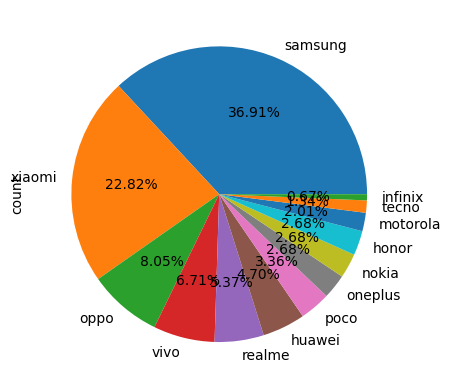

In [514]:
# 18 x 0
# num_rear_cameras x brand_name

# percentages of smartphones with 4 num_rear_cameras
df[df['num_rear_cameras'] == 4]['brand_name'].value_counts().plot(kind = 'pie',autopct = '%.2f%%')
# how much percentage does each category hold internally
# 59.73% of market is captured by two brands in the category of 4 rear cameras. First place is for 'samsung' with 36.91% and 
# Secondone is for 'xiaomi' with 22.82%

<AxesSubplot: ylabel='count'>

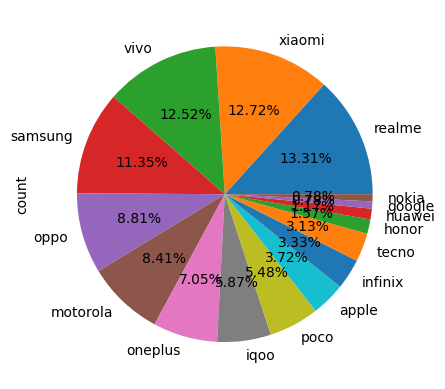

In [515]:
# percentages of smartphones with 3 num_rear_cameras
df[df['num_rear_cameras'] == 3]['brand_name'].value_counts().plot(kind = 'pie',autopct = '%.2f%%')
# 49.9% in the category with 3 rear cameras is captured by 4 brands first place is for 'realme' with 13.31%. Second place is 
# for 'xiaomi' with 12.72%. Third place is for 'vivo' with 12.52%. Fourth place is for 'samsung' with 11.35%.

<AxesSubplot: ylabel='count'>

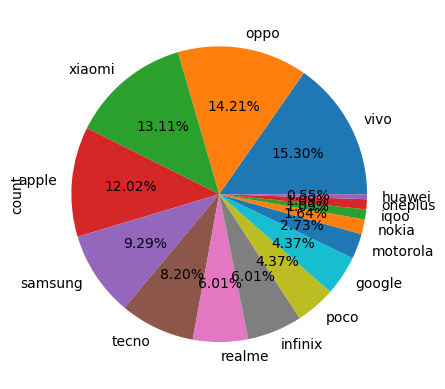

In [516]:
# percentages of smartphones with 2 num_rear_cameras
df[df['num_rear_cameras'] == 2]['brand_name'].value_counts().plot(kind = 'pie',autopct = '%.2f%%')
# 72.13% in category with 2 rear cameras is captured by 6 brands. first highest share is for 'vivo' with 15.30%. Second highest 
# place is for 'oppo' with 14.21%. The third place is for 'xiaomi' 13.11%. Fourth place is for 'apple' with 12.02%. fifth place
# is for 'samsung' with 9.29%. Sixth place is for 'tecno' with 8.20%.

<AxesSubplot: ylabel='count'>

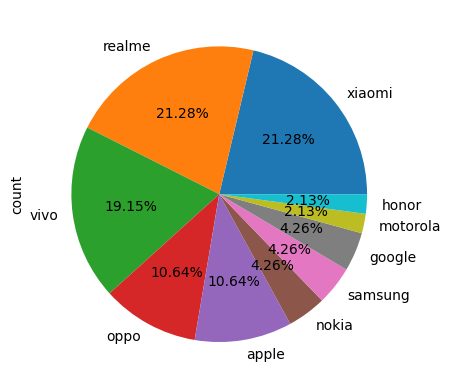

In [517]:
# percentages of smartphones with 1 num_rear_cameras
df[df['num_rear_cameras'] == 1]['brand_name'].value_counts().plot(kind = 'pie',autopct = '%.2f%%')
# in smartphone models with 1 rear camera 'xiaomi' have highest share with 21.28%. followed by 'realme' with 21.28%. the third 
# place is for 'vivo' with 19.15%. And the fourth place is for 'oppo' with 10.64%. in the fifth place it is 'apple' with 10.64% 
# all these 5 brands add upto 82.99% in category of 1 rear camera.

In [518]:
df['num_rear_cameras'].value_counts()

num_rear_cameras
3    511
2    183
4    149
1     47
Name: count, dtype: int64

In [519]:
# 18 x 0
# num_rear_cameras x brand_name
# contingency table
pd.crosstab(df['num_rear_cameras'],df['brand_name'])
# Except for Apple and Google, all brands have the highest number of models with 3 rear cameras. Apple and Google have their 
# highest number of models in the 2 rear cameras category.
#     Brands with models having 2 cameras in the first place, and 3 cameras in the second place: Apple and Google.

#     Brands with models having 3 cameras in the first place, and 2 cameras in the second place: Infinix, iQOO, Motorola, Oppo, 
# Poco, Realme, Tecno, Vivo.

#     Brands with models having 3 cameras in the first place, and 4 cameras in the second place: Honor, Nokia, OnePlus, Samsung,
# Xiaomi.

brand_name,apple,google,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
num_rear_cameras,,,,,,,,,,,,,,,,
1,5,2,1,0,0,0,1,2,0,5,0,10,2,0,9,10
2,22,8,0,1,11,2,5,3,2,26,8,11,17,15,28,24
3,19,4,8,6,17,30,43,4,36,45,28,68,58,16,64,65
4,0,0,4,7,1,0,3,4,4,12,5,8,55,2,10,34


In [521]:
df.loc[(df['brand_name'] == 'apple')&(df['num_rear_cameras'] == 4)] ['num_rear_cameras'].count()

0

In [522]:
for brand in df['brand_name'].unique():
    count = 0
    for camera, m_count in df[df['brand_name'] == brand]['num_rear_cameras'].value_counts().items():
        if count < 1:
            for cam in df['num_rear_cameras'].unique():
                if camera > cam:
                    print(brand, f"{camera}: {m_count}")                          
            count += 1
        

oneplus 3: 36
oneplus 3: 36
samsung 3: 58
samsung 3: 58
motorola 3: 43
motorola 3: 43
realme 3: 68
realme 3: 68
apple 2: 22
xiaomi 3: 65
xiaomi 3: 65
oppo 3: 45
oppo 3: 45
vivo 3: 64
vivo 3: 64
poco 3: 28
poco 3: 28
iqoo 3: 30
iqoo 3: 30
tecno 3: 16
tecno 3: 16
google 2: 8
infinix 3: 17
infinix 3: 17
nokia 4: 4
nokia 4: 4
nokia 4: 4
honor 3: 8
honor 3: 8
huawei 4: 7
huawei 4: 7
huawei 4: 7


<AxesSubplot: xlabel='num_rear_cameras'>

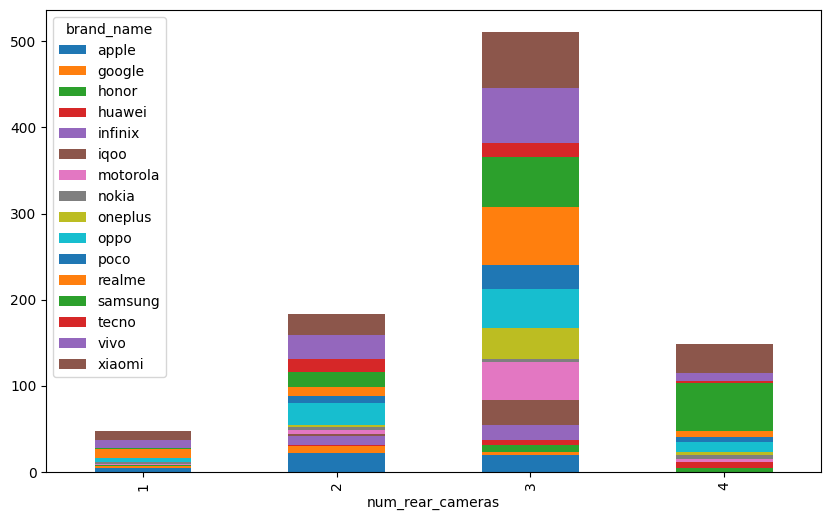

In [523]:
# stacked bar plot
pd.crosstab(df['num_rear_cameras'],df['brand_name']).plot(kind = 'bar', stacked = True, figsize = (10,6))
# majority of 'samsung' smartphone models either have 3 (or) 4 rear cameras
# majority of 'apple' smartphone models either have 2 (or) 3 rear cameras
# majority of 'oppo' smartphone models either have 2 (or) 3 rear cameras
# majority of 'motorola' smartphone models have 3 cameras
# all most all brands have majority of their models with 3 rear cameras

In [524]:
# Chi-Square Test

# Create a contingency table
contingency_table = pd.crosstab(df['num_rear_cameras'], df['brand_name'])

# Perform Chi-Square Test of Independence
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)

print("Chi-Square Statistic:", chi2)
print("P-value:", p_value)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:", expected)

# The output of the Chi-Square Test of Independence indicates a statistically significant association between the 
# 'num_rear_cameras' and 'brand_name' variables.

#     - Chi-Square Statistic: 236.102
#     - P-value: 9.767e-28
#     - Degrees of Freedom: 45

# The p-value is extremely small (close to zero), indicating strong evidence against the null hypothesis of independence. 
# Therefore, we reject the null hypothesis and conclude that there is a significant association between the number of rear 
# 
# cameras and the brand name of smartphones.

# The expected frequencies table shows the expected counts under the null hypothesis of independence. Each cell in the table 
# represents the expected count based on the row and column totals, assuming no association between the variables.


Chi-Square Statistic: 236.10232554596988
P-value: 9.76766834857627e-28
Degrees of Freedom: 45
Expected Frequencies: [[ 2.42921348  0.73932584  0.68651685  0.73932584  1.53146067  1.68988764
   2.74606742  0.68651685  2.21797753  4.64719101  2.16516854  5.12247191
   6.97078652  1.74269663  5.86179775  7.02359551]
 [ 9.45842697  2.87865169  2.67303371  2.87865169  5.96292135  6.57977528
  10.69213483  2.67303371  8.63595506 18.09438202  8.43033708 19.94494382
  27.14157303  6.78539326 22.82359551 27.34719101]
 [26.41123596  8.03820225  7.46404494  8.03820225 16.6505618  18.37303371
  29.85617978  7.46404494 24.11460674 50.5258427  23.54044944 55.69325843
  75.78876404 18.94719101 63.73146067 76.36292135]
 [ 7.7011236   2.34382022  2.17640449  2.34382022  4.85505618  5.35730337
   8.70561798  2.17640449  7.03146067 14.73258427  6.86404494 16.23932584
  22.0988764   5.5247191  18.58314607 22.26629213]]


In [525]:
# Cramer's V test
contingency_table = pd.crosstab(df['num_rear_cameras'],df['brand_name'])

# Compute Cramer's V
chi2, p_value, _, _ = stats.chi2_contingency(contingency_table)
n = contingency_table.sum().sum()
min_dim = min(contingency_table.shape)
cramers_v = np.sqrt(chi2/(n*(min_dim - 1)))

print("Cramer's V: ",cramers_v)
print("p-value: ",p_value)

# The computed Cramer's V coefficient for the association between num_rear_cameras and brand_name variables is approximately 
# 0.297, and the associated p-value is approximately 9.77e-28.

# Interpretation:

#     - Cramer's V coefficient measures the strength of association between two nominal variables.
#     - In this case, a Cramer's V coefficient of 0.297 indicates a moderate association between the number of rear cameras and
#       the brand name.
#     - The small p-value (much smaller than 0.05) indicates that the association is statistically significant, suggesting that 
#       the number of rear cameras and the brand name are not independent variables; there is a relationship between them.

# Overall, this suggests that there is a moderate association between the number of rear cameras and the brand name of the 
# smartphones in your dataset, and this association is statistically significant.

Cramer's V:  0.29736818471910337
p-value:  9.76766834857627e-28


num_rear_cameras x price
- The analysis reveals a consistent increase in the average price of smartphones as the number of rear cameras increases up to 
three. However, a notable deviation occurs at four rear cameras, where the average price experiences a decline yet noticablely
higher than 2 cameras.
The highest median price is for smartphone models with 3 rear cameras.
The second highest median price is for smartphone models with 4 rear cameras.
The third highest median price is for smartphone models with 2 rear cameras.
The forth place median price is for smartphone models with 1 rear camera.
all the categories are right skewed with numerous ouliers
More density in the category with 3 rear cameras.
The next highest density is at the category of 2 rear cameras.
the later highest density is at the category of 3 rear cameras.
and least density is at the category of 1 rear camera.
- the median price 23990.0 of smartphone models with 3 rear cameras is highest. follwed by second highest median price 
  14490.0 for models with 4 cameras. the third highest median price is 12990.0 for models with 2 rear camers. fourth and the
  last least median price 8999.0 is for models with 1 rear camera. std, Q1 and max also follow same price order
- In min Q1, mean and Q3 the highest price is for models with 4 rear cameras, followed by models with 3 rear cameras, next 
  follows models with 2 rear cameras and the least price model is 1 rear camera

The Kruskal-Wallis: H-test results indicate that there are statistically significant differences in medians of prices among 
the categories of 'num_rear_cameras'.

    - The Kruskal-Wallis H-statistic is approximately 118.52.
    - The associated p-value is approximately 1.61e-25, which is much smaller than the typical significance level of 0.05.

Therefore, you can conclude that there are significant differences in median prices across the different categories of 
'num_rear_cameras'.

num_rear_cameras x brand_name
- percentages of smartphones with 4 num_rear_cameras:
how much percentage does each category hold internally
59.73% of market is captured by two brands in the category of 4 rear cameras. First place is for 'samsung' with 36.91% and 
Secondone is for 'xiaomi' with 22.82%.

- percentages of smartphones with 3 num_rear_cameras
49.9% in the category with 3 rear cameras is captured by 4 brands first place is for 'realme' with 13.31%. Second place is 
for 'xiaomi' with 12.72%. Third place is for 'vivo' with 12.52%. Fourth place is for 'samsung' with 11.35%.

percentages of smartphones with 2 num_rear_cameras
72.13% in category with 2 rear cameras is captured by 6 brands. first highest share is for 'vivo' with 15.30%. Second highest 
place is for 'oppo' with 14.21%. The third place is for 'xiaomi' 13.11%. Fourth place is for 'apple' with 12.02%. fifth place
is for 'samsung' with 9.29%. Sixth place is for 'tecno' with 8.20%.

percentages of smartphones with 2 num_rear_cameras
in smartphone models with 1 rear camera 'xiaomi' have highest share with 21.28%. followed by 'realme' with 21.28%. the third 
place is for 'vivo' with 19.15%. And the fourth place is for 'oppo' with 10.64%. in the fifth place it is 'apple' with 10.64% 
all these 5 brands add upto 82.99% in category of 1 rear camera.

majority of 'samsung' smartphone models either have 3 (or) 4 rear cameras
majority of 'apple' smartphone models either have 2 (or) 3 rear cameras
majority of 'oppo' smartphone models either have 2 (or) 3 rear cameras
majority of 'motorola' smartphone models have 3 cameras
all most all brands have majority of their models with 3 rear cameras
The output of the Chi-Square Test of Independence indicates a statistically significant association between the 
'num_rear_cameras' and 'brand_name' variables.

    - Chi-Square Statistic: 236.102
    - P-value: 9.767e-28
    - Degrees of Freedom: 45

The p-value is extremely small (close to zero), indicating strong evidence against the null hypothesis of independence. 
Therefore, we reject the null hypothesis and conclude that there is a significant association between the number of rear 

cameras and the brand name of smartphones.

The expected frequencies table shows the expected counts under the null hypothesis of independence. Each cell in the table 
represents the expected count based on the row and column totals, assuming no association between the variables.

The computed Cramer's V coefficient for the association between num_rear_cameras and brand_name variables is approximately 
0.297, and the associated p-value is approximately 9.77e-28.

Interpretation:

    - Cramer's V coefficient measures the strength of association between two nominal variables.
    - In this case, a Cramer's V coefficient of 0.297 indicates a moderate association between the number of rear cameras and
      the brand name.
    - The small p-value (much smaller than 0.05) indicates that the association is statistically significant, suggesting that 
      the number of rear cameras and the brand name are not independent variables; there is a relationship between them.

Overall, this suggests that there is a moderate association between the number of rear cameras and the brand name of the 
smartphones in your dataset, and this association is statistically significant.

num_rear_cameras x os
in iOS there are no models with 4 rear cameras
highest number of models have 2 rear cameras which accounts to 478.3%. followed by models with 3 cameras which is 41.30%
later followed by model with 1 rear cameras which accounts to 10.87%

In Android the highest number of models have 3 rear cameras which accounts to 58.62%.followed by model with 2 rear cameras 
which is 18.94%. Then followed by models with 4 rear cameras which has 17.37%.last percentage is for model 5.07%

In [526]:
# 18 x 14
# num_rear_cameras x os
pd.crosstab(df['num_rear_cameras'], df['os'])
# in iOS there are 0 models with 4 rear cameras

os,Android,Other,iOS
num_rear_cameras,,,
1,42,0,5
2,157,0,22
3,486,4,19
4,144,4,0


<AxesSubplot: ylabel='count'>

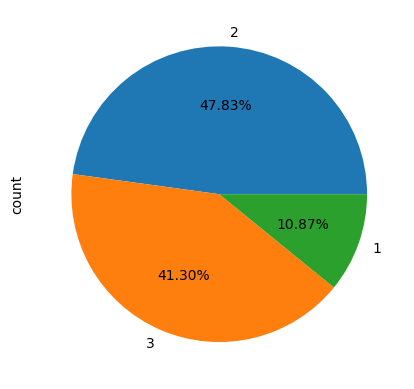

In [527]:
df[df['os'] == 'iOS']['num_rear_cameras'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
# in iOS there are no models with 4 rear cameras
# highest number of models have 2 rear cameras which accounts to 478.3%. followed by models with 3 cameras which is 41.30%
# later followed by model with 1 rear cameras which accounts to 10.87%

<AxesSubplot: ylabel='count'>

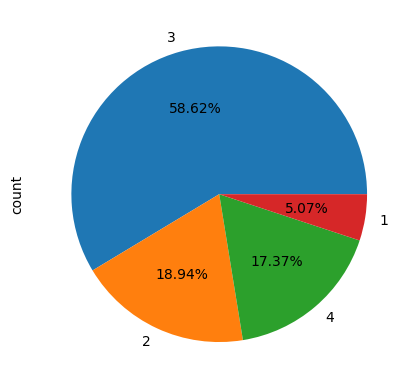

In [528]:
df[df['os'] == 'Android']['num_rear_cameras'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
# In Android the highest number of models have 3 rear cameras which accounts to 58.62%.followed by model with 2 rear cameras 
# which is 18.94%. Then followed by models with 4 rear cameras which has 17.37%.last percentage is for model 5.07%

<AxesSubplot: xlabel='num_front_cameras', ylabel='price'>

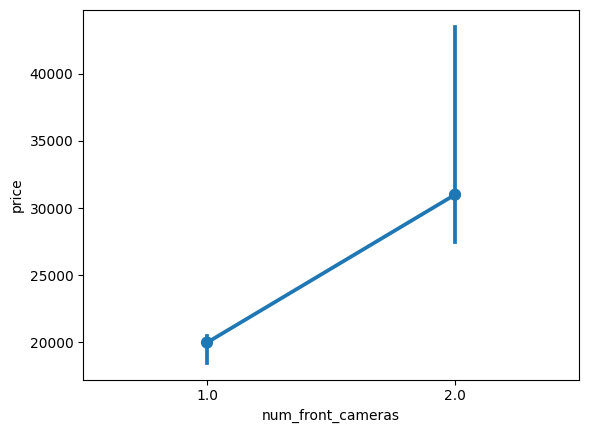

In [529]:
# 19 x 2.
# num_front_cameras x price
sns.pointplot(data = temp_df,x = 'num_front_cameras', y = 'price',estimator = np.median)
# The analysis indicates that, on average, smartphones equipped with two front cameras command a 55.06% higher price compared 
# to those with just one front camera.

In [680]:
 (30996.5-19990.0)/19990.0

0.550600300150075

In [530]:
temp_df.groupby('num_front_cameras')['price'].median().sort_values(ascending = False)

num_front_cameras
2.0    30996.5
1.0    19990.0
Name: price, dtype: float64

<AxesSubplot: xlabel='num_front_cameras', ylabel='price'>

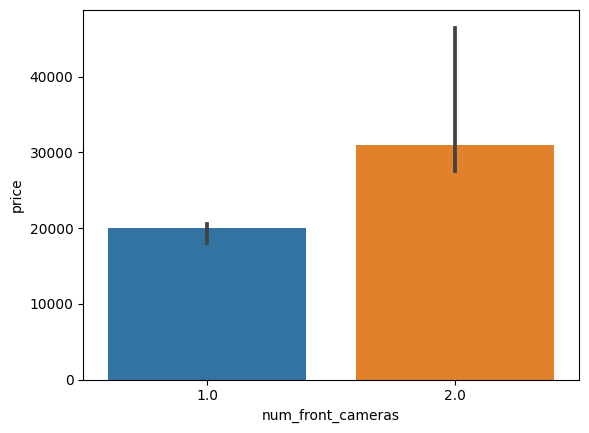

In [531]:
#barplot
sns.barplot(data = df, x = 'num_front_cameras', y = 'price',estimator = np.median)


<AxesSubplot: xlabel='num_front_cameras', ylabel='price'>

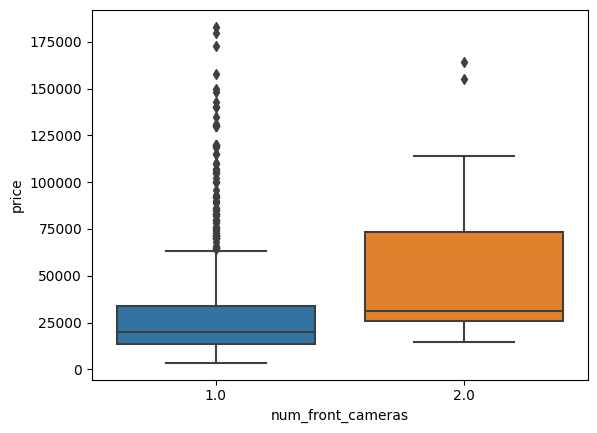

In [532]:
# box plot
sns.boxplot(data = df, x = 'num_front_cameras', y = 'price')
# the distribution of camera models with 1 front camera have numerous outliers. And the distribution of camera models with 2 
# front cameras have little outliers.

<AxesSubplot: xlabel='num_front_cameras', ylabel='price'>

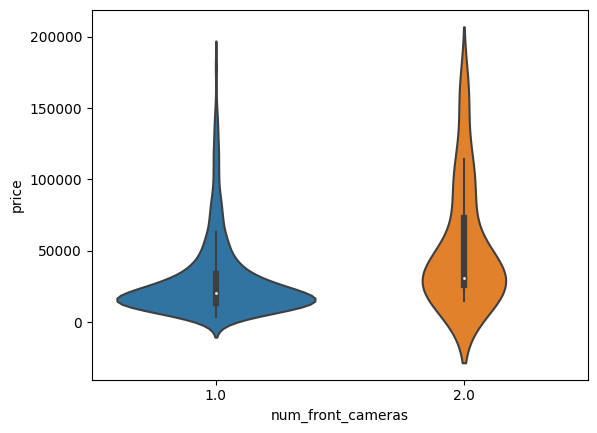

In [533]:
# violin plot
sns.violinplot(data = df, x = 'num_front_cameras', y = 'price')
# both the distributions are right skewed.

skew of 2 num_front_cameras:  1.4980797610231416
skew of 1 num_front_cameras:  2.4524955977368523


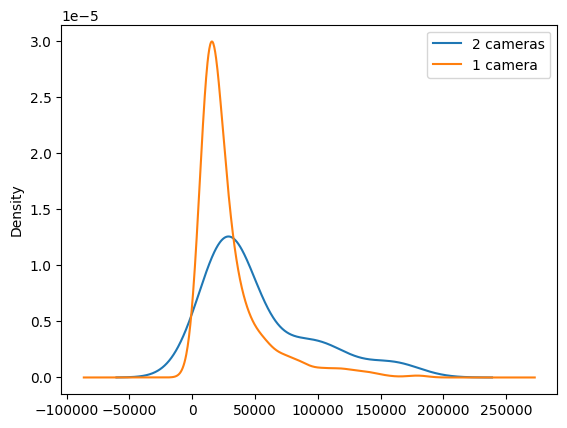

In [534]:
# 1D kde plot

df[df['num_front_cameras'] == 2]['price'].plot(kind = 'kde', label = '2 cameras')
print('skew of 2 num_front_cameras: ',df[df['num_front_cameras'] == 2]['price'].skew())

df[df['num_front_cameras'] == 1]['price'].plot(kind = 'kde', label = '1 camera')
print('skew of 1 num_front_cameras: ',df[df['num_front_cameras'] == 1]['price'].skew())

plt.legend()
plt.show()

# distribution with 2 front cameras skew = 1.5. distribution with 3 front cameras skew = 2.5.

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<AxesSubplot: xlabel='num_front_cameras', ylabel='price'>

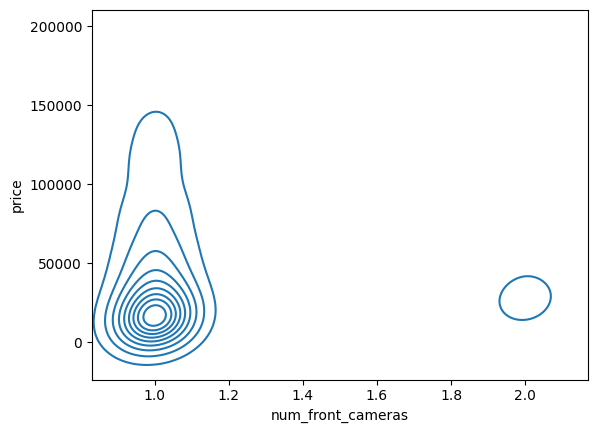

In [535]:

# 2D kde plot
sns.kdeplot(data = df, x = 'num_front_cameras', y = 'price')
# Majority of density is for category of models with 1 front camera. models with 2 cameras have least density .

In [538]:

groups = {}

for i in range(1, 3):
    group_name = f"group{i}"
    group_data = df[df['num_front_cameras'] == i]['price']
    groups[group_name] = group_data

# Now 'groups' contains price data for each category of 'num_rear_cameras'

# Create variables for each group using a loop
for group_name, group_data in groups.items():
    globals()[group_name] = group_data

# Now you have variables group1 and group2 containing the price data

# Perform Kruskal-Wallis H-test
h_statistic, p_value = stats.kruskal(group1, group2)

print("Kruskal-Wallis H-statistic:", h_statistic)
print("P-value:", p_value)

# The Kruskal-Wallis H-test results indicate a statistically significant difference in the median prices among the categories 
# of rear cameras.

#     - Kruskal-Wallis H-statistic: 19.39
#     - P-value: 1.065e-05

# The small p-value (close to zero) suggests strong evidence against the null hypothesis, indicating that there are significant
# differences in median prices across the categories of rear cameras.

# This implies that the number of rear cameras significantly impacts the median prices of smartphones.


Kruskal-Wallis H-statistic: 19.390873689416765
P-value: 1.065148571162022e-05


In [690]:
all_groups = [group1,group2]
dunn_results = posthoc_dunn(all_groups,p_adjust = 'holm')
print('dunn test results:\n', dunn_results)

dunn test results:
           1         2
1  1.000000  0.000011
2  0.000011  1.000000


In [539]:
from scikit_posthocs import posthoc_dunn

# Combine the groups into a list
all_groups = [group1, group2]

# Perform Dunn's test
dunn_results = posthoc_dunn(all_groups, p_adjust='holm')

print('dunn test results:\n', dunn_results)

dunn test results:
           1         2
1  1.000000  0.000011
2  0.000011  1.000000


In [540]:
# 19 x 0
# num_front_cameras x brand_name

# contingency table
pd.crosstab(df['num_front_cameras'],df['brand_name'])


brand_name,apple,google,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
num_front_cameras,,,,,,,,,,,,,,,,
1.0,46,13,12,11,29,32,50,13,42,85,41,94,128,31,102,130
2.0,0,1,1,2,0,0,2,0,0,2,0,3,4,2,9,2


<AxesSubplot: ylabel='count'>

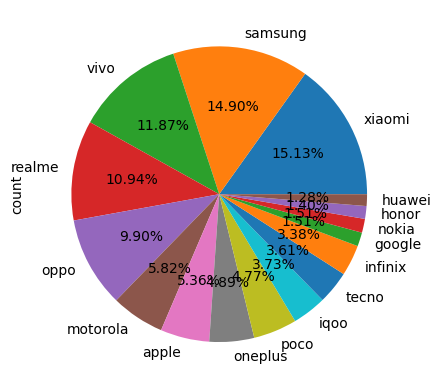

In [537]:
# percentages of smartphones with 1 num_front_cameras
df[df['num_front_cameras'] == 1]['brand_name'].value_counts().plot(kind = 'pie',autopct = '%.2f%%')
# In the category with 1 front camera 'xiaomi' brand is in leading position with 15.13%. followed by 'samsung' with 14.90%
# the third highest percentage is 11.87% belongs to 'vivo'. the fourth position is for brand realme with 10.94% . fifth 
# position for oppo with 9.90% just these 5 brands itself adds upto 62.74% of this category.

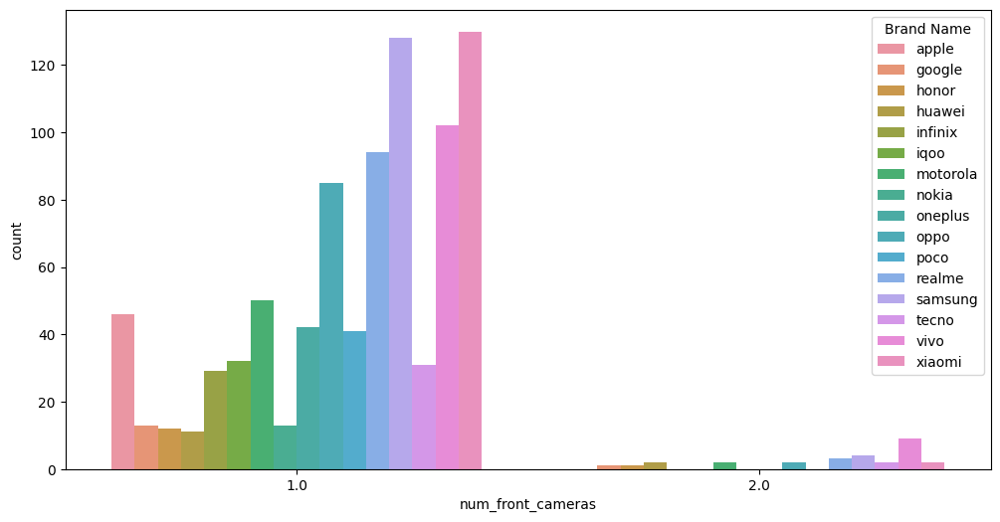

In [541]:

# Clustered Bar Chart
counts = df.groupby(['num_front_cameras', 'brand_name']).size().reset_index(name = 'count')

plt.figure(figsize = (12,6))
sns.barplot(data = counts, x = 'num_front_cameras', y = 'count', hue = 'brand_name')
plt.legend(title = "Brand Name")
plt.show()

# out of two categories it is clearly evident that majority of brands have smartphone models with 1 front camera.

In [542]:


# Chi-Square Test

# Create a contingency table
contingency_table = pd.crosstab(df['num_rear_cameras'], df['brand_name'])

# Perform Chi-Square Test of Independence
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)

print("Chi-Square Statistic:", chi2)
print("P-value:", p_value)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:", expected)

# The Chi-Square Test of Independence results indicate a statistically significant relationship between the variables being 
# analyzed.

#     - Chi-Square Statistic: 236.102
#     - P-value: 9.768e-28
#     - Degrees of Freedom: 45

# The small p-value (close to zero) suggests strong evidence against the null hypothesis, indicating that there is a significant
# association between the variables. This indicates that the distribution of one variable is dependent on the distribution of
# the other variable.

# The expected frequencies table provides the expected counts under the null hypothesis of independence. Each cell in the table 
# represents the expected count based on the row and column totals, assuming no association between the variables.

# Cramer's V test
n = contingency_table.sum().sum()
min_dim = min(contingency_table.shape)
cramers_v = np.sqrt(chi2/(n*(min_dim - 1)))

print("Cramer's V: ",cramers_v)
print("p-value: ",p_value)

# The Cramer's V coefficient test results indicate a moderate association between the variables under analysis.

#     -  Cramer's V: 0.297
#     -  P-value: 9.768e-28

# The Cramer's V value of 0.297 suggests a moderate level of association between the variables. The small p-value 
# (close to zero) provides strong evidence against the null hypothesis, indicating that the association observed is 
# statistically significant. Therefore, there is a meaningful relationship between the variables.

Chi-Square Statistic: 236.10232554596988
P-value: 9.76766834857627e-28
Degrees of Freedom: 45
Expected Frequencies: [[ 2.42921348  0.73932584  0.68651685  0.73932584  1.53146067  1.68988764
   2.74606742  0.68651685  2.21797753  4.64719101  2.16516854  5.12247191
   6.97078652  1.74269663  5.86179775  7.02359551]
 [ 9.45842697  2.87865169  2.67303371  2.87865169  5.96292135  6.57977528
  10.69213483  2.67303371  8.63595506 18.09438202  8.43033708 19.94494382
  27.14157303  6.78539326 22.82359551 27.34719101]
 [26.41123596  8.03820225  7.46404494  8.03820225 16.6505618  18.37303371
  29.85617978  7.46404494 24.11460674 50.5258427  23.54044944 55.69325843
  75.78876404 18.94719101 63.73146067 76.36292135]
 [ 7.7011236   2.34382022  2.17640449  2.34382022  4.85505618  5.35730337
   8.70561798  2.17640449  7.03146067 14.73258427  6.86404494 16.23932584
  22.0988764   5.5247191  18.58314607 22.26629213]]
Cramer's V:  0.29736818471910337
p-value:  9.76766834857627e-28


Price:
    - The majority of density is observed in the category of models with 1 front camera, while models with 2 cameras 
      exhibit the least density.
    - The distribution of models with 2 front cameras has a skewness of 1.5, while those with 3 front cameras have a 
      skewness of 2.5.
    - Both distributions are right-skewed, with models having 1 front camera displaying numerous outliers and those with 2 
      front cameras having fewer outliers.
    - On average, smartphones equipped with two front cameras command a 55.06% higher price compared to those with just one 
      front camera.
    - The Dunn's test results confirm the overall difference in price distribution suggested by the Kruskal-Wallis test and 
      pinpoint that the difference in median is statistically significant between phones with 1 front camera and those with 2 
      front cameras in data.

Brand Name:
    - The observed association between brand name and front camera configuration is statistically significant, indicating a
      meaningful relationship between the variables.
    - A majority of brands offer smartphone models with 1 front camera.
    - The Kruskal-Wallis H-test reveals a statistically significant difference in median prices across categories of rear 
      cameras, indicating a substantial impact of rear camera configurations on smartphone prices.

Operating System (OS):
    - In iOS, all models feature only 1 rear camera.
    - Among Android OS models, 96.86% have 1 front camera, while the remaining models have 2 front cameras.

In [543]:
# 19 x 24
# num_front_cameras x os

pd.crosstab(df['num_front_cameras'], df['os'])


os,Android,Other,iOS
num_front_cameras,,,
1.0,801,7,46
2.0,26,1,0


num_front_cameras x price
 The analysis indicates that, on average, smartphones equipped with two front cameras command a 55.06% higher price compared 
to those with just one front camera.
the distribution of camera models with 1 front camera have numerous outliers. And the distribution of camera models with 2 
front cameras have little outliers.
both the distributions are right skewed.
distribution with 2 front cameras skew = 1.5. distribution with 3 front cameras skew = 2.5.
num_front_cameras x brand_name
In the category with 1 front camera 'xiaomi' brand is in leading position with 15.13%. followed by 'samsung' with 14.90%
the third highest percentage is 11.87% belongs to 'vivo'. the fourth position is for brand realme with 10.94% just these 
4 brands itself adds upto 52.84% of this category.

The Kruskal-Wallis H-test results indicate a statistically significant difference in the median prices among the categories 
of rear cameras.

    - Kruskal-Wallis H-statistic: 19.39
    - P-value: 1.065e-05

The small p-value (close to zero) suggests strong evidence against the null hypothesis, indicating that there are significant
differences in median prices across the categories of rear cameras.

This implies that the number of rear cameras significantly impacts the median prices of smartphones.

num_front_cameras x brand_name
out of only two cayegories it is clearly evident that majority of brands have smartphone models with 1 front camera.

The Chi-Square Test of Independence results indicate a statistically significant relationship between the variables being 
analyzed.

    - Chi-Square Statistic: 236.102
    - P-value: 9.768e-28
    - Degrees of Freedom: 45

The small p-value (close to zero) suggests strong evidence against the null hypothesis, indicating that there is a significant
association between the variables. This indicates that the distribution of one variable is dependent on the distribution of
the other variable.

The expected frequencies table provides the expected counts under the null hypothesis of independence. Each cell in the table 
represents the expected count based on the row and column totals, assuming no association between the variables.

Cramer's V test

The Cramer's V coefficient test results indicate a moderate association between the variables under analysis.

    -  Cramer's V: 0.297
    -  P-value: 9.768e-28

The Cramer's V value of 0.297 suggests a moderate level of association between the variables. The small p-value 
(close to zero) provides strong evidence against the null hypothesis, indicating that the association observed is 
statistically significant. Therefore, there is a meaningful relationship between the variables.

num_front_cameras x os
In iOS all models have only 1 rear camera.
100% of models with iOS os have 1 front camera.
96.86% of models with Android os have 1 front camera remaining models have 2 front cameras.

In [544]:
df[df['os'] == 'iOS']['num_front_cameras'].value_counts()
# In iOS all models have only 1 rear camera.
# 100% of models with iOS os have 1 front camera.

num_front_cameras
1.0    46
Name: count, dtype: int64

<AxesSubplot: ylabel='count'>

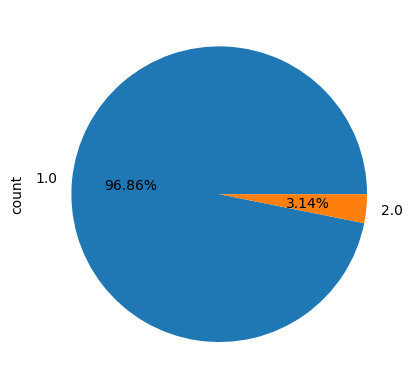

In [545]:
df[df['os'] == 'Android']['num_front_cameras'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
# 96.86% of models with Android os have 1 front camera remaining models have 2 front cameras.

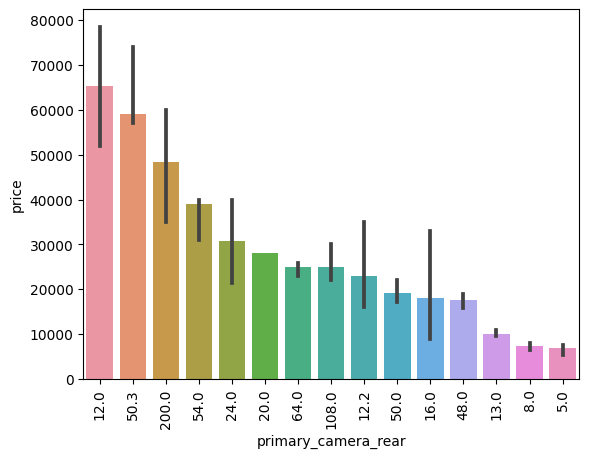

In [546]:
# 20 x 2
# primary camera rear x price

primary_rear_order = temp_df.groupby('primary_camera_rear')['price'].median().sort_values(ascending = False)
primary_rear_list = primary_rear_order.index.tolist()

sns.barplot(data = temp_df,x = 'primary_camera_rear', y = 'price',estimator = np.median, order = primary_rear_list)
plt.xticks(rotation = 'vertical');
# The highest median price is observed for smartphones with a 12MP primary camera. followed by 5.03

In [712]:
df.groupby('primary_camera_rear')['price'].describe().sort_values(by ='std', ascending = False)

,count,mean,std,min,25%,50%,75%,max
primary_camera_rear,,,,,,,,
12.0,50.0,71168.760000,39020.410900,11490.0,41724.25,65449.5,92749.00,179900.0
48.0,110.0,29499.100000,37658.643469,7249.0,13621.75,17679.0,24371.75,182999.0
108.0,76.0,37277.855263,31585.733350,14590.0,19990.00,24905.0,40496.75,199990.0
200.0,18.0,54883.388889,29488.211146,24999.0,33999.00,48494.5,59990.00,119990.0
50.0,314.0,31777.296178,27164.735042,7999.0,14459.75,19249.0,41740.00,163980.0
16.0,15.0,22728.533333,18968.940884,7990.0,9506.00,17990.0,26994.50,78990.0
64.0,165.0,27625.800000,16037.383276,10999.0,18999.00,24990.0,29999.00,134999.0
24.0,2.0,30740.000000,13081.475452,21490.0,26115.00,30740.0,35365.00,39990.0
12.2,4.0,24244.500000,9741.750031,15990.0,15996.75,22999.0,31246.75,34990.0


In [547]:
# Median
df.groupby('primary_camera_rear')['price'].median().sort_values(ascending = False)
# First highest density is around 50MP. Second highest density is around 12MP. Third highest density is at 108MP. Fourth and
# final one is at 200MP.

primary_camera_rear
12.0     65449.5
50.3     58990.0
200.0    48494.5
54.0     38999.0
24.0     30740.0
20.0     27999.0
64.0     24990.0
108.0    24905.0
12.2     22999.0
50.0     19249.0
16.0     17990.0
48.0     17679.0
13.0      9999.0
8.0       7320.0
5.0       6999.0
Name: price, dtype: float64

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<AxesSubplot: xlabel='primary_camera_rear', ylabel='price'>

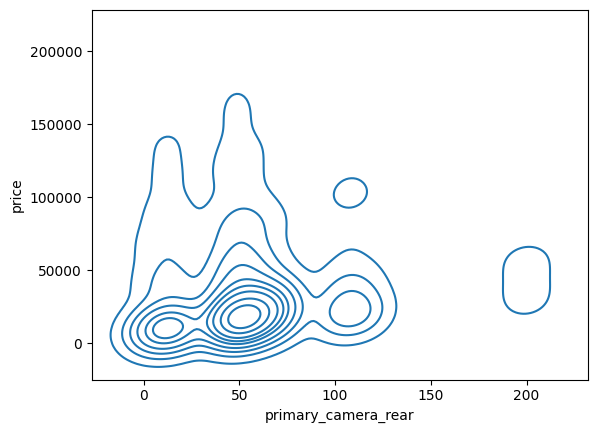

In [548]:
# 2kde plot
sns.kdeplot(data = df, x = 'primary_camera_rear', y = 'price')
# First highest density is around 50MP. Second highest density is around 12MP. Third highest density is at 108MP. Fourth and
# final one is at 200MP.

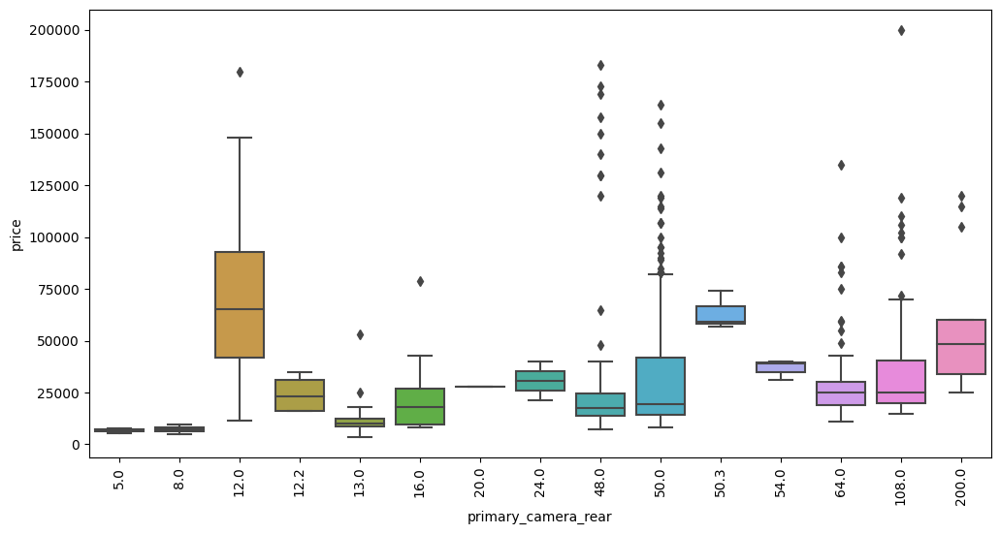

In [549]:
# till now treated primary_camera_rear as continuous variable now treating as nominal variable
# box plot
plt.figure(figsize = (12,6))
sns.boxplot(data = df, x = 'primary_camera_rear', y = 'price')
plt.xticks(rotation = 'vertical');
# 12MP category have highest standard deviation and is nearly normally distributed with very less outliers.

<AxesSubplot: xlabel='primary_camera_rear', ylabel='price'>

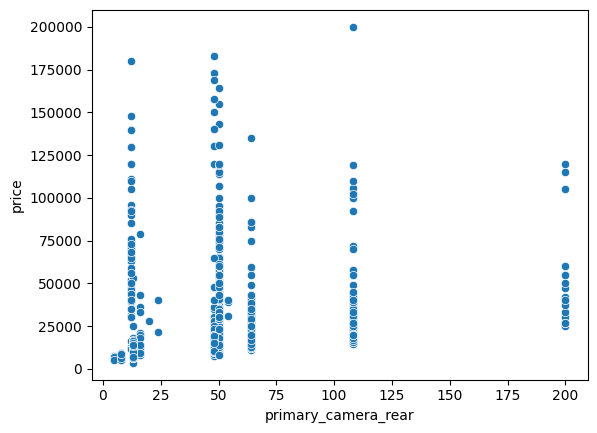

In [550]:
sns.scatterplot(data = df, x = 'primary_camera_rear', y= 'price')
# The scatters are only visible around 5MP,8MP, 12MP,13MP, 48MP,50MP, 64MP, 108MP, 200MP.

<AxesSubplot: ylabel='count'>

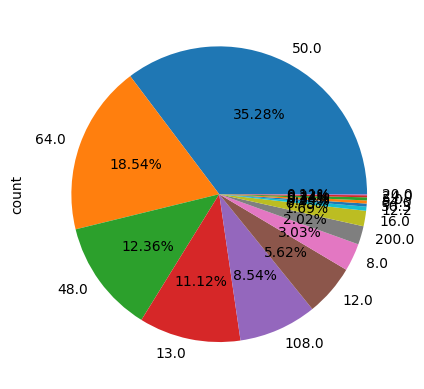

In [713]:
df['primary_camera_rear'].value_counts().plot(kind = 'pie', autopct = "%.2f%%")

In [551]:
df[df['primary_camera_rear'] == 12.0]['price'].skew()
# slightly skewed

0.6904696381683239

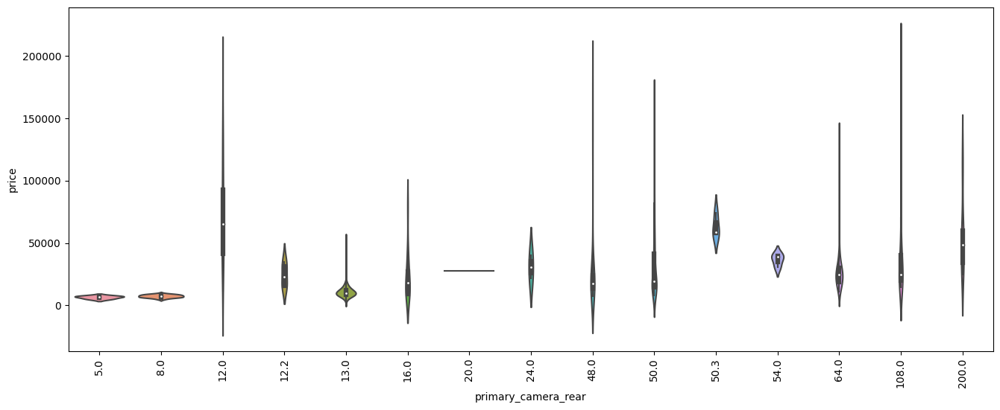

In [552]:
# violinplot:
plt.figure(figsize = (16,6))
sns.violinplot(data = df, x = 'primary_camera_rear', y = 'price')
plt.xticks(rotation = 'vertical');
# 

In [553]:
# Perform Kruskal-Wallis test
kruskal_result = stats.kruskal(*[group['price'] for name, group in df.groupby('primary_camera_rear')])

# Print Kruskal-Wallis test result
print("Kruskal-Wallis Test Statistic:", kruskal_result.statistic)
print("p-value:", kruskal_result.pvalue)

# The test statistic is 356.00, and the p-value is approximately 2.26e-67.

# This small p-value suggests that there is strong evidence to reject the null hypothesis, indicating that there are 
# significant differences in median prices across different levels of the primary_camera_rear variable.

#  Kruskal-Wallis statistic is  significant, indicating a difference between 'price' across different categories of 
#     'primary_camera_rear'. The p-value is also small, suggesting that the difference is statistically significant.

Kruskal-Wallis Test Statistic: 356.0029768033391
p-value: 2.264381105264718e-67


In [554]:
df[df['primary_camera_rear'] == 24.0]['price']

# It seems that for the subset where the primary_camera_rear is 24.0, there are only two prices available: 39990 and 21490.
# This explains why the skewness calculation resulted in NaN. In this case, it might not be meaningful to generate a KDE plot
# since it requires more data points to estimate the distribution accurately. You may want to consider handling such cases 
# separately or excluding them from the analysis altogether.

955    39990
956    21490
Name: price, dtype: int64

In [555]:
for name, group in df.groupby('primary_camera_rear'):
    print(group['price'])

472    7499
713    6999
716    5249
Name: price, dtype: int64
70     9499
114    6171
155    5299
224    8999
292    7749
298    7790
300    6299
335    6499
353    7145
379    8990
399    6499
443    6999
467    6490
475    6299
501    7289
518    7999
583    8999
620    8990
651    7320
668    7999
676    8299
732    7299
795    7999
827    4999
898    8399
934    6499
970    8720
Name: price, dtype: int64
6       65999
15      62999
25      31239
33      38999
35      39999
56      74999
76     119900
111     51999
136     46999
149     40999
161    129900
173     29990
246     75999
255     51999
262     71999
275     64900
280     69990
304     69999
305     55999
321     84999
344     72999
361     45999
366     43999
371     35489
435     43900
471     11999
498     89999
521    129900
560    110999
594    109900
613    139900
621     95999
638     39900
663     39999
664     92999
682    139900
694     58999
731     12999
737     49990
756    179900
780     34999
788    104999


In [556]:
num = 1
for name, group in df.groupby('primary_camera_rear'):
    print(name,'  num:',num)
    num += 1

5.0   num: 1
8.0   num: 2
12.0   num: 3
12.2   num: 4
13.0   num: 5
16.0   num: 6
20.0   num: 7
24.0   num: 8
48.0   num: 9
50.0   num: 10
50.3   num: 11
54.0   num: 12
64.0   num: 13
108.0   num: 14
200.0   num: 15


primary camera rear x price

    The highest median price 65449.5 is for smartphones with 12MP primary rear camera. Followed by 58990.0 for 50.3MP and so on.
    First highest density is around 50MP. Second highest density is around 12MP. Third highest density is at 108MP. Fourth and
    final one is at 200MP.
    12MP category have highest standard deviation and is nearly normally distributed with very less outliers.
    The scatters are only visible around 5MP,8MP, 12MP,13MP, 48MP,50MP, 64MP, 108MP, 200MP.
    Kruskal-Wallis: statistic is  significant, indicating a difference between 'price' across different categories of 
    'primary_camera_rear'. The p-value is also small, suggesting that the difference is statistically significant.
    
primary_camera_rear x brand_name

    majority of smartphones models have 50.0MP primary rear camera followed by 64.0MP which is follwoed by 48.0MP followed
    by 13.0MP followed by 108.0MP. every brand have models with 50MP primary rear camerawhich is 87.5% brands.followed by 
    smartphone brands having models with 13.0MP. models with 48.0MP is present in 87.5% brands followed by 64.0MP in 75.0%
    models and 108MP in 75.0% and so on.
    - 68.00% of smartphones with 12MP primary_camera_rear belongs to 'apple'. This the cause for it to be category of highest
    median priced primary rear camera smartphones.

primary_camera_rear x os

    73.91% of apple smartphone models have 12.0MP primary rear camera. followed by 48.0MP which contributes to 17.39% followed 
    by 6.52% for 50.0MP and last and least percentage is 2.17% for 13.0MP.
    Android have smartphone models in all categories of primary rear camera models. The highest percentage is 36.31% for 
    models with 50.0MP. Followed by 64.0MP for 19.78%.



In [557]:
import scikit_posthocs as sp

# Get the groups for Dunn's test
groups = [group['price'].values for name, group in df.groupby('primary_camera_rear')]

# perform Dunn's test
dunn_results = sp.posthoc_dunn(groups)

# Print the Dunn's test results
print("Dunn's test results:")
print(dunn_results)


# The output you provided shows the results of Dunn's test, a non-parametric multiple comparison test, applied to your data 
# grouped by the number of rear cameras (primary_camera_rear). Here's a breakdown of the results and how to interpret them:

# Structure of the Output:

#     - The table shows p-values for pairwise comparisons between groups (number of rear cameras).
#     - Each row represents a camera count group (e.g., row 1 represents phones with 1 camera).
#     - Each column represents another camera count group for comparison.
#     - The value at the intersection of a row and column is the p-value for the comparison between those two groups.

# Interpreting p-values:

#     - A low p-value (less than 0.05) indicates statistically significant evidence that the medians of the two groups are
#       different.
#     - A high p-value (greater than 0.05) suggests that we cannot reject the null hypothesis, meaning there's not enough
#       evidence to conclude a significant difference in medians.

# Example Interpretation:

#     - Look at row 1, column 2 (comparing 1 camera vs. 2 cameras). The p-value is 0.922. Since it's greater than 0.05, we 
#       cannot reject the null hypothesis. We don't have strong evidence to say that the median price of phones with 1 camera 
#       is statistically different from the median price of phones with 2 cameras.
#     - Conversely, consider row 4, column 1 (comparing 4 cameras vs. 1 camera). The p-value here is 0.017. This suggests a 
#       statistically significant difference in medians. Phones with 4 cameras might have a different median price compared to
#       phones with 1 camera.

# Overall, Dunn's test helps you identify statistically significant differences in medians between groups based on the number 
# of rear cameras. You can analyze the p-values to determine which camera count groups have statistically different median 
# prices.

# Additional Considerations:

#     - You might want to consider applying a correction for multiple comparisons (e.g., Bonferroni correction) to account for 
#       the increased chance of false positives when conducting multiple comparisons.
#     - Depending on your research question, you might be interested in exploring other post-hoc tests like Tukey's HSD test, 
#       which is suitable for normally distributed data with equal variances.

# I hope this explanation clarifies the Dunn's test results and helps you interpret the p-values for your analysis!

Dunn's test results:
          1             2             3         4             5   \
1   1.000000  9.220141e-01  2.157098e-06  0.017355  4.303000e-01   
2   0.922014  1.000000e+00  7.969604e-31  0.001037  6.368275e-02   
3   0.000002  7.969604e-31  1.000000e+00  0.054446  6.085358e-42   
4   0.017355  1.036711e-03  5.444566e-02  1.000000  7.893125e-03   
5   0.430300  6.368275e-02  6.085358e-42  0.007893  1.000000e+00   
6   0.035571  8.052248e-05  4.382627e-07  0.386056  1.750784e-03   
7   0.052379  3.225338e-02  5.682563e-01  0.705134  7.688995e-02   
8   0.015256  3.271334e-03  4.041404e-01  0.646010  1.412941e-02   
9   0.011920  4.911499e-11  3.124795e-15  0.497101  3.216981e-13   
10  0.002566  3.601410e-17  2.409655e-12  0.892843  5.948733e-29   
11  0.000223  1.203403e-06  7.392410e-01  0.116991  1.331501e-05   
12  0.001718  3.986827e-05  6.659090e-01  0.330833  3.445242e-04   
13  0.000853  1.173919e-19  6.247071e-08  0.803736  2.384821e-31   
14  0.000272  1.402540e-20 

skew of 50.0 MP:  2.0294384512650296
skew of 64.0 MP:  3.4723384890247915
skew of 48.0 MP:  2.983004213310838
skew of 13.0 MP:  5.235328206762575
skew of 108.0 MP:  2.7595177526409707
skew of 12.0 MP:  0.6904696381683239
skew of 8.0 MP:  -0.18566282309528542
skew of 200.0 MP:  1.3205144618102111
skew of 16.0 MP:  2.1093044342194243
skew of 12.2 MP:  0.222288364936479
skew of 50.3 MP:  1.6430499828487446
skew of 54.0 MP:  -1.6538067593711279
skew of 5.0 MP:  -1.38963613870649
skew of 24.0 MP:  nan


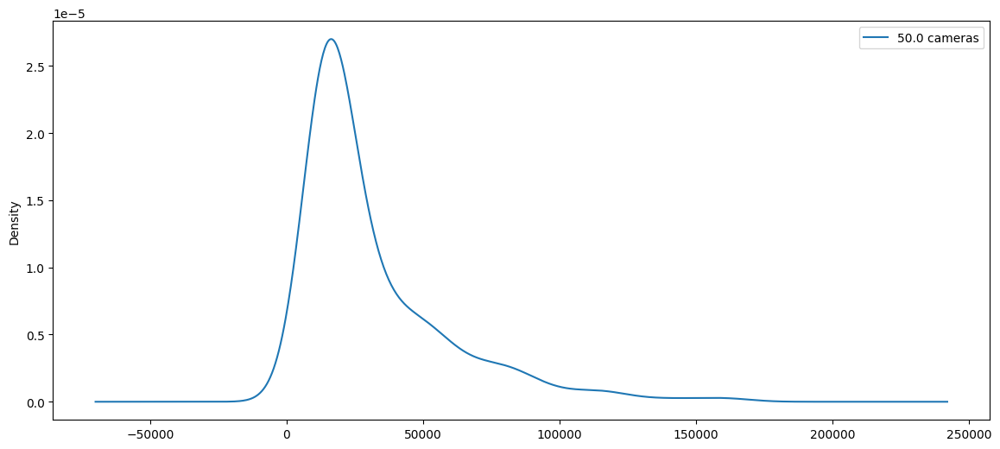

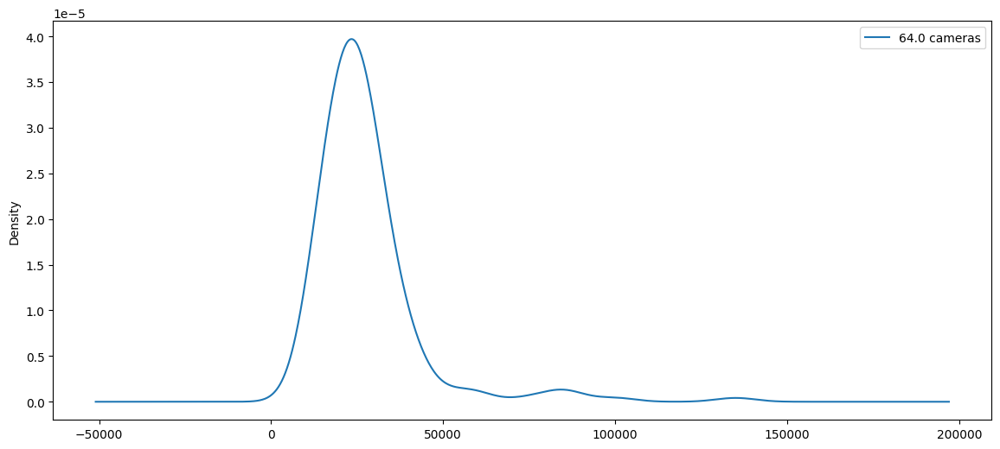

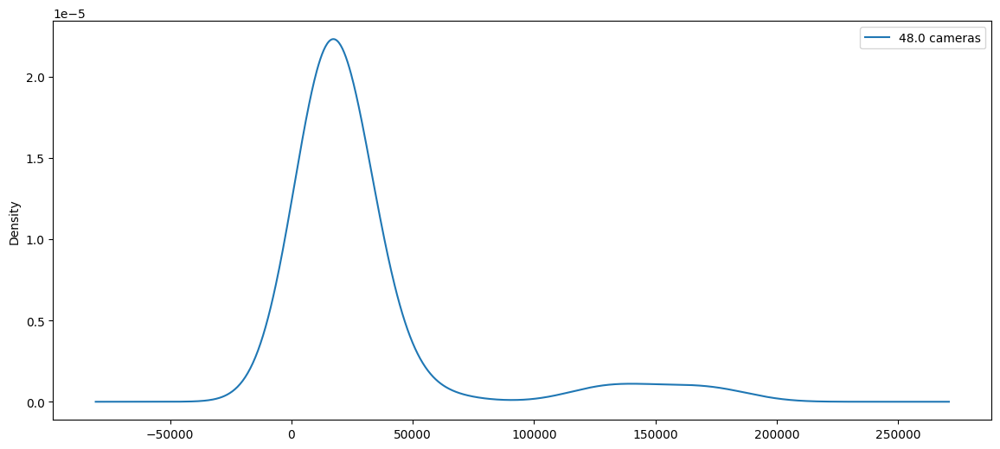

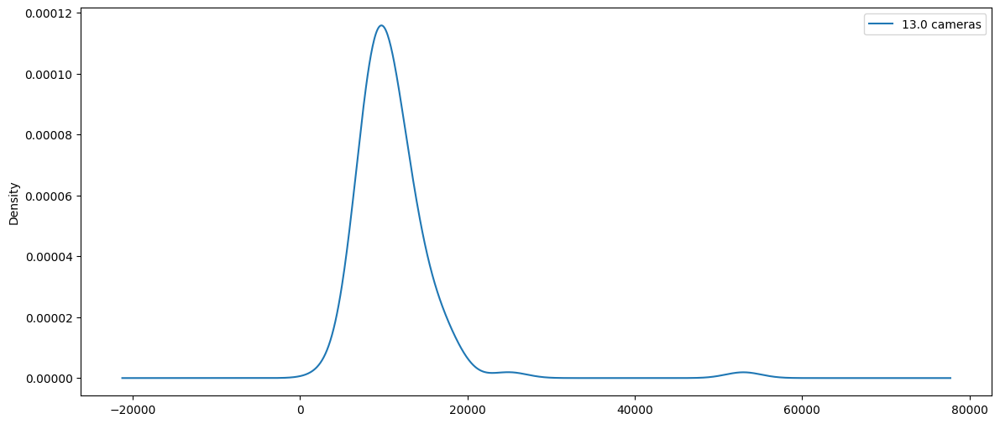

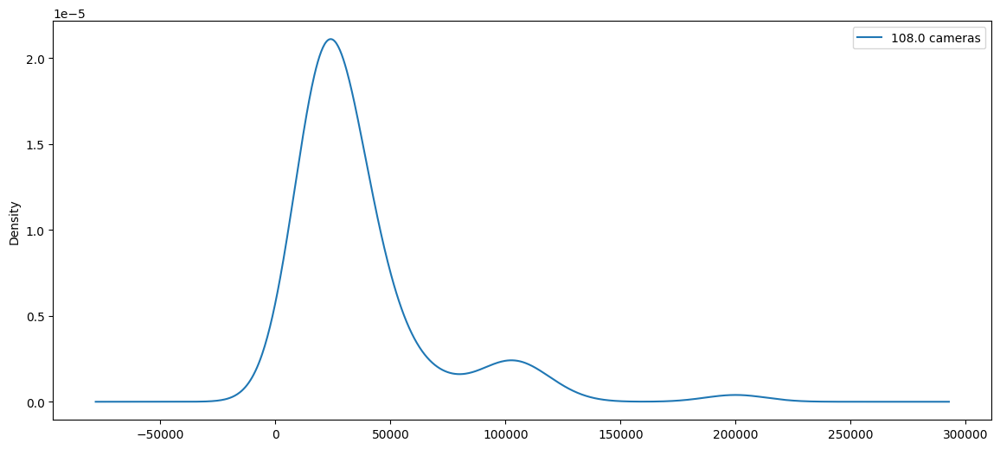

...

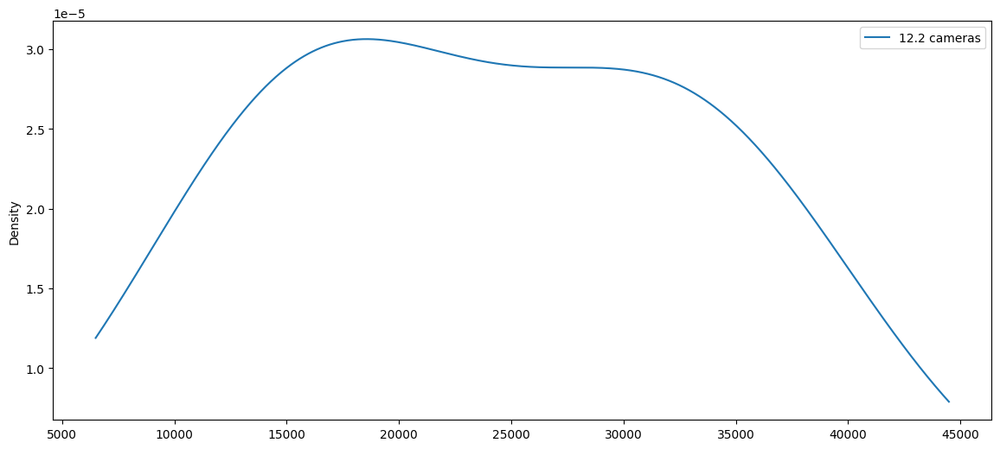

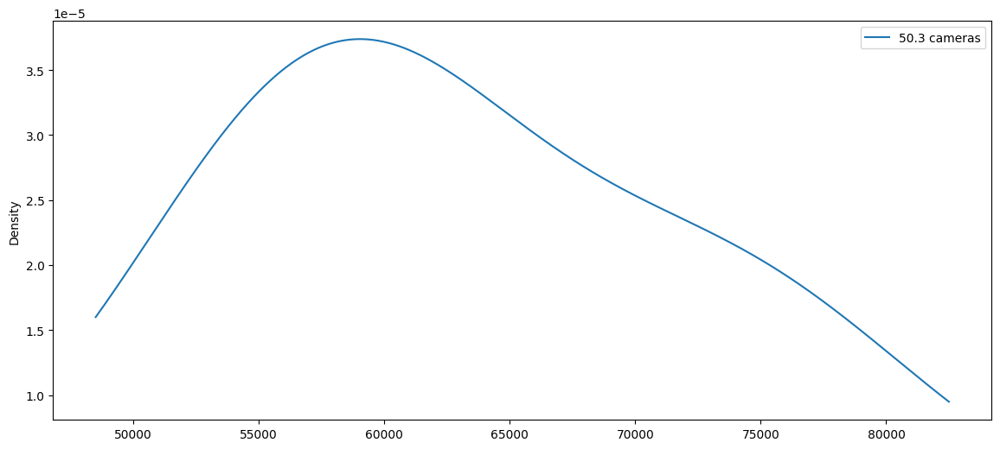

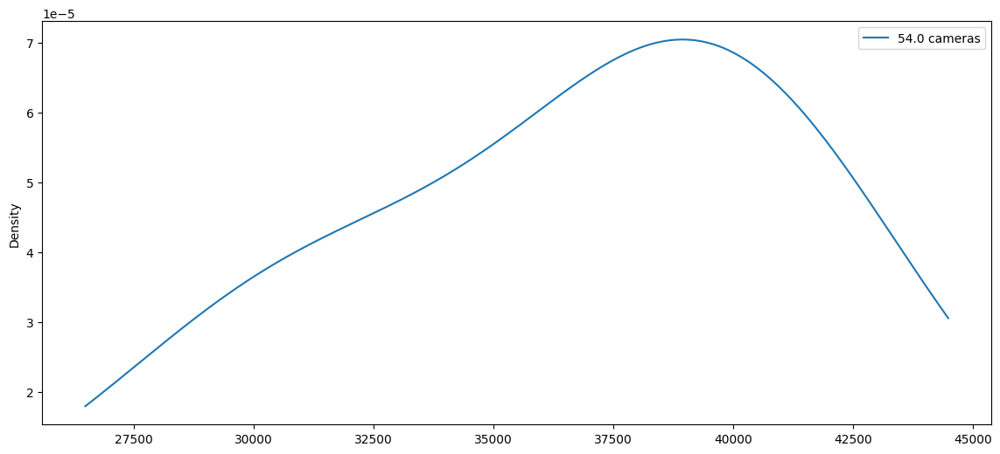

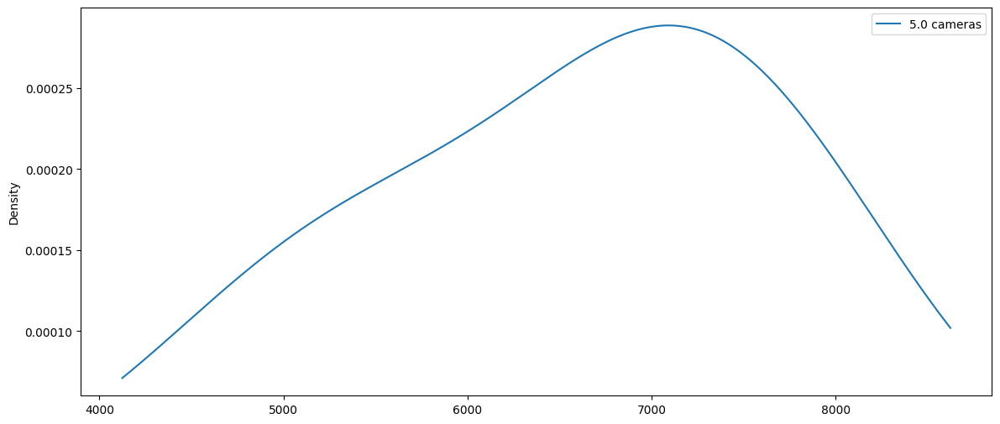

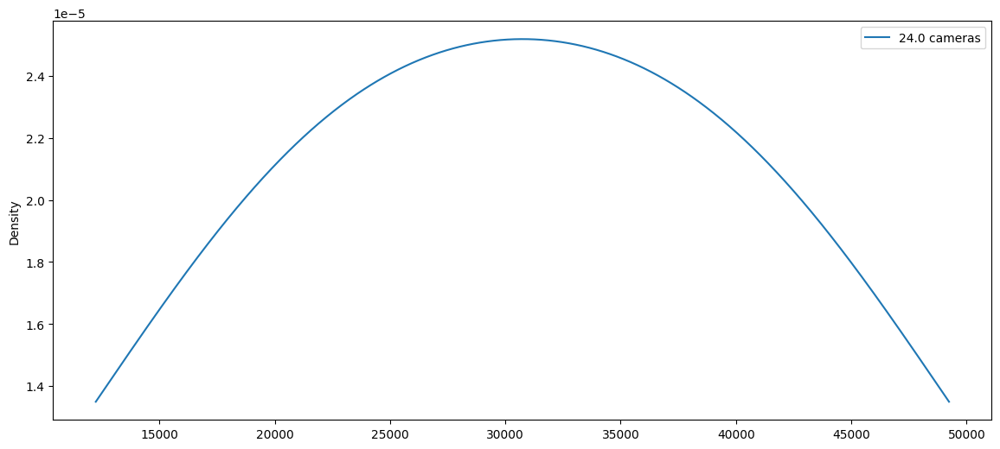

In [558]:
# 1D kde plot
# df[df['primary_camera_rear'] == 4]['price'].plot(kind = 'kde', label = '4 cameras')
# print('skew of 4 primary_camera_rear: ',df[df['primary_camera_rear'] == 4]['price'].skew())

# ... your existing code to create the DataFrame (df) ...
MP = df['primary_camera_rear'].value_counts().index.tolist()

for i in MP:
    subset = df[df['primary_camera_rear'] == i]['price']
    
    # Check if subset has more than one element before plotting
    if not subset.empty and len(subset) > 1:
        plt.figure(figsize=(14, 6))
        subset.plot(kind='kde', label=f'{i} cameras')

        # Print skewness only if the subset has more than one element
        print(f'skew of {i} MP: ', subset.skew())
        plt.legend()

# Add legend and display the plot after the loop (assuming all plots fit)
# if len(MP) > 1:  # Check if there's more than one camera count
#     plt.legend()

plt.show()

primary camera rear x price
- The highest median price 65449.5 is for smartphones with 12MP primary rear camera. Followed by 58990.0 for 50.3MP and 
  so on.
- First highest density is around 50MP. Second highest density is around 12MP. Third highest density is at 108MP. Fourth and 
  final one is at 200MP.
- After performing Kruskal test we came to conclusion that there are statistically significant differences in median prices 
  across different levels of the primary_camera_rear variable.
- Even performed dunn's test.

primary_camera_rear x brand_name
- majority of smartphones models have 50.0MP primary rear camera followed by 64.0MP which is  follwoed by 48.0MP 
  followed by 13.0MP followed by 108.0MP.
- every brand have models with 50MP primary rear camerawhich is 87.5% brands.followed by smartphone brands having models with
  13.0MP. models with 48.0MP is present in 87.5% brands followed by 64.0MP in 75.0% models and 108MP in 75.0% and so on.
    
primary_camera_rear x os
- 73.91% of apple smartphone models have 12.0MP primary rear camera. followed by 48.0MP which contributes to 17.39%
  followed by 6.52% for 50.0MP and last and least percentage is 2.17% for 13.0MP.
- Android have smartphone models in all categories of primary rear camera models. The highest percentage is 36.31% for 
  models with 50.0MP. Followed by 64.0MP for 19.78%.

<AxesSubplot: ylabel='count'>

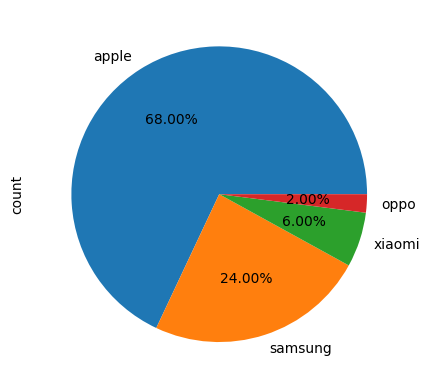

In [559]:
# 20 x 0
# primary_camera_rear x brand_name 

df[df['primary_camera_rear'] == 12]['brand_name'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
# 68.00% of smartphones with 12MP primary_camera_rear belongs to 'apple'. This the cause for it to be category of highest median
# priced primary rear camera smartphones.

In [560]:
pd.crosstab(df['primary_camera_rear'],df['brand_name'])

brand_name,apple,google,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
primary_camera_rear,,,,,,,,,,,,,,,,
5.0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0
8.0,0,0,0,0,3,0,0,0,0,1,2,10,2,1,5,3
12.0,34,0,0,0,0,0,0,0,0,1,0,0,12,0,0,3
12.2,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0
13.0,1,0,1,1,3,0,2,2,3,19,3,10,8,7,25,14
16.0,0,3,0,0,0,0,3,0,0,0,0,0,3,2,4,0
20.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
24.0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0
48.0,8,0,2,2,0,7,2,1,4,10,6,16,22,5,4,21


<Figure size 1200x600 with 0 Axes>

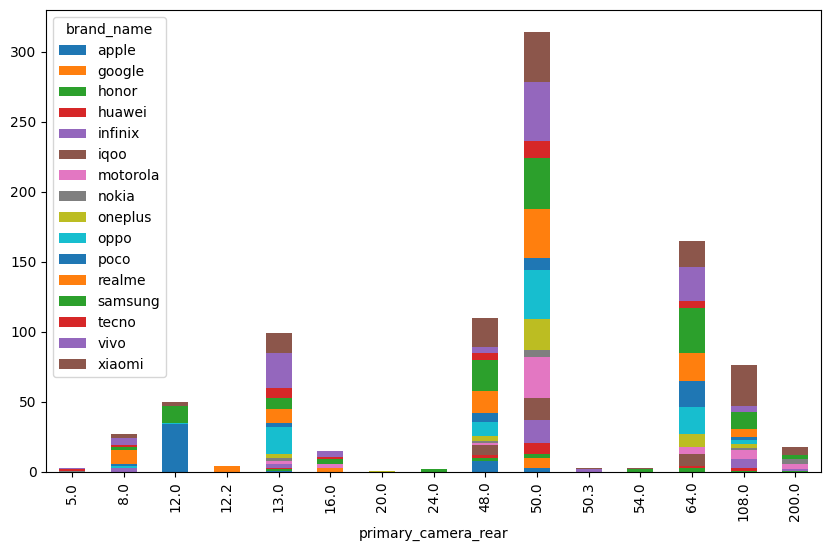

In [561]:
# stacked bar plot
plt.figure(figsize = (12,6))
pd.crosstab(df['primary_camera_rear'],df['brand_name']).plot(kind = 'bar', stacked = True, figsize = (10,6))
plt.xticks(rotation = 'vertical')
plt.show()

# majority of smartphones models have 50.0MP primary rear camera followed by 64.0MP which is follwoed by 48.0MP followed
# by 13.0MP followed by 108.0MP. every brand have models with 50MP primary rear camerawhich is 87.5% brands.followed by 
# smartphone brands having models with 13.0MP. models with 48.0MP is present in 87.5% brands followed by 64.0MP in 75.0%
# models and 108MP in 75.0% and so on.

<AxesSubplot: ylabel='count'>

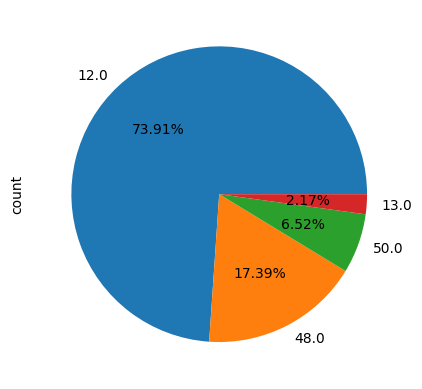

In [562]:
df[df['brand_name'] == 'apple']['primary_camera_rear'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')
# 73.91% of apple smartphones have there primary rear camera with 12MP.

<AxesSubplot: ylabel='count'>

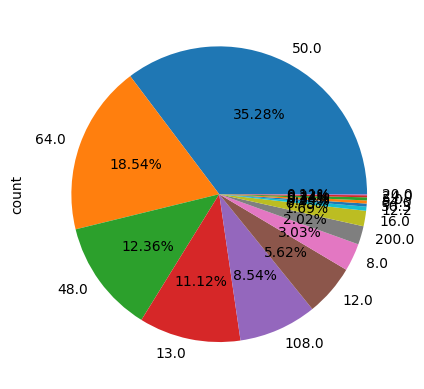

In [563]:
df['primary_camera_rear'].value_counts().plot(kind = 'pie',autopct = '%.2f%%')
# 35.28% of smarphones belongs to 50MP primary rear camera in the dataset

In [564]:
df[df['primary_camera_rear'] == 50]['brand_name'].value_counts()

brand_name
vivo        42
samsung     36
xiaomi      36
oppo        35
realme      35
motorola    29
oneplus     22
iqoo        16
infinix     16
tecno       12
poco         9
huawei       8
google       7
nokia        5
apple        3
honor        3
Name: count, dtype: int64

In [565]:
df.loc[df['primary_camera_rear'] == 50,['brand_name','price']]

,brand_name,price
0,oneplus,54999
2,samsung,16499
3,motorola,14999
5,samsung,16999
9,oneplus,28999
...,...,...
967,xiaomi,54999
968,motorola,49990
971,oppo,69990
973,google,70990


In [566]:
# 20 x 0
# primary_camera_rear x brand_name
pd.crosstab(df['primary_camera_rear'], df['brand_name'])

brand_name,apple,google,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
primary_camera_rear,,,,,,,,,,,,,,,,
5.0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0
8.0,0,0,0,0,3,0,0,0,0,1,2,10,2,1,5,3
12.0,34,0,0,0,0,0,0,0,0,1,0,0,12,0,0,3
12.2,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0
13.0,1,0,1,1,3,0,2,2,3,19,3,10,8,7,25,14
16.0,0,3,0,0,0,0,3,0,0,0,0,0,3,2,4,0
20.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
24.0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0
48.0,8,0,2,2,0,7,2,1,4,10,6,16,22,5,4,21


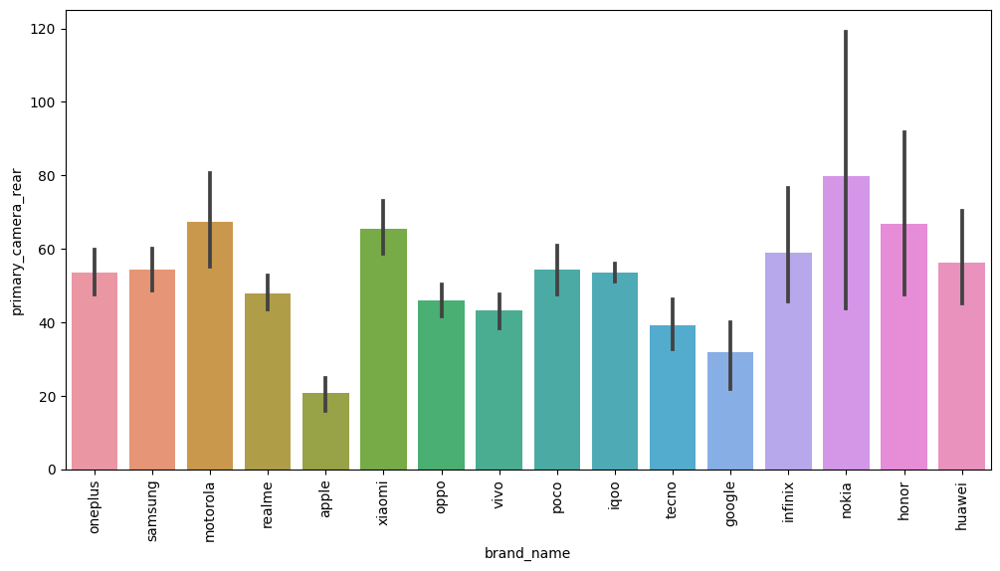

In [567]:
plt.figure(figsize = (12,6))
sns.barplot(data = df, x = 'brand_name', y = 'primary_camera_rear')
plt.xticks(rotation = 'vertical');

Text(0.5, 1.0, 'Stacked Bar Plot of 5G Availability by Brand')

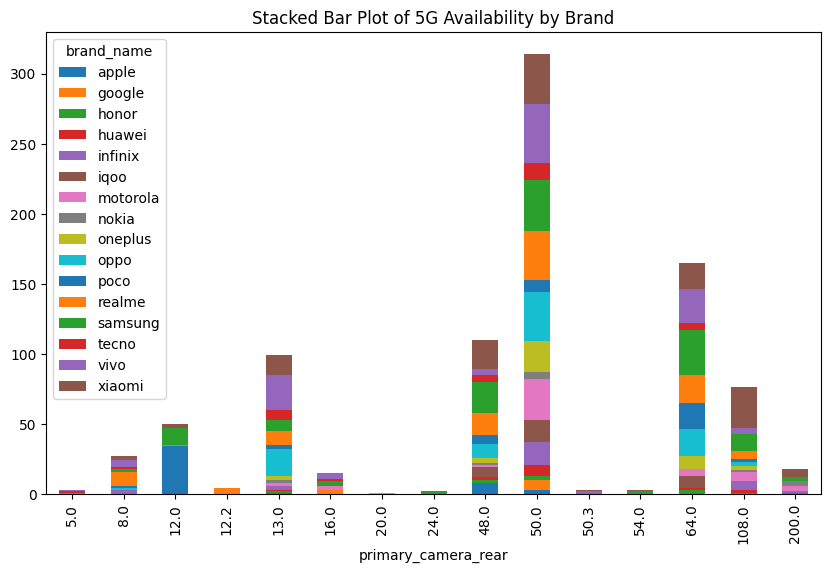

In [568]:
# stacked bar plot
pd.crosstab(df['primary_camera_rear'],df['brand_name']).plot(kind = 'bar', stacked = True, figsize = (10,6))
plt.title('Stacked Bar Plot of 5G Availability by Brand')
# majority of smartphones models have 50.0MP primary rear camera followed by 64.0MP which is  follwoed by 48.0MP 
# followed by 13.0MP followed by 108.0MP

In [569]:
# percentage of brands
Total_brands = df['brand_name'].nunique()
for i in df['primary_camera_rear'].unique():
    print('no.of brands with',i,"MP: ",(df[df['primary_camera_rear'] == i]['brand_name'].nunique())/Total_brands * 100,'%')
    
# every brand have models with 50MP primary rear camerawhich is 87.5% brands.followed by smartphone brands having models with
# 13.0MP. models with 48.0MP is present in 87.5% brands followed by 64.0MP in 75.0% models and 108MP in 75.0% and so on.

no.of brands with 50.0 MP:  100.0 %
no.of brands with 64.0 MP:  75.0 %
no.of brands with 108.0 MP:  75.0 %
no.of brands with 12.0 MP:  25.0 %
no.of brands with 200.0 MP:  37.5 %
no.of brands with 13.0 MP:  87.5 %
no.of brands with 48.0 MP:  87.5 %
no.of brands with 8.0 MP:  50.0 %
no.of brands with 50.3 MP:  12.5 %
no.of brands with 12.2 MP:  6.25 %
no.of brands with 54.0 MP:  12.5 %
no.of brands with 16.0 MP:  31.25 %
no.of brands with 5.0 MP:  18.75 %
no.of brands with 20.0 MP:  6.25 %
no.of brands with 24.0 MP:  6.25 %


<AxesSubplot: ylabel='count'>

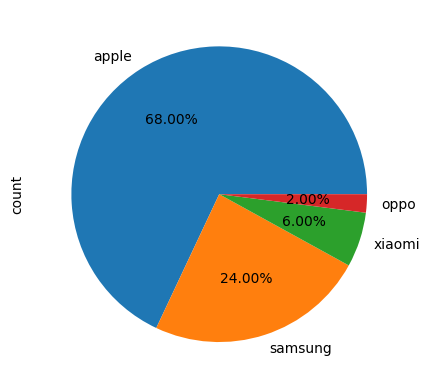

In [717]:
df[df['primary_camera_rear'] == 12]['brand_name'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')

In [721]:
# chi-square test
contingency_table = pd.crosstab(df['primary_camera_rear'],df['brand_name'])
chi2_stats, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print("chi-square statistic:", chi2_stats)
print("p-value:", p_value)
print("Degrees Of Freedom:", dof)
print("Expected Frequency Tables: \n", expected)
# The very high Chi-Square statistic (1171.38) and the extremely low p-value (essentially 0) suggest that the observed 
# distribution of camera resolutions across different smartphone brands is not due to chance. There is a meaningful 
# relationship between these two variables.

chi-square statistic: 1171.380867069863
p-value: 3.525923469168396e-133
Degrees Of Freedom: 210
Expected Frequency Tables: 
 [[1.55056180e-01 4.71910112e-02 4.38202247e-02 4.71910112e-02
  9.77528090e-02 1.07865169e-01 1.75280899e-01 4.38202247e-02
  1.41573034e-01 2.96629213e-01 1.38202247e-01 3.26966292e-01
  4.44943820e-01 1.11235955e-01 3.74157303e-01 4.48314607e-01]
 [1.39550562e+00 4.24719101e-01 3.94382022e-01 4.24719101e-01
  8.79775281e-01 9.70786517e-01 1.57752809e+00 3.94382022e-01
  1.27415730e+00 2.66966292e+00 1.24382022e+00 2.94269663e+00
  4.00449438e+00 1.00112360e+00 3.36741573e+00 4.03483146e+00]
 [2.58426966e+00 7.86516854e-01 7.30337079e-01 7.86516854e-01
  1.62921348e+00 1.79775281e+00 2.92134831e+00 7.30337079e-01
  2.35955056e+00 4.94382022e+00 2.30337079e+00 5.44943820e+00
  7.41573034e+00 1.85393258e+00 6.23595506e+00 7.47191011e+00]
 [2.06741573e-01 6.29213483e-02 5.84269663e-02 6.29213483e-02
  1.30337079e-01 1.43820225e-01 2.33707865e-01 5.84269663e-02
  1.

In [722]:
# Cramer's V test
contingency_table = pd.crosstab(df['primary_camera_rear'],df['brand_name'])
chi2, p, dof, expected = stats.chi2_contingency(contingency_table)
n = np.sum(contingency_table.values)
min_dim = min(contingency_table.shape) - 1
cramers_v = np.sqrt(chi2/(n * min_dim))
print("chi-square statistic:", chi2_stats)
print("p-value:", p_value)
print("Degrees Of Freedom:", dof)
print("Cramer's V:",cramers_v)

chi-square statistic: 1171.380867069863
p-value: 3.525923469168396e-133
Degrees Of Freedom: 210
Cramer's V: 0.3066126310890138


In [570]:
# 20 x 24
# primary_camera_rear x os
pd.crosstab(df['primary_camera_rear'], df['os'])

os,Android,Other,iOS
primary_camera_rear,,,
5.0,3,0,0
8.0,27,0,0
12.0,14,0,34
12.2,4,0,0
13.0,98,0,1
16.0,15,0,0
20.0,1,0,0
24.0,2,0,0
48.0,101,0,8


In [571]:
total_apple = df['brand_name'].value_counts()['apple']  # Count Apple brands efficiently

for camera_count in df['primary_camera_rear'].unique():
    # Filter Apple phones with the current camera count
    apple_phones = df[(df['primary_camera_rear'] == camera_count) & (df['brand_name'] == 'apple')]

    # Check if there are any Apple phones with the current camera count
    if not apple_phones.empty:
        percentage = (len(apple_phones) / total_apple) * 100  # Calculate percentage
        print(f"Number of Apple brands with {camera_count}MP: {percentage:.2f}%")  # Format output with 2 decimal places
    else:
        print(f"No Apple brands found with {camera_count}MP cameras.")

# 73.91% of apple smartphone models have 12.0MP primary rear camera. followed by 48.0MP which contributes to 17.39%
# followed by 6.52% for 50.0MP and last and least percentage is 2.17% for 13.0MP.

Number of Apple brands with 50.0MP: 6.52%
No Apple brands found with 64.0MP cameras.
No Apple brands found with 108.0MP cameras.
Number of Apple brands with 12.0MP: 73.91%
No Apple brands found with 200.0MP cameras.
Number of Apple brands with 13.0MP: 2.17%
Number of Apple brands with 48.0MP: 17.39%
No Apple brands found with 8.0MP cameras.
No Apple brands found with 50.3MP cameras.
No Apple brands found with 12.2MP cameras.
No Apple brands found with 54.0MP cameras.
No Apple brands found with 16.0MP cameras.
No Apple brands found with 5.0MP cameras.
No Apple brands found with 20.0MP cameras.
No Apple brands found with 24.0MP cameras.


In [572]:
# Count total Android phones efficiently
total_android = df[df['os'] == 'Android'].shape[0]

for camera_count in df['primary_camera_rear'].unique():
    # Filter Android phones with the current camera count
    android_phones = df[(df['primary_camera_rear'] == camera_count) & (df['os'] == 'Android')]

    # Check if there are any Android phones with the current camera count
    if not android_phones.empty:
        percentage = (len(android_phones) / total_android) * 100  # Calculate percentage
        print(f"Number of Android phones with {camera_count}MP: {percentage:.2f}%")  # Format output with 2 decimal places
    else:
        print(f"No Android phones found with {camera_count}MP cameras.")
        
# Android have smartphone models in all categories of primary rear camera models. The highest percentage is 36.31% for 
# models with 50.0MP. Followed by 64.0MP for 19.78%.

Number of Android phones with 50.0MP: 36.31%
Number of Android phones with 64.0MP: 19.78%
Number of Android phones with 108.0MP: 9.17%
Number of Android phones with 12.0MP: 1.69%
Number of Android phones with 200.0MP: 2.05%
Number of Android phones with 13.0MP: 11.82%
Number of Android phones with 48.0MP: 12.18%
Number of Android phones with 8.0MP: 3.26%
Number of Android phones with 50.3MP: 0.36%
Number of Android phones with 12.2MP: 0.48%
Number of Android phones with 54.0MP: 0.36%
Number of Android phones with 16.0MP: 1.81%
Number of Android phones with 5.0MP: 0.36%
Number of Android phones with 20.0MP: 0.12%
Number of Android phones with 24.0MP: 0.24%


<AxesSubplot: ylabel='Density'>

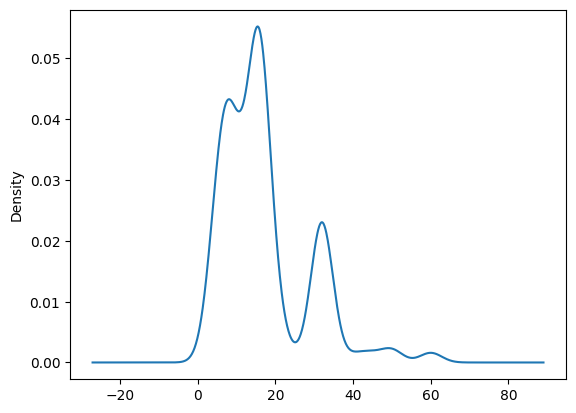

In [723]:
df['primary_camera_front'].plot(kind = 'kde')

<AxesSubplot: ylabel='count'>

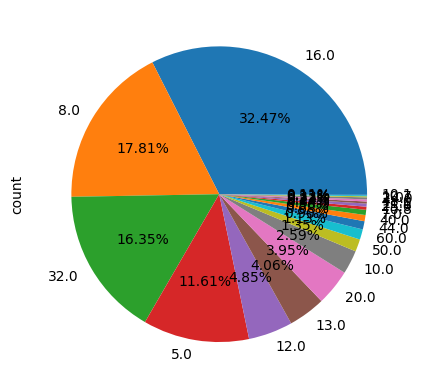

In [724]:
df['primary_camera_front'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')

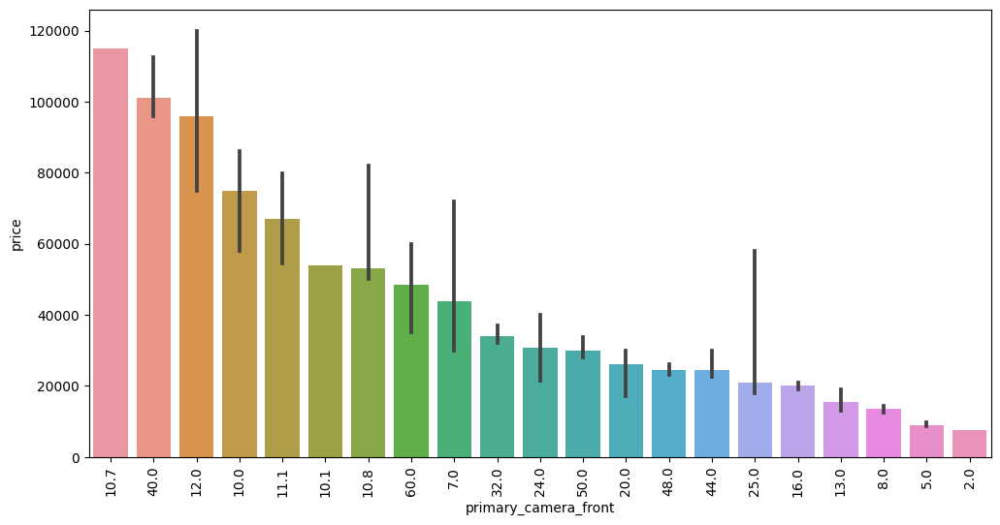

In [573]:
# 21 x 2
# primary camera front x price
pcf_order = temp_df.groupby('primary_camera_front')['price'].median().sort_values(ascending = False).index.tolist()

plt.figure(figsize = (12,6))
sns.barplot(data = temp_df,x = 'primary_camera_front',y = 'price',estimator = np.median, order = pcf_order)
plt.xticks(rotation = 'vertical');
# The highest average-priced smartphone is only one phone that is  Huawei Mate Xs 2, priced at 115000, featuring a 10.7MP 
# primary front camera. 
# The second-highest priced smartphone boasts a 40MP primary camera, with all models belonging to Samsung 5G devices. Notably, 
# 83.3% of these smartphones are equipped with 12GB of RAM. Following closely behind is the third-highest priced category, which
# predominantly consists of smartphones with a 12MP primary camera, with 90.70% of them belonging to the Apple brand.

In [ ]:
primary_camera_front x price
    - The highest average-priced smartphone is only one phone that is  Huawei Mate Xs 2, priced at 115000, featuring a 10.7MP 
      primary front camera. 
    - The second-highest priced smartphone boasts a 40MP primary camera, with all models belonging to Samsung 5G devices.
      Notably, 83.3% of these smartphones are equipped with 12GB of RAM. Following closely behind is the third-highest priced 
      category, which predominantly consists of smartphones with a 12MP primary camera, with 90.70% of them belonging to the 
      Apple brand.
    - there is a statistically significant moderate positive monotonic relationship between the primary_camera_front and price
      variables.
    - The Spearman correlation coefficient of approximately 0.561 indicates a moderately strong monotonic relationship between
      the two variables. Since Spearman correlation measures the strength and direction of monotonic association, a value closer 
      to 1 suggests a stronger positive monotonic relationship.

    - The p-value of approximately 1.43×10−741.43×10−74 is extremely small, indicating strong evidence against the null 
      hypothesis, which states that there is no monotonic relationship between the variables. With such a small p-value, we can
      reject the null hypothesis and conclude that there is a significant monotonic relationship between the variables.

      In summary, there is a statistically significant moderate positive monotonic relationship between the variables.
        
primary_camera_front x brand_name
    - 40.0MP which have 2nd highest median and 10.0MP which is 4th highest median models are manufactured only by 'samsung'.
    - 10.7MP highest median price belongs to only one smartphone model that is 'Huawei Mate Xs 2'.
    - 12.0MP 3rd highest median price and 5th highest models populated category in which 90.70% of models belongs to 'apple'.
      followed by 'samsung' with 6.98% reamaining 2.33% belongs to 'google' there is not even a single chinese model in this 
      category.
    - 7.0MP which is 9th highest median only belongs to 'apple'.
    - 10.1MP which is 6th highest median and 11.1MP 5th which is  highest median price only belongs to 'google'.
    - 10.8MP have 7th highest median price eventhough it has only 3 models 2 of them belongs to 'google' and the remaining one 
      belongs to 'apple'.
    - except apple and google remaining all brands have models with 16.0MP primary camera front even though it's median is in 
      17th place still it has 32.47% models comes under this category which makes it number one category with highest models 
      count.
    - except apple remaining all brands have models with 8.0MP primary camera front even though it's median is in 19th
      place still it has 17.81% models comes under this category which makes it number two category with highest models count.
    - except apple and google remaining all brands have models with 32.0MP primary camera front even though it's median is in 
      10th place and in 3rd place from least still it has 16.35% models comes under this category which makes it 3rd category
      with highest models count.
    - except apple and google remaining all brands have models with 5.0MP primary camera front even though it's median is in 
      20th place and in 2nd place from least still it has 11.61% models comes under this category which makes it number 4th 
      category with highest models count.
    - almost all brands are present in 16.0MP followed by 8.0MP after these two and abit less densed is 32.0MP followed by 5.0MP
      these four are the only properly visible bars.
    - the Chi-Square Test strongly suggests that there's a non-random association between a phone's front camera 
      megapixel count and the brand name. This means that the distribution of brands is not uniform across different front 
      camera resolutions. There might be brands that tend to focus on phones with higher or lower front camera megapixel 
      counts.
    - The Cramer's V test confirms that there's a statistically significant association between a phone's number of rear
      cameras and the brand name. The strength of this association is weak to moderate, which means that some brands may tend
      to focus on phones with a specific number of rear cameras, but there's still a variety of configurations across brands.

primary_camera_front x os
    - there are only four categories in primary camera front. 84.78% of iOS models are equipped with 12.0MP primary rear camera
      followed by 7.0MP with 10.87% and remaining are equally distributed among 13.0MP and 10.8MP models.
    - 83.06% Android models are distributed among 4 categories they are 16.0MP with 34.70 %, 8.0MP with 18.98%, 32.0MP with 
      17.05% and 5.0MP with 12.33%.

<AxesSubplot: ylabel='count'>

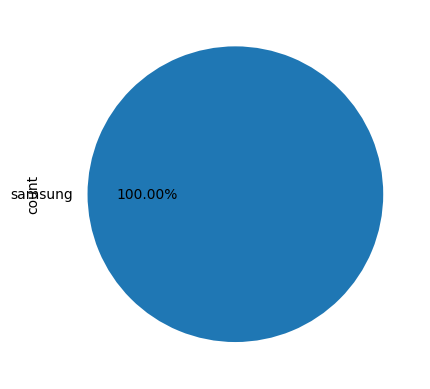

In [574]:
df.loc[df['primary_camera_front'] == 40,'brand_name'].value_counts().plot(kind = 'pie',autopct = '%.2f%%')

In [575]:
df[df['model'] == 'Huawei Mate Xs 2']

,brand_name,model,price,rating,has_5g,has_nfc,has_ir_blaster,processor_brand,num_cores,processor_speed,...,refresh_rate,screen_size,resolution,num_rear_cameras,num_front_cameras,primary_camera_rear,primary_camera_front,extended_memory_available,extended_upto,os
704,huawei,Huawei Mate Xs 2,115000,89.0,False,True,True,snapdragon,8.0,2.84,...,120,7.8,2200 x 2480,3,1.0,50.0,10.7,1,256.0,NaN


In [576]:
pd.reset_option('display.max_columns',None)

In [577]:
df.groupby('primary_camera_front')['price'].describe().sort_values(by = '50%')

,count,mean,std,min,25%,50%,75%,max
primary_camera_front,,,,,,,,
2.0,1.0,7499.000000,NaN,7499.0,7499.00,7499.0,7499.00,7499.0
5.0,103.0,9765.737864,3328.780210,3499.0,7499.00,8999.0,11499.00,25000.0
8.0,158.0,14556.411392,5668.270147,6249.0,10999.00,13636.5,15999.00,40480.0
13.0,36.0,24920.777778,24274.679675,9990.0,11999.00,15394.5,21874.00,99990.0
16.0,288.0,24202.534722,15670.675226,9499.0,15990.00,19990.0,26990.00,134999.0
25.0,3.0,32326.333333,22283.724113,17990.0,19490.00,20990.0,39494.50,57999.0
44.0,8.0,25530.500000,4290.639213,19990.0,22950.25,24496.5,27749.75,32999.0
48.0,2.0,24499.000000,2121.320344,22999.0,23749.00,24499.0,25249.00,25999.0
20.0,35.0,32596.885714,24567.548825,11725.0,15749.50,25990.0,39999.00,109990.0


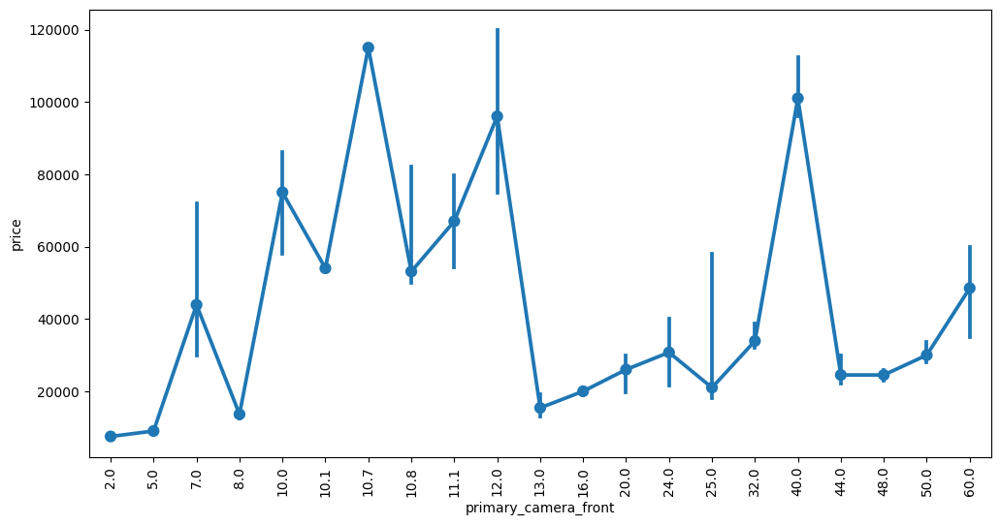

In [578]:
# point plot
plt.figure(figsize = (12,6))
sns.pointplot(data = df, x = 'primary_camera_front', y = 'price',estimator = np.median)
plt.xticks(rotation = 'vertical');


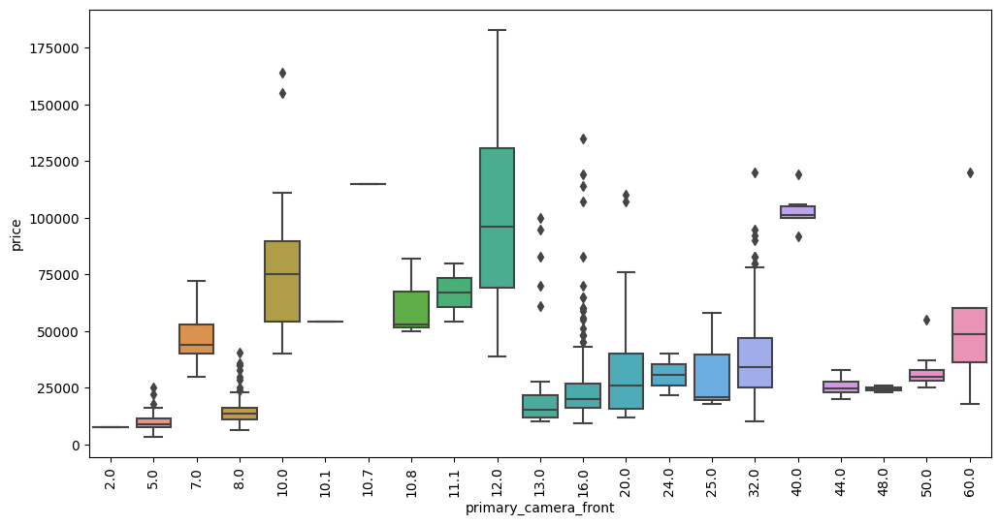

In [579]:
# box plot
plt.figure(figsize = (12,6))
sns.boxplot(data = df, x = 'primary_camera_front', y = 'price')
plt.xticks(rotation = 'vertical');



In [728]:
df.groupby('primary_camera_front')['price'].describe().sort_values(by = '50%')

,count,mean,std,min,25%,50%,75%,max
primary_camera_front,,,,,,,,
2.0,1.0,7499.000000,NaN,7499.0,7499.00,7499.0,7499.00,7499.0
5.0,103.0,9765.737864,3328.780210,3499.0,7499.00,8999.0,11499.00,25000.0
8.0,158.0,14556.411392,5668.270147,6249.0,10999.00,13636.5,15999.00,40480.0
13.0,36.0,24920.777778,24274.679675,9990.0,11999.00,15394.5,21874.00,99990.0
16.0,288.0,24202.534722,15670.675226,9499.0,15990.00,19990.0,26990.00,134999.0
25.0,3.0,32326.333333,22283.724113,17990.0,19490.00,20990.0,39494.50,57999.0
44.0,8.0,25530.500000,4290.639213,19990.0,22950.25,24496.5,27749.75,32999.0
48.0,2.0,24499.000000,2121.320344,22999.0,23749.00,24499.0,25249.00,25999.0
20.0,35.0,32596.885714,24567.548825,11725.0,15749.50,25990.0,39999.00,109990.0


In [581]:
total_price = df['price'].sum()

for brand in df['primary_camera_front'].unique():
    print(brand, 'MP contributes in total price',round(df[df['primary_camera_front'] == brand]['price'].sum()/total_price * 100,2), '%')
    
# - the highest percentage in total price is 25.52% for 16.0MP which is a category with highest number of models.Followed by 
# 20.85% for 32.0MP. The third highest is 16.01% for 12.0MP which is third highest median price. Fourth one is for 8.0MP
# which cotributes to 8.42%. all of these 4 categories adds upto 70.8%
# - eventhough highest median price is for 10.7MP it contributes to 0.42%. eventhough second highest median price is for 
# 40.0MP it contributes to 2.27%.

16.0 MP contributes in total price 25.52 %
13.0 MP contributes in total price 3.28 %
8.0 MP contributes in total price 8.42 %
12.0 MP contributes in total price 16.01 %
32.0 MP contributes in total price 20.85 %
5.0 MP contributes in total price 3.68 %
50.0 MP contributes in total price 1.42 %
40.0 MP contributes in total price 2.27 %
nan MP contributes in total price 0.0 %
10.0 MP contributes in total price 6.56 %
60.0 MP contributes in total price 1.9 %
7.0 MP contributes in total price 0.87 %
10.8 MP contributes in total price 0.68 %
20.0 MP contributes in total price 4.18 %
44.0 MP contributes in total price 0.75 %
11.1 MP contributes in total price 0.49 %
48.0 MP contributes in total price 0.18 %
2.0 MP contributes in total price 0.03 %
25.0 MP contributes in total price 0.36 %
10.7 MP contributes in total price 0.42 %
10.1 MP contributes in total price 0.2 %
24.0 MP contributes in total price 0.23 %


In [582]:
p_df = df[~df['primary_camera_front'].isnull()]

spearman_corr, p_value = stats.spearmanr(p_df['primary_camera_front'], p_df['price'])

print("Spearman correlation coefficient:", spearman_corr)
print("p-value:", p_value)

# - The Spearman correlation coefficient of approximately 0.561 indicates a moderately strong monotonic relationship between
#   the two variables. Since Spearman correlation measures the strength and direction of monotonic association, a value closer 
#   to 1 suggests a stronger positive monotonic relationship.

# - The p-value of approximately 1.43×10−741.43×10−74 is extremely small, indicating strong evidence against the null 
#   hypothesis, which states that there is no monotonic relationship between the variables. With such a small p-value, we can
#   reject the null hypothesis and conclude that there is a significant monotonic relationship between the variables.

# In summary, there is a statistically significant moderate positive monotonic relationship between the variables.

Spearman correlation coefficient: 0.5606681410097697
p-value: 1.4265016119770884e-74


In [583]:
df[~df['primary_camera_front'].isnull()].count()

brand_name                   887
model                        887
price                        887
rating                       814
has_5g                       887
has_nfc                      887
has_ir_blaster               887
processor_brand              874
num_cores                    881
processor_speed              847
ram_capacity                 887
internal_memory              887
fast_charging_available      887
fast_charging                717
battery_capacity             876
refresh_rate                 887
screen_size                  887
resolution                   887
num_rear_cameras             887
num_front_cameras            887
primary_camera_rear          887
primary_camera_front         887
extended_memory_available    887
extended_upto                467
os                           881
dtype: int64

In [584]:
import scikit_posthocs as sp

# Get the groups for Dunn's test
groups = [group['price'].values for name, group in df.groupby('primary_camera_front')]

# Perform Dunn's test
dunn_results = sp.posthoc_dunn(groups)

# Print the Dunn's test results
print("Dunn's test results:")
print(dunn_results)

# - The output of Dunn's test provides a matrix of p-values, indicating the significance of differences between each pair of 
# groups for the variable price across different levels of primary_camera_front.

# - Each cell in the matrix represents the p-value for the comparison between the group corresponding to the row and the group 
# corresponding to the column.

# For example:

#     - The p-value in row 1, column 2 is 0.783060, indicating that there is no significant difference in price between the 
#       group represented by level 1 of primary_camera_front and the group represented by level 2.
#     - The p-value in row 1, column 3 is 0.013495, suggesting a significant difference in price between the group represented
#       by level 1 of primary_camera_front and the group represented by level 3.

# - You can interpret the p-values to determine which pairwise comparisons are statistically significant. Typically, if the 
# p-value is less than a chosen significance level (e.g., 0.05), you would reject the null hypothesis and conclude that there 
# is a significant difference between the groups being compared.

# - In this case, you can see that several comparisons have p-values below 0.05, indicating significant differences in price 
# between those groups.

Dunn's test results:
          1             2             3             4             5   \
1   1.000000  7.830601e-01  1.349516e-02  4.006071e-01  3.180643e-03   
2   0.783060  1.000000e+00  1.124288e-07  7.695061e-06  1.785054e-32   
3   0.013495  1.124288e-07  1.000000e+00  4.105537e-05  5.339082e-01   
4   0.400607  7.695061e-06  4.105537e-05  1.000000e+00  2.402724e-22   
5   0.003181  1.785054e-32  5.339082e-01  2.402724e-22  1.000000e+00   
6   0.042491  9.884918e-03  8.818779e-01  4.344406e-02  8.877631e-01   
7   0.021652  3.110181e-03  6.211451e-01  1.653663e-02  8.184638e-01   
8   0.011108  5.793663e-06  7.570983e-01  3.380939e-04  8.949356e-01   
9   0.014763  1.476218e-04  7.379932e-01  2.599481e-03  9.707096e-01   
10  0.001950  8.723954e-56  3.658224e-01  1.878674e-40  6.412978e-01   
11  0.201694  1.470224e-07  3.093715e-03  1.456915e-02  1.202863e-10   
12  0.103001  3.206640e-32  1.738077e-02  1.454237e-15  1.913084e-10   
13  0.063399  2.236922e-16  8.498256e-02  2

In [585]:
# 21 x 0
# primary_camera_front x brand_name

# contingency table
pd.crosstab(df['primary_camera_front'],df['brand_name'])

# - 40.0MP which have 2nd highest median and 10.0MP which is 4th highest median models are manufactured only by 'samsung'.
# - 10.7MP highest median price belongs to only one smartphone model that is 'Huawei Mate Xs 2'.
# - 12.0MP 3rd highest median price and 5th highest models populated category in which 90.70% of models belongs to 'apple'.
#   followed by 'samsung' with 6.98% reamaining 2.33% belongs to 'google' there is not even a single chinese model in this 
#   category.
# - 7.0MP which is 9th highest median only belongs to 'apple'.
# - 10.1MP which is 6th highest median and 11.1MP 5th which is  highest median price only belongs to 'google'.
# - 10.8MP have 7th highest median price eventhough it has only 3 models 2 of them belongs to 'google' and the remaining one 
#   belongs to 'apple'.
# - except apple and google remaining all brands have models with 16.0MP primary camera front even though it's median is in 17th
#   place still it has 32.47% models comes under this category which makes it number one category with highest models count.
# - except apple remaining all brands have models with 8.0MP primary camera front even though it's median is in 19th
#   place still it has 17.81% models comes under this category which makes it number two category with highest models count.
# - except apple and google remaining all brands have models with 32.0MP primary camera front even though it's median is in 10th
#   place and in 3rd place from least still it has 16.35% models comes under this category which makes it 3rd category with
#   highest models count.
# - except apple and google remaining all brands have models with 5.0MP primary camera front even though it's median is in 20th
#   place and in 2nd place from least still it has 11.61% models comes under this category which makes it number 4th category
#   with highest models count.

brand_name,apple,google,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
primary_camera_front,,,,,,,,,,,,,,,,
2.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
5.0,0,0,2,1,3,0,1,3,0,7,5,20,19,3,13,26
7.0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8.0,0,8,2,1,11,2,7,4,2,19,9,14,27,17,26,9
10.0,0,0,0,0,0,0,0,0,0,0,0,0,23,0,0,0
10.1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10.7,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
10.8,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11.1,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0


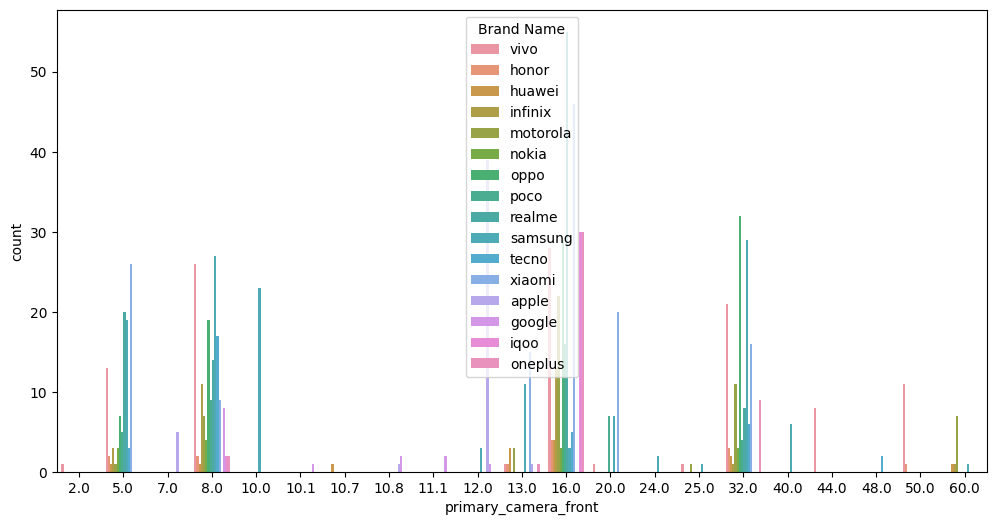

In [586]:
# Clustered Bar Chart
counts = df.groupby(['primary_camera_front', 'brand_name']).size().reset_index(name = 'count')

plt.figure(figsize = (12,6))
sns.barplot(data = counts, x = 'primary_camera_front', y = 'count', hue = 'brand_name')
plt.legend(title = "Brand Name")
plt.show()

# almost all brands are present in 16.0MP followed by 8.0MP after these two and abit less densed is 32.0MP followed by 5.0MP
# these four are the only properly visible bars.

In [587]:
# Chi-Square Test

# Create a contingency table
contingency_table = pd.crosstab(df['primary_camera_front'], df['brand_name'])

# Perform Chi-Square Test of Independence
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)

print("Chi-Square Statistic:", chi2)
print("P-value:", p_value)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:", expected)


# The output you provided indicates a statistically significant relationship between the phone's front camera megapixel count 
# and the brand name. Here's a breakdown of the Chi-Square Test results and explanations:

# Chi-Square Statistic: 1967.95597

#     - This value is quite large, suggesting a strong rejection of the null hypothesis. The null hypothesis in this case is 
#       that
#       there's no association between front camera megapixel count and brand name.

# P-value: 1.28537e-242

#     - This incredibly small p-value (much less than 0.05, the common threshold for significance) further confirms that the 
#       observed distribution of phone brands across different front camera resolutions is unlikely to be due to chance.

# Degrees of Freedom: 300

#     - This value represents the number of independent comparisons made in the Chi-Square test (it depends on the dimensions
#       of the contingency table).

# Expected Frequencies:

#     - The expected frequencies table shows what the distribution of phone brands would be if there were no relationship
#       between front camera megapixel count and brand name. The large discrepancies between the observed and expected 
#       frequencies contribute to the high Chi-Square statistic.

#     - Overall, the Chi-Square Test strongly suggests that there's a non-random association between a phone's front camera 
#       megapixel count and the brand name. This means that the distribution of brands is not uniform across different front 
#       camera resolutions. There might be brands that tend to focus on phones with higher or lower front camera megapixel 
#       counts.

Chi-Square Statistic: 1967.9559703018544
P-value: 1.2853704241700541e-242
Degrees of Freedom: 300
Expected Frequencies: [[5.18602029e-02 1.57835400e-02 1.46561443e-02 1.46561443e-02
  3.26944758e-02 3.60766629e-02 5.86245772e-02 1.46561443e-02
  4.73506201e-02 9.80834273e-02 4.62232244e-02 1.09357384e-01
  1.48816234e-01 3.72040586e-02 1.25140924e-01 1.48816234e-01]
 [5.34160090e+00 1.62570462e+00 1.50958286e+00 1.50958286e+00
  3.36753100e+00 3.71589628e+00 6.03833145e+00 1.50958286e+00
  4.87711387e+00 1.01025930e+01 4.76099211e+00 1.12638106e+01
  1.53280722e+01 3.83201804e+00 1.28895152e+01 1.53280722e+01]
 [2.59301015e-01 7.89177001e-02 7.32807215e-02 7.32807215e-02
  1.63472379e-01 1.80383315e-01 2.93122886e-01 7.32807215e-02
  2.36753100e-01 4.90417136e-01 2.31116122e-01 5.46786922e-01
  7.44081172e-01 1.86020293e-01 6.25704622e-01 7.44081172e-01]
 [8.19391206e+00 2.49379932e+00 2.31567080e+00 2.31567080e+00
  5.16572717e+00 5.70011274e+00 9.26268320e+00 2.31567080e+00
  7.48139

In [588]:
# Cramer's V test
contingency_table = pd.crosstab(df['num_rear_cameras'],df['brand_name'])

# Compute Cramer's V
chi2, p_value, _, _ = stats.chi2_contingency(contingency_table)
n = contingency_table.sum().sum()
min_dim = min(contingency_table.shape)
cramers_v = np.sqrt(chi2/(n*(min_dim - 1)))

print("Cramer's V: ",cramers_v)
print("p-value: ",p_value)

# The output you provided indicates a statistically significant relationship between the number of rear cameras and the
# brand name. Here's a breakdown of Cramer's V test results and explanations:

# Cramer's V: 0.297

#     - Cramer's V is a measure of association between two categorical variables. It ranges from 0 to 1, with 0 indicating no
#       association and 1 indicating a perfect association. In this case, a Cramer's V of 0.297 suggests a weak to moderate 
#       association between the number of rear cameras and the brand name.

# P-value: 9.767e-28

#     - The p-value is incredibly small, indicating that the observed association between the number of rear cameras and brand
#       name is statistically significant. This means that the distribution of brands across different numbers of rear cameras
#       is unlikely to be due to chance.

# Interpretation:

#     - The Cramer's V test confirms that there's a statistically significant association between a phone's number of rear
#       cameras and the brand name. The strength of this association is weak to moderate, which means that some brands may tend
#       to focus on phones with a specific number of rear cameras, but there's still a variety of configurations across brands.

Cramer's V:  0.29736818471910337
p-value:  9.76766834857627e-28


In [589]:
# 21 x 24
# primary_camera_front x os

pd.crosstab(df['primary_camera_front'],df['os'])

os,Android,Other,iOS
primary_camera_front,,,
2.0,1,0,0
5.0,102,1,0
7.0,0,0,5
8.0,157,1,0
10.0,21,0,0
10.1,1,0,0
10.8,2,0,1
11.1,2,0,0
12.0,4,0,39


<AxesSubplot: ylabel='count'>

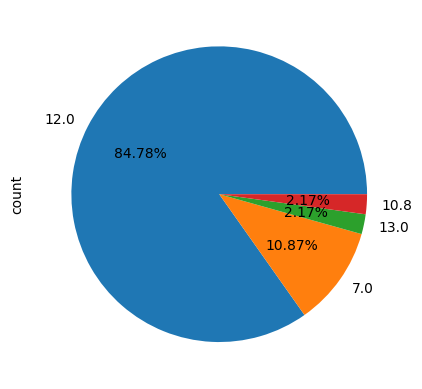

In [590]:
# iOS
df[df['os'] == 'iOS']['primary_camera_front'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')

# there are only four categories in primary camera front. 84.78% of iOS models are equipped with 12.0MP primary rear camera
# followed by 7.0MP with 10.87% and remaining are equally distributed among 13.0MP and 10.8MP models.

<AxesSubplot: ylabel='count'>

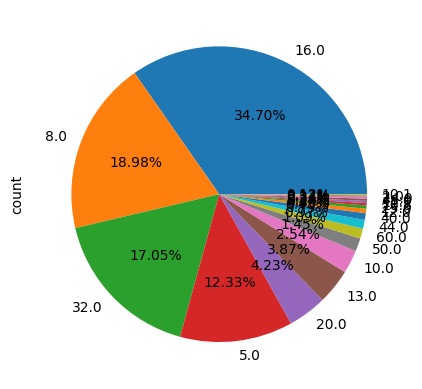

In [591]:
# Android
df[df['os'] == 'Android']['primary_camera_front'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')

# 83.06% Android models are distributed among 4 categories they are 16.0MP with 34.70 %, 8.0MP with 18.98%, 32.0MP with 17.05%
# and 5.0MP with 12.33%.

<AxesSubplot: xlabel='extended_memory_available', ylabel='price'>

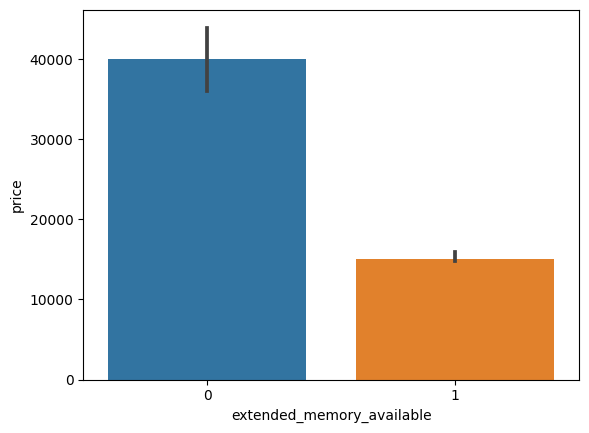

In [592]:
# 22 x 2
# extended memory avilable x price
sns.barplot(data = df,x = 'extended_memory_available', y = 'price',estimator = np.median)
# Smartphones with absence of extended memory feature have 166.68% higher average price than the ones which have

- median price for smartphone without feature higher than the one with
- skew = 5 for distribution with feature and skew = 1.5 for distribution without feature are right skewed with numerous 
  outliers
- here is a statistically significant strong negative monotonic relationship between the availability of extended memory and 
  the price of smartphones. This suggests that smartphones with extended memory available tend to have lower prices on average.
- the std of distribution without extended_memory feature is more than the one with it.
- for both distributions mean and median are not similar.
- even though models in distribution with extended_memory feature are more in number. yet price range and quartile price of
  distribution without feature is costlier than the one with feature.
- IQR price without feature 28621.75 - 64974.25.
- IQR price with feature  11499.00  - 19999.00.
- neither google nor apple have even a single smartphone with extended_memory feature
- infinix,nokia which have each and every model with extended_memory feature
- percentage of samrtphone brands with more models having 5g feature:  68.75
- Total number of Android models with extended_memory feature:  67.67 %
- Total number of iOS models with extended_memory feature:  0.0 %

In [593]:
df.groupby('extended_memory_available')['price'].median().sort_values(ascending = False)

extended_memory_available
0    39999.0
1    14999.0
Name: price, dtype: float64

<AxesSubplot: xlabel='extended_memory_available', ylabel='price'>

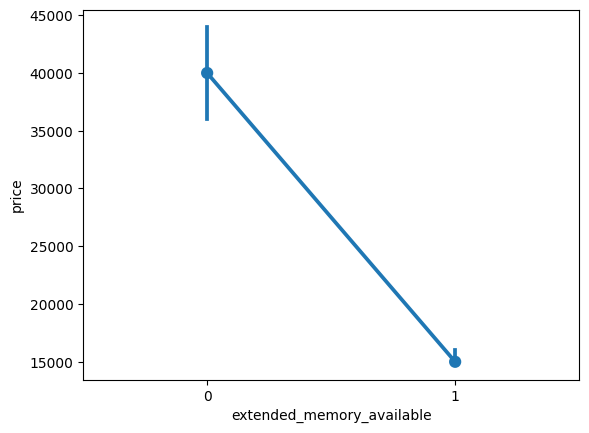

In [594]:
# pointplot:
sns.pointplot(data = df,x = 'extended_memory_available',y = 'price',estimator = np.median)
# median price for smartphone without feature higher than the one with

<AxesSubplot: xlabel='extended_memory_available', ylabel='price'>

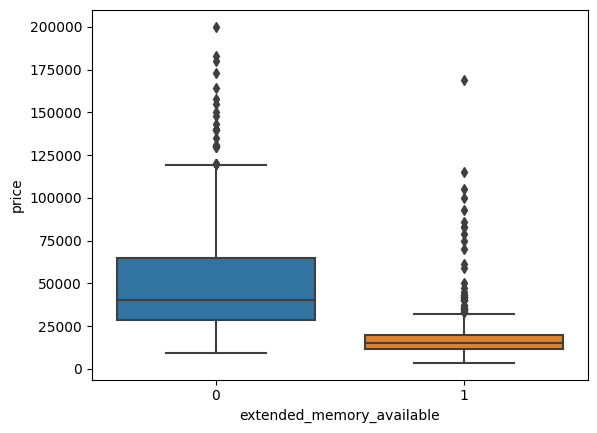

In [595]:
# boxplot:
sns.boxplot(data = df, x = 'extended_memory_available', y = 'price')


<AxesSubplot: xlabel='extended_memory_available', ylabel='price'>

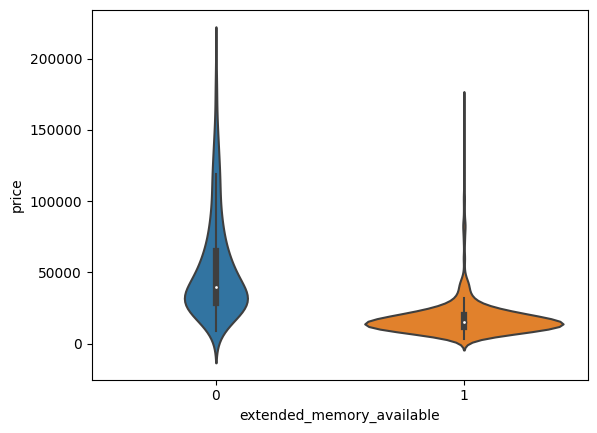

In [596]:
# violinplot:
sns.violinplot(data = df, x = 'extended_memory_available', y = 'price')


In [597]:
df['extended_memory_available'].value_counts()

extended_memory_available
1    568
0    322
Name: count, dtype: int64

<AxesSubplot: xlabel='extended_memory_available', ylabel='price'>

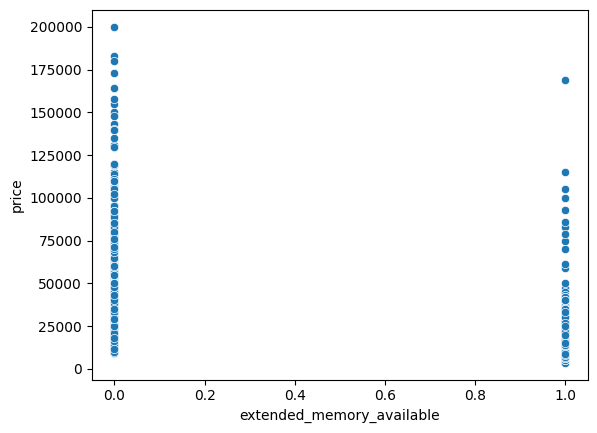

In [598]:
# scatterplot:
sns.scatterplot(data = df, x = 'extended_memory_available', y = 'price')


C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


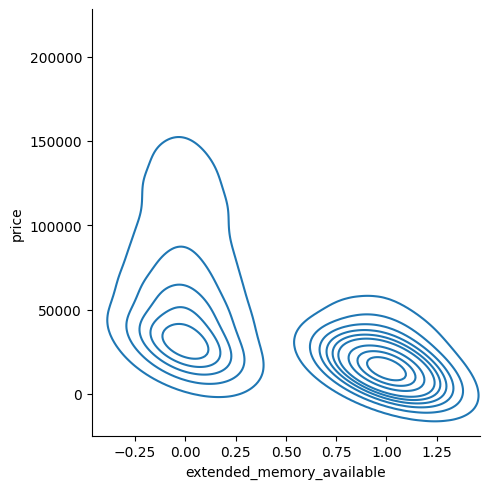

In [599]:
# 2D kdeplot:
sns.displot(kind = 'kde', data = df, x = 'extended_memory_available', y = 'price')
# the distribution of plot with extended_memory feature prices are more concentrated around its median compared to without 
# distribution.

5.000603876365932

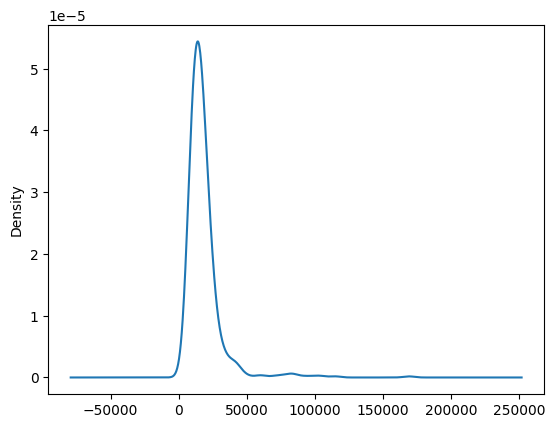

In [600]:
# 1D kdeplot:
df[df['extended_memory_available'] == True]['price'].plot(kind = 'kde')
df[df['extended_memory_available'] == True]['price'].skew()

1.5808447395140737

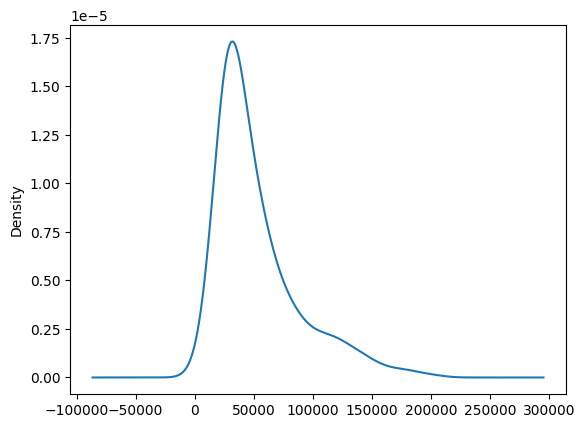

In [601]:
# 1D kdeplot:
df[df['extended_memory_available'] == False]['price'].plot(kind = 'kde')
df[df['extended_memory_available'] == False]['price'].skew()

-0.5761902716706577

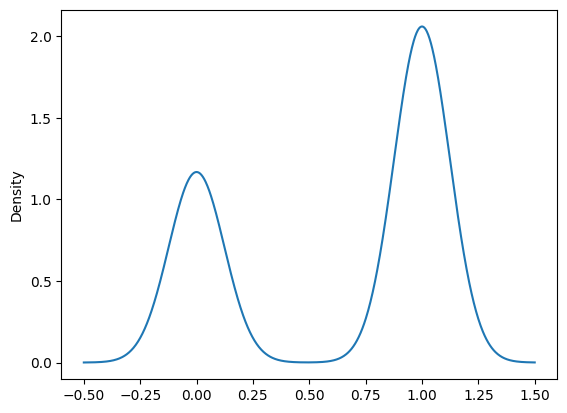

In [602]:
df['extended_memory_available'].plot(kind = 'kde')
df['extended_memory_available'].skew()

In [603]:
spearman_corr, p_value = stats.spearmanr(df['extended_memory_available'],df['price'])
print("Spearman Correlation Coefficient: ", spearman_corr)
print("P-value", p_value)

# The Spearman correlation coefficient you obtained is approximately -0.692, and the associated p-value is very close to zero 
# (6.10e-128). Let's interpret these results:

#     Spearman Correlation Coefficient:
#         - The Spearman correlation coefficient measures the strength and direction of the monotonic relationship between two 
#           variables.
#         - In your case, a Spearman correlation coefficient of approximately -0.692 indicates a strong negative monotonic 
#           relationship between "extended_memory_available" (binary) and "price" (continuous) variables.

#     Interpretation:
#         - A negative coefficient suggests that as the availability of extended memory increases (from 0 to 1), the price tends
#           to decrease.
#         - This suggests that smartphones with extended memory available may have lower prices on average compared to those
#           without extended memory available.

#     P-value:
#         - The p-value associated with the test tells us about the statistical significance of the observed correlation 
#           coefficient.
#         - In your case, the p-value is very close to zero (6.10e-128), which is significantly smaller than the conventional 
#           significance level of 0.05.
#         - This suggests strong evidence against the null hypothesis (that there is no correlation between the variables), 
#           indicating that the observed correlation is statistically significant.

# Based on these results, you can conclude that there is a statistically significant strong negative monotonic relationship
# between the availability of extended memory and the price of smartphones. This suggests that smartphones with extended memory 
# available tend to have lower prices on average.

Spearman Correlation Coefficient:  -0.692249638499303
P-value 6.098073303338923e-128


In [604]:
# summary statistics:
df.groupby('extended_memory_available')['price'].describe()
# the std of distribution without extended_memory feature is more than the one with it
# for both distributions mean and median are not similar
# even though models in distribution with extended_memory feature are more in number. yet price range and quartile price of 
# distribution without feature is costlier than the one with feature
# IQR price without feature 28621.75 - 64974.25
# IQR price with feature  11499.00  - 19999.00

,count,mean,std,min,25%,50%,75%,max
extended_memory_available,,,,,,,,
0,322.0,52695.863354,35397.201984,8990.0,28621.75,39999.0,64974.25,199990.0
1,568.0,18216.271127,13945.805248,3499.0,11499.00,14999.0,19999.00,169000.0


In [605]:
# 22 x 0
# extended_memory_available x brand_name
# contingency table
pd.crosstab(df['extended_memory_available'],df['brand_name'])


brand_name,apple,google,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
extended_memory_available,,,,,,,,,,,,,,,,
0,46,14,9,3,0,22,20,0,29,28,13,24,26,9,33,46
1,0,0,4,11,29,10,32,13,13,60,28,73,106,24,78,87


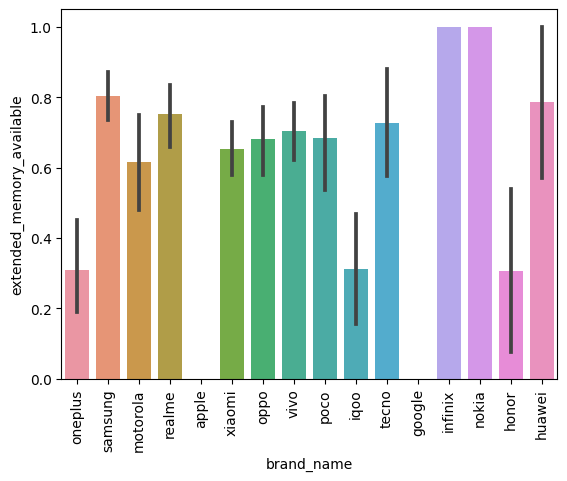

In [606]:
# bar plot
sns.barplot(data = df, x = 'brand_name', y = 'extended_memory_available')
plt.xticks(rotation = 'vertical');


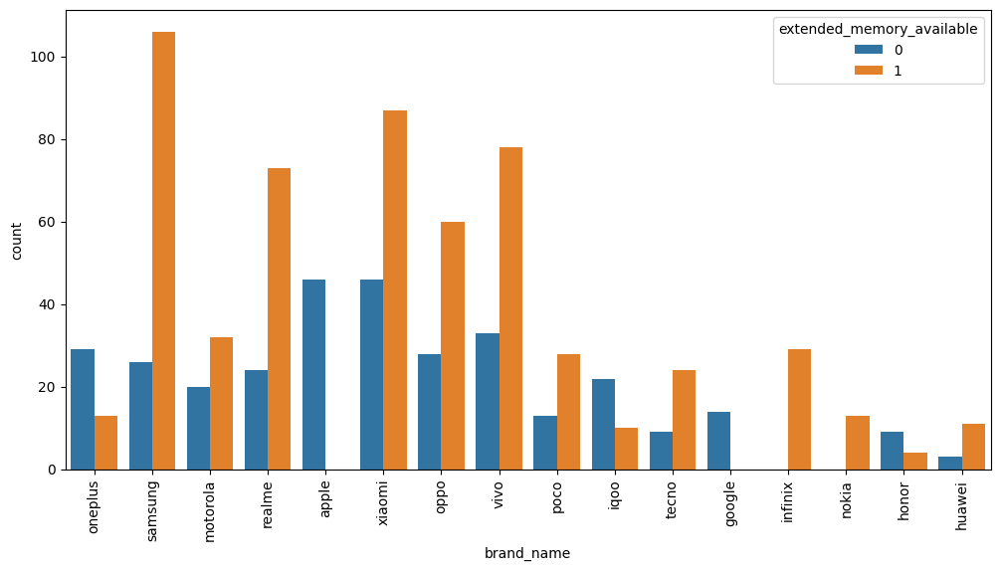

In [607]:
# count plot
plt.figure(figsize = (12,6))
sns.countplot(data = df, x = 'brand_name', hue = 'extended_memory_available')
plt.xticks(rotation = 'vertical');


In [608]:
df.groupby('brand_name')['extended_memory_available'].value_counts()
# only False apple,google
# only True infinix,nokia

brand_name  extended_memory_available
apple       0                             46
google      0                             14
honor       0                              9
            1                              4
huawei      1                             11
            0                              3
infinix     1                             29
iqoo        0                             22
            1                             10
motorola    1                             32
            0                             20
nokia       1                             13
oneplus     0                             29
            1                             13
oppo        1                             60
            0                             28
poco        1                             28
            0                             13
realme      1                             73
            0                             24
samsung     1                            106
            0    

In [729]:
f_df = df[~(df['brand_name'].isin(['apple','google','nokia','infinix']))]
true_count = []
false_count = []

for i, j in f_df.groupby('brand_name')['extended_memory_available'].value_counts().items():
    if True in i:
        true_count.append((i, j))
    else:
        false_count.append((i, j))
     

    
greater_true = 0
greater_false = 0
for a in range(len(true_count)):
    if true_count[a][1] > false_count[a][1]:
        greater_true += 1
    else:
        greater_false += 1
print(greater_true)
print(greater_false)
    
print('percentage of samrtphone brands have more models with extended memory available feature: ',(greater_true+2)/len(df['brand_name'].unique())*100)
# +2 is for infinix,nokia which have models on with extended_memory feature


9
3
percentage of samrtphone brands with more models having extended memory available feature:  68.75


<AxesSubplot: ylabel='count'>

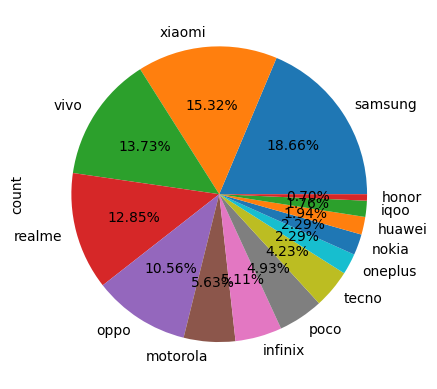

In [610]:
df[df['extended_memory_available'] == True]['brand_name'].value_counts().plot(kind = 'pie',autopct = '%.2f%%')
# in smartphone models with extended memory available feature 'samsung' have 18.66% followed by 'xiaomi' with 15.32% followed by
# 'vivo' with 13.73% followed by 'realme' with 12.85% followed by 'oppo' with 10.56% all of these percentages adds upto 71.12%.

In [611]:
# 22 x 24
# extended_memory_available x os
pd.crosstab(df['extended_memory_available'],df['os'])
# in iOS smartphones there is not even a single model with extended memory feature


os,Android,Other,iOS
extended_memory_available,,,
0,268,3,46
1,561,5,0


In [612]:
# Total number of Android models with extended_memory feature:  67.67 %

an_feature = df[(df['extended_memory_available']==True)&(df['os'] == 'Android')]['extended_memory_available'].count()
to_an = df[df['os'] == 'Android']['brand_name'].count()
print("Total number of Android models with extended_memory feature: ",round(an_feature/to_an * 100,2),'%')

Total number of Android models with extended_memory feature:  67.67 %


In [613]:
# Total number of iOS models with extended_memory feature:  0.0 %

an_feature = df[(df['extended_memory_available']==True)&(df['os'] == 'iOS')]['extended_memory_available'].count()
to_an = df[df['os'] == 'iOS']['brand_name'].count()
print("Total number of iOS models with extended_memory feature: ",round(an_feature/to_an * 100,2),'%')

Total number of iOS models with extended_memory feature:  0.0 %


In [614]:
df[df['extended_memory_available']==True]['os'].count()

566

<AxesSubplot: xlabel='extended_upto', ylabel='price'>

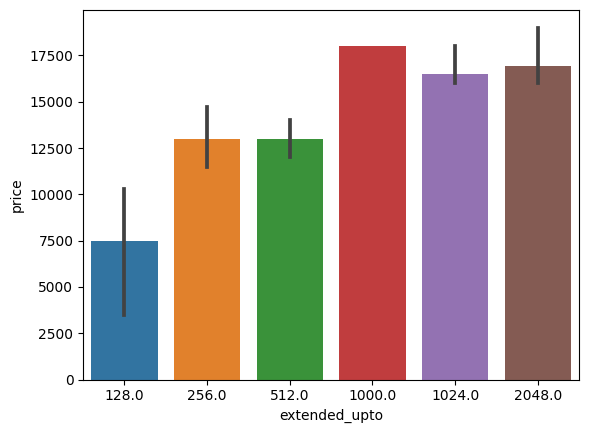

In [615]:
# 23 x 2
# extended upto x price
e_df = df[df['extended_upto']!= 0]
# i imputeded 0 inplace where there is no feature to extend memory

sns.barplot(data = e_df,x = 'extended_upto',y = 'price',estimator = np.median)
# The highest median price, 17990.0, is for smartphones with 1000GB of extended memory. There is only one model in this 
# category, the Nokia X100 5G.
# The second highest median price, 16900.0, is for smartphones with 2048GB of extended memory. There are only 5 models in this 
# category, all belonging to the 'Infinix' brand.
# The third highest median price, 16499.0, is for smartphones with 1024GB of extended memory, which is the most populated 
# category of extended memory available.
# Both 512GB and 256GB have the same median price of 12999.0. There are more models with 512GB than with 256GB.
# The lowest median price, 7499.0, is for smartphones with 128GB of extended memory. There are only 3 models in this category,
# all belonging to Chinese brands.

In [732]:
df.groupby('extended_upto')['price'].describe().sort_values(by = '50%')

,count,mean,std,min,25%,50%,75%,max
extended_upto,,,,,,,,
128.0,3.0,7099.333333,3418.069679,3499.0,5499.0,7499.0,8899.5,10300.0
256.0,95.0,18365.894737,21898.536867,5249.0,9990.0,12999.0,18994.5,169000.0
512.0,111.0,15548.261261,11574.997011,6171.0,10649.0,12999.0,15999.0,92999.0
1024.0,253.0,19546.371542,12880.246876,5299.0,12999.0,16499.0,22494.0,104999.0
2048.0,5.0,17179.200000,1308.380755,15999.0,15999.0,16900.0,17999.0,18999.0
1000.0,1.0,17990.000000,NaN,17990.0,17990.0,17990.0,17990.0,17990.0


In [738]:
df[df['extended_upto'] == 128]

,brand_name,model,price,rating,has_5g,has_nfc,has_ir_blaster,processor_brand,num_cores,processor_speed,...,refresh_rate,screen_size,resolution,num_rear_cameras,num_front_cameras,primary_camera_rear,primary_camera_front,extended_memory_available,extended_upto,os
189,realme,Realme C2s,3499,63.0,False,False,False,helio,8.0,2.0,...,60,6.1,720 x 1560,2,1.0,13.0,5.0,1,128.0,Android
472,vivo,Vivo Y25,7499,NaN,False,False,False,helio,4.0,1.3,...,60,4.5,480 x 854,1,1.0,5.0,2.0,1,128.0,Android
842,xiaomi,Xiaomi Redmi Note 4,10300,65.0,False,False,False,qualcomm,8.0,2.0,...,60,5.5,1080 x 1920,1,1.0,13.0,5.0,1,128.0,Android


<AxesSubplot: xlabel='extended_upto', ylabel='price'>

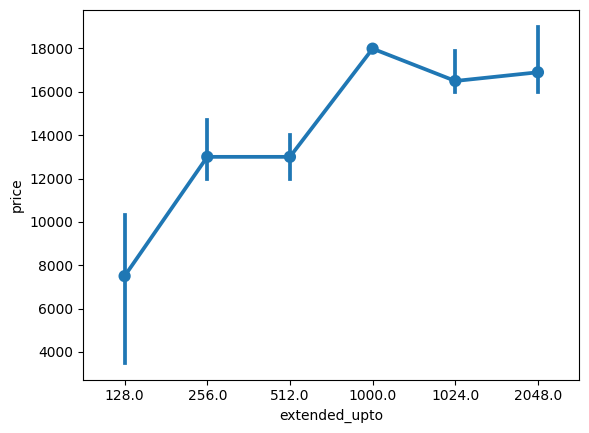

In [617]:
# point plot

sns.pointplot(data = e_df, x = 'extended_upto', y = 'price',estimator = np.median)

<AxesSubplot: xlabel='extended_upto', ylabel='price'>

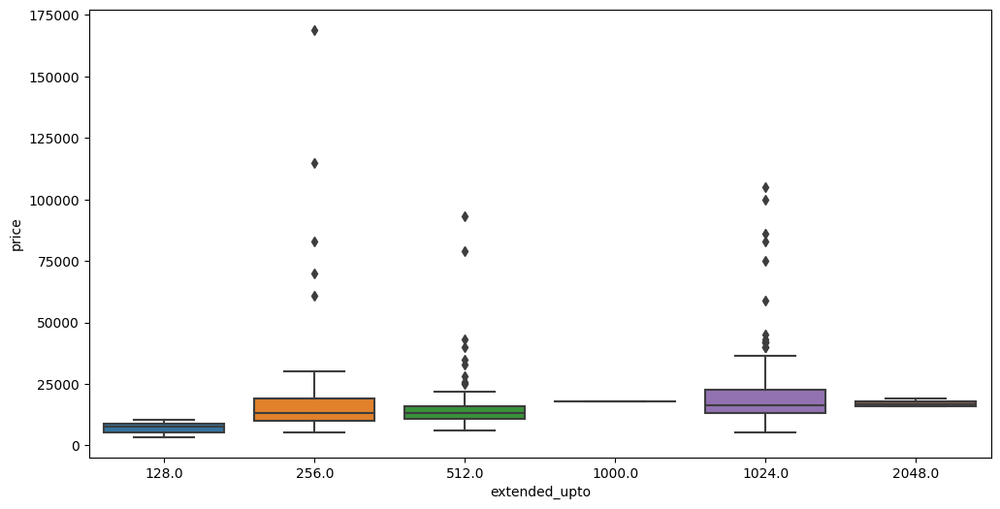

In [618]:
# box plot
plt.figure(figsize = (12,6))
sns.boxplot(data = e_df, x = 'extended_upto', y = 'price')

<AxesSubplot: xlabel='extended_upto', ylabel='price'>

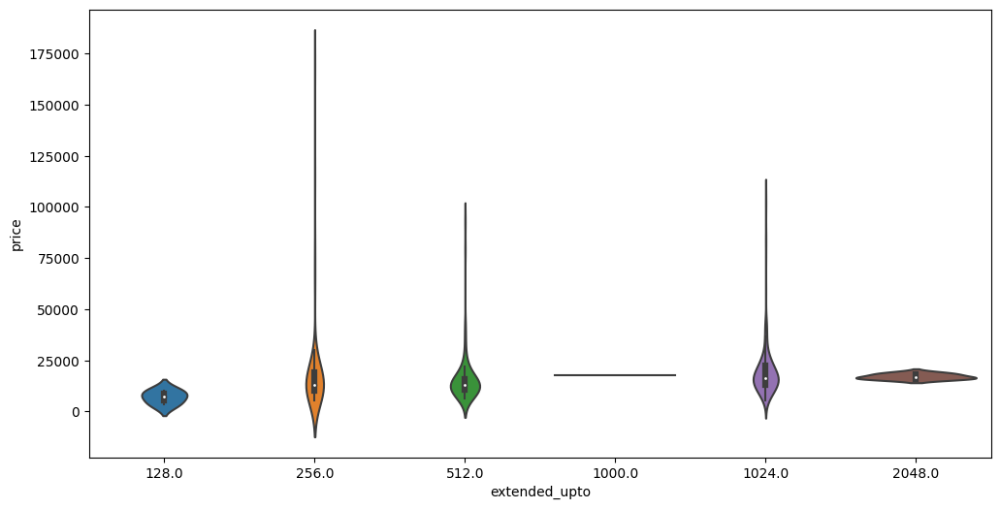

In [619]:
# violin plot
plt.figure(figsize = (12,6))
sns.violinplot(data = e_df, x = 'extended_upto', y = 'price')

skew of 1024.0 MP:  3.730890672064014
skew of 512.0 MP:  4.542462771733552
skew of 256.0 MP:  4.939882209706476
skew of 2048.0 MP:  0.6079592395333868
skew of 128.0 MP:  -0.5189802906555464


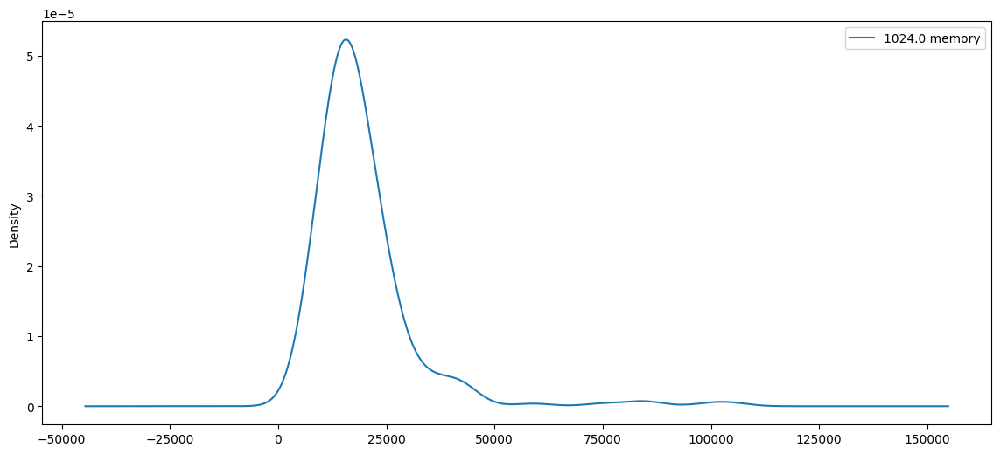

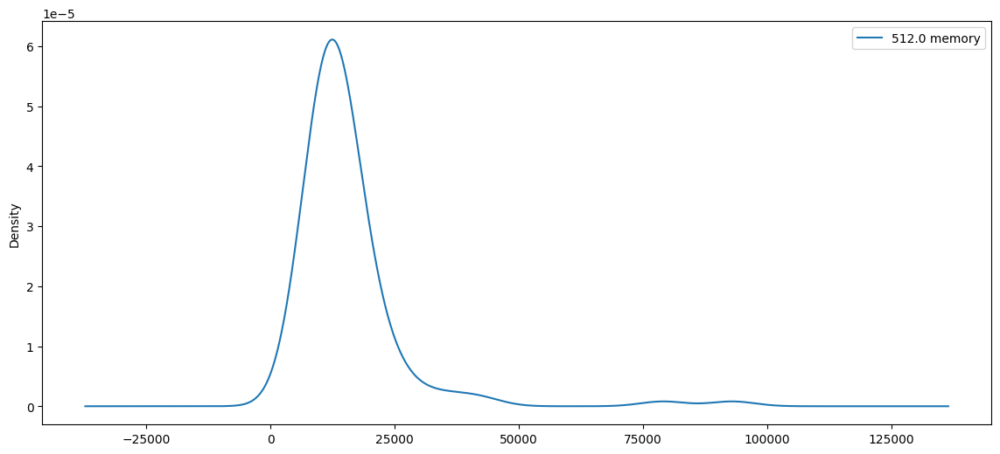

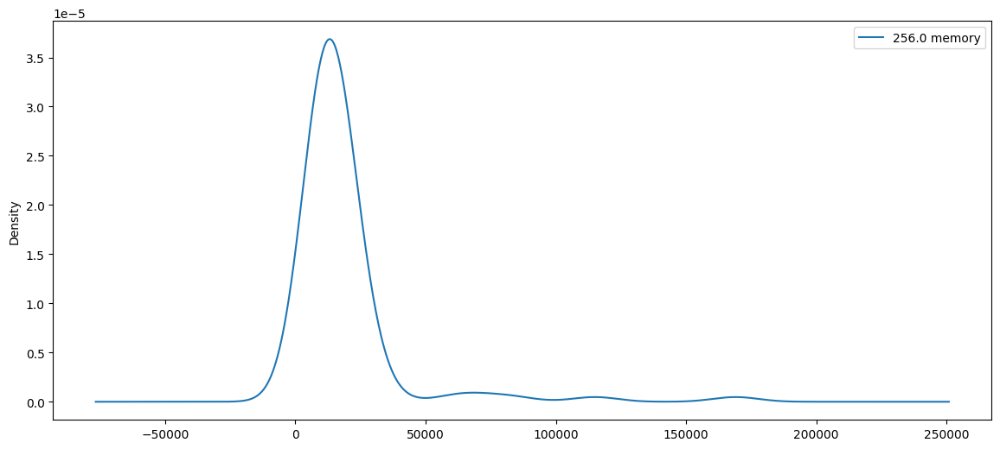

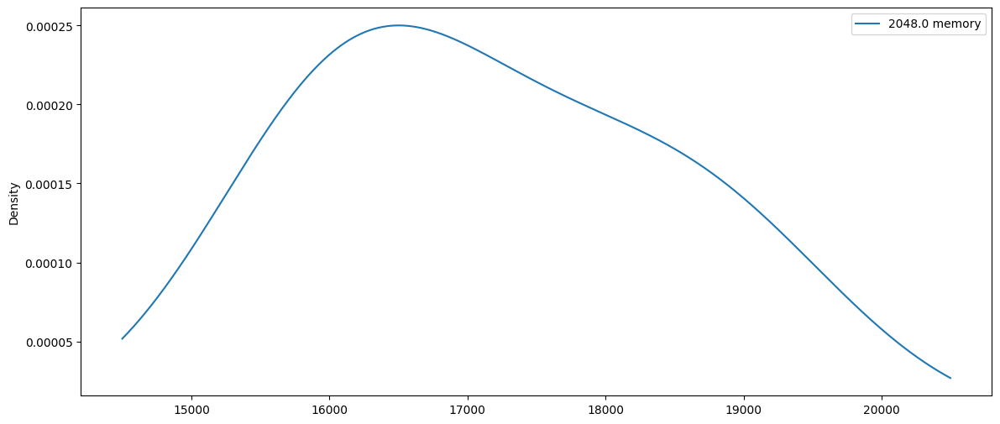

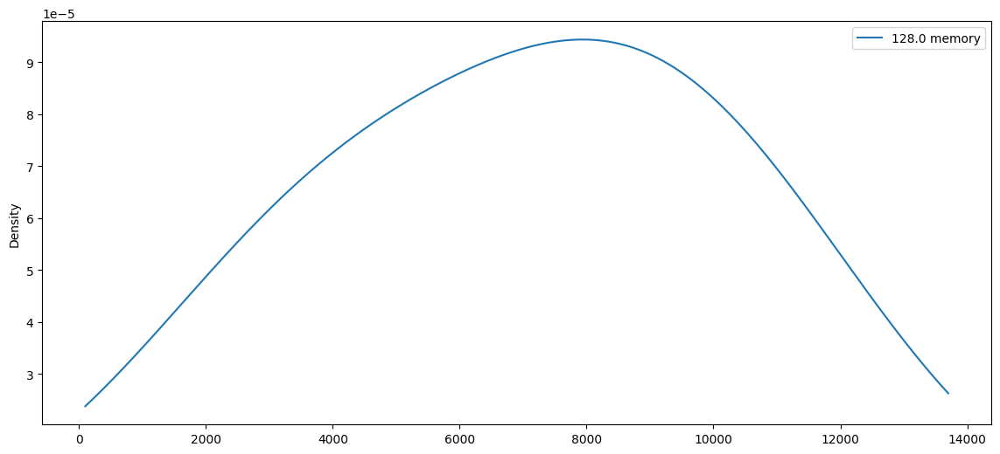

In [620]:
# 1D kde plot
# ... your existing code to create the DataFrame (df) ...
MP = e_df['extended_upto'].value_counts().index.tolist()

for i in MP:
    subset = e_df[e_df['extended_upto'] == i]['price']
    
    # Check if subset has more than one element before plotting
    if not subset.empty and len(subset) > 1:
        plt.figure(figsize=(14, 6))
        subset.plot(kind='kde', label=f'{i} memory')

        # Print skewness only if the subset has more than one element
        print(f'skew of {i} MP: ', subset.skew())
        plt.legend()

# Add legend and display the plot after the loop (assuming all plots fit)
# if len(MP) > 1:  # Check if there's more than one camera count
#     plt.legend()

plt.show()

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<AxesSubplot: xlabel='extended_upto', ylabel='price'>

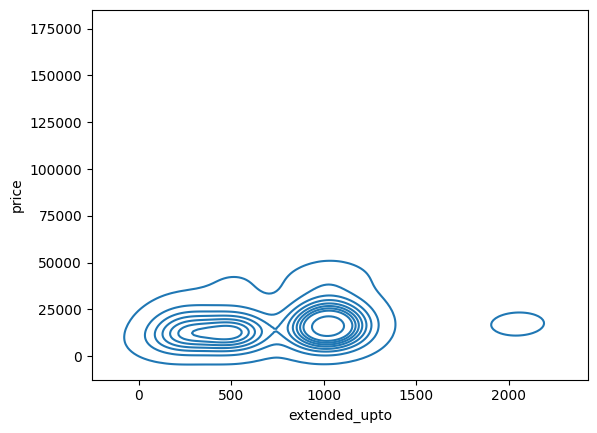

In [621]:
# 2D kde plot
sns.kdeplot(data = e_df, x = 'extended_upto', y = 'price')


In [622]:
em_df = e_df[~e_df['extended_upto'].isnull()]

# Calculate the Spearman rank correlation coefficient and p-value
spearman_corr, p_value = stats.spearmanr(em_df['extended_upto'], em_df['price'])

print("Spearman correlation coefficient:", spearman_corr)
print("p-value:", p_value)

# - The Spearman correlation coefficient of 0.269 suggests a moderate positive monotonic relationship between the variables 
#   extended_upto and price.

# - The p-value being extremely small (3.30e-09) indicates that this correlation is statistically significant, meaning that it
#   is highly unlikely to observe such a strong correlation between these variables in the population if there were truly no
#   relationship between them. Therefore, based on this output, we can conclude that there is a statistically significant,
#   moderate positive monotonic relationship between extended_upto and price.

Spearman correlation coefficient: 0.26911335163703437
p-value: 3.3041816518792453e-09


In [623]:
import scikit_posthocs as sp

# Suppose e_df is your DataFrame containing the relevant columns
# Calculate the groups for Dunn's test
groups = [group['extended_upto'].values for name, group in em_df.groupby('price')]

# Perform Dunn's test
dunn_results = sp.posthoc_dunn(groups)

# Print Dunn's test results
print("Dunn's test results:")
print(dunn_results)

Dunn's test results:
          1         2         3         4         5         6         7    \
1    1.000000  0.777283  0.053132  0.380243  0.777283  0.025548  0.743955   
2    0.777283  1.000000  0.098741  0.552120  1.000000  0.056599  1.000000   
3    0.053132  0.098741  1.000000  0.290785  0.098741  1.000000  0.056599   
4    0.380243  0.552120  0.290785  1.000000  0.552120  0.222530  0.492354   
5    0.777283  1.000000  0.098741  0.552120  1.000000  0.056599  1.000000   
..        ...       ...       ...       ...       ...       ...       ...   
195  0.380243  0.552120  0.290785  1.000000  0.552120  0.222530  0.492354   
196  0.053132  0.098741  1.000000  0.290785  0.098741  1.000000  0.056599   
197  0.053132  0.098741  1.000000  0.290785  0.098741  1.000000  0.056599   
198  0.777283  1.000000  0.098741  0.552120  1.000000  0.056599  1.000000   
199  0.777283  1.000000  0.098741  0.552120  1.000000  0.056599  1.000000   

          8         9         10   ...       190      

In [624]:
df['extended_upto'].info()

<class 'pandas.core.series.Series'>
Index: 890 entries, 0 to 979
Series name: extended_upto
Non-Null Count  Dtype  
--------------  -----  
468 non-null    float64
dtypes: float64(1)
memory usage: 46.2 KB


In [625]:
# 23 x 0
# extended_upto x brand_name
pd.crosstab(df['extended_upto'], df['brand_name'])

brand_name,honor,huawei,infinix,iqoo,motorola,nokia,oneplus,oppo,poco,realme,samsung,tecno,vivo,xiaomi
extended_upto,,,,,,,,,,,,,,
128.0,0,0,0,0,0,0,0,0,0,1,0,0,1,1
256.0,0,7,8,0,1,2,2,20,0,27,0,11,15,2
512.0,0,0,9,0,4,3,1,2,13,0,14,5,1,59
1000.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
1024.0,1,0,2,10,19,1,5,19,14,40,86,3,35,18
2048.0,0,0,5,0,0,0,0,0,0,0,0,0,0,0


In [626]:
# Create a contingency table
contingency_table = pd.crosstab(df['extended_upto'], df['brand_name'])

# Perform the chi-square test
chi2, p_value, _, _ = stats.chi2_contingency(contingency_table)

print("Chi-square statistic:", chi2)
print("p-value:", p_value)

# - The chi-square statistic is 474.18, and the p-value is approximately 1.73e-63. This very low p-value indicates that there 
#   is a statistically significant association between the 'extended_upto' and 'brand_name' variables.

# - Therefore, you can reject the null hypothesis of independence and conclude that there is a significant association between 
#   the two variables.


n = contingency_table.sum().sum()
min_dim = min(contingency_table.shape)
cramers_v = np.sqrt(chi2/(n*(min_dim - 1)))

print("Cramer's V: ",cramers_v)
print("p-value: ",p_value)

# - The Cramer's V statistic is a measure of association between categorical variables in a contingency table. It ranges
#   from 0 to 1, where 0 indicates no association and 1 indicates a perfect association. The p-value associated with 
#   Cramer's V indicates the statistical significance of the association.

# In your output:

#     Cramer's V: 0.4501556570857889
#     p-value: 1.733725827681046e-63

# - This suggests that there is a moderate to strong association between the variables, and the association is statistically 
#   significant given the very low p-value.

Chi-square statistic: 474.1778705188318
p-value: 1.733725827681046e-63
Cramer's V:  0.4501556570857889
p-value:  1.733725827681046e-63


In [627]:
# 23 x 24
# extended_upto x os
pd.crosstab(e_df['extended_upto'],e_df['os'])

os,Android,Other
extended_upto,,
128.0,3,0
256.0,91,2
512.0,111,0
1000.0,1,0
1024.0,253,0
2048.0,5,0


<AxesSubplot: ylabel='count'>

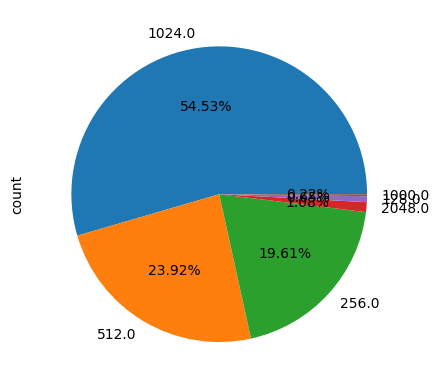

In [628]:
e_df[e_df['os'] == 'Android']['extended_upto'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')

<AxesSubplot: xlabel='os', ylabel='price'>

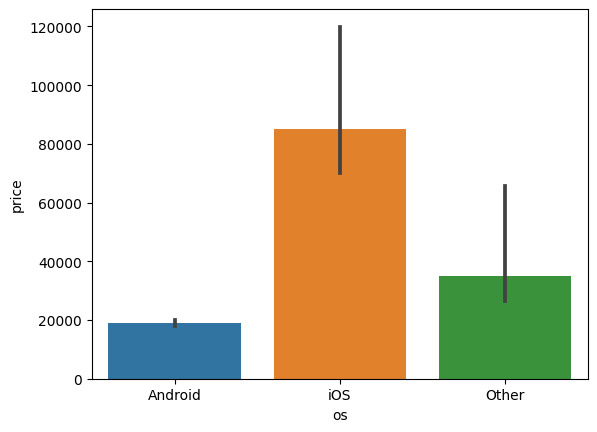

In [629]:
# 24 x 2
# os x price
sns.barplot(data = df,x ='os',y = 'price',estimator = np.median)
# iOS smartphones have the highest average price whereas android has least average price probably because android have wide 
# range priced smartphones where as iOS only have highly priced once

<AxesSubplot: xlabel='os', ylabel='price'>

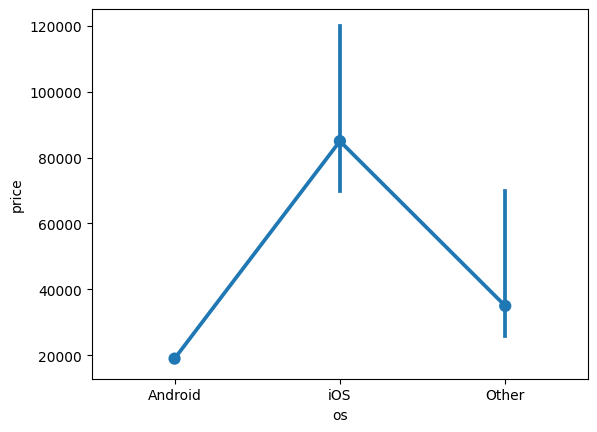

In [630]:
# point plot
sns.pointplot(data = df, x = 'os', y = 'price',estimator = np.median)

<AxesSubplot: xlabel='os', ylabel='price'>

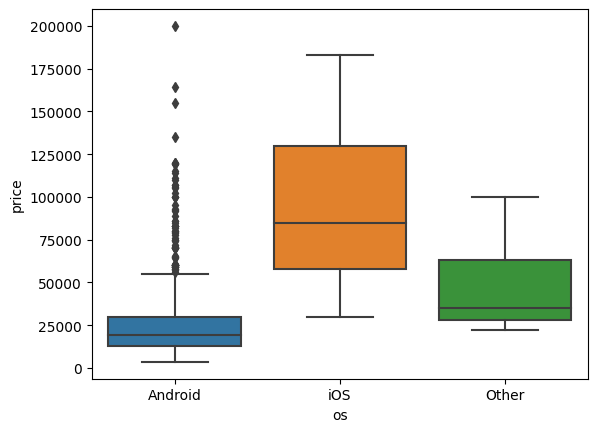

In [631]:
# box plot
sns.boxplot(data = df, x = 'os', y = 'price')

skew of Android MP:  2.779169675897322
skew of iOS MP:  0.33507035632251964
skew of Other MP:  1.1154210092832861


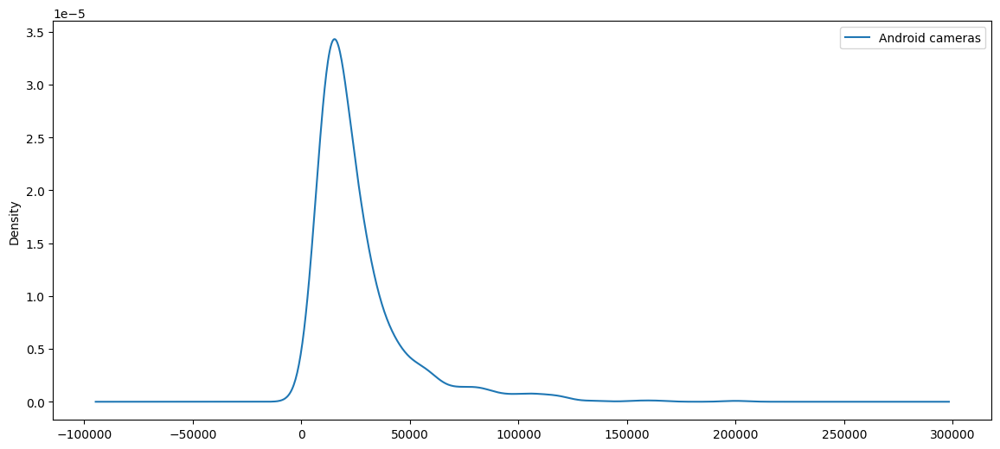

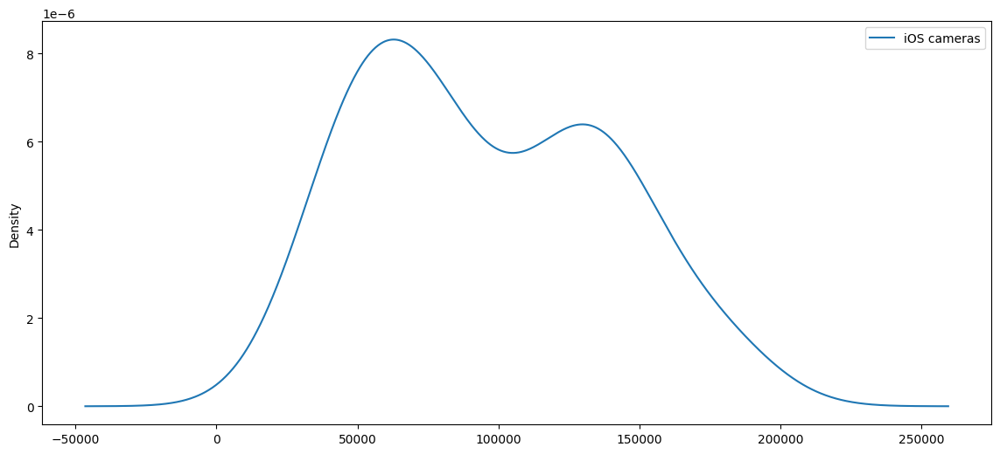

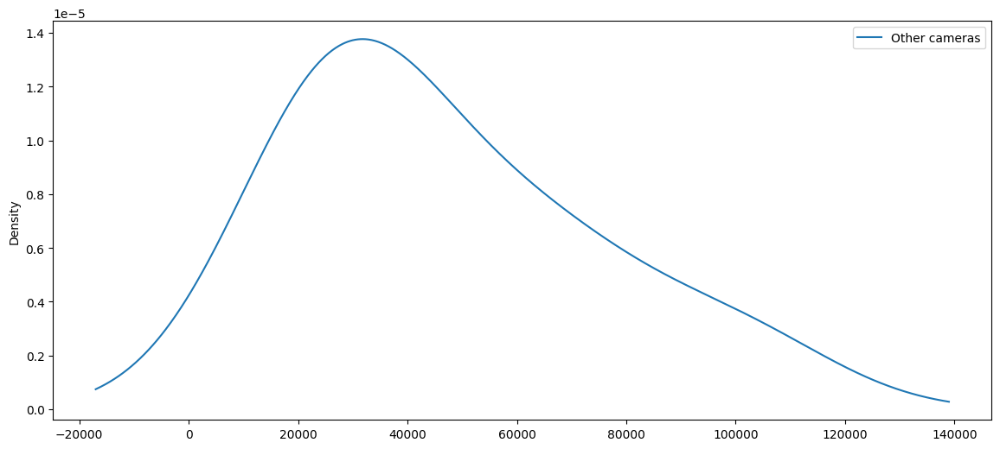

In [633]:
# 1D kde plot

# ... your existing code to create the DataFrame (df) ...
MP = df['os'].value_counts().index.tolist()

for i in MP:
    subset = df[df['os'] == i]['price']
    
    # Check if subset has more than one element before plotting
    if not subset.empty and len(subset) > 1:
        plt.figure(figsize=(14, 6))
        subset.plot(kind='kde', label=f'{i} cameras')

        # Print skewness only if the subset has more than one element
        print(f'skew of {i} MP: ', subset.skew())
        plt.legend()

# Add legend and display the plot after the loop (assuming all plots fit)
# if len(MP) > 1:  # Check if there's more than one camera count
#     plt.legend()

plt.show()

In [634]:
adf = df.copy()

In [635]:
adf.info()

<class 'pandas.core.frame.DataFrame'>
Index: 890 entries, 0 to 979
Data columns (total 25 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   brand_name                 890 non-null    object 
 1   model                      890 non-null    object 
 2   price                      890 non-null    int64  
 3   rating                     814 non-null    float64
 4   has_5g                     890 non-null    bool   
 5   has_nfc                    890 non-null    bool   
 6   has_ir_blaster             890 non-null    bool   
 7   processor_brand            877 non-null    object 
 8   num_cores                  884 non-null    float64
 9   processor_speed            850 non-null    float64
 10  ram_capacity               890 non-null    int64  
 11  internal_memory            890 non-null    int64  
 12  fast_charging_available    890 non-null    int64  
 13  fast_charging              720 non-null    float64
 14 

# Multivariate Analysis


In [636]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 890 entries, 0 to 979
Data columns (total 25 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   brand_name                 890 non-null    object 
 1   model                      890 non-null    object 
 2   price                      890 non-null    int64  
 3   rating                     814 non-null    float64
 4   has_5g                     890 non-null    bool   
 5   has_nfc                    890 non-null    bool   
 6   has_ir_blaster             890 non-null    bool   
 7   processor_brand            877 non-null    object 
 8   num_cores                  884 non-null    float64
 9   processor_speed            850 non-null    float64
 10  ram_capacity               890 non-null    int64  
 11  internal_memory            890 non-null    int64  
 12  fast_charging_available    890 non-null    int64  
 13  fast_charging              720 non-null    float64
 14 

In [637]:
adf.info()

<class 'pandas.core.frame.DataFrame'>
Index: 890 entries, 0 to 979
Data columns (total 25 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   brand_name                 890 non-null    object 
 1   model                      890 non-null    object 
 2   price                      890 non-null    int64  
 3   rating                     814 non-null    float64
 4   has_5g                     890 non-null    bool   
 5   has_nfc                    890 non-null    bool   
 6   has_ir_blaster             890 non-null    bool   
 7   processor_brand            877 non-null    object 
 8   num_cores                  884 non-null    float64
 9   processor_speed            850 non-null    float64
 10  ram_capacity               890 non-null    int64  
 11  internal_memory            890 non-null    int64  
 12  fast_charging_available    890 non-null    int64  
 13  fast_charging              720 non-null    float64
 14 

In [638]:
adf[adf['extended_memory_available'] == 0].shape

(322, 25)

In [639]:
# Missing value imputation for extended_upto
adf.loc[adf['extended_memory_available'] == 0, 'extended_upto'] = 0

In [640]:
Android_brands = adf[adf['os'] == 'Android']['brand_name'].unique().tolist()
Apple_brands = adf[adf['os'] == 'iOS']['brand_name'].unique().tolist()

nan_os = adf[adf['os'].isna()]['brand_name']

# Missing value imputation for os
if (nan_os.isin(Android_brands)).any():
    adf.loc[df['os'].isna(),'os'] = 'Android'
    
elif (nan_os.isin(Apple_brands)).any():
    adf.loc[df['os'].isna(),'os'] = 'iOS'
    
else:
    adf.loc[df['os'].isna(),'os'] = 'Other'

In [641]:
# Missing value imputation for fast_charging_available
adf.loc[adf['fast_charging_available'] == 0, 'fast_charging'] = 0

In [642]:
nan_core = adf[adf['num_cores'].isna()]['brand_name']

# Missing value imputation for num_cores
if (nan_core == 'apple').any():
    adf.loc[df['num_cores'].isna(),'num_cores'] = 6


In [643]:
adf.info()
# rating, processor_brand, processor_speed, fast_charging, battery_capacity,
# num_front_cameras, priamary_camera_front, extended_upto.

<class 'pandas.core.frame.DataFrame'>
Index: 890 entries, 0 to 979
Data columns (total 25 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   brand_name                 890 non-null    object 
 1   model                      890 non-null    object 
 2   price                      890 non-null    int64  
 3   rating                     814 non-null    float64
 4   has_5g                     890 non-null    bool   
 5   has_nfc                    890 non-null    bool   
 6   has_ir_blaster             890 non-null    bool   
 7   processor_brand            877 non-null    object 
 8   num_cores                  890 non-null    float64
 9   processor_speed            850 non-null    float64
 10  ram_capacity               890 non-null    int64  
 11  internal_memory            890 non-null    int64  
 12  fast_charging_available    890 non-null    int64  
 13  fast_charging              829 non-null    float64
 14 

In [644]:
round((adf[adf['processor_speed'].isna()].shape[0])/df['brand_name'].shape[0] * 100,2)

4.49

In [645]:
# checking for columns with value 0 in them

variables = adf.select_dtypes(include  = ['int64','int32', 'float64'])
for variable in variables:
    if 0 in adf[variable].unique():
        print(variable,'  0',' = ',adf[variable].unique())

fast_charging_available   0  =  [1 0]
fast_charging   0  =  [100.  33.  15.  nan  67.  25. 120.  80.  18.  45.  10.  66.  44.   0.
 210.  30. 150.  68.  50.  20.  65. 180. 125.  40.  60. 200. 240.  19.
  22.  55.]
extended_memory_available   0  =  [0 1]
extended_upto   0  =  [   0. 1024.   nan  512.  256. 2048.  128. 1000.]


In [646]:
from sklearn.impute import KNNImputer

# Initialize KNNImputer
imputer = KNNImputer(n_neighbors=5)

features_for_imputation = []
for variable in adf.columns.tolist():
    if adf[variable].dtype in ['int64', 'float64', 'int32']:
        features_for_imputation.append(variable)
        
# Fit the imputer on the entire DataFrame
imputer.fit(adf[features_for_imputation])

# 1. extended_upto
adf['extended_upto'] = imputer.transform(adf[features_for_imputation])[:, features_for_imputation.index('extended_upto')]
adf['extended_upto'] = adf['extended_upto'].astype(int)

# 2. rating
adf['rating'] = imputer.transform(adf[features_for_imputation])[:, features_for_imputation.index('rating')]
adf['rating'] = adf['rating'].astype(int)

# 3. fast_charging
adf['fast_charging'] = imputer.transform(adf[features_for_imputation])[:, features_for_imputation.index('fast_charging')]
adf['fast_charging'] = adf['fast_charging'].astype(int)




# 4. processor_speed
# perform imputation on 'processor_speed' column      
adf['processor_speed'] = imputer.fit_transform(adf[features_for_imputation])[:, features_for_imputation.index('processor_speed')]
adf['processor_speed'] = adf['processor_speed'].astype(int)





# # 5. processor_brand
# # perform imputation on 'processor_brand' column      
# adf['processor_brand'] = imputer.fit_transform(df[features_for_imputation])[:, features_for_imputation.index('processor_brand')]
# adf['processor_brand'] = adf['processor_brand'].astype(int)


    
# 6. battery_capacity
# perform imputation on 'battery_capacity' column      
adf['battery_capacity'] = imputer.fit_transform(adf[features_for_imputation])[:, features_for_imputation.index('battery_capacity')]
adf['battery_capacity'] = adf['battery_capacity'].astype(int)



# 7. primary_camera_front
# perform imputation on 'priamary_camera_front' column      
adf['primary_camera_front'] = imputer.fit_transform(adf[features_for_imputation])[:, features_for_imputation.index('primary_camera_front')]
adf['primary_camera_front'] = adf['primary_camera_front'].astype(int)



# 8. num_front_cameras
# perform imputation on 'num_front_cameras' column      
adf['num_front_cameras'] = imputer.fit_transform(adf[features_for_imputation])[:, features_for_imputation.index('num_front_cameras')]
adf['num_front_cameras'] = adf['num_front_cameras'].astype(int)
           

In [647]:
# from sklearn.impute import SimpleImputer

# # Initialize SimpleImputer with 'most_frequent' strategy
# imputer = SimpleImputer(strategy='most_frequent')

# # Impute missing values in the 'processor_brand' column
# adf['processor_brand'] = imputer.fit_transform(adf[['processor_brand']])

# # Convert the imputed values back to string type
# adf['processor_brand'] = adf['processor_brand'].astype(str)

In [648]:
from sklearn.impute import SimpleImputer

# # 5. processor_brand
# Initialize SimpleImputer with 'most_frequent' strategy
imputer = SimpleImputer(strategy='most_frequent')

# Extract 'processor_brand' column as a Series
processor_brand_series = adf['processor_brand']

# Impute missing values in the 'processor_brand' column
processed_processor_brand = imputer.fit_transform(processor_brand_series.values.reshape(-1, 1))

# Convert the imputed values back to string type
adf['processor_brand'] = processed_processor_brand.flatten()
adf['processor_brand'] = adf['processor_brand'].astype(str)

<AxesSubplot: ylabel='count'>

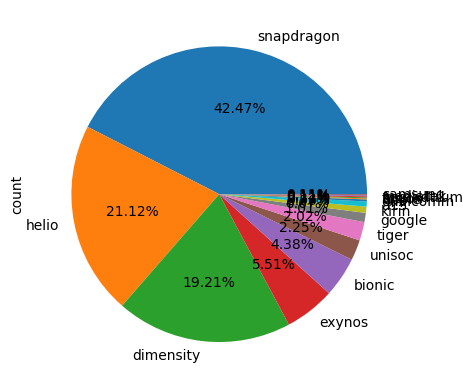

In [649]:
adf['processor_brand'].value_counts().plot(kind = 'pie', autopct = '%.2f%%')

In [650]:
# checking for columns with value 0 in them

variables = adf.select_dtypes(include  = ['int64','int32', 'float64'])
for variable in variables:
    if 0 in adf[variable].unique():
        print(variable,'  0',' = ',adf[variable].unique())

fast_charging_available   0  =  [1 0]
fast_charging   0  =  [100  33  15  40  67  25  62 120  80  18  45  75  10  66  59  31  44   0
 210  30  74 150  43  29  22  68  50  71  20 112  65 180 125  19  60 200
  54  34  93  51  58 240  24   5  11  61  13  26  16  39 103  27  38 104
  36  55  35]
extended_memory_available   0  =  [0 1]
extended_upto   0  =  [   0 1024  870  614  204  358  512  665  307 1075  256 2048  819  128
  409  563  768  921  865  460 1000   51  435  716  972]


In [651]:
adf.head()

,brand_name,model,price,rating,has_5g,has_nfc,has_ir_blaster,processor_brand,num_cores,processor_speed,...,refresh_rate,screen_size,resolution,num_rear_cameras,num_front_cameras,primary_camera_rear,primary_camera_front,extended_memory_available,extended_upto,os
0,oneplus,OnePlus 11 5G,54999,89,True,True,False,snapdragon,8.0,3,...,120,6.70,1440 x 3216,3,1,50.0,16,0,0,Android
1,oneplus,OnePlus Nord CE 2 Lite 5G,19989,81,True,False,False,snapdragon,8.0,2,...,120,6.59,1080 x 2412,3,1,64.0,16,1,1024,Android
2,samsung,Samsung Galaxy A14 5G,16499,75,True,False,False,exynos,8.0,2,...,90,6.60,1080 x 2408,3,1,50.0,13,1,1024,Android
3,motorola,Motorola Moto G62 5G,14999,81,True,False,False,snapdragon,8.0,2,...,120,6.55,1080 x 2400,3,1,50.0,16,1,1024,Android
4,realme,Realme 10 Pro Plus,24999,82,True,False,False,dimensity,8.0,2,...,120,6.70,1080 x 2412,3,1,108.0,16,0,0,Android


In [652]:
adf.info()

<class 'pandas.core.frame.DataFrame'>
Index: 890 entries, 0 to 979
Data columns (total 25 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   brand_name                 890 non-null    object 
 1   model                      890 non-null    object 
 2   price                      890 non-null    int64  
 3   rating                     890 non-null    int32  
 4   has_5g                     890 non-null    bool   
 5   has_nfc                    890 non-null    bool   
 6   has_ir_blaster             890 non-null    bool   
 7   processor_brand            890 non-null    object 
 8   num_cores                  890 non-null    float64
 9   processor_speed            890 non-null    int32  
 10  ram_capacity               890 non-null    int64  
 11  internal_memory            890 non-null    int64  
 12  fast_charging_available    890 non-null    int64  
 13  fast_charging              890 non-null    int32  
 14 

In [653]:
# checking for columns with value 0 in them

variables = adf.select_dtypes(include  = ['int64'])
for variable in variables:
    if (adf[variable].isna()).any():
        print(variable,' = ',adf[variable].unique())
    elif 0 in adf[variable].unique():
        print(variable,'  0',' = ',adf[variable].unique())

fast_charging_available   0  =  [1 0]
extended_memory_available   0  =  [0 1]


In [654]:
adf['rating'].dtypes

dtype('int32')

In [655]:
adf['num_front_cameras'].unique()

array([1, 2])

In [656]:
adf['extended_upto'].unique()

array([   0, 1024,  870,  614,  204,  358,  512,  665,  307, 1075,  256,
       2048,  819,  128,  409,  563,  768,  921,  865,  460, 1000,   51,
        435,  716,  972])

In [657]:
adf['primary_camera_front'].unique()

array([16, 13,  8, 12, 32,  5, 50, 40, 29, 10, 60,  7, 20, 44, 11, 48,  2,
       25, 24])

In [658]:
# converting to boolean 

variables = adf.select_dtypes(include  = ['int64'])
for variable in variables:
    if 0 in adf[variable].unique():
        print(variable,' = ',adf[variable].unique())
        adf[variable] = adf[variable].astype(bool)
        print('name: \n \n \n',variable)
    else:
        print(variable,' = ',adf[variable].unique())

price  =  [ 54999  19989  16499  14999  24999  16999  65999  29999  28999  18999
  24762  16990 114990  62999   9999  45999  32999  14499  39999  35999
  17859  42990  31239  21995 129990  27999  69999  19999  20999  27990
  38999  23790  29990  91999  28499  21999  18499  17478  11936   8950
  12489  42999  13999  14965  74999  10999  84990  10499  17990  35499
  60999  15999  99990   9499  27994  13989  44999 119900  27660   8388
  19990  22999  14290  41999  13489  22990  73999  12499  59999 106990
  15990 119990  23990  12999  58990  43999  49999  36999  51999  31999
   6171  29340  25289  21788  70990  34999  33900  19499  24994  25999
  34990  13466   7999  46999  13490  15499   8499  24990   9589  40999
  19988  11999 142990  30990   5299  25969  94990 129900  41990  17999
  20499  20490  15490  21990   6999   3499  11828  14450  71999  11499
 139990  81999  31994   9299  25900  12188   8999   7499  65499  18990
  26990  13969  53100  21899  75999  16940  20990  64449   8990  13

In [659]:
variables = adf.select_dtypes(include  = ['int32'])
for variable in variables:
    if 0 in adf[variable].unique():
        print(variable,' = ',adf[variable].unique(), '\n')

fast_charging  =  [100  33  15  40  67  25  62 120  80  18  45  75  10  66  59  31  44   0
 210  30  74 150  43  29  22  68  50  71  20 112  65 180 125  19  60 200
  54  34  93  51  58 240  24   5  11  61  13  26  16  39 103  27  38 104
  36  55  35] 

extended_upto  =  [   0 1024  870  614  204  358  512  665  307 1075  256 2048  819  128
  409  563  768  921  865  460 1000   51  435  716  972] 



In [660]:
0.00000000001 == 0

False

In [661]:
# variables = df.select_dtypes(include  = ['float64'])
# for variable in variables:
#     if 0.00000000001 in df[variable].unique():
#         print(variable,' = ',df[variable].unique(), '\n')
#         df.loc[df[variable] == 0.00000000001, variable] = -999
# #         i consider -999 as nan

In [662]:
variables = adf.select_dtypes(include=['float64'])

for variable in variables:
    if adf[variable].std() == 0:
        print(variable)
    else:
        print(variable, ' = ', adf[variable].std(), '\n')
    

num_cores  =  0.6785752368517075 

screen_size  =  0.293283267743115 

primary_camera_rear  =  33.15484063835292 



In [663]:
adf['extended_upto'].unique()

array([   0, 1024,  870,  614,  204,  358,  512,  665,  307, 1075,  256,
       2048,  819,  128,  409,  563,  768,  921,  865,  460, 1000,   51,
        435,  716,  972])

In [664]:
adf.info()

<class 'pandas.core.frame.DataFrame'>
Index: 890 entries, 0 to 979
Data columns (total 25 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   brand_name                 890 non-null    object 
 1   model                      890 non-null    object 
 2   price                      890 non-null    int64  
 3   rating                     890 non-null    int32  
 4   has_5g                     890 non-null    bool   
 5   has_nfc                    890 non-null    bool   
 6   has_ir_blaster             890 non-null    bool   
 7   processor_brand            890 non-null    object 
 8   num_cores                  890 non-null    float64
 9   processor_speed            890 non-null    int32  
 10  ram_capacity               890 non-null    int64  
 11  internal_memory            890 non-null    int64  
 12  fast_charging_available    890 non-null    bool   
 13  fast_charging              890 non-null    int32  
 14 

In [665]:
df.head()

,brand_name,model,price,rating,has_5g,has_nfc,has_ir_blaster,processor_brand,num_cores,processor_speed,...,refresh_rate,screen_size,resolution,num_rear_cameras,num_front_cameras,primary_camera_rear,primary_camera_front,extended_memory_available,extended_upto,os
0,oneplus,OnePlus 11 5G,54999,89.0,True,True,False,snapdragon,8.0,3.2,...,120,6.70,1440 x 3216,3,1.0,50.0,16.0,0,NaN,Android
1,oneplus,OnePlus Nord CE 2 Lite 5G,19989,81.0,True,False,False,snapdragon,8.0,2.2,...,120,6.59,1080 x 2412,3,1.0,64.0,16.0,1,1024.0,Android
2,samsung,Samsung Galaxy A14 5G,16499,75.0,True,False,False,exynos,8.0,2.4,...,90,6.60,1080 x 2408,3,1.0,50.0,13.0,1,1024.0,Android
3,motorola,Motorola Moto G62 5G,14999,81.0,True,False,False,snapdragon,8.0,2.2,...,120,6.55,1080 x 2400,3,1.0,50.0,16.0,1,1024.0,Android
4,realme,Realme 10 Pro Plus,24999,82.0,True,False,False,dimensity,8.0,2.6,...,120,6.70,1080 x 2412,3,1.0,108.0,16.0,0,NaN,Android


In [666]:
adf.info()

<class 'pandas.core.frame.DataFrame'>
Index: 890 entries, 0 to 979
Data columns (total 25 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   brand_name                 890 non-null    object 
 1   model                      890 non-null    object 
 2   price                      890 non-null    int64  
 3   rating                     890 non-null    int32  
 4   has_5g                     890 non-null    bool   
 5   has_nfc                    890 non-null    bool   
 6   has_ir_blaster             890 non-null    bool   
 7   processor_brand            890 non-null    object 
 8   num_cores                  890 non-null    float64
 9   processor_speed            890 non-null    int32  
 10  ram_capacity               890 non-null    int64  
 11  internal_memory            890 non-null    int64  
 12  fast_charging_available    890 non-null    bool   
 13  fast_charging              890 non-null    int32  
 14 

In [667]:
adf['extended_memory_available'].unique()

array([False,  True])

In [668]:
# checking for columns with value 0 in them

variables = adf.select_dtypes(include  = ['int64','float64','int32'])
for variable in variables:
    if (adf[variable].isna()).any():
        print(variable,' = ',adf[variable].unique())
    elif 0 in adf[variable].unique():
        print(variable,'  0',' = ',adf[variable].unique())
#         adf.loc[adf[variable] == 0, variable] = -999
        print(variable,'\n \n After',' = ',adf[variable].unique())

fast_charging   0  =  [100  33  15  40  67  25  62 120  80  18  45  75  10  66  59  31  44   0
 210  30  74 150  43  29  22  68  50  71  20 112  65 180 125  19  60 200
  54  34  93  51  58 240  24   5  11  61  13  26  16  39 103  27  38 104
  36  55  35]
fast_charging 
 
 After  =  [100  33  15  40  67  25  62 120  80  18  45  75  10  66  59  31  44   0
 210  30  74 150  43  29  22  68  50  71  20 112  65 180 125  19  60 200
  54  34  93  51  58 240  24   5  11  61  13  26  16  39 103  27  38 104
  36  55  35]
extended_upto   0  =  [   0 1024  870  614  204  358  512  665  307 1075  256 2048  819  128
  409  563  768  921  865  460 1000   51  435  716  972]
extended_upto 
 
 After  =  [   0 1024  870  614  204  358  512  665  307 1075  256 2048  819  128
  409  563  768  921  865  460 1000   51  435  716  972]


In [669]:
adf['fast_charging'].unique()

array([100,  33,  15,  40,  67,  25,  62, 120,  80,  18,  45,  75,  10,
        66,  59,  31,  44,   0, 210,  30,  74, 150,  43,  29,  22,  68,
        50,  71,  20, 112,  65, 180, 125,  19,  60, 200,  54,  34,  93,
        51,  58, 240,  24,   5,  11,  61,  13,  26,  16,  39, 103,  27,
        38, 104,  36,  55,  35])

In [670]:
variables = df.select_dtypes(include  = ['int64','float64','int32'])
for variable in variables:
    print(variable, ' = ', df[variable].std())

price  =  29176.597906622603
rating  =  7.149248725990353
num_cores  =  0.663896699902488
processor_speed  =  0.4402838362239779
ram_capacity  =  2.5559647596218062
internal_memory  =  103.56873637179677
fast_charging_available  =  0.32801437901922303
fast_charging  =  34.21886316231379
battery_capacity  =  589.8549976779794
refresh_rate  =  27.679724374835583
screen_size  =  0.293283267743115
num_rear_cameras  =  0.7511453655720854
num_front_cameras  =  0.17494314380725606
primary_camera_rear  =  33.15484063835292
primary_camera_front  =  11.01040958741039
extended_memory_available  =  0.4807908787209998
extended_upto  =  352.7523090614172


In [671]:
adf['num_cores'] = adf['num_cores'].astype(int)

In [672]:
adf.info()

<class 'pandas.core.frame.DataFrame'>
Index: 890 entries, 0 to 979
Data columns (total 25 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   brand_name                 890 non-null    object 
 1   model                      890 non-null    object 
 2   price                      890 non-null    int64  
 3   rating                     890 non-null    int32  
 4   has_5g                     890 non-null    bool   
 5   has_nfc                    890 non-null    bool   
 6   has_ir_blaster             890 non-null    bool   
 7   processor_brand            890 non-null    object 
 8   num_cores                  890 non-null    int32  
 9   processor_speed            890 non-null    int32  
 10  ram_capacity               890 non-null    int64  
 11  internal_memory            890 non-null    int64  
 12  fast_charging_available    890 non-null    bool   
 13  fast_charging              890 non-null    int32  
 14 

In [673]:
for i in adf.select_dtypes(include = 'float'):
    print(i)

screen_size
primary_camera_rear


In [674]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import PowerTransformer

# Apply Yeo-Johnson transformation to primary_camera_rear
pt_primary_camera_rear = PowerTransformer(method='yeo-johnson')
primary_camera_rear_transformed = adf[['primary_camera_rear']].copy()
primary_camera_rear_transformed['primary_camera_rear'] += 1e-6  # Add a small constant to avoid zero variance
primary_camera_rear_transformed = pt_primary_camera_rear.fit_transform(primary_camera_rear_transformed)
primary_camera_rear_transformed = pd.DataFrame(primary_camera_rear_transformed, columns=['primary_camera_rear_yj'])

# Apply Yeo-Johnson transformation to screen_size
pt_screen_size = PowerTransformer(method='yeo-johnson')
screen_size_transformed = adf[['screen_size']].copy()
screen_size_transformed['screen_size'] += 1e-6  # Add a small constant to avoid zero variance
screen_size_transformed = pt_screen_size.fit_transform(screen_size_transformed)
screen_size_transformed = pd.DataFrame(screen_size_transformed, columns=['screen_size_yj'])

# Combine the transformed variables with the original dataset
adf_transformed = adf.drop(columns=['primary_camera_rear', 'screen_size'])  # Remove original variables
adf_transformed = pd.concat([adf_transformed, primary_camera_rear_transformed, screen_size_transformed], axis=1)

# Check the data type of the transformed column
print(primary_camera_rear_transformed.dtypes)
print(screen_size_transformed.dtypes)

primary_camera_rear_yj    float64
dtype: object
screen_size_yj    float64
dtype: object


In [675]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import PowerTransformer
from prince import MFA

# Apply Yeo-Johnson transformation to primary_camera_rear
pt_primary_camera_rear = PowerTransformer(method='yeo-johnson')
primary_camera_rear_transformed = adf[['primary_camera_rear']].copy()
primary_camera_rear_transformed['primary_camera_rear'] += 1e-6  # Add a small constant to avoid zero variance
primary_camera_rear_transformed = pt_primary_camera_rear.fit_transform(primary_camera_rear_transformed)

# Apply Yeo-Johnson transformation to screen_size
pt_screen_size = PowerTransformer(method='yeo-johnson')
screen_size_transformed = adf[['screen_size']].copy()
screen_size_transformed['screen_size'] += 1e-6  # Add a small constant to avoid zero variance
screen_size_transformed = pt_screen_size.fit_transform(screen_size_transformed)

# Combine the transformed variables with the original dataset
adf_trans = adf.drop(columns=['primary_camera_rear', 'screen_size'])
adf_trans['primary_camera_rear_transformed'] = primary_camera_rear_transformed
adf_trans['screen_size_transformed'] = screen_size_transformed

# Fit MFA model with transformed variables
# Modify the line below to handle division by zero
epsilon = 1e-6  # small epsilon value to avoid division by zero
mfa = MFA(n_components=2)
mfa.fit(adf_trans, groups=groups)

# Transform the data
principal_coordinates = mfa.transform(adf_trans)
explained_inertia = mfa.explained_inertia_

print("Principal Coordinates:")
print(principal_coordinates.head())

print("\nExplained Inertia:")
print(explained_inertia)

ValueError: Groups have to be provided as a dict when X is not a MultiIndex

In [ ]:

#### WORKING #####

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import PowerTransformer

# Apply Yeo-Johnson transformation to primary_camera_rear
pt_primary_camera_rear = PowerTransformer(method='yeo-johnson')
primary_camera_rear_transformed = adf[['primary_camera_rear']].copy()
primary_camera_rear_transformed['primary_camera_rear'] += 1e-6  # Add a small constant to avoid zero variance
primary_camera_rear_transformed = pt_primary_camera_rear.fit_transform(primary_camera_rear_transformed)
primary_camera_rear_transformed = pd.DataFrame(primary_camera_rear_transformed, columns=['primary_camera_rear_yj'])

# Apply Yeo-Johnson transformation to screen_size
pt_screen_size = PowerTransformer(method='yeo-johnson')
screen_size_transformed = adf[['screen_size']].copy()
screen_size_transformed['screen_size'] += 1e-6  # Add a small constant to avoid zero variance
screen_size_transformed = pt_screen_size.fit_transform(screen_size_transformed)
screen_size_transformed = pd.DataFrame(screen_size_transformed, columns=['screen_size_yj'])

# Combine the transformed variables with the original dataset
adf_transformed = adf.drop(columns=['primary_camera_rear', 'screen_size'])  # Remove original variables
adf_transformed = pd.concat([adf_transformed, primary_camera_rear_transformed, screen_size_transformed], axis=1)

# Selecting data types
categorical_df = adf_transformed.select_dtypes(include=['object'])
continuous_df = adf_transformed.select_dtypes(include=['float64'])  # Corrected line
discrete_df = adf_transformed.select_dtypes(include=['int64'])
boolean_df = adf_transformed.select_dtypes(include=['bool'])


# print(adf.columns)

# adf_transformed = adf_transformed.drop('screen_size','primary_camera_rear')
# print(adf_transformed.columns)
# print(adf_transformed.select_dtypes(include=['float64']).columns)
# adf.info()
# adf_transformed.info()
adf_trans = adf.drop(columns=['primary_camera_rear', 'screen_size'])
adf_trans['primary_camera_rear_transformed'] = primary_camera_rear_transformed
adf_trans['screen_size_transformed'] = screen_size_transformed
adf_trans.info()

print('object', adf_trans.select_dtypes(include=['object']).columns)
print('float64', adf_trans.select_dtypes(include=['float64']).columns)  # Corrected line
print('int64, int32', adf_trans.select_dtypes(include=['int64','int32']).columns)
print('bool', adf_trans.select_dtypes(include=['bool']).columns)

In [ ]:
from prince import MFA
from sklearn.impute import SimpleImputer

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import PowerTransformer

# Apply Yeo-Johnson transformation to primary_camera_rear
pt_primary_camera_rear = PowerTransformer(method='yeo-johnson')
primary_camera_rear_transformed = adf[['primary_camera_rear']].copy()
primary_camera_rear_transformed['primary_camera_rear'] += 1e-6  # Add a small constant to avoid zero variance
primary_camera_rear_transformed = pt_primary_camera_rear.fit_transform(primary_camera_rear_transformed)
# primary_camera_rear_transformed = pd.DataFrame(primary_camera_rear_transformed, columns=['primary_camera_rear_yj'])


# Apply Yeo-Johnson transformation to screen_size
pt_screen_size = PowerTransformer(method='yeo-johnson')
screen_size_transformed = adf[['screen_size']].copy()
screen_size_transformed['screen_size'] += 1e-6  # Add a small constant to avoid zero variance
screen_size_transformed = pt_screen_size.fit_transform(screen_size_transformed)
# screen_size_transformed = pd.DataFrame(screen_size_transformed, columns=['screen_size_yj'])

# Combine the transformed variables with the original dataset
# adf_transformed = adf.drop(columns=['primary_camera_rear', 'screen_size'])  # Remove original variables
# adf_transformed = pd.concat([adf_transformed, primary_camera_rear_transformed, screen_size_transformed], axis=1)
adf_trans = adf.drop(columns=['primary_camera_rear', 'screen_size'])
adf_trans['primary_camera_rear_transformed'] = primary_camera_rear_transformed
adf_trans['screen_size_transformed'] = screen_size_transformed
adf_trans.info()

# Selecting data types
categorical_df = adf_trans.select_dtypes(include=['object'])
continuous_df = adf_trans.select_dtypes(include=['float64'])  # Corrected line
discrete_df = adf_trans.select_dtypes(include=['int64'])
boolean_df = adf_trans.select_dtypes(include=['bool'])

# Grouping variables
groups = {
    'categorical': list(categorical_df.columns),
    'continuous': list(continuous_df.columns),
    'discrete': list(discrete_df.columns),
    'boolean': list(boolean_df.columns)
}

# Fit MFA model with transformed variables
mfa = MFA(n_components=2)
mfa.fit(adf_trans, groups=groups)

# Transform the data
principal_coordinates = mfa.transform(adf_trans)
explained_inertia = mfa.explained_inertia_

print("Principal Coordinates:")
print(principal_coordinates.head())

print("\nExplained Inertia:")
print(explained_inertia)

In [ ]:
from prince import MFA
from sklearn.impute import SimpleImputer

categorical_df = adf.select_dtypes(include=['object'])
# continuous_df = adf.select_dtypes(include=['float64'])
# discrete_df = adf.select_dtypes(include=['int64'])
boolean_df = adf.select_dtypes(include=['bool'])

groups = {
    'categorical': list(categorical_df.columns),
#     'continuous': list(continuous_df.columns),
#     'discrete': list(discrete_df.columns),
    'boolean': list(boolean_df.columns)
}


mfa = MFA(n_components=2)
mfa.fit(adf, groups=groups)

principal_coordinates = mfa.transform(adf)
explained_inertia = mfa.explained_inertia_

print("Principal Coordinates:")
print(principal_coordinates.head())

print("\nExplained Inertia:")
print(explained_inertia)

In [ ]:
import prince
import math

def top(  t):
    return ((.3 / 2) * t) / (.3 * math.sqrt(t))


t = 365/365
top= top(t)
print (top)

In [ ]:
from prince import MFA
from sklearn.impute import SimpleImputer

# Select different data types
categorical_df = adf.select_dtypes(include=['object'])
discrete_df = adf.select_dtypes(include=['int64'])
boolean_df = adf.select_dtypes(include=['bool'])

groups = {
    'categorical': list(categorical_df.columns),
    'discrete': list(discrete_df.columns),
    'boolean': list(boolean_df.columns)
}

# Initialize and fit the MFA model
mfa = MFA(n_components=2)  # Try without normalize parameter
mfa.fit(adf, groups=groups)

# Transform the data
principal_coordinates = mfa.transform(adf)
explained_inertia = mfa.explained_inertia_

# Output the results
print("Principal Coordinates:")
print(principal_coordinates.head())

print("\nExplained Inertia:")
print(explained_inertia)

In [ ]:
for flo in adf.select_dtypes(include = 'float').columns.tolist():
    if 0 in adf[flo].unique():
        print(flo, '\n', adf[flo].unique())
    else:
        print(flo, '\n mean: ',adf[flo].mean())
        print(' std: ',adf[flo].std())
        print(adf[flo].unique())
        adf[flo].value_counts().plot(kind = 'kde',label=flo)
        plt.legend()
        print('skewness', adf[flo].skew())

In [ ]:

for flo in adf.select_dtypes(include='float').columns.tolist():
    # Create a new figure and axis for each plot
    fig, ax = plt.subplots()

    # Plot KDE
    adf[flo].value_counts().plot(kind='kde', ax=ax, label=flo)
    min_value = adf[flo].min()
    max_value = adf[flo].max()
    ax.set_xlim(min_value, max_value)
    print(flo, adf[flo].skew())

    # Customize plot (optional)
    ax.set_title(flo)  # Set plot title to the column name
    ax.set_xlabel(flo)  # Set x-axis label

    plt.legend()
    
    # Display the plot
    plt.show()

    # (Optional) Close the figure to avoid memory issues with many plots
    plt.close(fig)

In [ ]:
# Define the original data
primary_camera_rear = adf['primary_camera_rear']

# Calculate skewness for original data
skewness_original = primary_camera_rear.skew()

# Set up the figure and axis
plt.figure(figsize=(18, 30))

# KDE plot for original data
plt.subplot(3, 5, 1)
sns.kdeplot(primary_camera_rear, color='blue', shade=True)
plt.title(f'Original Data - KDE (Skewness: {skewness_original:.2f})')

# Q-Q plot for original data
plt.subplot(3, 5, 2)
stats.probplot(primary_camera_rear, dist='norm', plot=plt)
plt.title('Original Data - Q-Q Plot')

# Square Root Transformation
primary_camera_rear_sqrt = np.sqrt(primary_camera_rear)

# Calculate skewness for square root transformation
skewness_sqrt = stats.skew(primary_camera_rear_sqrt)

# KDE plot for square root transformation
plt.subplot(3, 5, 3)
sns.kdeplot(primary_camera_rear_sqrt, color='orange', shade=True)
plt.title(f'Square Root Transformation - KDE (Skewness: {skewness_sqrt:.2f})')

# Q-Q plot for square root transformation
plt.subplot(3, 5, 4)
stats.probplot(primary_camera_rear_sqrt, dist='norm', plot=plt)
plt.title('Square Root Transformation - Q-Q Plot')

# Box-Cox Transformation
primary_camera_rear_boxcox, _ = stats.boxcox(primary_camera_rear)

# Calculate skewness for Box-Cox transformation
skewness_boxcox = stats.skew(primary_camera_rear_boxcox)

# KDE plot for Box-Cox transformation
plt.subplot(3, 5, 5)
sns.kdeplot(primary_camera_rear_boxcox, color='green', shade=True)
plt.title(f'Box-Cox Transformation - KDE (Skewness: {skewness_boxcox:.2f})')

# Q-Q plot for Box-Cox transformation
plt.subplot(3, 5, 6)
stats.probplot(primary_camera_rear_boxcox, dist='norm', plot=plt)
plt.title('Box-Cox Transformation - Q-Q Plot')

# Log Transformation
primary_camera_rear_log = np.log(primary_camera_rear)

# Calculate skewness for log transformation
skewness_log = stats.skew(primary_camera_rear_log)

# KDE plot for log transformation
plt.subplot(3, 5, 7)
sns.kdeplot(primary_camera_rear_log, color='red', shade=True)
plt.title(f'Log Transformation - KDE (Skewness: {skewness_log:.2f})')

# Q-Q plot for log transformation
plt.subplot(3, 5, 8)
stats.probplot(primary_camera_rear_log, dist='norm', plot=plt)
plt.title('Log Transformation - Q-Q Plot')

# Exponential Transformation
primary_camera_rear_exp = np.exp(primary_camera_rear)

# Calculate skewness for exponential transformation
skewness_exp = stats.skew(primary_camera_rear_exp)

# KDE plot for exponential transformation
plt.subplot(3, 5, 9)
sns.kdeplot(primary_camera_rear_exp, color='purple', shade=True)
plt.title(f'Exponential Transformation - KDE (Skewness: {skewness_exp:.2f})')

# Q-Q plot for exponential transformation
plt.subplot(3, 5, 10)
stats.probplot(primary_camera_rear_exp, dist='norm', plot=plt)
plt.title('Exponential Transformation - Q-Q Plot')

# Yeo-Johnson Transformation
primary_camera_rear_yeojohnson, _ = stats.yeojohnson(primary_camera_rear)

# Calculate skewness for Yeo-Johnson transformation
skewness_yeojohnson = stats.skew(primary_camera_rear_yeojohnson)

# KDE plot for Yeo-Johnson transformation
plt.subplot(3, 5, 11)
sns.kdeplot(primary_camera_rear_yeojohnson, color='brown', shade=True)
plt.title(f'Yeo-Johnson Transformation - KDE (Skewness: {skewness_yeojohnson:.2f})')

# Q-Q plot for Yeo-Johnson transformation
plt.subplot(3, 5, 12)
stats.probplot(primary_camera_rear_yeojohnson, dist='norm', plot=plt)
plt.title('Yeo-Johnson Transformation - Q-Q Plot')

plt.tight_layout()
plt.show()

In [ ]:
# Define the original data
primary_camera_rear = adf['primary_camera_rear']

# Set up the figure and axis
plt.figure(figsize=(18, 30))

# KDE plot for original data
plt.subplot(3, 5, 1)
sns.kdeplot(primary_camera_rear, color='blue', shade=True)
plt.title(f'Original Data - KDE (Skewness: 1.85)')

# Q-Q plot for original data
plt.subplot(3, 5, 2)
stats.probplot(primary_camera_rear, dist='norm', plot=plt)
plt.title('Original Data - Q-Q Plot')

# Box-Cox Transformation
primary_camera_rear_boxcox, _ = stats.boxcox(primary_camera_rear)

# KDE plot for Box-Cox transformation
plt.subplot(3, 5, 3)
sns.kdeplot(primary_camera_rear_boxcox, color='green', shade=True)
plt.title(f'Box-Cox Transformation - KDE (Skewness: 0.01)')

# Q-Q plot for Box-Cox transformation
plt.subplot(3, 5, 4)
stats.probplot(primary_camera_rear_boxcox, dist='norm', plot=plt)
plt.title('Box-Cox Transformation - Q-Q Plot')

# Yeo-Johnson Transformation
primary_camera_rear_yeojohnson, _ = stats.yeojohnson(primary_camera_rear)

# KDE plot for Yeo-Johnson transformation
plt.subplot(3, 5, 5)
sns.kdeplot(primary_camera_rear_yeojohnson, color='brown', shade=True)
plt.title(f'Yeo-Johnson Transformation - KDE (Skewness: 0.01)')

# Q-Q plot for Yeo-Johnson transformation
plt.subplot(3, 5, 6)
stats.probplot(primary_camera_rear_yeojohnson, dist='norm', plot=plt)
plt.title('Yeo-Johnson Transformation - Q-Q Plot')

plt.tight_layout()
plt.show()

In [ ]:
for col in adf.select_dtypes(include='float'):
    plt.figure(figsize=(14, 4))

    plt.subplot(121)
    sns.histplot(adf[col], kde=True)
    plt.title(col)

    plt.subplot(122)
    stats.probplot(adf[col], plot=plt)
    plt.title(col)

    plt.show()

In [ ]:
from sklearn.preprocessing import RobustScaler
from sklearn.covariance import MinCovDet

# Select numerical columns from the dataframe
numerical_df = adf.select_dtypes(include=['int', 'float'])

# Select boolean columns from the dataframe
boolean_df = adf.select_dtypes(include=['bool'])

# Robust standardization of the numerical variables
scaler = RobustScaler()
scaled_numerical_data = scaler.fit_transform(numerical_df)

# Perform MCD on scaled numerical data
mcd = MinCovDet()
mcd.fit(scaled_numerical_data)

# Get the robust estimates of location and covariance
robust_location = mcd.location_
robust_covariance = mcd.covariance_

# Print robust estimates
print("Robust Location:")
print(robust_location)
print("\nRobust Covariance:")
print(robust_covariance)

In [ ]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.preprocessing import PowerTransformer
import pandas as pd

# Step 1: Standardize numerical variables
scaler = StandardScaler()
scaled_numerical_data = scaler.fit_transform(numerical_df)

# Step 2: Encode categorical variables
encoder = OneHotEncoder(drop='first', sparse_output=False)
encoded_categorical_data = encoder.fit_transform(object_df)

# Combine numerical and encoded categorical data
combined_data = pd.concat([pd.DataFrame(scaled_numerical_data), pd.DataFrame(encoded_categorical_data)], axis=1)

# Step 3: Perform correlation matrix
correlation_matrix = combined_data.corr()

# Step 4: Apply Yeo-Johnson transformation
pt = PowerTransformer(method='yeo-johnson', standardize=False)
transformed_data = pt.fit_transform(combined_data)

# Step 5: Perform PCA on transformed data
pca = PCA()
principal_components = pca.fit_transform(transformed_data)

# Step 6: Interpret PCA results
explained_variance_ratio = pca.explained_variance_ratio_

# Transpose transformed_data.std(axis=0) before division
loadings = pca.components_.T * (transformed_data.std(axis=0).reshape(-1, 1) / pca.explained_variance_)

# Print explained variance ratio for each principal component
print("Explained Variance Ratio:")
for i, evr in enumerate(explained_variance_ratio):
    print(f"PC{i+1}: {evr:.2f}")

# Print the loadings of original variables on each principal component
print("\nLoadings:")
loadings_df = pd.DataFrame(loadings, columns=[f"PC{i+1}" for i in range(principal_components.shape[1])], index=combined_data.columns)
print(loadings_df)





In [ ]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.preprocessing import PowerTransformer
import pandas as pd

# Step 1: Standardize numerical variables
scaler = StandardScaler()
scaled_numerical_data = scaler.fit_transform(numerical_df)

# Step 2: Encode categorical variables
encoder = OneHotEncoder(drop='first', sparse_output=False)
encoded_categorical_data = encoder.fit_transform(object_df)

# Combine numerical and encoded categorical data
combined_data = pd.concat([pd.DataFrame(scaled_numerical_data), pd.DataFrame(encoded_categorical_data)], axis=1)

# Step 3: Perform correlation matrix
correlation_matrix = combined_data.corr()

# Step 4: Apply Yeo-Johnson transformation
pt = PowerTransformer(method='yeo-johnson', standardize=False)
transformed_data = pt.fit_transform(combined_data)

# Step 5: Perform PCA on transformed data
pca = PCA()
principal_components = pca.fit_transform(transformed_data)

# Step 6: Interpret PCA results
explained_variance_ratio = pca.explained_variance_ratio_

# Transpose transformed_data.std(axis=0) before division
loadings = pca.components_.T * (transformed_data.std(axis=0).reshape(-1, 1) / pca.explained_variance_)

# Print explained variance ratio for each principal component
print("Explained Variance Ratio:")
for i, evr in enumerate(explained_variance_ratio):
    print(f"PC{i+1}: {evr:.2f}")

# Print the loadings of original variables on each principal component
print("\nLoadings:")
loadings_df = pd.DataFrame(loadings, columns=[f"PC{i+1}" for i in range(principal_components.shape[1])], index=combined_data.columns)
print(loadings_df)


In [ ]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.preprocessing import PowerTransformer

# Step 1: Standardize numerical variables
scaler = StandardScaler()
scaled_numerical_data = scaler.fit_transform(numerical_df)

# Step 2: Encode categorical variables
encoder = OneHotEncoder(drop='first', sparse_output=False)
encoded_categorical_data = encoder.fit_transform(object_df)

# Combine numerical and encoded categorical data
combined_data = pd.concat([pd.DataFrame(scaled_numerical_data), pd.DataFrame(encoded_categorical_data)], axis=1)

# Step 3: Perform correlation matrix
correlation_matrix = combined_data.corr()

# Step 4: Apply Yeo-Johnson transformation
pt = PowerTransformer(method='yeo-johnson', standardize=False)
transformed_data = pt.fit_transform(combined_data)

# Step 5: Perform PCA on transformed data
pca = PCA()
principal_components = pca.fit_transform(transformed_data)

# Step 6: Interpret PCA results
explained_variance_ratio = pca.explained_variance_ratio_

# Transpose transformed_data.std(axis=0) before division
loadings = pca.components_.T * (transformed_data.std(axis=0).reshape(-1, 1) / pca.explained_variance_)

# Print explained variance ratio for each principal component
# print("Explained Variance Ratio:")
# for i, evr in enumerate(explained_variance_ratio):
#     print(f"PC{i+1}: {evr:.2f}")

# Print the loadings of original variables on each principal component
# print("\nLoadings:")
loadings_df = pd.DataFrame(loadings, columns=[f"PC{i+1}" for i in range(principal_components.shape[1])], index=combined_data.columns)
# print(loadings_df)


import matplotlib.pyplot as plt

# Step 5 (modified): Select principal components with explained variance ratio > 0.01
threshold = 0.01
retained_components = pca.explained_variance_ratio_ > threshold
selected_components = principal_components[:, retained_components]

# Step 6 (modified): Visualize relationships (scatter plot of retained principal components)
plt.figure(figsize=(8, 6))
plt.scatter(selected_components[:, 0], selected_components[:, 1])
plt.xlabel('Retained Principal Component 1')
plt.ylabel('Retained Principal Component 2')
plt.title(f'Scatter Plot of Retained Principal Components (Explained Variance Ratio > {threshold})')
plt.grid(True)
plt.show()


# Compute the correlation coefficient matrix
correlation_matrix = np.corrcoef(selected_components[:, 0], selected_components[:, 1])

# Get the correlation coefficient between the two components
correlation_coefficient = correlation_matrix[0, 1]

print("Correlation coefficient between the two components:", correlation_coefficient)

In [ ]:
import numpy as np

# Compute the correlation coefficient matrix
correlation_matrix = np.corrcoef(selected_components[:, 0], selected_components[:, 1])

# Get the correlation coefficient between the two components
correlation_coefficient = correlation_matrix[0, 1]

print("Correlation coefficient between the two components:", correlation_coefficient)